In [107]:
#All kinds of necessary libraries for data management 
import pandas as pd 
import numpy as np 
import seaborn as sns 
import matplotlib.pyplot as plt 
import datetime as dt
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
import scipy.stats as st
import sqlite3
from time import ctime
from time import time
from datetime import datetime, date 
import pytz #timezone
import statsmodels.api as sm
from statsmodels.formula.api import ols
from mpl_toolkits.mplot3d import Axes3D #for visualizing the results in 3D 
import psycopg2
import requests

***Homework 1***

Create new Jupyter Notebook file and take in use Pandas, Numpy, Matplotlib and Seaborn (similarly to Lesson assignment). 

- Then, read and use 'titanic' data set (use e.g. Seaborn load_dataset to read data to Data Frame) https://seaborn.pydata.org/generated/seaborn.load_dataset.html ##### Clarify and include in Jupyter Notebook:

- How many observations (people) there was in the boat? - Find descriptive statistics (mean, standard deviation, median, ...) for all quantitative data

- Create histogram for fare

- Create bar graph for embark_town

- Use Seaborn countplot (http://seaborn.pydata.org/generated/seaborn.countplot.html ) and create graph containing embark_town and separated by sex

- There is NaN values in the data. How you find these with Pandas? (Hint: Use https://pandas.pydata.org/docs/user_guide/index.html)

- Pandas can be also use to make bar graph. Create at least one bar graph using Pandas (https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.plot.bar.html)

In [3]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt 

#Load dataset titanic
titanic = sns.load_dataset('titanic')
titanic.head()

,survived,pclass,sex,age,sibsp,parch,fare,embarked,class,who,adult_male,deck,embark_town,alive,alone
0,0,3,male,22.0,1,0,7.2500,S,Third,man,True,NaN,Southampton,no,False
1,1,1,female,38.0,1,0,71.2833,C,First,woman,False,C,Cherbourg,yes,False
2,1,3,female,26.0,0,0,7.9250,S,Third,woman,False,NaN,Southampton,yes,True
3,1,1,female,35.0,1,0,53.1000,S,First,woman,False,C,Southampton,yes,False
4,0,3,male,35.0,0,0,8.0500,S,Third,man,True,NaN,Southampton,no,True


In [4]:
print(f"There are {titanic.shape[0]} people in the boat.")

There are 891 people in the boat.


In [5]:
#descriptive statistics for all quantitative data
titanic.describe()

,survived,pclass,age,sibsp,parch,fare
count,891.000000,891.000000,714.000000,891.000000,891.000000,891.000000
mean,0.383838,2.308642,29.699118,0.523008,0.381594,32.204208
std,0.486592,0.836071,14.526497,1.102743,0.806057,49.693429
min,0.000000,1.000000,0.420000,0.000000,0.000000,0.000000
25%,0.000000,2.000000,20.125000,0.000000,0.000000,7.910400
50%,0.000000,3.000000,28.000000,0.000000,0.000000,14.454200
75%,1.000000,3.000000,38.000000,1.000000,0.000000,31.000000
max,1.000000,3.000000,80.000000,8.000000,6.000000,512.329200


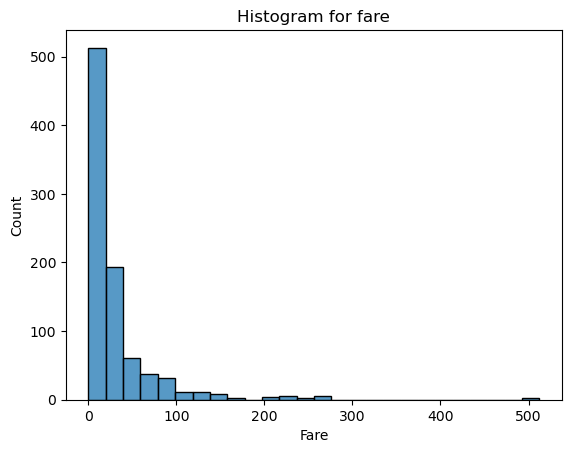

In [6]:
#Create histogram for fare
sns.histplot(data = titanic, x='fare', binwidth = 20)
plt.xlabel('Fare')
plt.ylabel('Count')
plt.title('Histogram for fare')
plt.show()

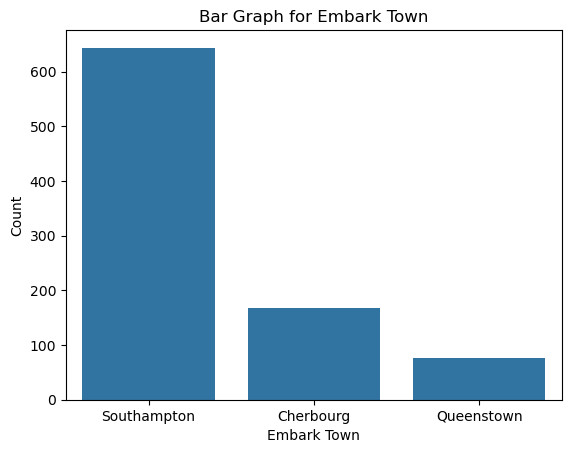

In [7]:
#Create bar graph for embark_town
sns.countplot(data = titanic, x = 'embark_town')
plt.xlabel('Embark Town')
plt.ylabel('Count')
plt.title('Bar Graph for Embark Town')
plt.show()

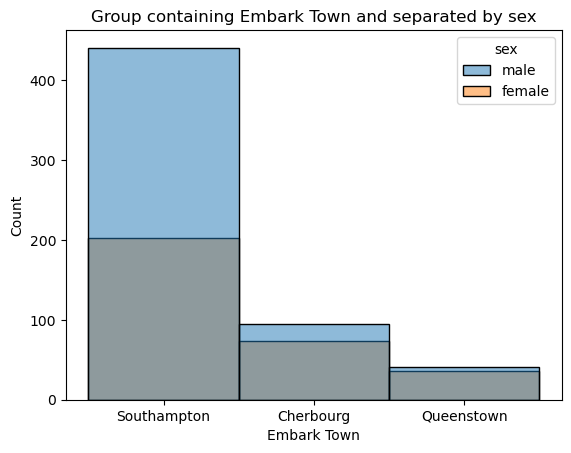

In [8]:
#create graph containing embark_town and separated by sex

sns.histplot(data = titanic, x='embark_town', hue='sex')
plt.xlabel('Embark Town')
plt.ylabel('Count')
plt.title('Group containing Embark Town and separated by sex')
plt.show()

In [9]:
#Find NaN values in the data 
titanic.isna().sum()

survived         0
pclass           0
sex              0
age            177
sibsp            0
parch            0
fare             0
embarked         2
class            0
who              0
adult_male       0
deck           688
embark_town      2
alive            0
alone            0
dtype: int64

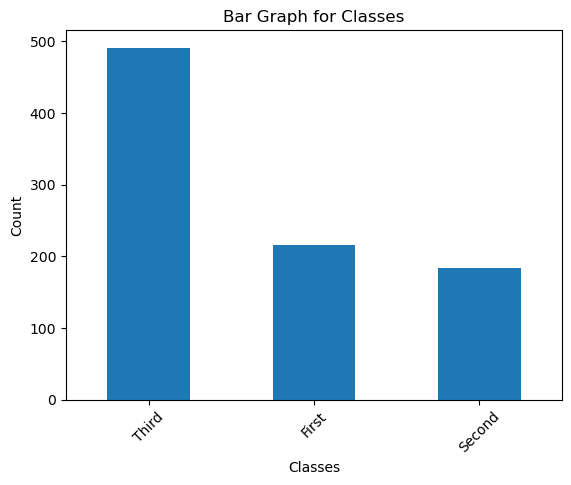

In [10]:
#Create at least one bar graph using Pandas 
titanic['class'].value_counts().plot(kind='bar')
plt.ylabel('Count')
plt.xlabel('Classes')
plt.title('Bar Graph for Classes')
plt.xticks(rotation = 45)
plt.show()

***Homework 2***

***Task 1 (2 p)***
+ Read file 'bgg_db_1806.csv'
+ Use Pandas function to present number of observations and number of variables
+ Present summary statistics
+ Find if there is any NaN values
+ Present histogram for 'min_players' with bin width 1
+ Present histogram for 'max_players' with number of bins 50
+ Present histogram for 'avg_rating' separated by 'min_players' where own bar per 'min_players' (not stacked bars)
+ Make additional histogram for any other variable separated by 'age'

In [12]:
import pandas as pd 
import seaborn as sns 
import matplotlib.pyplot as plt
import numpy as np 

#Read file 'bgg_db_1806.csv'
bgg = pd.read_csv("bgg_db_1806.csv")
bgg.head(2)

,rank,bgg_url,game_id,names,min_players,max_players,avg_time,min_time,max_time,year,avg_rating,geek_rating,num_votes,image_url,age,mechanic,owned,category,designer,weight
0,1,https://boardgamegeek.com/boardgame/174430/glo...,174430,Gloomhaven,1,4,120,60,120,2017,8.98893,8.61858,15376,https://cf.geekdo-images.com/original/img/lDN3...,12,"Action / Movement Programming, Co-operative Pl...",25928,"Adventure, Exploration, Fantasy, Fighting, Min...",Isaac Childres,3.7543
1,2,https://boardgamegeek.com/boardgame/161936/pan...,161936,Pandemic Legacy: Season 1,2,4,60,60,60,2015,8.66140,8.50163,26063,https://cf.geekdo-images.com/original/img/P_Sw...,13,"Action Point Allowance System, Co-operative Pl...",41605,"Environmental, Medical","Rob Daviau, Matt Leacock",2.8210


In [13]:
#Use Pandas function to present number of observations and number of variables
print(f"There are {bgg.shape[0]} of observations and {bgg.shape[1]} of variables.")

There are 4999 of observations and 20 of variables.


In [14]:
#Present summary statistics
bgg.describe()

,rank,game_id,min_players,max_players,avg_time,min_time,max_time,year,avg_rating,geek_rating,num_votes,age,owned,weight
count,4999.000000,4999.000000,4999.000000,4999.000000,4999.000000,4999.000000,4999.000000,4999.000000,4999.000000,4999.000000,4999.000000,4999.000000,4999.000000,4999.000000
mean,2500.000000,89130.612523,2.019404,5.188038,116.193639,83.852971,115.717544,1997.739948,6.969392,6.088576,2013.458292,10.407281,3063.863573,2.343633
std,1443.231328,77203.598778,0.685282,7.801038,513.710907,317.251581,513.768868,143.192968,0.562825,0.483212,4750.834210,3.237645,6482.861008,0.808694
min,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-3000.000000,5.777730,5.640240,62.000000,0.000000,49.000000,0.000000
25%,1250.500000,11169.000000,2.000000,4.000000,30.000000,30.000000,30.000000,2003.000000,6.540560,5.726970,285.000000,8.000000,626.000000,1.735300
50%,2500.000000,71906.000000,2.000000,4.000000,60.000000,45.000000,60.000000,2010.000000,6.907890,5.905240,625.000000,11.000000,1204.000000,2.285700
75%,3749.500000,160456.500000,2.000000,6.000000,120.000000,90.000000,120.000000,2015.000000,7.339040,6.303585,1634.500000,12.000000,2751.500000,2.888900
max,4999.000000,248949.000000,8.000000,200.000000,22500.000000,17280.000000,22500.000000,2018.000000,9.159150,8.618580,77423.000000,42.000000,111807.000000,4.904800


In [15]:
#Find if there is any NaN values
bgg.isna().sum()

rank           0
bgg_url        0
game_id        0
names          0
min_players    0
max_players    0
avg_time       0
min_time       0
max_time       0
year           0
avg_rating     0
geek_rating    0
num_votes      0
image_url      1
age            0
mechanic       0
owned          0
category       0
designer       0
weight         0
dtype: int64

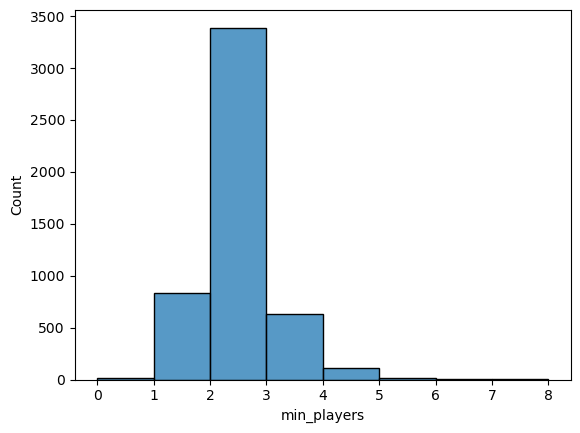

In [16]:
#Present histogram for 'min_players' with bin width 1
sns.histplot(data=bgg, x='min_players',binwidth = 1)
plt.show()

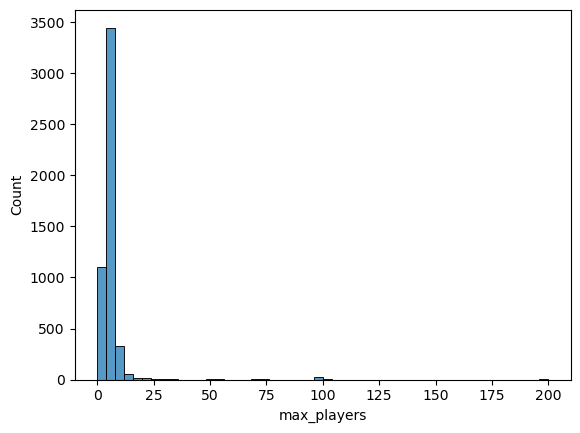

In [17]:
#Present histogram for 'max_players' with number of bins 50

sns.histplot(data=bgg, x="max_players", bins = 50)
plt.show()

<Axes: xlabel='avg_rating', ylabel='Count'>

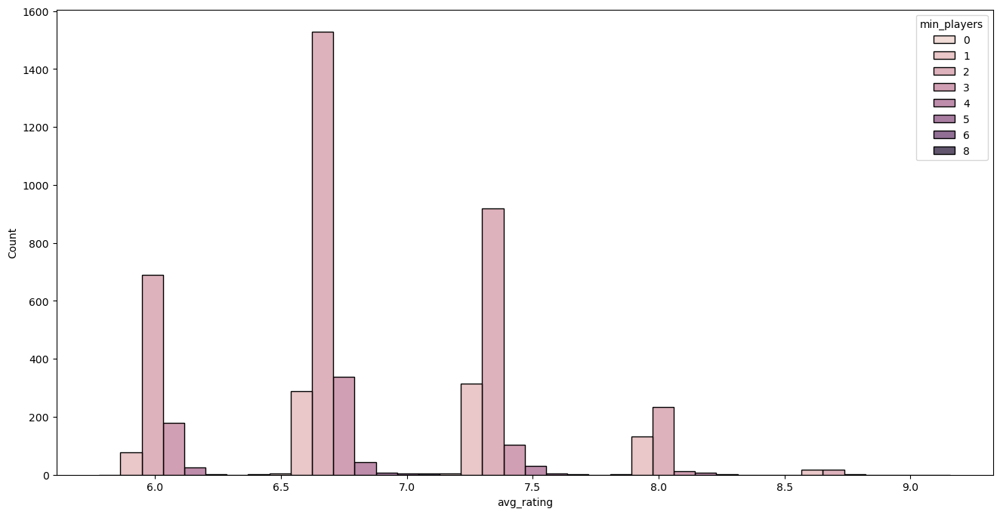

In [18]:
#Present histogram for 'avg_rating' separated by 'min_players' where own bar per 'min_players' (not stacked bars)
plt.figure(figsize=(16,8))
sns.histplot(data=bgg, x='avg_rating', hue = 'min_players', multiple='dodge', bins=5)

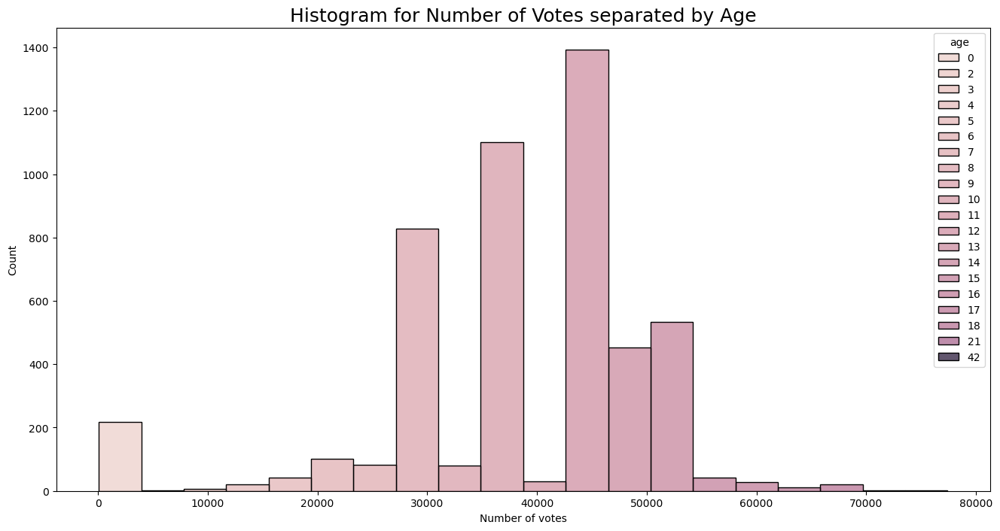

In [19]:
#Make additional histogram for any other variable separated by 'age'

plt.figure(figsize=(16,8))
sns.histplot(data=bgg, x = 'num_votes', hue = 'age', multiple='dodge', bins = 1)
plt.xlabel("Number of votes")
plt.title("Histogram for Number of Votes separated by Age", fontsize= 18)
plt.show()

***Homework 3***

+ Use file Activities2018-2025.csv
+ Read it first in Pandas DataFrame and then complete the tasks
+ show number of rows and columns
+ show key data measures (mean, std, median, ...) for the DataFrame
+ show also info about DataFrame
+ Convert numbers with decimal numbers to have '.' as decimal sign
+ Then remove all the activities where the distance is less than 5 (km)
+ Drop columns containing mostly empty or irrelevant data
+ Keep at least 10 variables that you like to study
+ Create at least 5 different figures using the data
+ Present additionally at least 2 figures where data separate by activity type
+ Note: all these figure shall contain differen quantitative or qualitative data presented
+ Store the cleaned data in Excel data sheet and return it also!

In [21]:
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt 
import seaborn as sns

In [22]:
#Use file Activities2018-2025.csv
#Read it first in Pandas DataFrame and then complete the tasks

activity = pd.read_csv("Activities2018-2025.csv")
activity.head(2)

,Activity Type,Date,Favorite,Title,Distance,Calories,Time,Avg HR,Max HR,Aerobic TE,...,Steps,Min Temp,Decompression,Best Lap Time,Number of Laps,Max Temp,Moving Time,Elapsed Time,Min Elevation,Max Elevation
0,Walking,2025-09-11 18:31:24,False,Rusko Walking,"3,92",244,01:00:06,93,128,"1,4",...,5.574,"23,0",No,01:00:06,1,"27,0",00:57:51,01:00:06,57,71
1,Cycling,2025-09-10 18:49:40,False,Rusko Cycling,"10,60",254,00:42:59,111,142,"2,0",...,--,"20,0",No,00:19:25,2,"28,0",00:34:06,01:12:23,-36,8


In [23]:
#show number of rows and columns
print(f"Number of rows: {activity.shape[0]} and Number of columns: {activity.shape[1]}.")

Number of rows: 1560 and Number of columns: 33.


In [24]:
#show key data measures (mean, std, median, ...) for the DataFrame
activity.describe()

,Activity Type,Date,Favorite,Title,Distance,Calories,Time,Avg HR,Max HR,Aerobic TE,...,Steps,Min Temp,Decompression,Best Lap Time,Number of Laps,Max Temp,Moving Time,Elapsed Time,Min Elevation,Max Elevation
count,1560,1560,1560,1560,1560,1560,1560,1560,1560,1560,...,1560,1560,1560,1560,1560,1560,1560,1560,1560,1560
unique,22,1560,2,220,729,628,1323,86,113,41,...,723,30,1,1047,13,27,1080,1324,386,381
top,Walking,2025-09-11 18:31:24,False,Salibandy,"0,00",172,00:45:36,--,--,"1,1",...,--,"22,0",No,--:--:--,1,"28,0",00:00:00,00:00:00,--,--
freq,385,1,1555,199,258,10,3,65,65,257,...,744,115,1560,372,1052,309,285,4,94,93


In [25]:
#show also info about DataFrame
activity.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1560 entries, 0 to 1559
Data columns (total 33 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   Activity Type           1560 non-null   object
 1   Date                    1560 non-null   object
 2   Favorite                1560 non-null   bool  
 3   Title                   1560 non-null   object
 4   Distance                1560 non-null   object
 5   Calories                1560 non-null   object
 6   Time                    1560 non-null   object
 7   Avg HR                  1560 non-null   object
 8   Max HR                  1560 non-null   object
 9   Aerobic TE              1560 non-null   object
 10  Avg Cadence             1560 non-null   object
 11  Max Cadence             1560 non-null   object
 12  Avg Pace                1560 non-null   object
 13  Best Pace               1560 non-null   object
 14  Total Ascent            1560 non-null   object
 15  Tota

***As the columns contain numbers with ',' as decimal sign, or the format is not numeric for Python, most of data is object type*** 

=> Convert number with decimal numbers to have '.' as decimal sign

=> Convert data in some types to numeric for Python to do the calculation later

In [27]:
#Convert numbers with decimal numbers to have '.' as decimal sign
activity.replace(",", ".")
activity.head()

,Activity Type,Date,Favorite,Title,Distance,Calories,Time,Avg HR,Max HR,Aerobic TE,...,Steps,Min Temp,Decompression,Best Lap Time,Number of Laps,Max Temp,Moving Time,Elapsed Time,Min Elevation,Max Elevation
0,Walking,2025-09-11 18:31:24,False,Rusko Walking,"3,92",244,01:00:06,93,128,"1,4",...,5.574,"23,0",No,01:00:06,1,"27,0",00:57:51,01:00:06,57,71
1,Cycling,2025-09-10 18:49:40,False,Rusko Cycling,"10,60",254,00:42:59,111,142,"2,0",...,--,"20,0",No,00:19:25,2,"28,0",00:34:06,01:12:23,-36,8
2,Other,2025-09-08 15:47:11,False,Salibandy,"0,00",580,01:28:15,117,169,"3,1",...,--,"27,0",No,01:28:15,1,"32,0",00:00:00,01:28:15,-66,-60
3,Walking,2025-09-08 07:25:35,False,Rusko Walking,"3,48",373,00:41:03,133,183,"3,8",...,4.480,"21,0",No,00:41:03,1,"29,0",00:40:20,00:41:03,-40,-21
4,Cycling,2025-09-06 11:45:12,False,Rusko Cycling,"21,08",331,01:07:16,104,141,"2,0",...,--,"25,0",No,00:18:54,3,"30,0",01:04:50,01:28:43,-34,-5


In [28]:
#Convert numbers with decimal numbers to have '.' as decimal sign
activity.columns

Index(['Activity Type', 'Date', 'Favorite', 'Title', 'Distance', 'Calories',
       'Time', 'Avg HR', 'Max HR', 'Aerobic TE', 'Avg Cadence', 'Max Cadence',
       'Avg Pace', 'Best Pace', 'Total Ascent', 'Total Descent',
       'Avg Stride Length', 'Avg Cadence.1', 'Max Cadence.1',
       'Training Stress Score®', 'Total Strokes', 'Avg. Swolf',
       'Avg Stroke Rate', 'Steps', 'Min Temp', 'Decompression',
       'Best Lap Time', 'Number of Laps', 'Max Temp', 'Moving Time',
       'Elapsed Time', 'Min Elevation', 'Max Elevation'],
      dtype='object')

In [29]:
#Choosing the columns with ',' in their data to change to '.' as decimals
cols = ['Distance', 'Calories', 'Avg HR', 'Max HR', 'Aerobic TE', 
        'Avg Cadence', 'Max Cadence','Avg Pace', 'Best Pace', 'Total Ascent',
        'Total Descent','Avg Stride Length', 'Avg Cadence.1', 'Max Cadence.1',
       'Training Stress Score®', 'Total Strokes', 'Avg. Swolf',
       'Avg Stroke Rate', 'Steps', 'Min Temp', 'Decompression', 
        'Number of Laps', 'Max Temp', 'Min Elevation', 'Max Elevation']

#Replace ',' in the data in these columns with '.'
for col in cols: 
    activity[col] = activity[col].apply(lambda x: x.replace(',','.') if isinstance(x, str) else x)
#activity[col]: không có s, vì lướt qua từng cột trong vòng lặp for
#if isinstance(x,str): kiểm tra xem giá trị x có phải là kiểu chuỗi(str) hay không
#nếu x là chuỗi, thay tất cả dấu phẩy bằng dấu chấm
#else x, nếu x không phải chuỗi(vd: số, NaN), giữ nguyên giá trị đó. 

#Convert data types to numeric for above ones 
activity[cols] = activity[cols].apply(pd.to_numeric, errors='coerce')
#activity[cols]: có s, vì lấy hết tất cả các cột ở trên đã được xử lý
activity.head() #xem lại sơ qua các dòng đã được chuyển , . chưa

,Activity Type,Date,Favorite,Title,Distance,Calories,Time,Avg HR,Max HR,Aerobic TE,...,Steps,Min Temp,Decompression,Best Lap Time,Number of Laps,Max Temp,Moving Time,Elapsed Time,Min Elevation,Max Elevation
0,Walking,2025-09-11 18:31:24,False,Rusko Walking,3.92,244.0,01:00:06,93.0,128.0,1.4,...,5.574,23.0,NaN,01:00:06,1.0,27.0,00:57:51,01:00:06,57.0,71.0
1,Cycling,2025-09-10 18:49:40,False,Rusko Cycling,10.60,254.0,00:42:59,111.0,142.0,2.0,...,NaN,20.0,NaN,00:19:25,2.0,28.0,00:34:06,01:12:23,-36.0,8.0
2,Other,2025-09-08 15:47:11,False,Salibandy,0.00,580.0,01:28:15,117.0,169.0,3.1,...,NaN,27.0,NaN,01:28:15,1.0,32.0,00:00:00,01:28:15,-66.0,-60.0
3,Walking,2025-09-08 07:25:35,False,Rusko Walking,3.48,373.0,00:41:03,133.0,183.0,3.8,...,4.480,21.0,NaN,00:41:03,1.0,29.0,00:40:20,00:41:03,-40.0,-21.0
4,Cycling,2025-09-06 11:45:12,False,Rusko Cycling,21.08,331.0,01:07:16,104.0,141.0,2.0,...,NaN,25.0,NaN,00:18:54,3.0,30.0,01:04:50,01:28:43,-34.0,-5.0


In [30]:
#check lại info của các dòng dữ liệu đó 1 lần nữa 
activity.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1560 entries, 0 to 1559
Data columns (total 33 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Activity Type           1560 non-null   object 
 1   Date                    1560 non-null   object 
 2   Favorite                1560 non-null   bool   
 3   Title                   1560 non-null   object 
 4   Distance                1560 non-null   float64
 5   Calories                1556 non-null   float64
 6   Time                    1560 non-null   object 
 7   Avg HR                  1495 non-null   float64
 8   Max HR                  1495 non-null   float64
 9   Aerobic TE              1485 non-null   float64
 10  Avg Cadence             787 non-null    float64
 11  Max Cadence             787 non-null    float64
 12  Avg Pace                557 non-null    float64
 13  Best Pace               543 non-null    float64
 14  Total Ascent            1175 non-null   

In [31]:
#Remove all the activities where the distance is less than 5 (km)
#make new Dataframe based on condition 
#remove 1 loại giá trị nào đó khỏi dataframe = tạo ra 1 dataframe mới không có giá trị đó, chỉ có giá trị ngược lại
activity = activity.loc[activity['Distance'] >= 5]
activity.head()

,Activity Type,Date,Favorite,Title,Distance,Calories,Time,Avg HR,Max HR,Aerobic TE,...,Steps,Min Temp,Decompression,Best Lap Time,Number of Laps,Max Temp,Moving Time,Elapsed Time,Min Elevation,Max Elevation
1,Cycling,2025-09-10 18:49:40,False,Rusko Cycling,10.60,254.0,00:42:59,111.0,142.0,2.0,...,NaN,20.0,NaN,00:19:25,2.0,28.0,00:34:06,01:12:23,-36.0,8.0
4,Cycling,2025-09-06 11:45:12,False,Rusko Cycling,21.08,331.0,01:07:16,104.0,141.0,2.0,...,NaN,25.0,NaN,00:18:54,3.0,30.0,01:04:50,01:28:43,-34.0,-5.0
6,Hiking,2025-08-30 16:51:54,False,Pöytyä Hiking,8.43,470.0,01:56:29,96.0,136.0,1.7,...,10.828,20.0,NaN,"00:09:22,0",2.0,25.0,01:48:42,01:56:29,28.0,49.0
7,Hiking,2025-08-30 13:04:13,False,Pöytyä Hiking,9.96,638.0,02:59:10,90.0,152.0,2.0,...,13.970,22.0,NaN,00:40:59,2.0,28.0,02:37:07,02:59:24,35.0,65.0
11,Cycling,2025-08-13 17:01:37,False,Turku Cycling,24.00,501.0,01:11:58,121.0,143.0,2.7,...,NaN,25.0,NaN,00:22:37,3.0,28.0,01:10:27,01:11:58,15.0,57.0


In [32]:
activity['Date'] = pd.to_datetime(activity['Date'])
activity.info()

<class 'pandas.core.frame.DataFrame'>
Index: 679 entries, 1 to 1554
Data columns (total 33 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   Activity Type           679 non-null    object        
 1   Date                    679 non-null    datetime64[ns]
 2   Favorite                679 non-null    bool          
 3   Title                   679 non-null    object        
 4   Distance                679 non-null    float64       
 5   Calories                677 non-null    float64       
 6   Time                    679 non-null    object        
 7   Avg HR                  637 non-null    float64       
 8   Max HR                  637 non-null    float64       
 9   Aerobic TE              628 non-null    float64       
 10  Avg Cadence             280 non-null    float64       
 11  Max Cadence             280 non-null    float64       
 12  Avg Pace                425 non-null    float64       

In [33]:
#Drop columns containing mostly empty or irrelevant data
#Keep at least 10 variables that you like to study

#check number of unique values
activity.nunique()

Activity Type              13
Date                      679
Favorite                    2
Title                     147
Distance                  424
Calories                  448
Time                      634
Avg HR                     83
Max HR                    100
Aerobic TE                 40
Avg Cadence               107
Max Cadence               100
Avg Pace                  148
Best Pace                 216
Total Ascent              203
Total Descent             198
Avg Stride Length         125
Avg Cadence.1               1
Max Cadence.1               1
Training Stress Score®      1
Total Strokes              45
Avg. Swolf                 24
Avg Stroke Rate            18
Steps                     278
Min Temp                   27
Decompression               0
Best Lap Time             486
Number of Laps             12
Max Temp                   25
Moving Time               608
Elapsed Time              644
Min Elevation             245
Max Elevation             232
dtype: int

In [34]:
#Remove numeric variables having less than 25 unique values 
cols = ['Favorite', 'Avg Cadence.1','Max Cadence.1', 'Training Stress Score®', 'Decompression',
        'Avg Stroke Rate', 'Avg. Swolf', 'Number of Laps']
activity = activity.drop(columns = cols)
activity.info()

<class 'pandas.core.frame.DataFrame'>
Index: 679 entries, 1 to 1554
Data columns (total 25 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   Activity Type      679 non-null    object        
 1   Date               679 non-null    datetime64[ns]
 2   Title              679 non-null    object        
 3   Distance           679 non-null    float64       
 4   Calories           677 non-null    float64       
 5   Time               679 non-null    object        
 6   Avg HR             637 non-null    float64       
 7   Max HR             637 non-null    float64       
 8   Aerobic TE         628 non-null    float64       
 9   Avg Cadence        280 non-null    float64       
 10  Max Cadence        280 non-null    float64       
 11  Avg Pace           425 non-null    float64       
 12  Best Pace          412 non-null    float64       
 13  Total Ascent       605 non-null    float64       
 14  Total Descent 

***Visualize data***
+ Create at least 5 different figures using the data
+ Present additionally at least 2 figures where data separate by activity type
+ Note: all these figure shall contain different quantitative or qualitative data presented

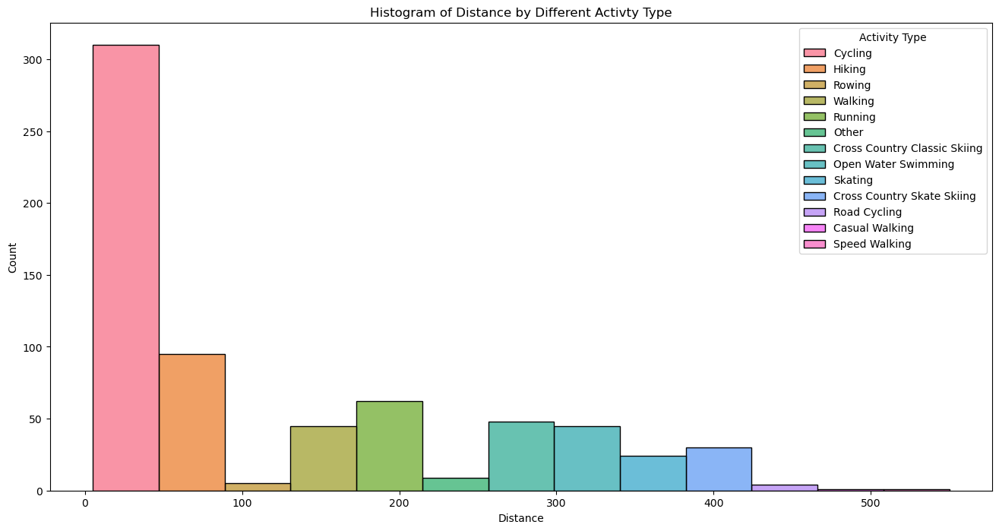

In [36]:
#Histplot of Activity Type and Distance 
plt.figure(figsize=(16,8))
sns.histplot(data=activity, x = 'Distance', hue = 'Activity Type', bins = 1, multiple = 'dodge')
plt.title("Histogram of Distance by Different Activty Type")
plt.xlabel("Distance")
plt.ylabel("Count")
plt.show()

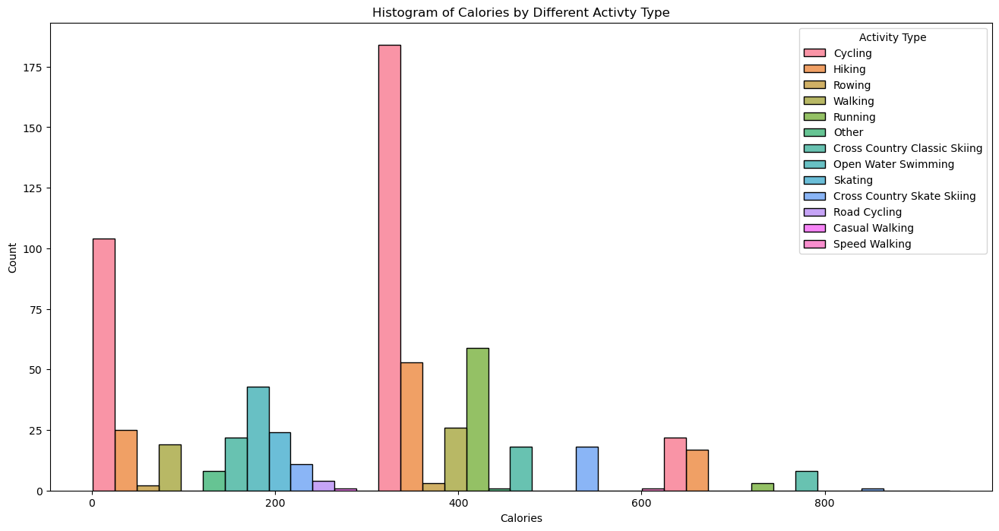

In [37]:
#Histplot of Calories and Activity Type 
plt.figure(figsize=(16,8))
sns.histplot(data=activity, x = 'Calories', hue = 'Activity Type', bins = 3, multiple = 'dodge')
plt.title("Histogram of Calories by Different Activty Type")
plt.xlabel("Calories")
plt.ylabel("Count")
plt.show()

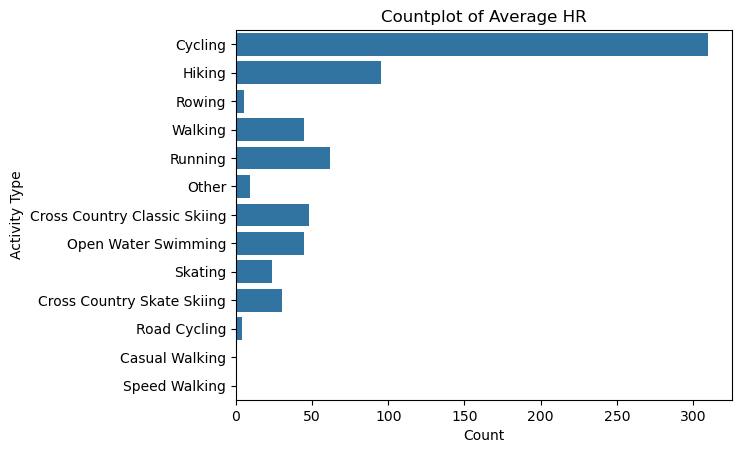

In [38]:
#Countplot of Avg HR
sns.countplot(data=activity, y = "Activity Type")
plt.title("Countplot of Average HR")
plt.ylabel("Activity Type")
plt.xlabel("Count")
plt.show()

<Axes: xlabel='Type', ylabel='Heart Rate'>

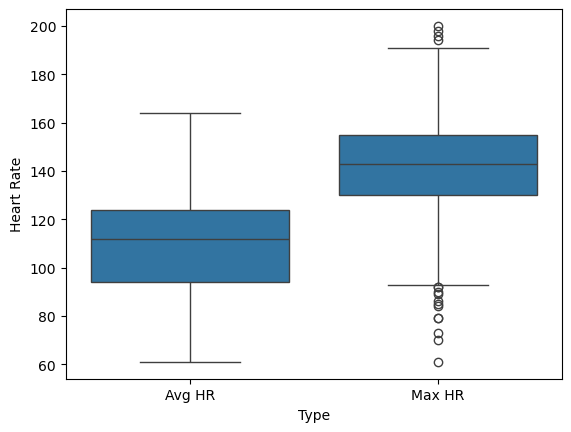

In [39]:
#Boxplot for 'Max HR' and 'Avg HR'
#Dùng boxplot để so sánh phân phối của 2 biến có cùng đơn vị hoặc ý nghĩa tương tự (ở đây là nhịp tim)
#boxplot hiển thị: median, quartiles, outliers, range


df_melt = activity.melt(value_vars=['Avg HR', 'Max HR'], var_name='Type', value_name='Heart Rate')
sns.boxplot(data=df_melt, x='Type', y='Heart Rate')



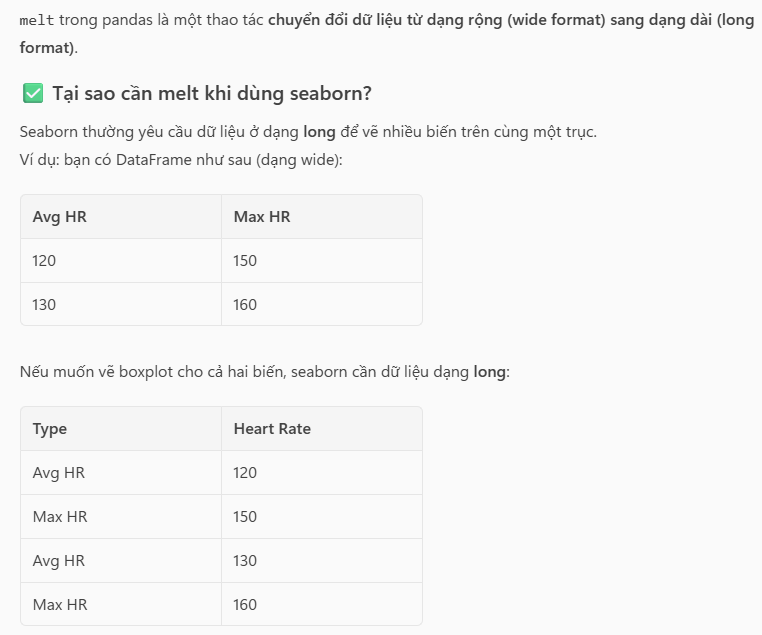

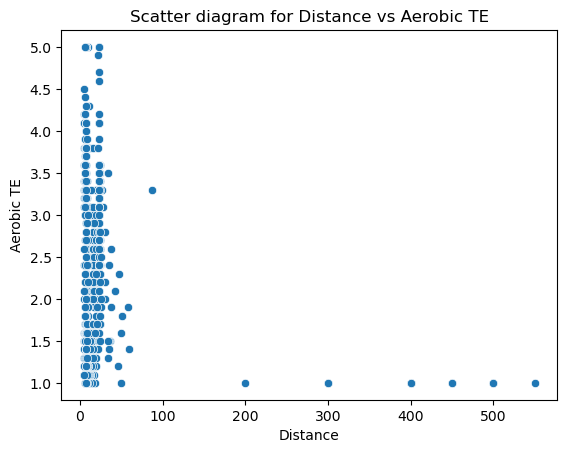

In [41]:
# Present scatter diagram for Distance vs. Aerobic TE
sns.scatterplot(data = activity, x = 'Distance', y = 'Aerobic TE')
plt.title('Scatter diagram for Distance vs Aerobic TE')
plt.show()

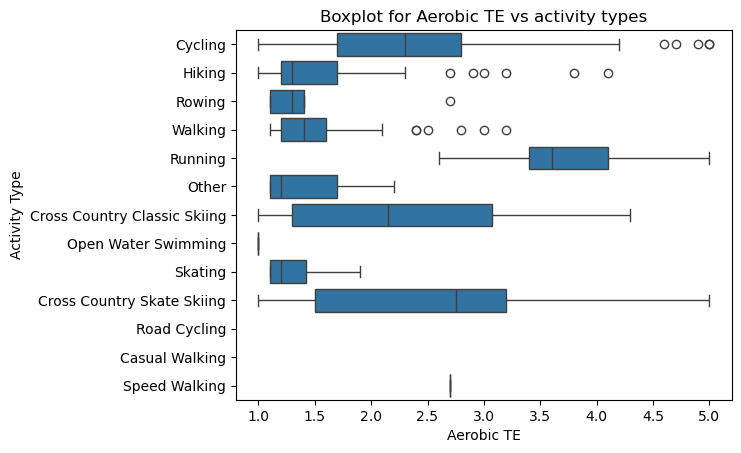

In [42]:
# Present boxplot for Aerobic TE vs activity types
sns.boxplot(data = activity, y = 'Activity Type', x = 'Aerobic TE')
plt.title('Boxplot for Aerobic TE vs activity types')
plt.show()

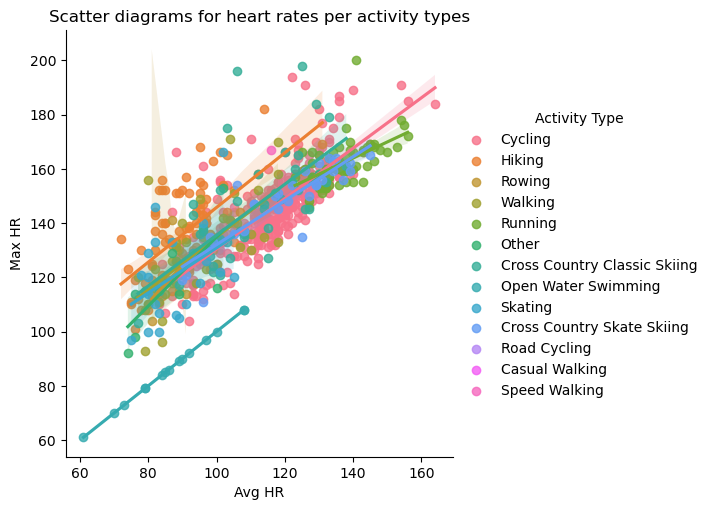

In [43]:
# Present scatter diagrams for Avg HR vs Max HR per activity types
sns.lmplot(data = activity, x = 'Avg HR', y = 'Max HR', hue = 'Activity Type')
plt.title('Scatter diagrams for heart rates per activity types')
plt.show()

In [44]:
#Store the cleaned data in Excel datasheet and return it also! 
#Nhớ nếu đề bài có kêu nộp file excel sau khi store thì nhớ nộp! 

activity.to_excel('Activities_cleaned.xlsx')

In [45]:
#verify format 
activity_excel = pd.read_excel("Activities_cleaned.xlsx")
activity_excel.head()

,Unnamed: 0,Activity Type,Date,Title,Distance,Calories,Time,Avg HR,Max HR,Aerobic TE,...,Avg Stride Length,Total Strokes,Steps,Min Temp,Best Lap Time,Max Temp,Moving Time,Elapsed Time,Min Elevation,Max Elevation
0,1,Cycling,2025-09-10 18:49:40,Rusko Cycling,10.60,254.0,00:42:59,111.0,142.0,2.0,...,NaN,NaN,NaN,20.0,00:19:25,28.0,00:34:06,01:12:23,-36.0,8.0
1,4,Cycling,2025-09-06 11:45:12,Rusko Cycling,21.08,331.0,01:07:16,104.0,141.0,2.0,...,NaN,NaN,NaN,25.0,00:18:54,30.0,01:04:50,01:28:43,-34.0,-5.0
2,6,Hiking,2025-08-30 16:51:54,Pöytyä Hiking,8.43,470.0,01:56:29,96.0,136.0,1.7,...,0.81,NaN,10.828,20.0,"00:09:22,0",25.0,01:48:42,01:56:29,28.0,49.0
3,7,Hiking,2025-08-30 13:04:13,Pöytyä Hiking,9.96,638.0,02:59:10,90.0,152.0,2.0,...,0.82,NaN,13.970,22.0,00:40:59,28.0,02:37:07,02:59:24,35.0,65.0
4,11,Cycling,2025-08-13 17:01:37,Turku Cycling,24.00,501.0,01:11:58,121.0,143.0,2.7,...,NaN,NaN,NaN,25.0,00:22:37,28.0,01:10:27,01:11:58,15.0,57.0


***Homework 4***

***Make Matrices with Shapes***
+ A and B with shape (2,2)
+ C with shape (2,3)
+ D that is the transpose of matrix C 

In [47]:
#Import necessary libraries 
import numpy as np 
import matplotlib.pyplot as plt 
import seaborn as sns 

In [48]:
#Matrices A and B with shape (2,2)
A = np.array([[1,2],
              [3,4]])

#Let's check what was created: 
print("Matrix A\n", A)
print("Shape of A: ", A.shape)
print("   ")

B = np.array([[5,6],
              [7,8]])

#Let's check what was created 
print("Matrix B\n", B)
print("Shape of B: ", B.shape)
print("   ")

#Matrix C with shape (2,3)
C = np.array([[1,2,3],
              [4,5,6]])

#Matrix D is the transpose of C, the shape should be (3,2)
D = C.T

#Let's check what was created 
print("Matrix D\n", D)
print("Shape of D: ", D.shape)

Matrix A
 [[1 2]
 [3 4]]
Shape of A:  (2, 2)
   
Matrix B
 [[5 6]
 [7 8]]
Shape of B:  (2, 2)
   
Matrix D
 [[1 4]
 [2 5]
 [3 6]]
Shape of D:  (3, 2)


In [49]:
#Calculate A & B
A_plus_B = A + B 
print("A + B\n",A_plus_B)

A + B
 [[ 6  8]
 [10 12]]


In [50]:
#Calculate C * D
#n x m matrix can be multiplied with m x n matrix
#for e.g: C is 2 x 3 and D is 3 x 2, so multiplication C * D is ok. 

#There are 2 ways to do this: 

#Way 1
product_1 = np.dot(C,D)

#Way 2
product_2 = C @ D

print("Way 1\n", product_1)
print(" ")
print("Way 2\n", product_2)

Way 1
 [[14 32]
 [32 77]]
 
Way 2
 [[14 32]
 [32 77]]


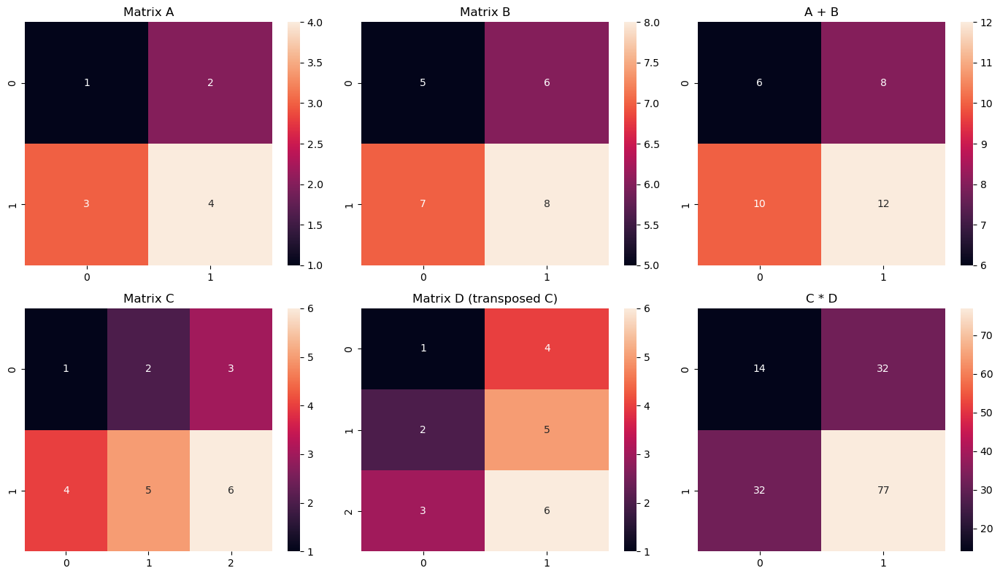

In [51]:
#Try to visualize matrices A, B, C and D 
#And the calculations A + B and C * D using graphs 

#We want to plot 6 figures 
#Let's create a 2-row by 3-column grid for those 6 subplots
#fig is the figure object and axes is a 2D array of Axes objects (shape: (2,3)).

fig, axs = plt.subplots(2,3, figsize=(14,8))

#Let's use a heatmap, annot = TRUE writes the data value in each cell 
#annot = True ghi giá trị của số vào mỗi ô trong heatmap

sns.heatmap(A, annot=True, ax=axs[0,0])
axs[0, 0].set_title("Matrix A")

sns.heatmap(B, annot=True, ax=axs[0,1])
axs[0, 1].set_title("Matrix B")

sns.heatmap(A_plus_B, annot=True, ax=axs[0,2])
axs[0, 2].set_title("A + B")

sns.heatmap(C, annot=True, ax=axs[1,0])
axs[1, 0].set_title("Matrix C")

sns.heatmap(D, annot=True, ax=axs[1, 1])
axs[1, 1].set_title("Matrix D (transposed C)")

sns.heatmap(product_1, annot=True, ax=axs[1, 2])
axs[1, 2].set_title("C * D")

#Makes the layout look nicer 
#tự động điều chỉnh khoảng cách giữa các subplot trong figure để chúng không bị chồng lấn hoặc cắt mất nhãn, tiêu đề hoặc trục
#tight_layout() = làm cho bố cục đẹp hơn, không bị chồng lấn 
plt.tight_layout()

#Display the plot 
plt.show()

***Homework 5***

***Visualization of activities***

In [53]:
import pandas as pd
import numpy as np
import matplotlib as mp
import matplotlib.pyplot as plt
import seaborn as sns

In [54]:
#Read data 
winter_sports = pd.read_csv("Winter_sports.csv")
winter_sports.head()

,Activity Type,Date,Favorite,Title,Distance,Calories,Time,Avg HR,Max HR,Aerobic TE,...,Min Temp,Surface Interval,Decompression,Best Lap Time,Number of Laps,Max Temp,Moving Time,Elapsed Time,Min Elevation,Max Elevation
0,Cross Country Classic Skiing,2023-04-02 10:24:27,False,Rusko Perinteinen hiihto,"6,20",375.0,00:44:01,120,166,"3,4",...,"23,0",0:00,No,44:01.43,1,"25,0",00:38:44,00:44:01,138,159
1,Cross Country Classic Skiing,2023-04-01 13:02:48,False,Rusko Perinteinen hiihto,"1,85",126.0,00:16:36,110,134,"2,0",...,"25,0",0:00,No,16:36.46,1,"27,0",00:14:42,00:16:36,159,170
2,Cross Country Classic Skiing,2023-03-12 14:29:10,False,Rusko Perinteinen hiihto,"8,48",308.0,01:26:02,83,115,"1,2",...,"22,0",0:00,No,04:53.39,2,"24,0",01:23:52,01:26:02,160,173
3,Cross Country Classic Skiing,2023-03-12 10:30:27,False,Rusko Perinteinen hiihto,"11,53",869.0,01:38:53,128,156,"4,3",...,"22,0",0:00,No,32:56.89,2,"29,0",01:33:27,01:38:53,164,179
4,Cross Country Classic Skiing,2023-03-11 13:06:16,False,Rusko Perinteinen hiihto,"12,52",767.0,01:50:23,115,127,"3,0",...,"21,0",0:00,No,39:12.40,2,"25,0",01:48:16,01:50:23,172,185


In [55]:
#Check column names 
winter_sports.columns

Index(['Activity Type', 'Date', 'Favorite', 'Title', 'Distance', 'Calories',
       'Time', 'Avg HR', 'Max HR', 'Aerobic TE', 'Avg Ski Cadence',
       'Max Ski Cadence', 'Avg Speed', 'Max Speed', 'Total Ascent',
       'Total Descent', 'Avg Stride Length', 'Avg Vertical Ratio',
       'Avg Vertical Oscillation', 'Avg Ground Contact Time',
       'Training Stress Score®', 'Avg Power', 'Max Power', 'Grit', 'Flow',
       'Avg. Swolf', 'Avg Stroke Rate', 'Total Reps', 'Dive Time', 'Min Temp',
       'Surface Interval', 'Decompression', 'Best Lap Time', 'Number of Laps',
       'Max Temp', 'Moving Time', 'Elapsed Time', 'Min Elevation',
       'Max Elevation'],
      dtype='object')

***Remove the columns:***
'Favorite', 'Avg Ski Cadence', 'Max Ski Cadence', 'Avg Stride Length', 'Avg Vertical Ratio', 'Avg Vertical Oscillation', 'Avg Ground Contact Time', 'Training Stress Score®', 'Avg Power', 'Max Power', 'Grit', 'Flow', 'Avg. Swolf', 'Avg Stroke Rate', 'Total Reps', 'Dive Time', 'Surface Interval', 'Decompression', 'Best Lap Time', 'Number of Laps', 'Max Temp','Min Temp' 'Moving Time', 'Elapsed Time'

Present after the removal DataFrame head

In [57]:
winter_sports = winter_sports.drop(columns=['Favorite', 'Avg Ski Cadence', 'Max Ski Cadence', 'Avg Stride Length', 'Avg Vertical Ratio', 'Avg Vertical Oscillation', 'Avg Ground Contact Time', 'Training Stress Score®', 'Avg Power', 'Max Power', 'Grit', 'Flow', 'Avg. Swolf', 'Avg Stroke Rate', 'Total Reps', 'Dive Time', 'Surface Interval', 'Decompression', 'Best Lap Time', 'Number of Laps', 'Max Temp','Min Temp','Moving Time', 'Elapsed Time'])
winter_sports.head()

,Activity Type,Date,Title,Distance,Calories,Time,Avg HR,Max HR,Aerobic TE,Avg Speed,Max Speed,Total Ascent,Total Descent,Min Elevation,Max Elevation
0,Cross Country Classic Skiing,2023-04-02 10:24:27,Rusko Perinteinen hiihto,"6,20",375.0,00:44:01,120,166,"3,4","8,4","34,0",71,82,138,159
1,Cross Country Classic Skiing,2023-04-01 13:02:48,Rusko Perinteinen hiihto,"1,85",126.0,00:16:36,110,134,"2,0","6,7","28,9",19,26,159,170
2,Cross Country Classic Skiing,2023-03-12 14:29:10,Rusko Perinteinen hiihto,"8,48",308.0,01:26:02,83,115,"1,2","5,9","11,7",17,22,160,173
3,Cross Country Classic Skiing,2023-03-12 10:30:27,Rusko Perinteinen hiihto,"11,53",869.0,01:38:53,128,156,"4,3","7,0","13,3",17,27,164,179
4,Cross Country Classic Skiing,2023-03-11 13:06:16,Rusko Perinteinen hiihto,"12,52",767.0,01:50:23,115,127,"3,0","6,8","12,9",21,20,172,185


In [58]:
winter_sports.columns

Index(['Activity Type', 'Date', 'Title', 'Distance', 'Calories', 'Time',
       'Avg HR', 'Max HR', 'Aerobic TE', 'Avg Speed', 'Max Speed',
       'Total Ascent', 'Total Descent', 'Min Elevation', 'Max Elevation'],
      dtype='object')

In [59]:
#What Activity Type are included in the data? 
#đếm các giá trị của từng hoạt động => value.counts()
winter_sports['Activity Type'].value_counts()

Activity Type
Cross Country Classic Skiing       60
Cross Country Skate Skiing         50
Skating                            23
Resort Skiing/Snowboarding          1
Backcountry Skiing/Snowboarding     1
Name: count, dtype: int64

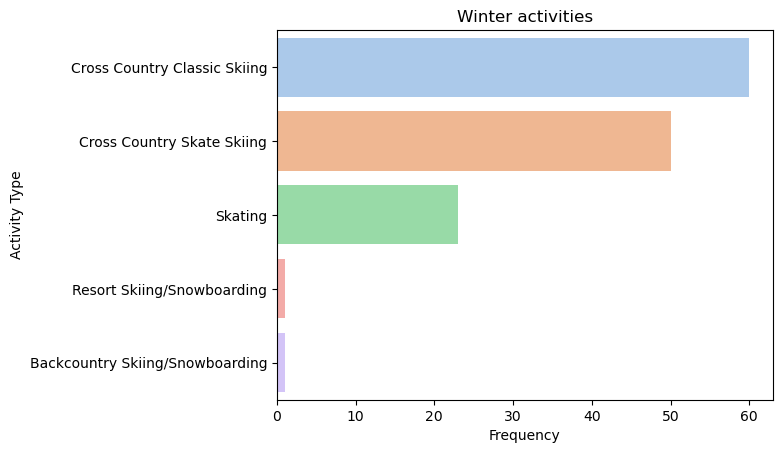

In [60]:
#use bar graph to present this 
sns.countplot(data=winter_sports, y="Activity Type", hue="Activity Type", palette="pastel")
plt.title("Winter activities")
plt.xlabel("Frequency")
plt.show()

In [61]:
#Remove from data of activities that have frequency less than 5
#look at the chart and filter the activities with frequency over 5
#put them in a list of kept_activities
#use loc and .isin to create a new dataframe

kept_activities = ['Cross Country Classic Skiing','Cross Country Skate Skiing','Skating']
winter_sports = winter_sports.loc[winter_sports['Activity Type'].isin(kept_activities)]
winter_sports['Activity Type'].value_counts() #use value_counts() to check again

Activity Type
Cross Country Classic Skiing    60
Cross Country Skate Skiing      50
Skating                         23
Name: count, dtype: int64

In [62]:
#Cách 1: 
#Choosing the columns with ',' in their data to change to '.' as decimals
cols = ['Distance', 'Calories', 'Time',
       'Avg HR', 'Max HR', 'Aerobic TE', 'Avg Speed', 'Max Speed',
       'Total Ascent', 'Total Descent', 'Min Elevation', 'Max Elevation']

#Replace ',' in the data in these columns with '.'
for col in cols: 
    winter_sports[col] = winter_sports[col].apply(lambda x: x.replace(',','.') if isinstance(x, str) else x)
#activity[col]: không có s, vì lướt qua từng cột trong vòng lặp for
#if isinstance(x,str): kiểm tra xem giá trị x có phải là kiểu chuỗi(str) hay không
#nếu x là chuỗi, thay tất cả dấu phẩy bằng dấu chấm
#else x, nếu x không phải chuỗi(vd: số, NaN), giữ nguyên giá trị đó. 

#Convert data types to numeric for above ones 
winter_sports[cols] = winter_sports[cols].apply(pd.to_numeric, errors='coerce')
#activity[cols]: có s, vì lấy hết tất cả các cột ở trên đã được xử lý
winter_sports.head() #xem lại sơ qua các dòng đã được chuyển , . chưa

#Cách 2:
# Alternative 1
winter_sports = winter_sports.apply(lambda col: col.str.replace(',', '.', regex=False) if col.dtype == 'object' else col)
winter_sports.head()

,Activity Type,Date,Title,Distance,Calories,Time,Avg HR,Max HR,Aerobic TE,Avg Speed,Max Speed,Total Ascent,Total Descent,Min Elevation,Max Elevation
0,Cross Country Classic Skiing,2023-04-02 10:24:27,Rusko Perinteinen hiihto,6.20,375.0,NaN,120,166,3.4,8.4,34.0,71.0,82.0,138.0,159.0
1,Cross Country Classic Skiing,2023-04-01 13:02:48,Rusko Perinteinen hiihto,1.85,126.0,NaN,110,134,2.0,6.7,28.9,19.0,26.0,159.0,170.0
2,Cross Country Classic Skiing,2023-03-12 14:29:10,Rusko Perinteinen hiihto,8.48,308.0,NaN,83,115,1.2,5.9,11.7,17.0,22.0,160.0,173.0
3,Cross Country Classic Skiing,2023-03-12 10:30:27,Rusko Perinteinen hiihto,11.53,869.0,NaN,128,156,4.3,7.0,13.3,17.0,27.0,164.0,179.0
4,Cross Country Classic Skiing,2023-03-11 13:06:16,Rusko Perinteinen hiihto,12.52,767.0,NaN,115,127,3.0,6.8,12.9,21.0,20.0,172.0,185.0


***Convert formats***
+ To numeric: 'Distance', 'Calories', 'Avg HR', 'Max HR', 'Aerobic TE', 'Avg Speed', 'Max Speed',
 'Total Ascent', 'Total Descent', 'Min Elevation', 'Max Elevation'

+ To datetime: 'Date' ##### Verify the results after conversion

In [64]:
#Convert to numeric
cols = ['Distance', 'Calories','Avg HR', 'Max HR', 'Aerobic TE', 'Avg Speed', 'Max Speed',
       'Total Ascent', 'Total Descent', 'Min Elevation', 'Max Elevation']
winter_sports[cols] = winter_sports[cols].apply(pd.to_numeric, errors='coerce')
winter_sports["Date"] = pd.to_datetime(winter_sports['Date'])
winter_sports.head()

,Activity Type,Date,Title,Distance,Calories,Time,Avg HR,Max HR,Aerobic TE,Avg Speed,Max Speed,Total Ascent,Total Descent,Min Elevation,Max Elevation
0,Cross Country Classic Skiing,2023-04-02 10:24:27,Rusko Perinteinen hiihto,6.20,375.0,NaN,120,166,3.4,8.4,34.0,71.0,82.0,138.0,159.0
1,Cross Country Classic Skiing,2023-04-01 13:02:48,Rusko Perinteinen hiihto,1.85,126.0,NaN,110,134,2.0,6.7,28.9,19.0,26.0,159.0,170.0
2,Cross Country Classic Skiing,2023-03-12 14:29:10,Rusko Perinteinen hiihto,8.48,308.0,NaN,83,115,1.2,5.9,11.7,17.0,22.0,160.0,173.0
3,Cross Country Classic Skiing,2023-03-12 10:30:27,Rusko Perinteinen hiihto,11.53,869.0,NaN,128,156,4.3,7.0,13.3,17.0,27.0,164.0,179.0
4,Cross Country Classic Skiing,2023-03-11 13:06:16,Rusko Perinteinen hiihto,12.52,767.0,NaN,115,127,3.0,6.8,12.9,21.0,20.0,172.0,185.0


In [65]:
#check lại xem đã được chuyển loại dữ liệu chưa
winter_sports.info()

<class 'pandas.core.frame.DataFrame'>
Index: 133 entries, 0 to 134
Data columns (total 15 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Activity Type  133 non-null    object        
 1   Date           133 non-null    datetime64[ns]
 2   Title          133 non-null    object        
 3   Distance       133 non-null    float64       
 4   Calories       133 non-null    float64       
 5   Time           0 non-null      float64       
 6   Avg HR         133 non-null    int64         
 7   Max HR         133 non-null    int64         
 8   Aerobic TE     99 non-null     float64       
 9   Avg Speed      132 non-null    float64       
 10  Max Speed      132 non-null    float64       
 11  Total Ascent   125 non-null    float64       
 12  Total Descent  128 non-null    float64       
 13  Min Elevation  110 non-null    float64       
 14  Max Elevation  110 non-null    float64       
dtypes: datetime64[ns](1), float6

In [66]:
#check lại xem đã các dữ liệu dạng số đó đã dùng để tính statistics được chưa? 
winter_sports.describe()

,Date,Distance,Calories,Time,Avg HR,Max HR,Aerobic TE,Avg Speed,Max Speed,Total Ascent,Total Descent,Min Elevation,Max Elevation
count,133,133.000000,133.000000,0.0,133.000000,133.000000,99.000000,132.000000,132.000000,125.000000,128.000000,110.000000,110.000000
mean,2019-03-07 11:09:04.503759104,9.252707,349.390301,NaN,107.210526,136.000000,2.144444,9.213636,31.389394,94.784000,99.171875,98.836364,126.218182
min,2012-12-06 13:17:10,0.000000,1.063000,NaN,0.000000,0.000000,1.000000,5.200000,10.300000,1.000000,1.000000,-69.000000,-61.000000
25%,2017-02-26 20:13:01,5.690000,172.000000,NaN,96.000000,127.000000,1.200000,6.800000,20.275000,21.000000,25.000000,33.250000,46.500000
50%,2019-02-20 14:14:04,7.800000,306.000000,NaN,112.000000,145.000000,2.000000,8.100000,28.900000,72.000000,77.000000,74.000000,84.500000
75%,2022-01-02 11:33:03,10.560000,513.000000,NaN,125.000000,158.000000,3.000000,9.675000,32.900000,113.000000,109.250000,142.500000,171.000000
max,2023-04-02 10:24:27,33.820000,962.000000,NaN,153.000000,198.000000,5.000000,85.000000,168.400000,521.000000,594.000000,434.000000,589.000000
std,NaN,5.757087,244.579386,NaN,29.103538,34.961667,1.034726,7.127988,24.514228,100.506988,109.798391,107.934956,125.836896


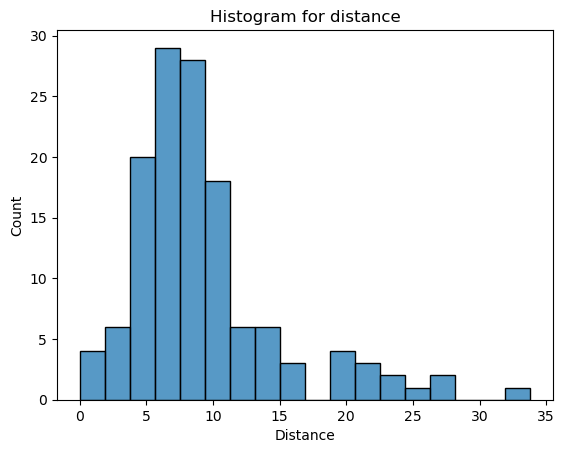

In [67]:
#Make Histogram for Distance 
sns.histplot(data = winter_sports, x = 'Distance')
plt.title('Histogram for distance')
plt.show()

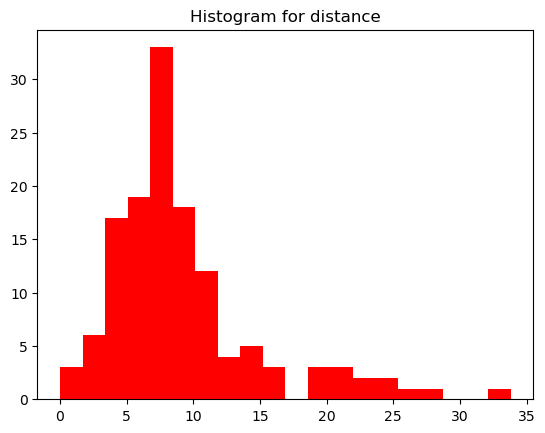

In [68]:
# Alternative 2: With Matplotlib
plt.hist(winter_sports['Distance'], bins = 20, color = 'red')
plt.title('Histogram for distance')
plt.show()

<Axes: xlabel='Type', ylabel='Heart Rate'>

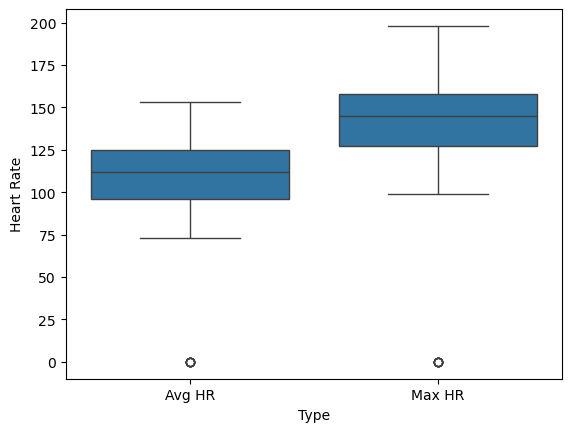

In [69]:
#Make Boxplot that contain both 'Avg HR' and 'Max HR' in same figure
df_melt = winter_sports.melt(value_vars=['Avg HR', 'Max HR'], var_name='Type', value_name='Heart Rate')
sns.boxplot(data=df_melt, x='Type', y='Heart Rate')

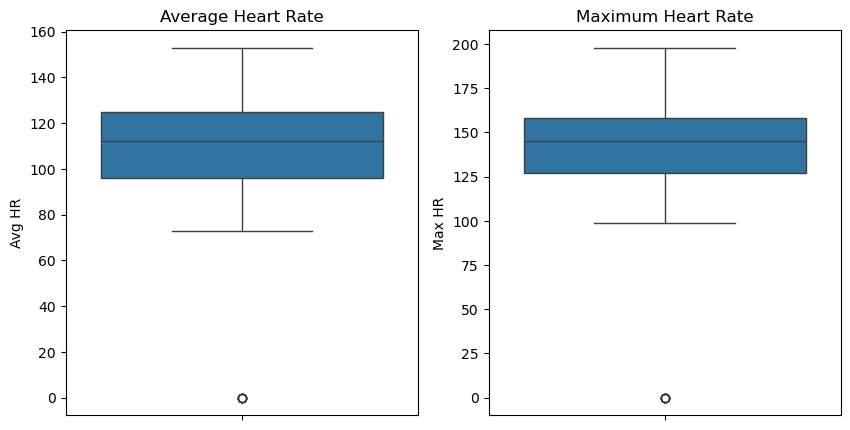

In [70]:
#Cách 2: Create multiple subplots and Seaborn
fig, axes = plt.subplots(1, 2, figsize=(10, 5))  # 1 row, 2 columns

# Boxplot for Avg HR
sns.boxplot(y=winter_sports['Avg HR'], ax=axes[0])
axes[0].set_title('Average Heart Rate')

# Boxplot for Max HR
sns.boxplot(y=winter_sports['Max HR'], ax=axes[1])
axes[1].set_title('Maximum Heart Rate')
plt.show()

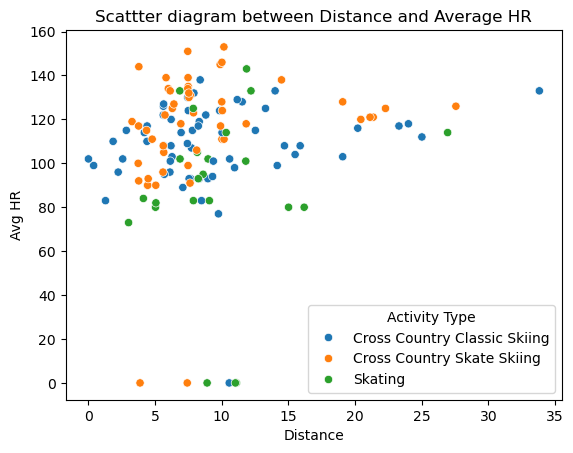

In [71]:
#Make scatter diagram between Distance and Avg HR by "Activity Type"
sns.scatterplot(data = winter_sports, x = 'Distance', y = 'Avg HR', hue = 'Activity Type')
plt.title ('Scattter diagram between Distance and Average HR')
plt.show()

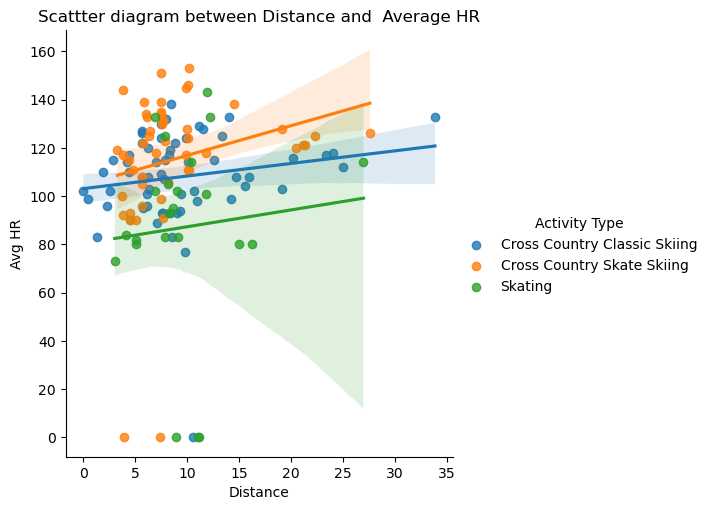

In [72]:
#Scatter diagram between Distance and Average HR
sns.lmplot(data = winter_sports, x = 'Distance', y = 'Avg HR', hue = 'Activity Type') #lmplot: linear model plot
plt.title ('Scattter diagram between Distance and  Average HR')
plt.show()

In [73]:
#Check what kind of data we have in "Title"
#kiểm tra dữ liệu trong Title, dùng value_counts để hiện các value và frequency của từng value
print(winter_sports["Title"].value_counts())

Title
Rusko Perinteinen hiihto                  22
Rusko M.hiihto                            13
Nousiainen Perinteinen hiihto              7
Hiihto pururata                            6
Vuokatti                                   5
Vahdon pururata                            5
Kupittaa luistelu                          4
Luosto M.hiihto                            4
Rusko luisteluhiihto                       3
Pudasjärvi Perinteinen hiihto              3
Sotkamo Cross Country Classic Skiing       3
Kuopio luistelu                            2
Vahto pururata hiihto                      2
Vahto M.hiihto                             2
Vahto luistelu                             2
Vahto jäällä                               2
Rusko Running                              2
Vahto hiihto                               2
Kittilä Perinteinen hiihto                 2
Kittilä luisteluhiihto                     2
hiihto                                     1
Ylläkselle                                 1
Kesä

***Split variable 'Title' to pieces***

The first word in 'Title' to a new variable 'Location'

As the Title with highest number of word is 7 (hiihto pururata (5) ja 3 kertaa kenttä), split the data to 'Location' and 6 other variables

In [75]:
#tạo ra 6 cột mới và đưa dữ liệu vào bằng cách split từ cột Title, split từ khoảng trống ' ' 
#vì có 1 title dài nhất với 7 từ nên split thành 1 cột location và 6 cột khác 
winter_sports[["Location", "D1", "D2", "D3", "D4", "D5", "D6"]] = winter_sports["Title"].str.split(' ', expand=True)
#ở đây không có n=1 nên sẽ tách nhiều lần, còn nếu có n = 1,2,3, ... thì sẽ tách theo số lần tương ứng từ trái sang phải 
#cần phải có expand = True mới có thể gán cho nhiều cột, còn không chỉ thành 1 list có các từ tách nhau bởi khoảng trống
winter_sports.columns

Index(['Activity Type', 'Date', 'Title', 'Distance', 'Calories', 'Time',
       'Avg HR', 'Max HR', 'Aerobic TE', 'Avg Speed', 'Max Speed',
       'Total Ascent', 'Total Descent', 'Min Elevation', 'Max Elevation',
       'Location', 'D1', 'D2', 'D3', 'D4', 'D5', 'D6'],
      dtype='object')

In [76]:
winter_sports.head()

,Activity Type,Date,Title,Distance,Calories,Time,Avg HR,Max HR,Aerobic TE,Avg Speed,...,Total Descent,Min Elevation,Max Elevation,Location,D1,D2,D3,D4,D5,D6
0,Cross Country Classic Skiing,2023-04-02 10:24:27,Rusko Perinteinen hiihto,6.20,375.0,NaN,120,166,3.4,8.4,...,82.0,138.0,159.0,Rusko,Perinteinen,hiihto,None,None,None,None
1,Cross Country Classic Skiing,2023-04-01 13:02:48,Rusko Perinteinen hiihto,1.85,126.0,NaN,110,134,2.0,6.7,...,26.0,159.0,170.0,Rusko,Perinteinen,hiihto,None,None,None,None
2,Cross Country Classic Skiing,2023-03-12 14:29:10,Rusko Perinteinen hiihto,8.48,308.0,NaN,83,115,1.2,5.9,...,22.0,160.0,173.0,Rusko,Perinteinen,hiihto,None,None,None,None
3,Cross Country Classic Skiing,2023-03-12 10:30:27,Rusko Perinteinen hiihto,11.53,869.0,NaN,128,156,4.3,7.0,...,27.0,164.0,179.0,Rusko,Perinteinen,hiihto,None,None,None,None
4,Cross Country Classic Skiing,2023-03-11 13:06:16,Rusko Perinteinen hiihto,12.52,767.0,NaN,115,127,3.0,6.8,...,20.0,172.0,185.0,Rusko,Perinteinen,hiihto,None,None,None,None


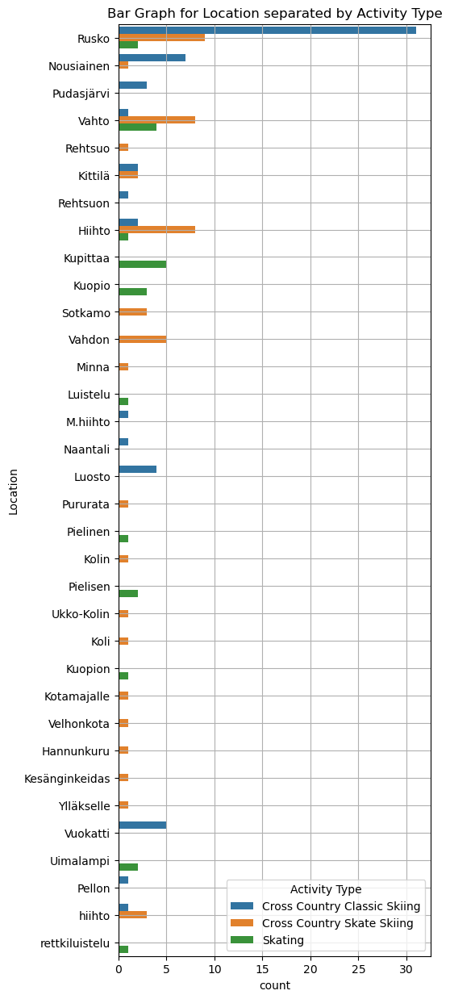

In [77]:
#make bar graph for 'Location' separated by 'Activity Type'
plt.subplots(figsize=(5,15))
sns.countplot(data=winter_sports, y='Location', hue = 'Activity Type')
plt.title('Bar Graph for Location separated by Activity Type')
plt.grid()
plt.show()

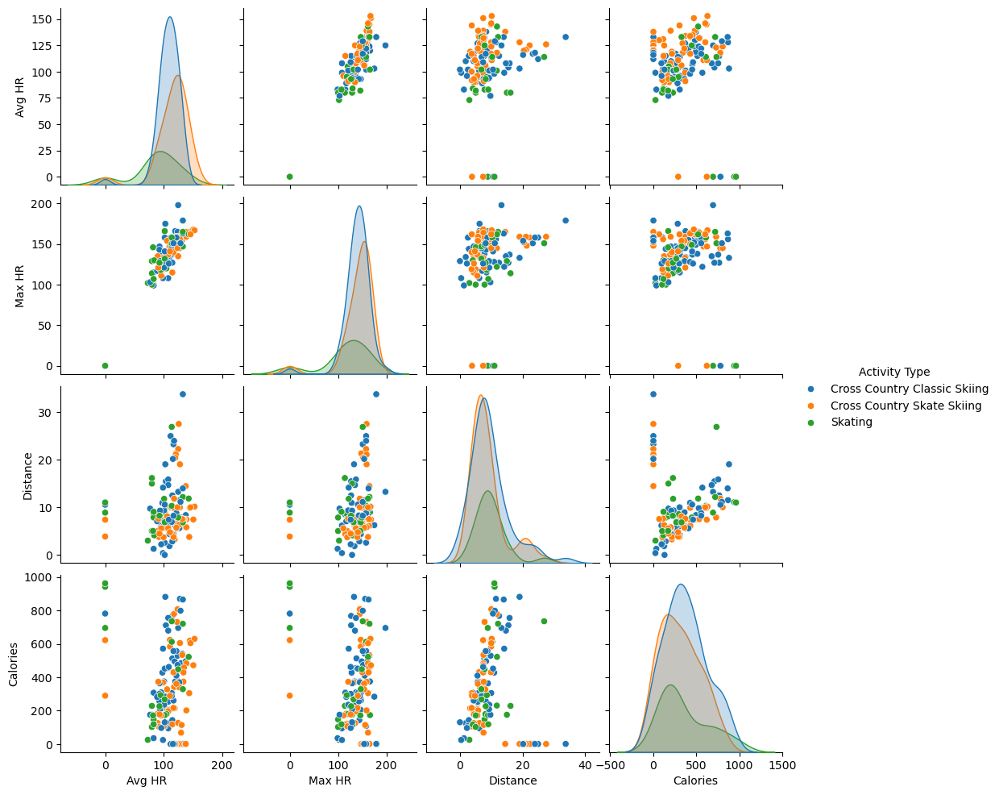

In [78]:
#Use Pairplot and select 4 variables and show results based on 'Activity Type'

cols = ['Avg HR', 'Max HR', 'Distance', 'Calories']
sns.pairplot(data = winter_sports, vars = cols, hue = 'Activity Type' )
plt.show()

***Homework 6***

In [80]:
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt 
import seaborn as sns 

hike = pd.read_csv("Hike.csv")
hike.head(20)

,Activity Type,Date,Favorite,Title,Distance,Calories,Time,Avg HR,Max HR,Aerobic TE,...,Min Temp,Surface Interval,Decompression,Best Lap Time,Number of Laps,Max Temp,Moving Time,Elapsed Time,Min Elevation,Max Elevation
0,Hiking,2023-08-26 17:33:07,False,Pöytyä Savonranta lenkki auto n 10 km lopussa ...,"10,00",566,02:15:19,91,157,"1,8",...,"22,0",0:00,No,00:07.27,3,"29,0",02:15:19,03:49:46,-91,-72
1,Hiking,2023-08-02 12:48:21,False,Nousiainen Patikointi,"9,11",721,03:29:01,85,140,"1,5",...,"21,0",0:00,No,24:47.69,2,"26,0",02:55:51,03:55:14,32,57
2,Hiking,2023-07-21 13:04:05,False,Nousiainen Patikointi,"2,41",340,02:29:57,72,97,"1,1",...,"25,0",0:00,No,02:29:57.11,1,"30,0",00:45:25,02:29:57,55,65
3,Hiking,2023-07-19 09:15:28,False,Rautalampi Patikointi,"7,29",723,02:55:42,95,155,"1,6",...,"25,0",0:00,No,02:55:42.17,1,"27,0",02:23:33,03:20:35,137,212
4,Hiking,2023-07-18 14:31:07,False,Rautalampi Patikointi,"12,34",1.406,05:43:28,98,136,"2,0",...,"21,0",0:00,No,02:28:25.02,2,"31,0",04:02:15,05:43:28,142,221
5,Hiking,2023-07-18 07:29:49,False,Kouvola Patikointi,"1,85",147,00:40:04,85,118,"1,4",...,"24,0",0:00,No,40:03.88,1,"26,0",00:28:48,00:40:04,101,119
6,Hiking,2023-04-07 10:22:58,False,Pöytyä Patikointi,"6,84",486,02:16:53,84,121,"1,2",...,"23,0",0:00,No,02:16:52.51,1,"28,0",01:56:30,02:33:24,177,191
7,Hiking,2023-02-28 22:03:21,False,Kaarina Patikointi,"0,54",28,"00:06:42,3",83,133,"1,1",...,"15,0",0:00,No,06:42.32,1,"28,0",00:05:12,"00:07:20,3",-149,45
8,Hiking,2022-10-20 12:19:07,False,Kaarina Patikointi,"3,50",317,01:39:35,81,119,"1,1",...,"20,0",0:00,No,01:39:34.100,1,"27,0",01:10:45,01:51:56,-5,56
9,Hiking,2022-09-11 16:11:35,False,Nousiainen frisbeegolf,"5,06",507,02:21:22,90,134,"1,6",...,"23,0",0:00,No,02:21:22.19,1,"27,0",01:37:33,02:29:08,128,152


In [81]:
# Check, which columns have a lot of missing values or zeros
print("Missing values\n",hike.isna().sum())

# Count missing (NaN) values per column
# Count zeros per column (only numeric columns)
# ở bước này thầy đã fillna(0), nên missing values (NaN) = 0
# nếu trong dataset chưa được chuyển thì phải fillna trước bằng 0 cho các cột giá trị số 
# sau đó lọc ra xem có bn values trong các cột có số 0 (df == 0).sum()
zeros = (hike == 0).sum()
print("Zero\n", zeros)

Missing values
 Activity Type               0
Date                        0
Favorite                    0
Title                       0
Distance                    0
Calories                    0
Time                        0
Avg HR                      0
Max HR                      0
Aerobic TE                  0
Avg Cadence                 0
Max Cadence                 0
Avg Pace                    0
Best Pace                   0
Ascent                      0
Total Descent               0
Avg Stride Length           0
Avg Vertical Ratio          0
Avg Vertical Oscillation    0
Avg Ground Contact Time     0
Training Stress Score®      0
Avg Power                   0
Max Power                   0
Grit                        0
Flow                        0
Avg. Swolf                  0
Avg Stroke Rate             0
Total Reps                  0
Dive Time                   0
Min Temp                    0
Surface Interval            0
Decompression               0
Best Lap Time           

In [82]:
#1. Clean data such a way, that you first remove all the variables (columns) where majority of data is not available or the value is 0.
#nhìn lên list trên và chọn ra các hàng thỏa điều kiện (không có missing values và zeros) để giữ lại

#It looks like there are no columns with totally missing values, but a few columns with a lot of zero values 
cols = ['Favorite', 'Avg Ground Contact Time', 'Avg Power', 'Max Power', 'Avg. Swolf', 'Avg Stroke Rate']
hike = hike.drop(columns = cols)
hike.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 197 entries, 0 to 196
Data columns (total 33 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Activity Type             197 non-null    object
 1   Date                      197 non-null    object
 2   Title                     197 non-null    object
 3   Distance                  197 non-null    object
 4   Calories                  197 non-null    object
 5   Time                      197 non-null    object
 6   Avg HR                    197 non-null    int64 
 7   Max HR                    197 non-null    int64 
 8   Aerobic TE                197 non-null    object
 9   Avg Cadence               197 non-null    object
 10  Max Cadence               197 non-null    object
 11  Avg Pace                  197 non-null    object
 12  Best Pace                 197 non-null    object
 13  Ascent                    197 non-null    object
 14  Total Descent             

In [83]:
# Remove all data for activities where the value of Avg HR is ‘--’ or 0. 
#Note: you can change all values ‘--’ to 0, and the remove all activities where the value is 0.

#Bước 1: thay '--' bằng 0, chuyển về 1 loại và xóa chung sẽ dễ hơn để từng loại mới xóa
hike['Avg HR'] = hike['Avg HR'].replace('--', 0)

#Bước 2: chuyển cột sang kiểu số(nếu chưa) 
hike['Avg HR'] = pd.to_numeric(hike['Avg HR'], errors = 'coerce')

#Bước 3: xóa tất cả các hàng có Avg HR = 0
hike = hike.loc[hike['Avg HR'] != 0]

#Kiểm tra kết quả 
hike.head()

,Activity Type,Date,Title,Distance,Calories,Time,Avg HR,Max HR,Aerobic TE,Avg Cadence,...,Min Temp,Surface Interval,Decompression,Best Lap Time,Number of Laps,Max Temp,Moving Time,Elapsed Time,Min Elevation,Max Elevation
0,Hiking,2023-08-26 17:33:07,Pöytyä Savonranta lenkki auto n 10 km lopussa ...,"10,00",566,02:15:19,91,157,"1,8",84,...,"22,0",0:00,No,00:07.27,3,"29,0",02:15:19,03:49:46,-91,-72
1,Hiking,2023-08-02 12:48:21,Nousiainen Patikointi,"9,11",721,03:29:01,85,140,"1,5",58,...,"21,0",0:00,No,24:47.69,2,"26,0",02:55:51,03:55:14,32,57
2,Hiking,2023-07-21 13:04:05,Nousiainen Patikointi,"2,41",340,02:29:57,72,97,"1,1",22,...,"25,0",0:00,No,02:29:57.11,1,"30,0",00:45:25,02:29:57,55,65
3,Hiking,2023-07-19 09:15:28,Rautalampi Patikointi,"7,29",723,02:55:42,95,155,"1,6",37,...,"25,0",0:00,No,02:55:42.17,1,"27,0",02:23:33,03:20:35,137,212
4,Hiking,2023-07-18 14:31:07,Rautalampi Patikointi,"12,34",1.406,05:43:28,98,136,"2,0",35,...,"21,0",0:00,No,02:28:25.02,2,"31,0",04:02:15,05:43:28,142,221


In [84]:
# Then if there is still variables (columns) with value ‘--’, fill them with 0
# Look like there were -- in a few columns
hike = hike.replace('--', 0) # thay thế tất cả giá trị '--' của df hike bằng 0
dash = (hike == '--').sum() #tính tổng lại 1 lần nữa xem còn sót lại không
print(dash)

Activity Type               0
Date                        0
Title                       0
Distance                    0
Calories                    0
Time                        0
Avg HR                      0
Max HR                      0
Aerobic TE                  0
Avg Cadence                 0
Max Cadence                 0
Avg Pace                    0
Best Pace                   0
Ascent                      0
Total Descent               0
Avg Stride Length           0
Avg Vertical Ratio          0
Avg Vertical Oscillation    0
Training Stress Score®      0
Grit                        0
Flow                        0
Total Reps                  0
Dive Time                   0
Min Temp                    0
Surface Interval            0
Decompression               0
Best Lap Time               0
Number of Laps              0
Max Temp                    0
Moving Time                 0
Elapsed Time                0
Min Elevation               0
Max Elevation               0
dtype: int

In [85]:
#Split data in field Title that you are able to see the location (mostly mentioned first in Title). 
#What is the most often mention location?

#Let's take the first word from Title to a separate column named Location 
hike[['Location', 'Title']] = hike['Title'].str.split(' ', n=1, expand = True) 
#n=1: chỉ tách 1 lần từ trái sang phải, kết quả sẽ có tối đa 2 phần
#expand = True, trả về DataFrame 2 cột (thay vì list) để có thể gán trực tiếp vào các cột
hike.head()

,Activity Type,Date,Title,Distance,Calories,Time,Avg HR,Max HR,Aerobic TE,Avg Cadence,...,Surface Interval,Decompression,Best Lap Time,Number of Laps,Max Temp,Moving Time,Elapsed Time,Min Elevation,Max Elevation,Location
0,Hiking,2023-08-26 17:33:07,Savonranta lenkki auto n 10 km lopussa aika ja...,"10,00",566,02:15:19,91,157,"1,8",84,...,0:00,No,00:07.27,3,"29,0",02:15:19,03:49:46,-91,-72,Pöytyä
1,Hiking,2023-08-02 12:48:21,Patikointi,"9,11",721,03:29:01,85,140,"1,5",58,...,0:00,No,24:47.69,2,"26,0",02:55:51,03:55:14,32,57,Nousiainen
2,Hiking,2023-07-21 13:04:05,Patikointi,"2,41",340,02:29:57,72,97,"1,1",22,...,0:00,No,02:29:57.11,1,"30,0",00:45:25,02:29:57,55,65,Nousiainen
3,Hiking,2023-07-19 09:15:28,Patikointi,"7,29",723,02:55:42,95,155,"1,6",37,...,0:00,No,02:55:42.17,1,"27,0",02:23:33,03:20:35,137,212,Rautalampi
4,Hiking,2023-07-18 14:31:07,Patikointi,"12,34",1.406,05:43:28,98,136,"2,0",35,...,0:00,No,02:28:25.02,2,"31,0",04:02:15,05:43:28,142,221,Rautalampi


In [86]:
#Most often used location 
print(hike['Location'].mode()[0]) 
#tìm giá trị có frequency cao nhất thì dùng hàm mode và lấy giá trị đầu tiên tìm được [0]

Rusko


In [87]:
#Use variable Time and calculate duration of activity in hours: Make new variable Duration.
hike['Duration'] = pd.to_timedelta(hike['Time'])
hike['Duration'] = hike['Duration'].dt.total_seconds() / 3600 #(dt.total_seconds()/3600) dùng để đổi ra giờ
hike.head()

#.dt ở đây không phải là datetime mà là datetime-like accessor trong pandas
#cho phép bạn truy cập các thuộc tính của đối tượng thời gian (datetime, timedelta, Period)

#dt.days - số ngày 
#dt.seconds - số giây trong phần ngày 
#dt.total_seconds() - tổng số giây (bao gồm cả ngày)
#dt.total_seconds()/3600 : chuyển đổi từ giây sang giờ

,Activity Type,Date,Title,Distance,Calories,Time,Avg HR,Max HR,Aerobic TE,Avg Cadence,...,Decompression,Best Lap Time,Number of Laps,Max Temp,Moving Time,Elapsed Time,Min Elevation,Max Elevation,Location,Duration
0,Hiking,2023-08-26 17:33:07,Savonranta lenkki auto n 10 km lopussa aika ja...,"10,00",566,02:15:19,91,157,"1,8",84,...,No,00:07.27,3,"29,0",02:15:19,03:49:46,-91,-72,Pöytyä,2.255278
1,Hiking,2023-08-02 12:48:21,Patikointi,"9,11",721,03:29:01,85,140,"1,5",58,...,No,24:47.69,2,"26,0",02:55:51,03:55:14,32,57,Nousiainen,3.483611
2,Hiking,2023-07-21 13:04:05,Patikointi,"2,41",340,02:29:57,72,97,"1,1",22,...,No,02:29:57.11,1,"30,0",00:45:25,02:29:57,55,65,Nousiainen,2.499167
3,Hiking,2023-07-19 09:15:28,Patikointi,"7,29",723,02:55:42,95,155,"1,6",37,...,No,02:55:42.17,1,"27,0",02:23:33,03:20:35,137,212,Rautalampi,2.928333
4,Hiking,2023-07-18 14:31:07,Patikointi,"12,34",1.406,05:43:28,98,136,"2,0",35,...,No,02:28:25.02,2,"31,0",04:02:15,05:43:28,142,221,Rautalampi,5.724444


In [88]:
hike.columns

Index(['Activity Type', 'Date', 'Title', 'Distance', 'Calories', 'Time',
       'Avg HR', 'Max HR', 'Aerobic TE', 'Avg Cadence', 'Max Cadence',
       'Avg Pace', 'Best Pace', 'Ascent', 'Total Descent', 'Avg Stride Length',
       'Avg Vertical Ratio', 'Avg Vertical Oscillation',
       'Training Stress Score®', 'Grit', 'Flow', 'Total Reps', 'Dive Time',
       'Min Temp', 'Surface Interval', 'Decompression', 'Best Lap Time',
       'Number of Laps', 'Max Temp', 'Moving Time', 'Elapsed Time',
       'Min Elevation', 'Max Elevation', 'Location', 'Duration'],
      dtype='object')

In [89]:
#Calculate average speed using Duration and Distance (km/h). 
#Compare these values with variable Avg Pace. Are they the same or what could be the reason for difference?

#Convert numbers with decimal numbers to have '.' as decimal sign
#Choosing the columns with ',' in their data to change to '.' as decimals
cols = ['Distance','Aerobic TE','Max Temp']

#Replace ',' in the data in these columns with '.'
for col in cols: 
    hike[col] = hike[col].apply(lambda x: x.replace(',','.') if isinstance(x, str) else x)

#Convert data types to numeric for above ones 
hike[cols] = hike[cols].apply(pd.to_numeric, errors='coerce')
hike.head() 

,Activity Type,Date,Title,Distance,Calories,Time,Avg HR,Max HR,Aerobic TE,Avg Cadence,...,Decompression,Best Lap Time,Number of Laps,Max Temp,Moving Time,Elapsed Time,Min Elevation,Max Elevation,Location,Duration
0,Hiking,2023-08-26 17:33:07,Savonranta lenkki auto n 10 km lopussa aika ja...,10.00,566,02:15:19,91,157,1.8,84,...,No,00:07.27,3,29.0,02:15:19,03:49:46,-91,-72,Pöytyä,2.255278
1,Hiking,2023-08-02 12:48:21,Patikointi,9.11,721,03:29:01,85,140,1.5,58,...,No,24:47.69,2,26.0,02:55:51,03:55:14,32,57,Nousiainen,3.483611
2,Hiking,2023-07-21 13:04:05,Patikointi,2.41,340,02:29:57,72,97,1.1,22,...,No,02:29:57.11,1,30.0,00:45:25,02:29:57,55,65,Nousiainen,2.499167
3,Hiking,2023-07-19 09:15:28,Patikointi,7.29,723,02:55:42,95,155,1.6,37,...,No,02:55:42.17,1,27.0,02:23:33,03:20:35,137,212,Rautalampi,2.928333
4,Hiking,2023-07-18 14:31:07,Patikointi,12.34,1.406,05:43:28,98,136,2.0,35,...,No,02:28:25.02,2,31.0,04:02:15,05:43:28,142,221,Rautalampi,5.724444


In [90]:
#Calculate average speed using Duration and Distance (km/h). 
#Compare these values with variable Avg Pace. 
#Are they the same or what could be the reason for difference?

hike['Avg Speed'] = hike['Distance'] / hike['Duration']

#Choosing these values to compare
hike[['Avg Pace','Avg Speed']].head()


,Avg Pace,Avg Speed
0,13:32,4.434044
1,22:57,2.615102
2,0,0.964321
3,24:07,2.489471
4,27:49,2.155668


Average Pace and Average Speed are different as: 
+ So Avg Pace tells how many minutes it takes for 1 kilometer (min/km)
+ Avg Speed tells km/h

In [92]:
#Find descriptive statistics (use describe()) for all quantitative data of DataFrame you have after all the actions
hike.describe()

,Distance,Avg HR,Max HR,Aerobic TE,Max Temp,Duration,Avg Speed
count,185.000000,185.000000,185.000000,185.000000,185.000000,185.000000,185.000000
mean,5.766865,90.967568,129.475676,1.290270,25.967568,1.708836,3.760451
std,3.849345,10.379695,17.042170,0.550506,7.354312,1.328239,1.294073
min,0.020000,63.000000,85.000000,0.000000,0.000000,0.051944,0.225705
25%,3.230000,84.000000,118.000000,1.100000,26.000000,0.698056,2.763311
50%,4.540000,91.000000,129.000000,1.200000,27.000000,1.413056,3.461962
75%,7.410000,97.000000,141.000000,1.400000,29.000000,2.272222,5.080776
max,24.150000,131.000000,182.000000,4.100000,35.000000,6.178333,6.435165


***Homework 7***

In [94]:
#Load a dataset in Pandas DataFrame and apply linear regression to it 
#in order to find relation between independent data (X) and one dependent variable (y)
#Show the graph of the result

mpg = sns.load_dataset('mpg')

#Let's see what this dataset is about
mpg.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 398 entries, 0 to 397
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   mpg           398 non-null    float64
 1   cylinders     398 non-null    int64  
 2   displacement  398 non-null    float64
 3   horsepower    392 non-null    float64
 4   weight        398 non-null    int64  
 5   acceleration  398 non-null    float64
 6   model_year    398 non-null    int64  
 7   origin        398 non-null    object 
 8   name          398 non-null    object 
dtypes: float64(4), int64(3), object(2)
memory usage: 28.1+ KB


In [95]:
mpg.head()

,mpg,cylinders,displacement,horsepower,weight,acceleration,model_year,origin,name
0,18.0,8,307.0,130.0,3504,12.0,70,usa,chevrolet chevelle malibu
1,15.0,8,350.0,165.0,3693,11.5,70,usa,buick skylark 320
2,18.0,8,318.0,150.0,3436,11.0,70,usa,plymouth satellite
3,16.0,8,304.0,150.0,3433,12.0,70,usa,amc rebel sst
4,17.0,8,302.0,140.0,3449,10.5,70,usa,ford torino


In [96]:
#check if there are any missing values
mpg.isna().sum()

mpg             0
cylinders       0
displacement    0
horsepower      6
weight          0
acceleration    0
model_year      0
origin          0
name            0
dtype: int64

In [97]:
#Guessing: weight of a car could affect the mileage per galleon (mpg)
#It looks like mpg and weight do not have missing values 

#x: independent variable, weight 
#create vector x containing the data 'weight' as 1D ndarray

x = mpg['weight'].values.reshape(-1,1) 
#-1: this number is a special code for NumPy to calculate the number of rows based on the original dataset
#1: the number of column is 1

print("shape:",x.shape)

#Show 10 first items of the array x
print("first 10 values of x:", x[0:10])

shape: (398, 1)
first 10 values of x: [[3504]
 [3693]
 [3436]
 [3433]
 [3449]
 [4341]
 [4354]
 [4312]
 [4425]
 [3850]]


In [98]:
#y: dependent variable, mpg
y = mpg['mpg'].values.reshape(-1,1)

print("shape:", y.shape)

#Show 10 first items of the array y 
print("first 10 values of y:", y[0:10])

shape: (398, 1)
first 10 values of y: [[18.]
 [15.]
 [18.]
 [16.]
 [17.]
 [15.]
 [14.]
 [14.]
 [14.]
 [15.]]


In [99]:
#Take Linear regression in use from Scikit Learn
from sklearn.linear_model import LinearRegression 

#Create a linear regression model 
model = LinearRegression()
#fit the data 
model.fit(x, y)

#Calculate the coefficients
slope = model.coef_[0] #vì kết quả xuất ra sẽ là array [...] nên để [0] để lấy phần tử đầu tiên
intercept = model.intercept_ #tính hệ số chặn của model
print(f"Slope:{slope}")
print(f"Intercept:{intercept}")

Slope:[-0.00767661]
Intercept:[46.31736442]


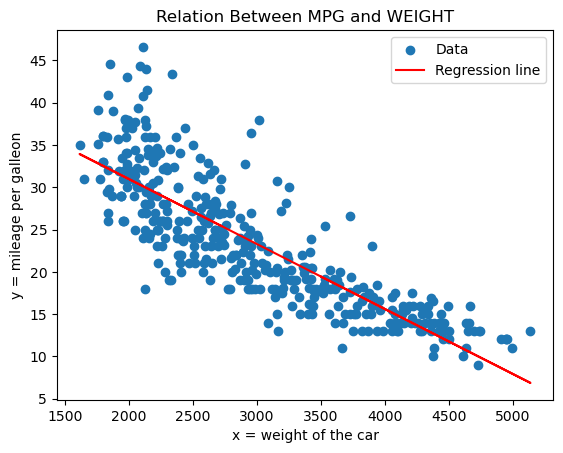

In [100]:
#Visualize the results
plt.scatter(x,y, label ='Data')
plt.plot(x, model.predict(x), color ='red', label='Regression line')
plt.xlabel('x = weight of the car')
plt.ylabel('y = mileage per galleon')
plt.title('Relation Between MPG and WEIGHT')
plt.legend()
plt.show()

In [101]:
#check the R-squared score for this linear model
from sklearn.metrics import r2_score

#Calculate the R-squared score 
r_squared = r2_score(y, model.predict(x))

#Print the R-squared score 
print(f"R-squared: {r_squared}")

R-squared: 0.6917929800341573


In [102]:
#Select one variable from the dataset and apply scaling with both standardization and normalization for it.
#Show the data values before and after scaling.

#Values before scaling
x.transpose()

array([[3504, 3693, 3436, 3433, 3449, 4341, 4354, 4312, 4425, 3850, 3563,
        3609, 3761, 3086, 2372, 2833, 2774, 2587, 2130, 1835, 2672, 2430,
        2375, 2234, 2648, 4615, 4376, 4382, 4732, 2130, 2264, 2228, 2046,
        2634, 3439, 3329, 3302, 3288, 4209, 4464, 4154, 4096, 4955, 4746,
        5140, 2962, 2408, 3282, 3139, 2220, 2123, 2074, 2065, 1773, 1613,
        1834, 1955, 2278, 2126, 2254, 2408, 2226, 4274, 4385, 4135, 4129,
        3672, 4633, 4502, 4456, 4422, 2330, 3892, 4098, 4294, 4077, 2933,
        2511, 2979, 2189, 2395, 2288, 2506, 2164, 2100, 4100, 3672, 3988,
        4042, 3777, 4952, 4464, 4363, 4237, 4735, 4951, 3821, 3121, 3278,
        2945, 3021, 2904, 1950, 4997, 4906, 4654, 4499, 2789, 2279, 2401,
        2379, 2124, 2310, 2472, 2265, 4082, 4278, 1867, 2158, 2582, 2868,
        3399, 2660, 2807, 3664, 3102, 2875, 2901, 3336, 1950, 2451, 1836,
        2542, 3781, 3632, 3613, 4141, 4699, 4457, 4638, 4257, 2219, 1963,
        2300, 1649, 2003, 2125, 2108, 

In [103]:
#Data standardization with StandardScaler
from sklearn.preprocessing import StandardScaler

standS = StandardScaler()
scalerS = standS.fit_transform(x)

#Values after standardization
print(scalerS.transpose())

[[ 0.63086987  0.85433297  0.55047045  0.54692342  0.56584093  1.62049216
   1.63586264  1.58620417  1.71980909  1.03996105  0.7006282   0.75501604
   0.93473239  0.1366499  -0.70754402 -0.16248324 -0.23224156 -0.45333997
  -0.99367137 -1.34246298 -0.35284069 -0.63896804 -0.70399699 -0.87070755
  -0.38121696  1.94445453  1.66187422  1.66896828  2.08278883 -0.99367137
  -0.83523722 -0.87780162 -1.0929883  -0.39776978  0.55401749  0.4239596
   0.3920363   0.37548348  1.4644227   1.76592053  1.39939375  1.33081778
   2.34645164  2.09934165  2.56518536 -0.00996081 -0.66497962  0.36838941
   0.19931416 -0.88726037 -1.00194778 -1.05988266 -1.07052376 -1.41576833
  -1.60494344 -1.34364532 -1.20058165 -0.8186844  -0.99840075 -0.84706066
  -0.66497962 -0.88016631  1.54127508  1.67251532  1.37692921  1.36983514
   0.82950374  1.96573673  1.81084961  1.75646177  1.71626206 -0.75720249
   1.08961951  1.33318246  1.56492197  1.30835323 -0.04424879 -0.54319814
   0.01013905 -0.92391305 -0.6803501  -

In [104]:
#Data normalization with MinMaxScaler 
from sklearn.preprocessing import MinMaxScaler

minMaxS = MinMaxScaler()
scalerM = minMaxS.fit_transform(x)
# fit_transform(x) = học thông tin từ dữ liệu (fit) + chuẩn hóa dữ liệu (transform) trong 1 bước
#Kết hợp cả hai bước trên:
    #Tính min và max từ dữ liệu.
    #Chuẩn hóa dữ liệu ngay lập tức.
#Trả về một numpy array chứa dữ liệu đã được chuẩn hóa.
#VD: 1000 → 0.0, 2000 → 0.5, 3000 → 1.0

#Values after standardization
print(scalerM.transpose())

[[0.5361497  0.58973632 0.51686986 0.51601928 0.52055571 0.77346187
  0.77714772 0.76523958 0.79727814 0.63425007 0.5528778  0.56592005
  0.60901616 0.41763538 0.21519705 0.34590303 0.32917494 0.27615537
  0.1465835  0.06294301 0.30025517 0.23164162 0.21604763 0.17607031
  0.29345052 0.85114828 0.78338531 0.78508648 0.88432095 0.1465835
  0.18457613 0.17436915 0.12276722 0.28948115 0.51772044 0.48653246
  0.47887723 0.47490785 0.73603629 0.8083357  0.7204423  0.70399773
  0.94754749 0.88829033 1.         0.38247803 0.22540403 0.47320669
  0.43266232 0.17210094 0.14459881 0.13070598 0.12815424 0.04536433
  0.         0.06265948 0.09696626 0.18854551 0.14544939 0.18174086
  0.22540403 0.1738021  0.75446555 0.78593706 0.71505529 0.71335413
  0.58378225 0.85625177 0.81910972 0.80606748 0.79642756 0.20328891
  0.64615821 0.70456479 0.76013609 0.69861072 0.37425574 0.25460731
  0.38729799 0.1633116  0.22171817 0.19138078 0.25318968 0.15622342
  0.13807769 0.70513184 0.58378225 0.67337681 0.6

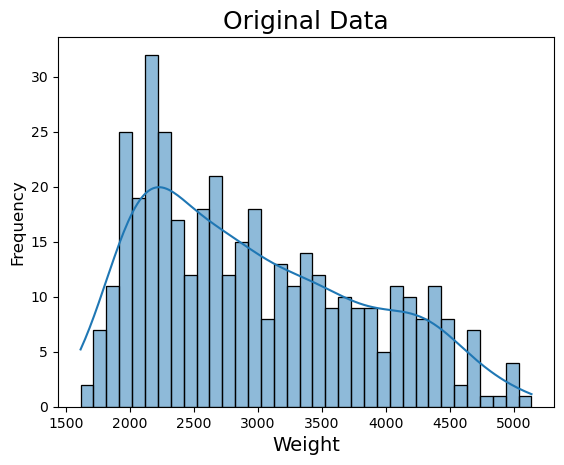

In [107]:
#Present results of scaling also with graphs

#Visualizing original data
#Data x is not a numpy.ndarray, we need to convert that to dataframe, because 
#Seaborn's histplot expects a dataframe 

#Convert the numpy array x to a pandas DataFrame 
x_mpg = pd.DataFrame(x, columns=['Weight'])

#In the exam, we can test different binwidths for visualization, 100 seems to look ok
sns.histplot(data=x_mpg, x='Weight', binwidth = 100, kde = True)
plt.xlabel('Weight', fontsize = 14)
plt.ylabel('Frequency', fontsize = 12)
plt.title('Original Data', fontsize = 18)
plt.show()

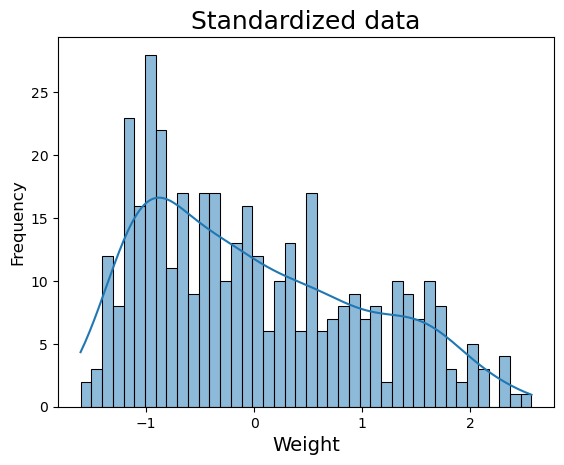

In [109]:
#Visualizing standardized data

#Data scalerS is not a numpy.ndarray, we need to convert that to dataframe, becase
#Seaborn's histplot expects a data frame 

#Convert the numpy array scalerS to a pandas DataFrame 
scalerS_mpg = pd.DataFrame(scalerS, columns=['Weight'])

#You can test different binwidths for visualization. Notice that the 
#binwidth needs to match the data range, so therefore 0.1 
sns.histplot(data=scalerS_mpg, x = 'Weight', binwidth=0.1, kde=True)
plt.xlabel('Weight', fontsize = 14)
plt.ylabel('Frequency', fontsize = 12)
plt.title("Standardized data", fontsize = 18)
plt.show()

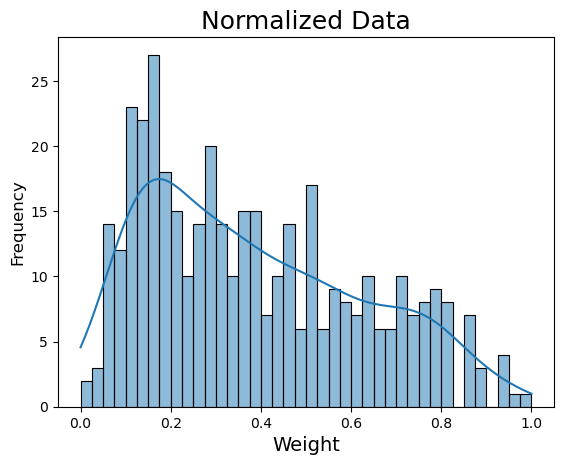

In [111]:
#Visualizing normalized data 

#Data scalerM is not a numpy.ndarray, we need to convert that to dataframe, because
#Seaborn's histplot expects a data frame

#Convert the numpy array scalerM to a pandas DataFrame
scalerM_mpg = pd.DataFrame(scalerM, columns=['Weight'])

#You can test different binwidths for visualization. Notice that the 
#binwidth needs to match the data range, so therefore 0.025
sns.histplot(data = scalerM_mpg, x='Weight', binwidth=0.025, kde=True)
plt.xlabel('Weight', fontsize=14)
plt.ylabel('Frequency',fontsize=12)
plt.title('Normalized Data', fontsize=18)
plt.show()

✅ **1. Tại sao phải vẽ cả 3 biểu đồ (Original, Standardized, Normalized)?**

+ Original Data: Cho thấy phân phối ban đầu của biến (ví dụ: Weight). Dữ liệu gốc thường có đơn vị (kg, lbs) và có thể lệch về một phía.
+ Standardized Data: Sau khi chuẩn hóa bằng Z-score (mean = 0, std = 1), ta kiểm tra xem dữ liệu đã được đưa về dạng chuẩn chưa. Điều này quan trọng khi dùng thuật toán dựa trên gradient hoặc có regularization.
+ Normalized Data: Sau khi Min-Max scaling (đưa về [0,1]), ta kiểm tra xem dữ liệu đã nằm trong khoảng mong muốn chưa. Điều này quan trọng khi dùng thuật toán dựa trên khoảng cách (KNN, Neural Network).

→ Việc trực quan hóa giúp bạn hiểu rõ sự thay đổi của dữ liệu sau mỗi bước tiền xử lý.

✅ **2. Tại sao phải chuyển từ numpy.ndarray sang pandas.DataFrame?**

+ StandardScaler và MinMaxScaler trả về numpy array.
+ Seaborn (hàm sns.histplot) hoạt động tốt với DataFrame vì:
+ Cho phép dùng tên cột (x='Weight') thay vì chỉ số.
+ Tích hợp dễ dàng với các tính năng như hue, grouping.

Nếu không chuyển đổi, bạn phải dùng cú pháp khó đọc như sns.histplot(x=scalerS[:,0]).


✅ **3. Tại sao binwidth khác nhau?**

+ Original Data: Giá trị lớn (ví dụ: 2000–5000 lbs), nên binwidth = 100 hợp lý.
+ Standardized Data: Giá trị nằm trong khoảng [-3, 3], nên binwidth = 0.1.
+ Normalized Data: Giá trị nằm trong [0, 1], nên binwidth = 0.025.
  
→ Binwidth phải phù hợp với range của dữ liệu để histogram hiển thị đẹp và có ý nghĩa.

**Homework 9**

In [119]:
#Load the dataset
titanic = sns.load_dataset('titanic')
titanic.head()

,survived,pclass,sex,age,sibsp,parch,fare,embarked,class,who,adult_male,deck,embark_town,alive,alone
0,0,3,male,22.0,1,0,7.2500,S,Third,man,True,NaN,Southampton,no,False
1,1,1,female,38.0,1,0,71.2833,C,First,woman,False,C,Cherbourg,yes,False
2,1,3,female,26.0,0,0,7.9250,S,Third,woman,False,NaN,Southampton,yes,True
3,1,1,female,35.0,1,0,53.1000,S,First,woman,False,C,Southampton,yes,False
4,0,3,male,35.0,0,0,8.0500,S,Third,man,True,NaN,Southampton,no,True


In [128]:
#Create a frequency table showing how many men and women survived vs. did not survive. Use crosstab.
#0: did not survive, 1:survived

survived_gender = pd.crosstab(titanic['sex'], titanic['survived'])


#show table (không cần .show như plot)
survived_gender

survived,0,1
sex,,
female,81,233
male,468,109


***Tại sao dùng Crosstab?***

+ Đếm số lần xuất hiện (frequency) của các cặp giá trị từ 2 hoặc nhiều biến phân loại
+ Đơn giản, nhanh, chủ yếu trả về số lượng count
+ Rất hữu ích cho phân tích dữ liệu, ví dụ:
  
    a) Ai sống sót nhiều hơn? (Nữ sống sót nhiều hơn nam)
  
    b) Tỷ lệ sống sót theo giới tính.

***Cách nhớ đơn giản:***

pd.crosstab(cột A, cột B) = Đếm số lần xuất hiện của từng cặp giá trị từ A và B → trả về bảng.
+ cột A (vd: titanic['sex']) sẽ nằm ở dưới, cột B (vd: titanic['survived']) sẽ nằm ở trên
+ tip dễ nhớ: với crosstab thì ngược nhau: A dưới - B trên

***Tại sao dùng Pivot Table***
+ Linh hoạt hơn, cho phép:
  a) Tính mean, sum, min, max hoặc bất kỳ hàm tổng hợp nào
  b) Nhóm theo nhiều cấp độ (multi-index)
  
+ Cú pháp:

In [139]:
titanic.pivot_table(values='age', index='sex', columns='survived', aggfunc='mean')
#values là cái ruột
#index là cột chỉ số đầu tiên
#columns là hàng trên cùng (cả pivot và crosstab đều lấy giá trị cột làm hàng trên cùng, aggfunc là hàm tổng hợp được sử dụng để tính giá trị yêu cầu)

survived,0,1
sex,,
female,25.046875,28.847716
male,31.618056,27.276022


***Visualize the survival distribution for each gender using a pie chart***

+ Use appropriate labels and title 
+ Note: các loại biểu đồ trong Seaborn: 

***Các loại biểu đồ phổ biến trong Seaborn***

1) ***Histogram***

sns.histplot(data=df, x='column_name', bins=30, kde=True) ***→ Phân phối dữ liệu.***

3) ***Bar Chart***

sns.barplot(data=df, x='category_column', y='numeric_column', estimator=np.mean) ***→ Trung bình hoặc tổng hợp theo nhóm.***
sns.countplot() → Đếm số lượng theo nhóm.

5) ***Boxplot***

sns.boxplot(data=df, x='category_column', y='numeric_column') ***→ Hiển thị phân phối và outlier.***

7) ***Violin Plot***

sns.violinplot(data=df, x='category_column', y='numeric_column', inner='quartile') ***→ Phân phối + mật độ.***

9) ***Strip Plot***

sns.stripplot(data=df, x='category_column', y='numeric_column', jitter=True) ***→ Hiển thị điểm dữ liệu theo nhóm.***

11) ***Swarm Plot***

sns.swarmplot(data=df, x='category_column', y='numeric_column') ***→ Giống stripplot nhưng không chồng lên nhau.***

13) ***Scatter Plot***

sns.scatterplot(data=df, x='column_x', y='column_y', hue='category_column') ***→ Quan hệ giữa hai biến.***

15) ***Line Plot***

sns.lineplot(data=df, x='time_column', y='value_column', hue='category_column') ***→ Xu hướng theo thời gian hoặc biến liên tục.***

17) ***Heatmap***

sns.heatmap(data=df.corr(), annot=True, cmap='coolwarm') ***→ Ma trận tương quan hoặc dữ liệu dạng bảng.***

19) ***Pair Plot***

sns.pairplot(df, hue='category_column') ***→ Quan hệ giữa nhiều biến (scatter + histogram).***

21) ***Joint Plot***

sns.jointplot(data=df, x='column_x', y='column_y', kind='scatter') ***→ Quan hệ giữa hai biến + phân phối.***

23) ***KDE Plot***

sns.kdeplot(data=df['numeric_column'], shade=True) ***→ Mật độ xác suất (kernel density).***

25) ***Catplot***

sns.catplot() ***→ Biểu đồ cho dữ liệu phân loại (bar, box, violin).***

27) ***FacetGrid***

sns.FacetGrid() ***→ Vẽ nhiều biểu đồ theo nhóm.***

***Không có pie chart trong Seaborn → Nếu cần pie chart, dùng Matplotlib hoặc Plotly.***



In [ ]:
#Because we cannot plot Piechart using Seaborn, we have to use Matplotlib

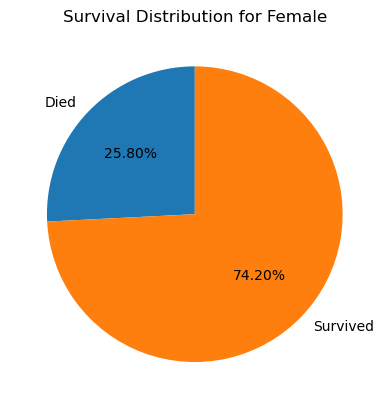

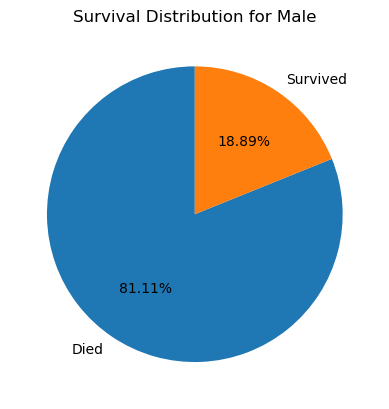

In [154]:
#survived_gender là bảng Crosstab với index chứa giá trị giới tính (male, female)
for gender in survived_gender.index:
    values = survived_gender.loc[gender].values #lấy dữ liệu theo giới tính
    labels = ['Died', 'Survived'] #đặt nhãn cho các phần của biểu đồ
    plt.pie(values, labels=labels, autopct='%1.2f%%', startangle=90) 
    #autopct: hiển thị phần trăm với 2 chữ số thập phân
    #starangle: xoay biểu đồ sao phần đầu tiên bắt đầu từ góc 
    plt.title(f'Survival Distribution for {gender.capitalize()}')
    plt.show()

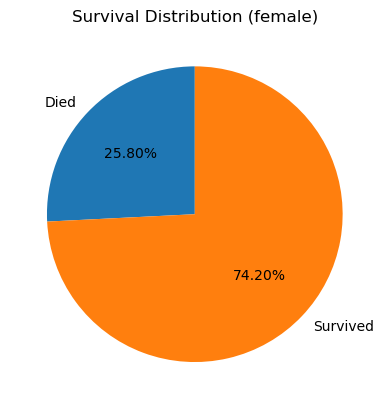

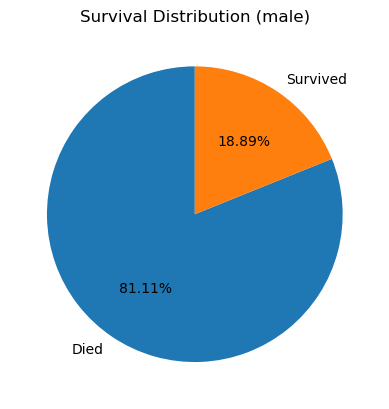

In [156]:
# Another way would be to plot them separately:
# Female
female_data = survived_gender.loc['female']
female_data.plot.pie(
    autopct='%1.2f%%',
    labels=['Died', 'Survived'],  # corresponds to columns 0 and 1
    title='Survival Distribution (female)',
    startangle=90
)
plt.ylabel('')
plt.show()


# Male
male_data = survived_gender.loc['male']
male_data.plot.pie(
    autopct='%1.2f%%',
    labels=['Died', 'Survived'],  # corresponds to columns 0 and 1
    title='Survival Distribution (male)',
    startangle=90
)
plt.ylabel('')
plt.show()

In [166]:
#Compute the mean survival rate grouped by class and sex. Use pivot table. 
#survival rate: cái ruột (values)
#index='class'
#columns='sex'
#aggfunc='mean'

mean_survival = titanic.pivot_table(values='survived', index ='class', columns='sex', aggfunc='mean', observed = False) 
#VICAO - ruột, cột, hàng, aggfunc (mean, mode, min, max...) 
mean_survival

sex,female,male
class,,
First,0.968085,0.368852
Second,0.921053,0.157407
Third,0.500000,0.135447


**Về nguyên tắc index và columns trong pivot_table hoặc crosstab có thể đổi chỗ cho nhau, vì chúng chỉ quyết định cách hiển thị dữ liệu (hàng ↔ cột).**

Điều quan trọng:
+ Chọn cách hiển thị sao cho dễ đọc và trực quan nhất.
Thông thường:
+ Biến có ít giá trị → đặt làm columns (để bảng không quá rộng).
+ Biến có nhiều giá trị → đặt làm index (để bảng dài hơn thay vì quá rộng).

Ví dụ:
+ Nếu sex chỉ có 2 giá trị (male, female) → nên để làm columns.
+ Nếu class có nhiều giá trị (First, Second, Third) → nên để làm index.
Mục tiêu: Giữ hình thức nào giúp người đọc nhìn rõ và dễ hiểu hơn.

<function matplotlib.pyplot.show(close=None, block=None)>

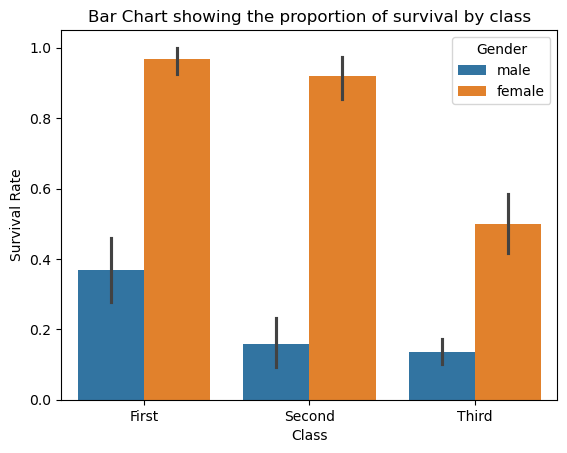

In [190]:
#Plot a grouped bar chart showing the proportion of survival by class. 
#Use appropriate x and y labels and chart title. Use appropriate x and y labels, legend and title.

sns.barplot(data=titanic, x='class', y='survived', hue='sex') #multiple dodge chỉ dùng trong histplot, không có trong barplot
plt.xlabel("Class")
plt.ylabel("Survival Rate")
plt.title("Bar Chart showing the proportion of survival by class")
plt.legend(title="Gender")
plt.show

**Homework 10**

**Connection to Databases with Python**

***Objectives***
You will create a database and populate it with data from CSV files using Python. The data includes students, courses, and their results. You will design a relational schema and use Python to insert and query the data.

***Data***
+ students.csv: Contains 20 students with names and ages.
+ courses.csv: Contains 8 foundational ICT courses from Turku University of Applied Sciences.
+ grades.csv: Contains student enrollments in courses, with grades from 0 to 5.

***Python Tasks***
1. Create 3 tables in the database: for students, courses and course grades using Python
2. Insert data in the tables
+ Use Pandas to read the CSV files and insert the data into database. ##### Hint: cursor.executemany is good way to store data into database
https://pytutorial.com/python-sqlite3-executemany-method-tutorial/
https://sqlpey.com/python/solved-how-to-insert-multiple-rows-into-postgresql-with-psycopg2/ ### 3. Query Data Write Python code to perform the following queries and print the results:
+ List all students and their enrolled courses with grades.
+ Find students who received a grade of 5 in any course.
+ Make ANY OTHER query from database and show the results
+ Use SQL queries inside Python.
+ NOTE: This assingment can be done either with SQLite or PostgreSQL
+ Deliverables
  
***Python script (.py or Jupyter Notebook) that:***
+ Creates the database tables
+ Inserts the data
+ Performs the required queries

In [211]:
import pandas as pd 
import sqlite3

student = pd.read_csv('students.csv')
student.head(2)


,student_id,name,age
0,1,Ada,22
1,2,Ben,24


In [213]:
course = pd.read_csv('courses.csv')
course.head(2)


,course_id,course_name,credits
0,TE00CS88,Introduction to Programming,5
1,TE00CS89,Databases,5


In [215]:
grade = pd.read_csv('grades.csv')
grade.head(2)

,student_id,course_id,grade
0,1,TE00CS88,5
1,1,TE00CS89,4


In [219]:
student.columns

Index(['student_id', 'name', 'age'], dtype='object')

**Để tạo 1 CSDL SQLite cần có tổng cộng 5 bước chính**

1. Kết nối đến CSDL
2. Viết câu lệnh SQL để tạo bảng
3. Tạo đối tượng cursor
4. Thực thi câu lệnh SQL
5. Lưu thay đổi và đóng kết nối

In [281]:
#Create databases tables using SQLite

#Connect to the SQLite database (or create a new one)
conn = sqlite3.connect('StudentData.db')
#'StudentData.db': Đây là tên file cơ sở dữ liệu. 
#Nếu file này đã tồn tại, Python sẽ kết nối đến nó. 
#Nếu chưa tồn tại, SQLite sẽ tự động tạo một file mới với tên đó trong thư mục hiện tại.

#Define the SQL statement to create a table
create_table_sql = ''' 
CREATE TABLE IF NOT EXISTS students (
    student_id INTEGER PRIMARY KEY,
    name TEXT,
    age INTEGER);
'''

#Create a cursor object to interact with the database
#cursor là 1 đối tượng trung gian giữa Python và DB
#cursor cho phép gửi câu lệnh SQL đến DB
#Thực thi các câu lệnh như CREATE TABLE, INSERT, SELECT, UPDATE, DELETE
#Lấy dữ liệu trả về từ CSDL (vd khi dùng SELECT) 
#cursor như 1 người điều phối, gửi lệnh từ python và nhận kết quả từ DB


cursor = conn.cursor() 

#Execute the SQL statement to create the table
cursor.execute(create_table_sql)

#Commit the changes and close the connection
conn.commit()
conn.close()

In [283]:
course.columns

Index(['course_id', 'course_name', 'credits'], dtype='object')

In [285]:
#Create databases tables using SQLite

#Connect to the SQLite database (or create a new one)
conn = sqlite3.connect('StudentData.db')

#Define the SQL statement to create a table
create_table_sql = ''' 
CREATE TABLE IF NOT EXISTS courses (
    course_id INTEGER PRIMARY KEY,
    course_name TEXT,
    credits INTEGER);
'''

#Create a cursor object to interact with the database
cursor = conn.cursor() 

#Execute the SQL statement to create the table
cursor.execute(create_table_sql)

#Commit the changes and close the connection
conn.commit()
conn.close()

In [287]:
grade.columns

Index(['student_id', 'course_id', 'grade'], dtype='object')

In [289]:
#Create databases tables using SQLite

#Connect to the SQLite database (or create a new one)
conn = sqlite3.connect('StudentData.db')

#Define the SQL statement to create a table
create_table_sql = ''' 
CREATE TABLE IF NOT EXISTS courses (
    student_id INTEGER PRIMARY KEY,
    course_id INTEGER,
    grade INTEGER,
    FOREIGN KEY(student_id) REFERENCES students(student_id),
    FOREIGN KEY(course_id) REFERENCES courses(course_id)
);  
'''
#Create a cursor object to interact with the database
cursor = conn.cursor() 

#Execute the SQL statement to create the table
cursor.execute(create_table_sql)

#Commit the changes and close the connection
conn.commit()
conn.close()

**Quy trình INSERT chèn dữ liệu từ một Dataframe vào bảng SQLite**
1. Kết nối đến database.
2. Tạo cursor.
3. Duyệt từng dòng trong DataFrame.
4. Lấy giá trị từ dòng.
5. Thực thi câu lệnh INSERT.
6. Commit để lưu dữ liệu.

In [292]:
#Connect to the SQLite database (or create a new one)
conn = sqlite3.connect('StudentData.db')
cursor = conn.cursor()
for index, row in student.iterrows():
    variable1 = row['student_id']
    variable2 = row['name']
    variable3 = row['age']

    #Extract other variables as needed
    #Execute an INSERT statement into your PostgreSQL table 
    cursor.execute(
        "INSERT INTO students (student_id, name, age) VALUES (?,?,?)",
        (variable1, variable2, variable3)
    )

#Commit the changes to the database
conn.commit()
conn.close()

OperationalError: database is locked

In [294]:
# better way to insert with 'executemany'
# Prepare data as list of tuples
data = list(course[['course_id', 'course_name', 'credits']].itertuples(index=False, name=None))

# Bulk insert into courses table
cursor.executemany(
    "INSERT INTO courses (course_id, course_name, credits) VALUES (?, ?, ?)",
    data
)

conn.commit()
conn.close()

OperationalError: database is locked

In [ ]:
# and grades same way
# Prepare data from DataFrame
data = list(grade[['student_id', 'course_id', 'grade']].itertuples(index=False, name=None))

# Bulk insert into grades table
cursor.executemany(
    "INSERT INTO grade (student_id, course_id, grade) VALUES (?, ?, ?)",
    dataase
)

conn.commit()
conn.close()

In [ ]:
#List all students and their enrolled courses with grades

conn = sqlite3.connect('StudentData.db')

query = """
SELECT 
    s.student_id,
    s.name,
    s.age,
    c.course_id,
    c.course_name,
    g.grade
FROM grades g
JOIN students s ON g.student_id = s.student_id
JOIN courses c ON g.course_id = c.course_id
ORDER BY s.student_id, c.course_id;
"""

df = pd.read_sql_query(query, conn)

conn.commit()
conn.close()

df # Display first rows

In [ ]:
#Find students who received a grade of 5 in any course 
conn = sqlite3.connect('StudentData.db')

query = """
SELECT 
    s.student_id,
    s.name,
    c.course_id,
    c.course_name,
    g.grade
FROM grades g
JOIN students s ON g.student_id = s.student_id
JOIN courses c ON g.course_id = c.course_id
WHERE g.grade = 5
ORDER BY s.student_id;
"""

df = pd.read_sql_query(query, conn)
conn.close()

df

In [ ]:
conn.close()

***Data, Dataset, Element, Variable***

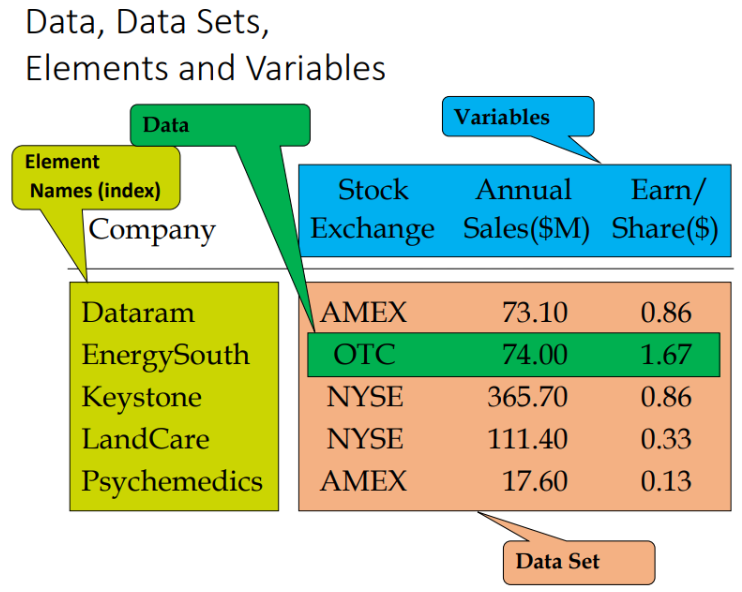

***Scales of Measurement***
***Scales of measurement include:*** 
1) ***Nominal:*** Data are labels or codes used to identify an attribute of the element
E.g:
Label: TUAS students labeled with "PINFOS24A", "DEAI24B"
Numeric code: Code "0" for females and "1" for males

2) ***Ordinal:*** The data have the properties of nominal data and the order or rank of the data is meaningful.
E.g:
Label: For competence level for people following labels are used: "Novice","Beginner","Practitioner","Expert", "Guru"

3) ***Interval:*** The data have the properties of ordinal data, and the interval between observations is expressed in terms of a fixed unit of measure.
E.g:
Carl has achieved 60 credits and Anna 87 credits. Anna has therefore get 27 credits more than Carl.

5) ***Ratio:*** The data have all the properties of interval data and the ratio of 2 values is meaningful. This scales must contain A ZERO VALUE that indicates that nothing exists for the variable at the zero point.
E.g: Height, weight, time...

***Classification of Data***
1) Data can be further classified as being qualitative or quantitative

   ***a) Qualitative Data:***
   + Labels or codes used to identify an attribute of each element.
   + Often referred to as categorical data
   + Use either the nominal or ordinal scale of measurement
   + Can be either numeric or nonnumeric

   ***b) Quantitative Data:***
    + discrete, if measuring how many (age, number of houses) 
    + continuous, if measuring how much (height, weight)
    + quantitative data are always numeric
    + ordinary arithmetic operations are meaningful for quantitative data


2) The statistical analysis that is appropriate depends on whether the data for the variable are qualitative or quantitative.

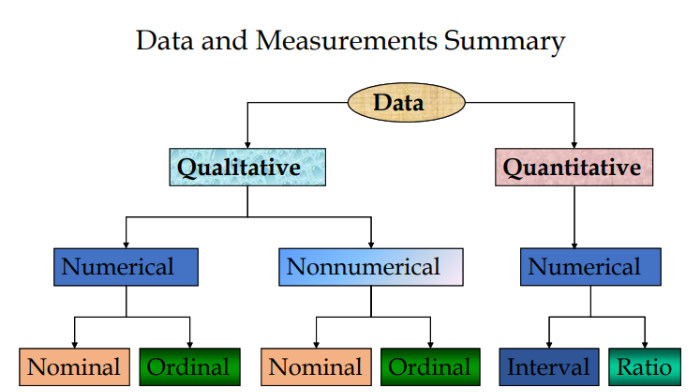

***Descriptive Statistics***
+ Descriptive statistics are the tabular, graphical, and numerical methods used to summarize data.
  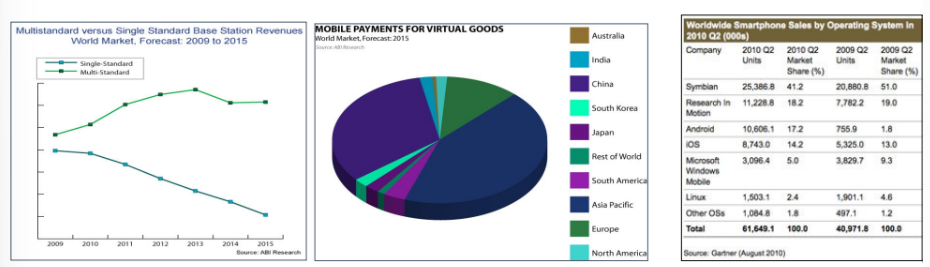

***What is Data Management***
+ Data Reading and Writing (Getting data from source, Storing data) 
+ Data Cleaning (missing data, outliers,...) (Handling missing data(NaN, N/A), Handling of strange values (outliers))
+ Data Coding (for categorical data) (Coding categorical data to numbers)
+ Data Scaling and normalization (Process data better fit for usage, modify values to scale 0-1, normalize values so that mean is 0)
+ Data Measurements (Calculate measures such as mean, std, variance, median, correlation...)
+ Data Visualization (Create graphs using the data such as bar chart, histogram, box plot, line chart, scatter diagram)
+ Data Analysis (Descriptive statistics, use graphs or tables to present summaries based on data, find relations of data, calculate correlation for quantitative variables in data, create cross-tabulation table for relations of qualitative/quantitative data, use scatter diagrams to show relations of quantitative variables, predictions using the data)

***Tools for Data Management***
+ Python
+ Excel
+ SPSS
+ PowerBI
+ R
+ ...

***Use case for Python libraries***
+ Pandas (Data storage in DataFrames, data processing, table presentation, descriptive statistics (measurements and graphs))
+ Numpy (Efficient calculation, data processing)
+ Matplotlib (Data visualization)
+ Seaborn (Data visualization (using Matplotlib))
+ Scipy.stats (statistical calculations)
+ Scikit-learn (Machine Learning) 

***Data Storage Formats***
***Structured vs Unstructured Data***

***a) Structured Data:*** 
+ Data arranged in tabular form (rows and tables)
+ Eg: Data in Excel sheet, Data in SQL database

***b) Unstructured Data:*** 
+ No specific structures
+ Eg: image files, documents, data in internet.

***c) Semi-Structured Data*** 
+ Data that is not purely structured, but also not completely unstructured
+ Has some level structure, but does not have firm model, and may contain data that are not easy to classify
+ May contain metadata for additional information about the data
+ Examples: Data in JSON format, CSV files, Data in XML document
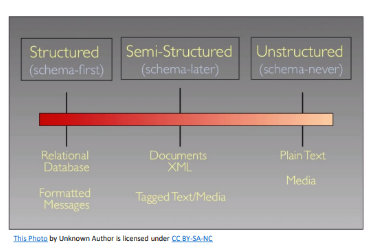

***Pandas Data Structures***
+ Pandas has 2 formats to store data
  a) Series
  b) DataFrames
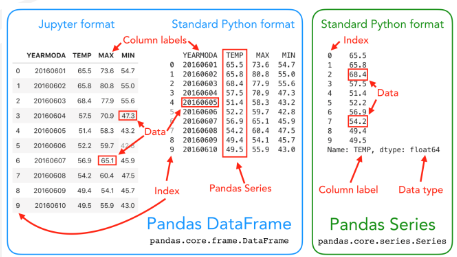

***Pandas Series***
+ 1-dimensional array
+ Data in series can be any type(int, str, float number, Python, object, ...)
+ Series can be created by method (pandas.Series or shortly pd.Series)
+ Series has index, that is as default [0,1,2,3...]
+ Index and name could be also defined.

***Pandas DataFrame**
+ 2-dimensional data structure (table)
+ DataFrame has rows and columns
+ Each column contain Series
+ Each row has index
+ DataFrame can have index and names of columns assigned
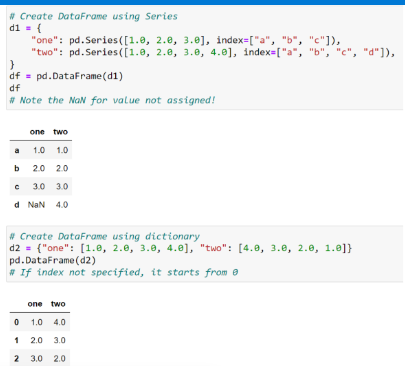

***CSV***
+ Comma-separated Value
+ A text file line-by-line information in an easy-to-read format
+ Each piece of information is usually separated by a comma, but could be other character as well
+ Can include names of variables (columns) in the 1st row
+ Every row have the same number of data(columns)
+ pd.read_csv

***Excel***
+ pd.read_excel

***JSON***
+ JavaScript Object Notation
+ JSON has roots in JavaScript but is nowadays a standardized information exchange and file format
+ Widely used by REST APIs and it's the basis of some of the NoSQL (or document) databases.
+ All modern general-purpose programming languages implement the needed data structures and most have library support for using the format.
+ JSON is human-readable, easy-to-use with a straightforward syntax and effective. (benefits of JSON)
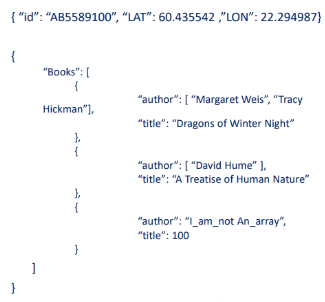
+ JSON format:
  
a) JSONs consist of:

*An unordered collection of key-value pairs. Python's dictionary represents such a structure.

*An ordered list of values.Python's list is a good example.

b) Syntax:

*An object begins with { and ends with }. Each key is followed by : and the key-value pairs are separated by ,.

*An array begins with [ and ends with ]. Values are separated by , .

*Value can be any of the following: string, number, Boolean, null, object or array.

Clearly the syntax allows nested formats. 


***HTML***
+ HTML is the markup language for Internet
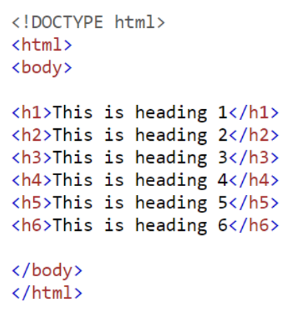

***XML***
+ XML is special case of HTML
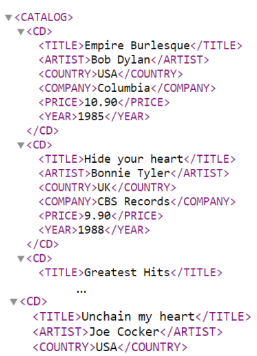

***SQL Database***
+ Structured Query Language
+ SQL is standard language for relational database management systesms (RDBS)

***NoSQL Database***
+ NoSQL databases are databases that store data in a format other than relational tables
+ E.g: MongoDB, Amazon DynamoDB
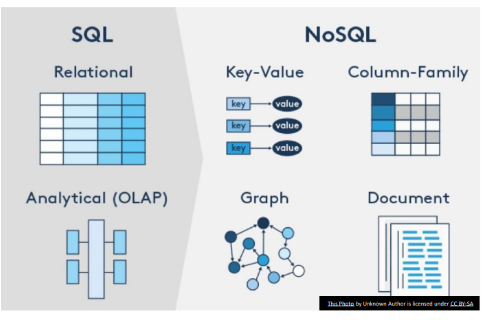

***Reading Data with Pandas***
+ Data is read into the Pandas DataFrame using a method depending on its storage format
+ E.g: read_csv, read_excel, read_json
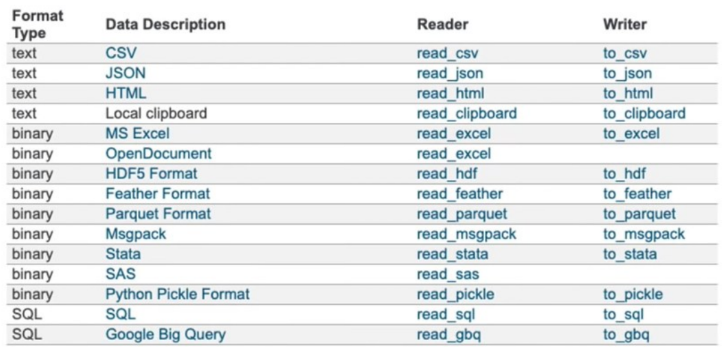

***File Handling***
+ File is an organized set of data in a specific format
+ 2 different types: text files and binary files.
+ Files consist of:
  a) set of metadata (file name, size, format...)
  b) file content
  c) EoF character
+ The operating system associates with each file a path that is used to locate the file in relation to other files.
+ Accessing files in Python: In Python, we have 3 types of objects (text, binary, and raw)
+ There are more generally called file objects. Sometimes streams or I/O streams.
+ In order to work with a file, we first produce a file object. This can be easily done with the built-in open() - function. The open() -function call has the following format: open(filename, mode=<related mode>)
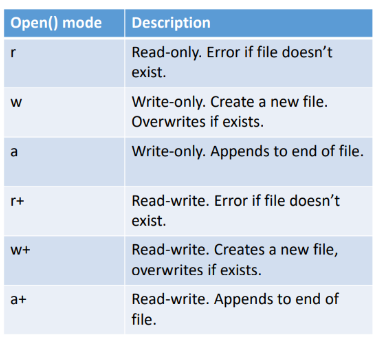

***Opening and reading file content***
+ In order to read a file and use its content in Python program, we need to take the following steps:
a) Use open()-function with a suitable mode to create a file object
b) Call that file objects methods (read(),readline(),readlines()) to read the content
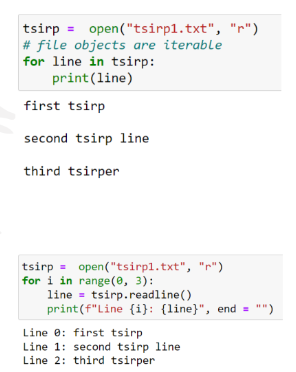

***Writing to a file***
a) The process of writing to a file is very similar to reading from a file. We create the file handle with the open() function and we choose one of the writing related methods. 
b) We need to use append method, otherwise we will be overwriting any existing file with the same name already on disk. 
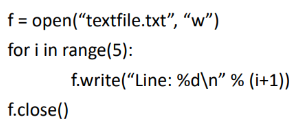

***Closing the file objects***

a) Close file objects after usage by calling the .close() - method for the object. 

b) We should enclose the usage of the file within a with-statement

c) When the with-statement exits, the interpreter will close the file handle automatically. 

d) If the with-statement isn't used nor the close()-method called, there's a possibility that the file opened for writing will not be completely written on the disk. 

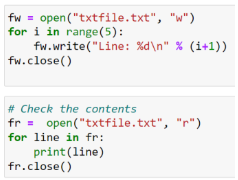
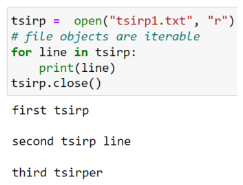
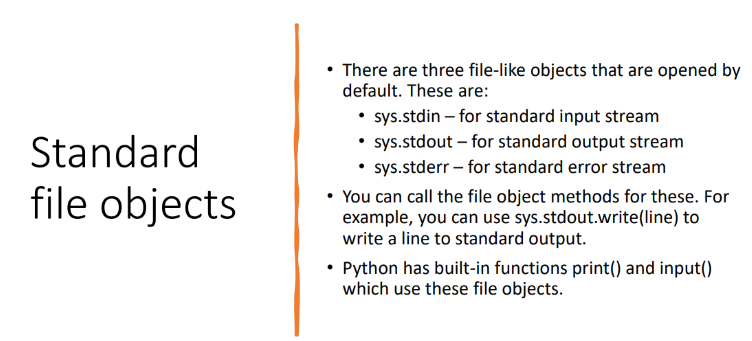


***JSON***

+ JSON stores the text data in the form of key/value pairs
+ The JSON object is represented in between curly brackets {}
+ Each key/value pair of JSON is separated by a comma sign ,
+ JSON data looks like Python dictionary, but JSON is a data format whereas Python dictionary is a data structure
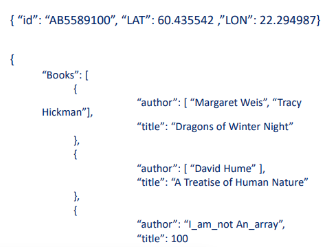

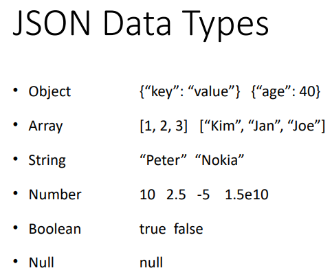

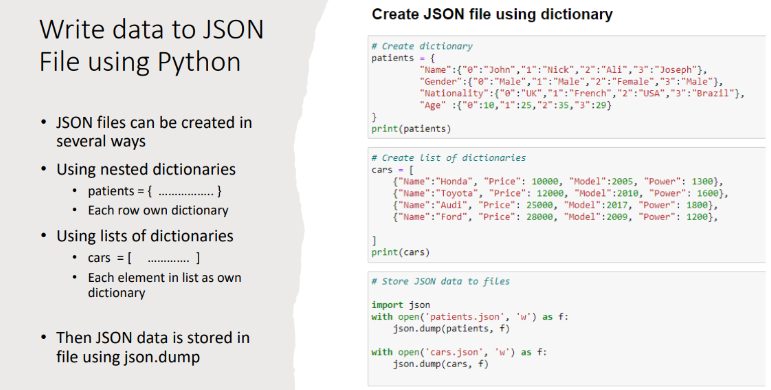

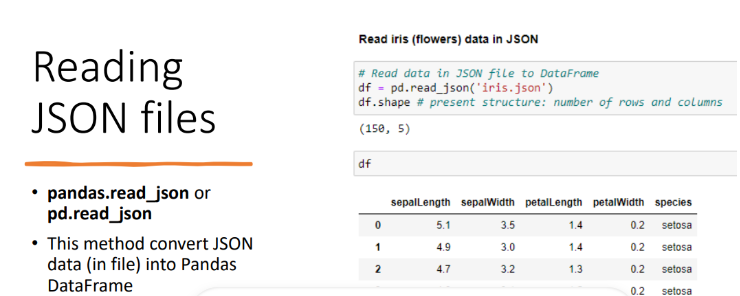

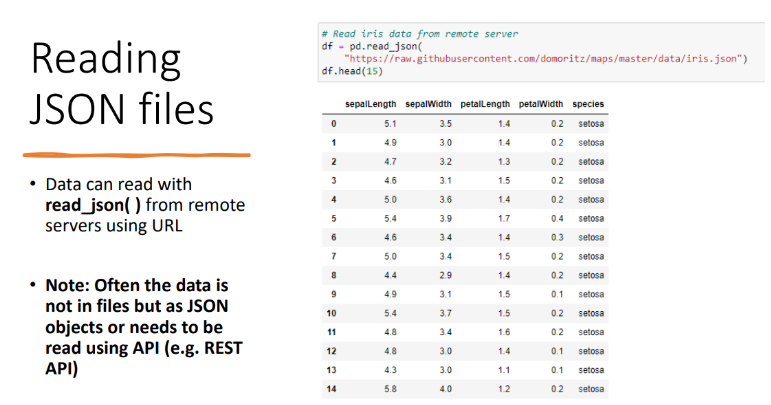


***Using JSON with Python***
+ Python has a built-in package called json that can be used to handle json-formated data
+ The 2 main functions:
  a) Serialization - convert Python to JSON format
  b) Deserialization - convert JSON format to Python
+ import json

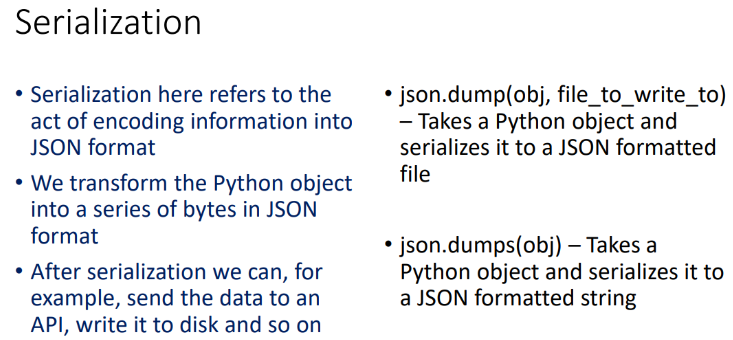

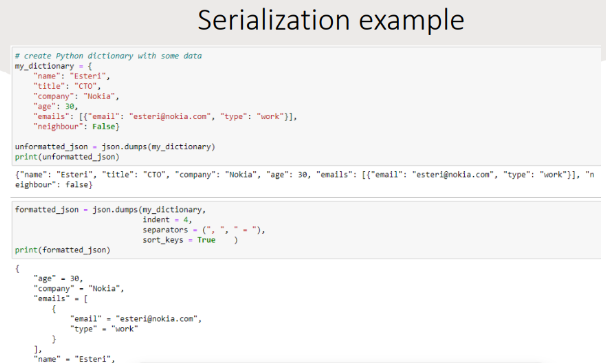

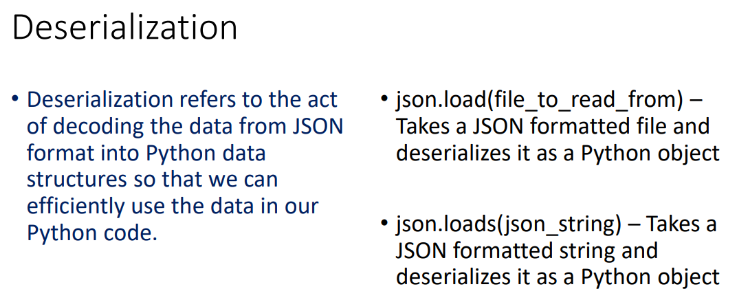

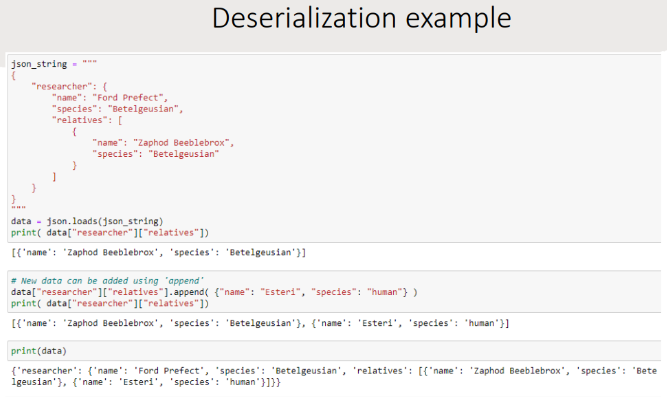

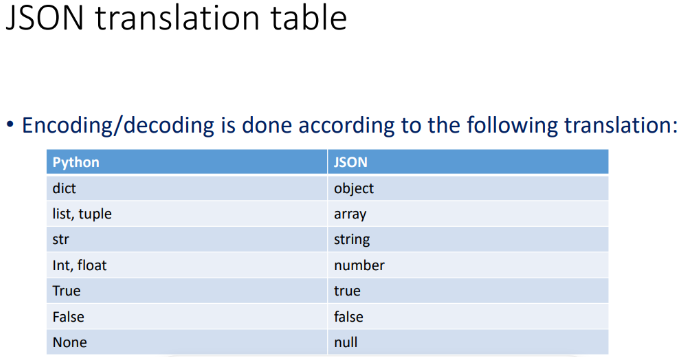

***General Workflow***
+ We get a JSON as an input, modify it and output the modified JSON. The workflow in very general form is as follows:
1) import json
2) data = json.load(file) or data = json.loads(string)
3) Modify data with regular dict and list methods
4) json.dump(data) to write the modified data back to JSON format 

***Pandas (Python Data Analysis Library)***
+ Pandas is the fundamental building block for doing data analysis in Python
+ Pandas provides:
  a) Tools for reading and writing data
  b) DataFrames and Series
  c) Descriptive Statistics
  d) Data selection and indexing
  e) Handling of missing data and data cleaning
  f) Grouping data
  g) Other useful data management functions
+ import pandas as pd
+ Tools for reading and writing data: read_csv, read_sql, read_json, to_csv, to_json, to_sql
+ Important Pandas features: DataFrames and Series, Data stored as Series in DataFrame tables, DataFrame is the main storage format in Pandas
+ Information about DataFrame: df.head() - beginning of df, df.tail() - end of DataFrame, df.info() - types of variables, df.size - DataFrame size(total data count), df.shape - number of rows and columns, df.columns - names of columns labels (variables).

print('Data amount in DataFrame:',df.size)
print('Size of DataFrame (rows, columns):', df.shape)
print('Variable names in DataFrame: \n', df.columns)

+ Descriptive statistics: When data is stored in DataFrame (e.g: with name df) then information like in below can be presented using:

  a) df.describe() - key data measurements (mean, std...)

  b) df.nunique() - number of unique values

  c) df['var_name'].unique() - unique values of variable

+ Data selection and indexing:
  a) df.loc() - Select data using its name

  b) df.iloc() - Select data based on its location
    * Special cases: df.iloc(:,-1) - last column, df.iloc(-1,:) - last row
 
+ Handling of missing data and data cleaning:

Missing data can be found using:
  a) df.info() - show if there is NaN values
  
  b) df.isna() - select missing values
  
  c) df.isnull() - like df.isna()
  
  d) removal of columns(variables) - df.drop()
  
  e) df.dropna() - removes rows with missing data
  
  f) NaN values changed to other value: df.fillna() - Fills NaN values with given value
    E.g: df['age'] = df['age'].fillna(agemean)
    
  g) Value could be median or mean for quantitative data or mode for categorical data.
  
  h) df.groupby() - groups data in DataFrame
    E.g: df2 = df.groupby('class').sum()
         df2.head()
         
  i) Addition of new variables in DataFrame:
    E.g: df['fare_age'] = df['fare']/df['age']
         df.head()
         
  j) Addition of new DataFrame based on condition:
    E.g: df3 = df.loc[(df['age'] > 25) & (df['class'] == 'First')]
         df3

**Numpy basics**
+ Numpy = Numerical Python. It is a Python library that's used in almost every field of science and engineering when working with data.
+ It has efficient data structures, universal functions, and extensive ecosystem make it an essential library for tasks involving numerical data, from basic array operations to complex math computations.
+ Numpy is also used by other Python libraries
+ Numpy provides:
  
  a) Efficient calculations
  
  b) Multidimensional array(ndarray) that is more efficient (in calculations and memory usage) that Python lists.
  
  c) Vectorization (of ndarray) enables operations for entire arrays than indivivudual elements.
  
  d) Data analysis functions
  
  e) Functions for linear algebra
  
+ Usage: import numpy as np
+ Creating arrays & Math operations:
  
  a) np.array(): create a Numpy array from a Python list or other iterable (iterable là bất kỳ đối tượng nào có thể được lặp qua trong vòng lặp for)
  
  b) np.zeros(): create an array of zeros with a specified shape
  
  c) np.ones(): create an array of ones with a speicified shape
  
  d) np.arrange(): create an array with specific start, end and step values
  
+ Array Shape and Reshaping:
  
  e) ndarray.shape: attribute to get the shape of the array
  f) np.reshape(): reshape an array to a new shape
  
+ Statistical Functions:
  
  g) np.mean()
  
  h) np.median()
  
  i) np.var()
  
  j) np.std()
  
  k) np.sum()
  
  l) np.min()

+ Math Operations:
  
  m) np.dot(): perform matrix multiplication
  
  n) np.tranpose(): transpose an array

+ Aggregation Functions:
  
  o) np.argmax()
  
  p) np.argmin()

+ Array Concatenation and Stacking:
  
  r) np.concatenate(): combine arrays along an existing axis
  
  s) np.stack(): stack arrays along a new axis

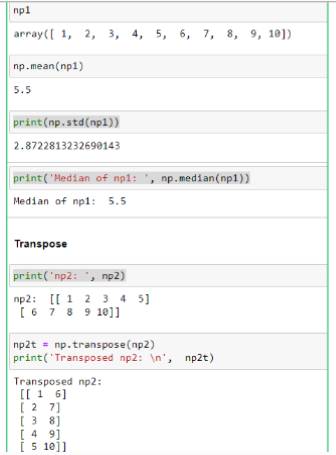

+ Array slicing and indexing: use slicing and indexing to access specific elements or portions of an array. 

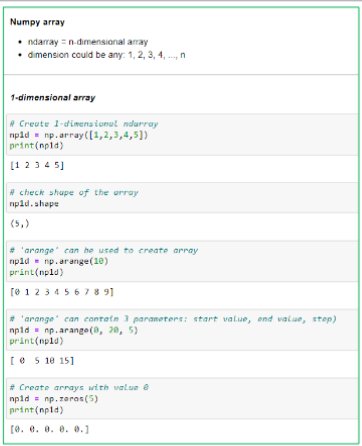

+ Copy and View: Numpy copy() creates new numpy and view() present the contents without copying it.
+ Broadcasting: Numpy allows arrays with different shapes to be combined in a way that makes sense.
+ Vectorization: Leverage NumPy's vectorized operations to perform element-wise operations on entire arrays efficiently
+ Linear Algebra: np.linalg submodule provides functions for linear algebra operations such as matrix inversion, eigenvalue decomposition, and singular value decomposition.

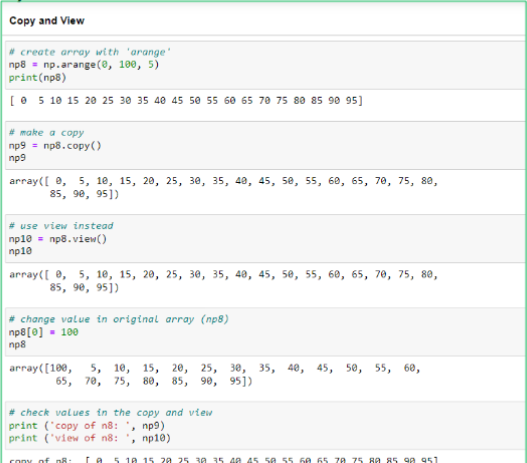

+ Statistical Functions for Handling Missing Data:
  a) np.isnan(): check for NaN (Not a Number) values in an array.
  b) np.nanmean(): calculate the mean while ignoring NaN values
  c) np.nanmedian(): compute the median while ignoring NaN values.
+ Order Statistics:
  d) np.percentile(): calculate various order statistics, including quartiles and percentiles.
But: Most of statistical measures can be also done using Pandas and Scipy.Stats

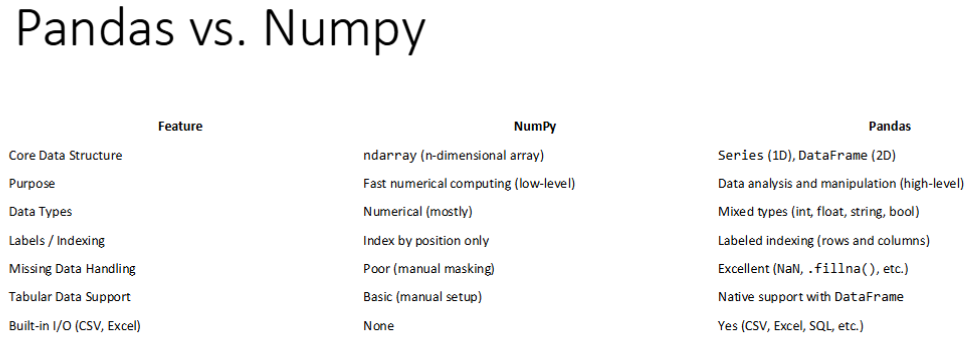

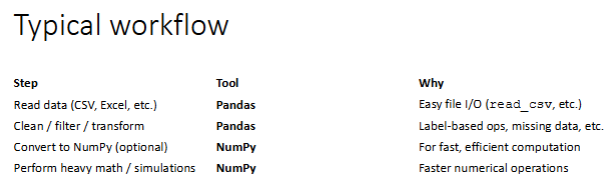


**Vectors & Matrices**

***Why vectors and matrices?***
1) Data representation: Matrices store large amounts of data in memory-efficient ways
2) Speed: Vectorized operations
3) ML modeling: Vectors and matrices are fundamental
4) Data transformations: They are matrix operations
5) Data Engineering: Vectorized operations - efficient pipelines and ETL

**Vectors**
+ Vectors are math objects that represent quantities with both magnitude and direction
+ They are often represented as ordered lists of numbers and are used to describe points in space or other math objects
+ A vector can be represented by an array of numbers called scalars
+ Each scalar corresponds to the magnitude of the vector with regards to each dimension.

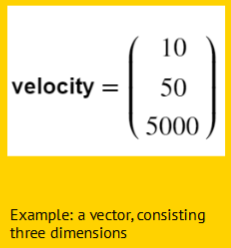

+ A vector is a tuple of one or more values called scalars
  a) v = (v1,v2,v3) - 3-dimensional vector
  b) v = (2,4,7,12,15) - 5-dimensional vector

**Vectors & Data**
+ Data can be presented using vectors
+ Features in data such as 'age' = 30, 'weight' = 80(kg), 'height'=180(cm) can be presented using vector: v = (30,80,180)
+ Note that the dimension does not need to limit to 3 but the number of features could be higher: v = (30, 80, 180, 3, 10)


**Matrices**
+ For data management, the matrices are a 2-dimensional set of numbers distributed in a table format in rows and columns
+ Dimension of matrix is present as mxn if there are m rows and n columns
  
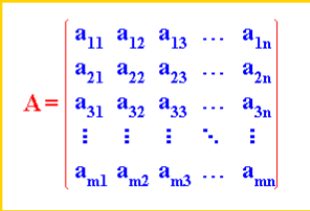

**Types of matrices (mostly used)**
+ Rectangular matrix: different numbers of rows and columns (n x m)
+ Square matrix: same number of rows and columns (n x n)
+ Diagonal matrix: kind of square matrix where all elements not located on the main diagonal are equal to zero.
+ Scalar matrix: diagonal matrix where all elements on the main diagonal are equal
+ Identify matrix: diagonal matrix where all elements on the main diagonal are equal to one
+ Tranpose matrix: matrix where rows and columns converted (m x n)

**Creation of Matrices**
+ Matrices can be created with Numpy
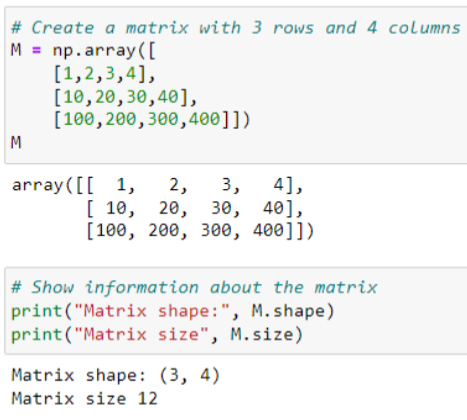

**Accessing Matrices**
+ Each row is row vector
+ Each column is column vector
+ Typically data for one variable is accessed using column vectors!
+ For Machine Learning data is divided in column vectors forming Features and target vector for Label.
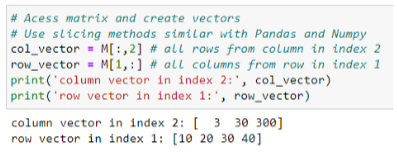
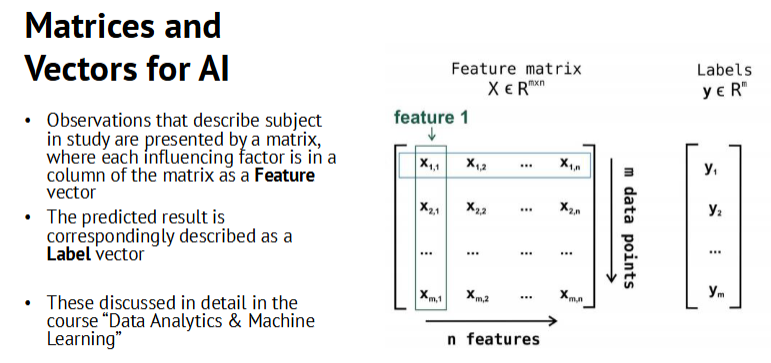
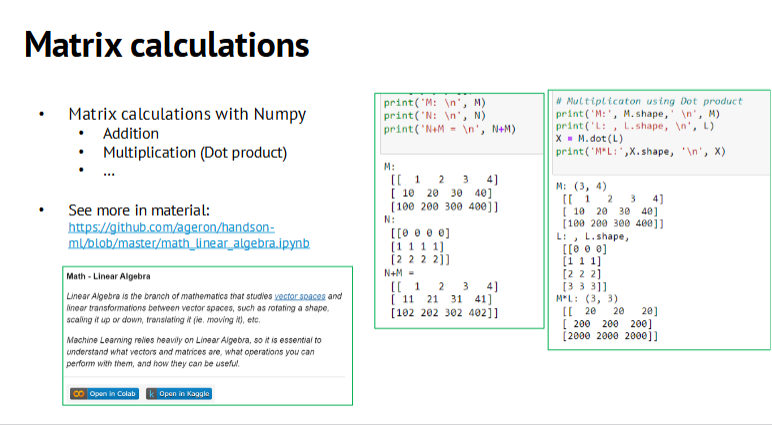



**Data Visualization**

Tabular and Graphical 
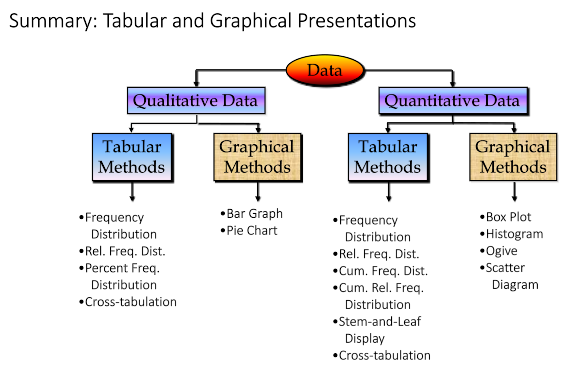

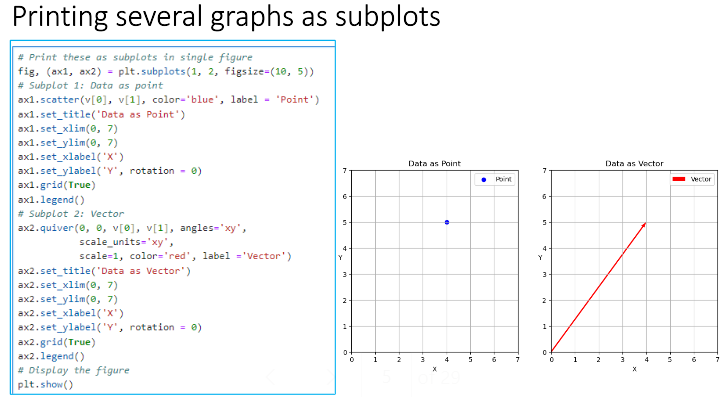

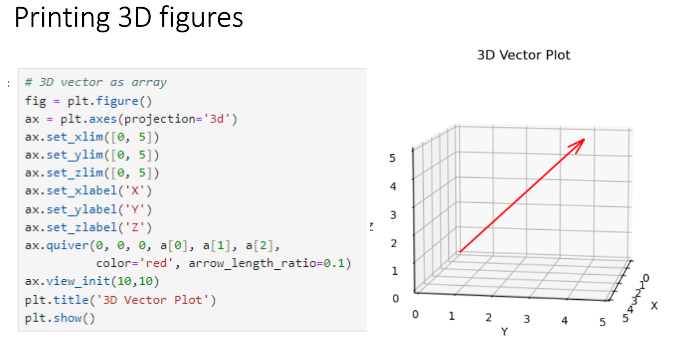

**Data Processing & More**

**Duplicate Handling**
+ Pandas:
  df.drop_duplicate()
+ Check if there are duplicates:
  duplicate = df[df.duplicated()]
  duplicate

**Modification of Pandas DataFrame**
+ When working with DataFrame you may run operations without changing the original DataFrame
+ When you do not store results into other DataFrame or use parameters like "inplace" original DataFrame is not changed, istead you just see the result of the operation.
+ Modify the DataFrame statement: inplace = True
+ Result: DataFrame is modified
+ Pandas developers recommend avoiding "inplace = True" for most use cases.

**Removing characters from string data**
+ Additional characters of spaces in the data can be removed with str.strip
+ str.lstrip cleans data from left side
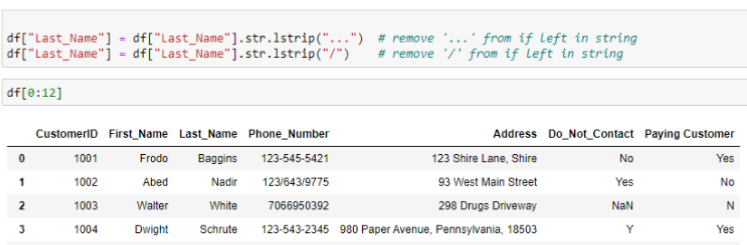

+ str.rstrip cleans data from right side
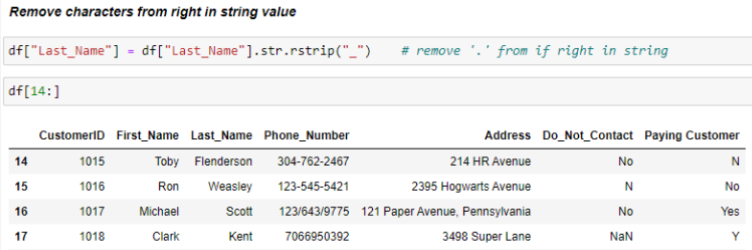

+ str.strip cleans data from both sides
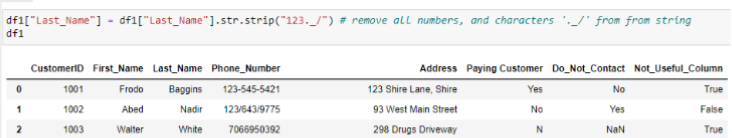

**Cleaning data containing numbers**
+ Data containing numbers can be also cleaned with "str.replace"
+ df['var'].str.replace('[characters]','new_value',regrex=True)
+ If data is not string, it must be first converted.
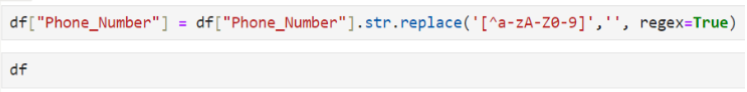

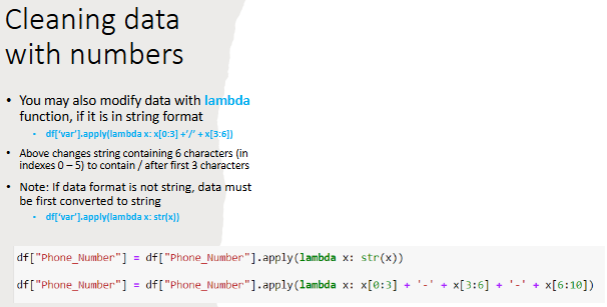

**Replacing characters in string data**
+ We can replace data in strings using lambda
+ lambda-functions may reduce the code readability and understandability
  a) Harder to debug and test
  b) Harder to reuse code
+ Using lambda-functions can be avoided
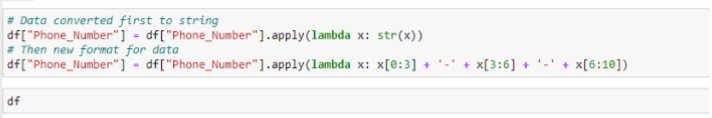

+ We can replace data in strings using str.replace
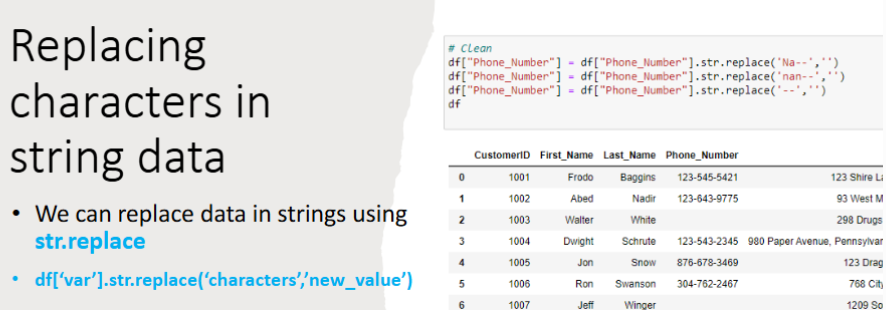

**Splitting data to new variables**
+ Data can be splitted into several variables(i.e new columns in DataFrame) using str.split
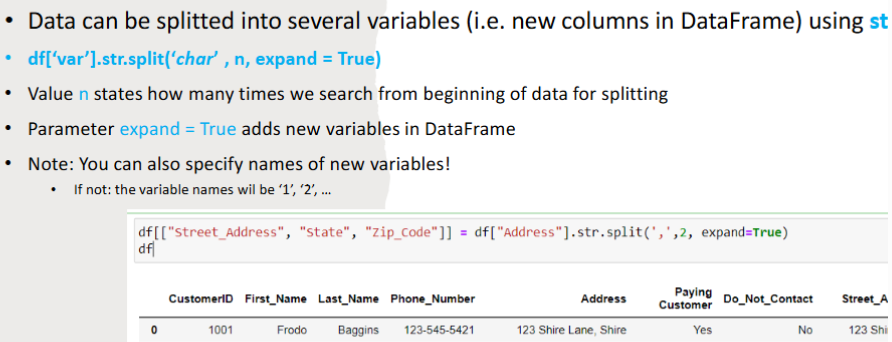


**Time Handling**


**Representing time - epoch** 

+ Time can be understood as a measured length of an interval between 2 events
+ Modern computers are very efficient in calculating with integer values
+ With both of these together, we benefit from binding a singular point in time as a reference point and using the number of seconds that has past since that moment in time to represent the value of time at current date.
+ The reference point is called an "epoch" and in Python we use the first of January on 1970.

**Timestamp**
+ Points in time after "epoch" are represented by positive numbers while points in time before the epoch are negative.
+ We can use the Python time module to access the current time in seconds since epoch
+ Here time() returns the time since epoch in seconds as a floating point value, and time_ns() returns the time since epoch in nanoseconds as an integer.
  
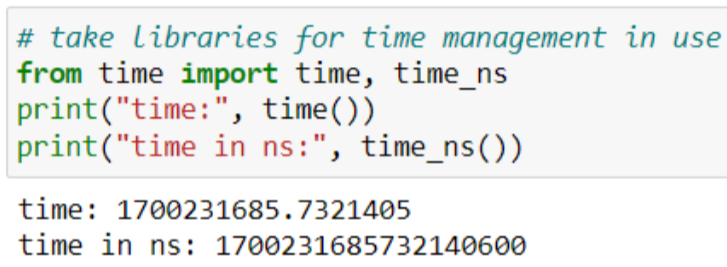

**String representation of an epoch timestamp**
+ The previously timestamps can be quite challenging for a human reader to interpret. To alleviate this, we get a string representation of the timestamp by calling ctime()-function from time module:
+ Notice how the value of time() is independent of time zone but ctime() converts that value to the system local time zone.

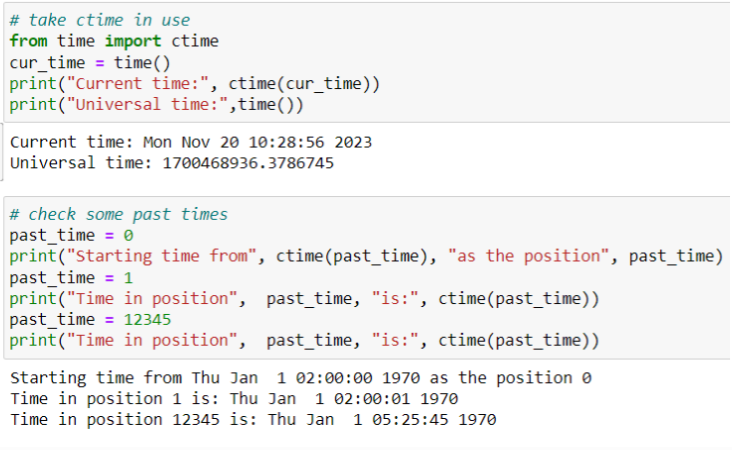

**Datetime objects**
+ Datetime module can be used to handle date objects in Python
+ datetime.now() returns the system local time
  
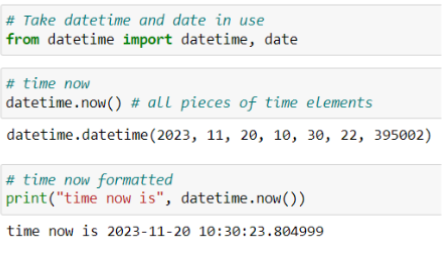

**Accessing datetime objects attributes**
+ We can easily access different parts of the datetime object.
+ Available attributes here are: year, month, day, hour, minute, second, microsecond
+ Note that the attribute names are not in plural form.

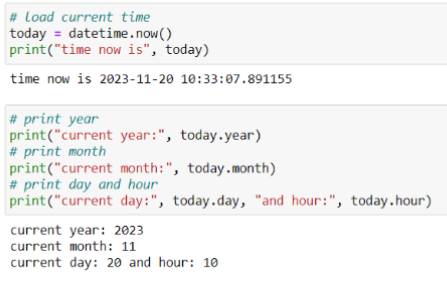

**Timezones and datetime objects**
+ We use the pytz module to help us work with timezones in Python
+ With pytz, we can create so-called timezone aware objects

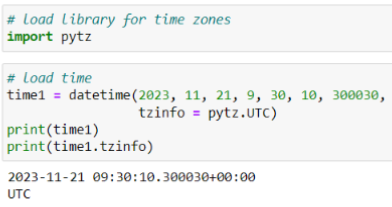

**Changing timezone with pytz datetime objects**
+ We can manipulate the timezone of a datetime object by calling the astimezone() method with a pytz timezone parameter.
+ Here we are also showing the ISO-formatted string value of the datetime object.
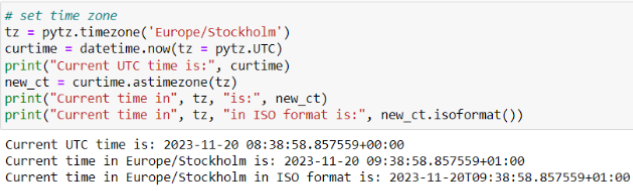

**Convert a string to datetime object**
+ Strings containing datetime info can be serialized into datetime objects using the strptime() -method with the special format string as follows:

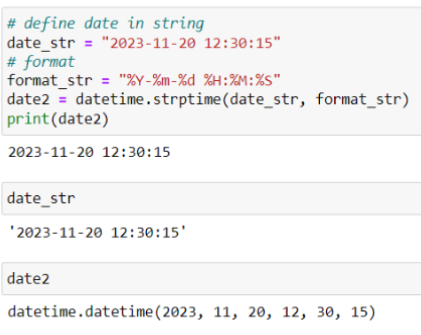

**Pandas DataFrame and dates**
+ When modifying date data in Pandas DataFrame, you need library "datetime".
+ import datetime as dt
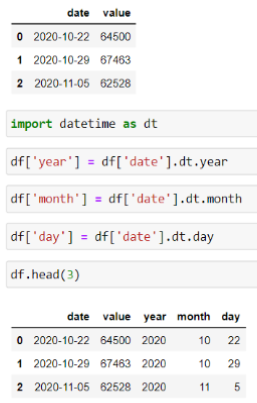

**Data Scaling, Normalization and Standardization**

**Scaling**
+ For an algorithm to perform at its best, the data should be on the same scale
+ Scaling makes it easier to build accurate and effective machine learning models
+ Feature scaling prevents that certain features are not overriding others based on their magnitude
+ The mainly used scaling methods are Standardization and Normalization.

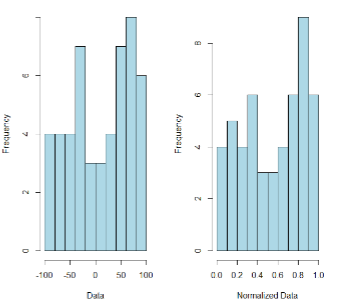

**Data Standardization**
+ (z-score) Standardization is a scaling method where the values are centered around the mean with a unit standard deviation.
+ Standard scaling is done by calculation so called "z-score" values for all the data:
  
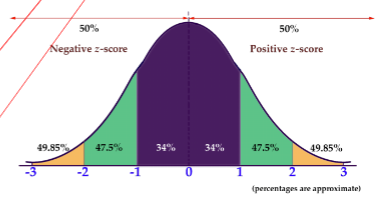

**Standardization with Python**
+ With Python, this can be done using Scikit-Learn library and StandarScaler
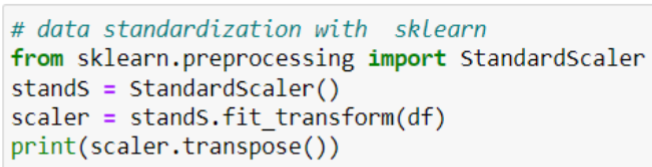

**Empirical Rule in Statistics (68-95-99.7 rule) for Normal Distribution**
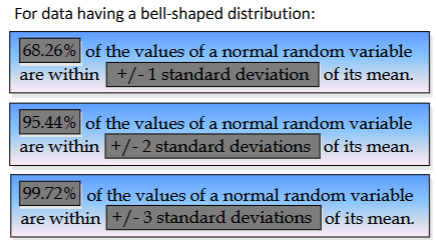

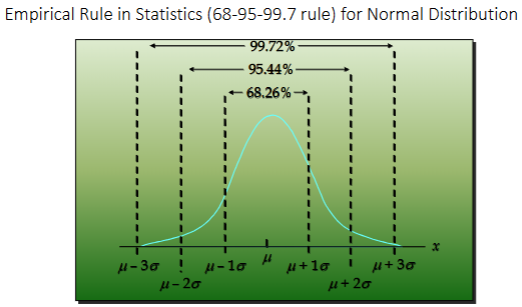

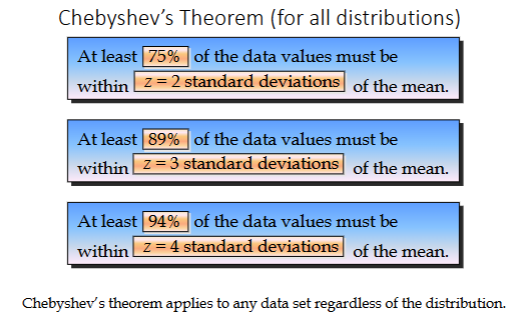

**Outliers**
+ If a z-score for a data item is beyond +/- 3std (outside the 99.7%), the original value might be considered as an outlier.
+ An outlier is an unusually small or unusually large value in a data set
+ It might be:
a) an incorrectly recorded data value
b) a data value that was incorrectly included in the data set
c) a correctly recorded data value that belongs in the data set

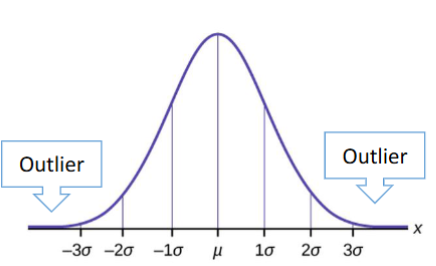

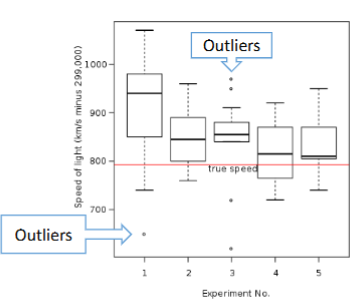

**Data Normalization**
+ Data normalization refers to scaling data values in such a way that the new values are within a specific range, typically [0,1]
+ Also known as Min-Max scaling.
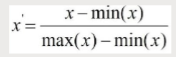

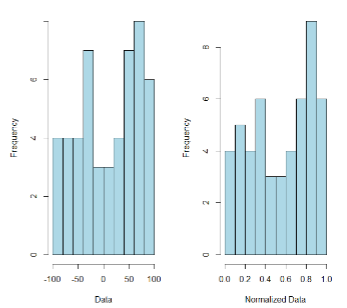

**Normalization with Python**
+ With Python, this can be done using Scikit-Learn library and MinMaxScaler
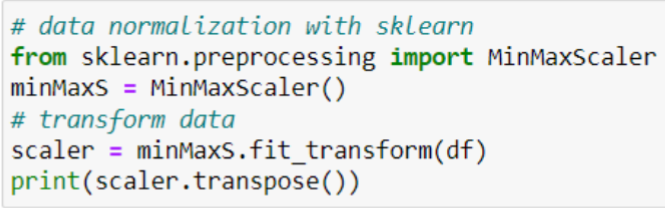


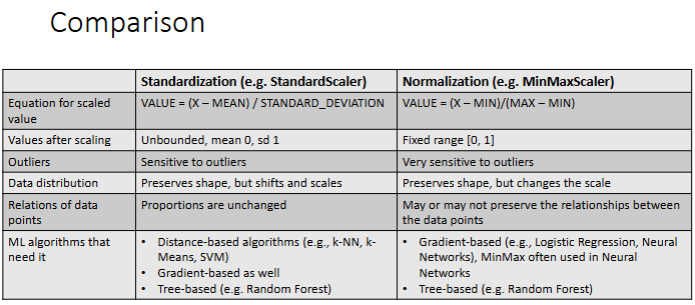

**Linear Algebra**
+ Linear Algebra is a branch of math that focuses on the study of vector spaces and linear mappings between those spaces.
+ It deals with the properties and operations of vectors, matrices, and linear equations.
+ Linear algebra is widely applied in many fields, including physics, computer science, engineering, economics, and data science, making it a foundational and essential branch of math for various applications.
+ Key concepts of linear algebra:
  a) Vectors and matrices and their operations
  b) Systems of Linear equations
  c) Vector spaces
  d) Eigenvalues and -vectors
  e) Orthogonality and projections
  f) etc.
+ Linear algebra and regression analysis
  a) regression analysis heavily relies
  b) Linear algebra provides the math foundation to many regression techniques (such as linear regression)

**Vectors**
+ Vectors are math objects that represent quantities with both magnitude and direction
+ They are often represented as ordered lists of numbers and are used to describe points in space or other math objects
+ Vectors in linear algebra provide a way to represent geometric and physical quantities and are used to model various real-world phenomena.
+ They are a fundamental building block for understanding linear transformations, solving systems of linear equations, and working with matrices.
+ Vectors are a versatile and essential concept in math and are applied in fields like physics, engineering, computer science, and data analysis.
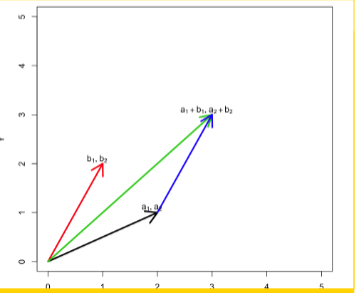

**Matrices**
+ Matrices are rectangular arrays of numbers, often used to represent linear transformations of systems of linear equations
+ They are fundamental in solving problems involving linear relationship.
+ For AI, matrices are a fundamental tool for organizing and manipulating data and for describing math relationships and transformations.
+ They enable the development of algorithms and models for various AI applications.

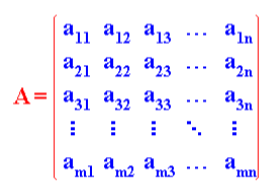

**Matrix Operations**
+ Addition and Subtraction:
  Matrices can be added or subtracted element-wise, provided they have the same dimensions.
+ Scalar Multiplication:
  A matrix can be multiplied by a scalar, which scales each element in the matrix.
+ Matrix Multiplication:
  a) Matrix multiplication is a fundamental operation in linear algebra.
  b) It involves multiplying 2 matrices to produce a new matrix.
  c) The resulting matrix's dimensions depend on the dimensions of the matrices being multiplied.
  
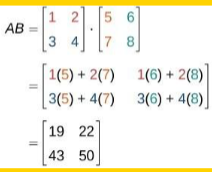

**Linear Equations**
+ Linear equations are math equations that describe a linear relationship between variables
+ A linear equation can be written in the form: ax + by = c
+ Linear algebra is used to solve systems of such equations
+ Linear equations and linear algebra play an important role in AI, from feature representation and model building to optimization and deep learning.

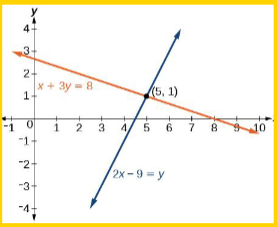

**Linear equations for ML and AI**
+ Linear equations and their systems are important for AI for several reasons:
  a) In AI, data is often represented as a set of features (variables), and linear equations provide a simple and fundamental way to express relationships among these features.
  b) Many AI and ML models are based in linear equations.

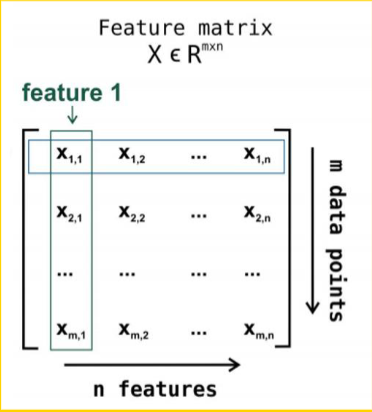

**Matrices and Vectors for ML and AI**
+ Observations that describe subject in study are presented by a matrix, where each influencing factor is in a column of the matrix as a Feature vector
+ The predicted result is correspondingly described as a Label vector.

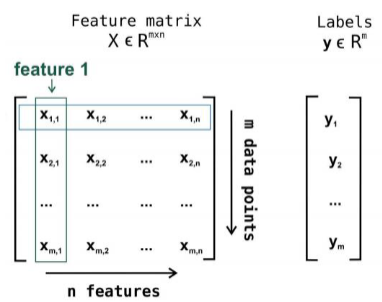

**Regression Analysis**
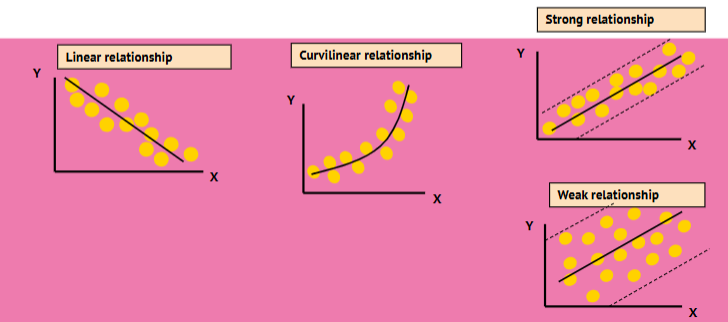
+ Regression analysis is a statistical method used to examine the relationship between one or more independent variables (inputs) and a dependent variable (output).
  
+ Regression analysis is used for:
  a) Understanding the relationship between variables
    * Finding out, if there is a relationship between variables
  b) Making predictions
  c) Identifying trends

+ Types of regression:
  
  a) Simple linear regression
  
  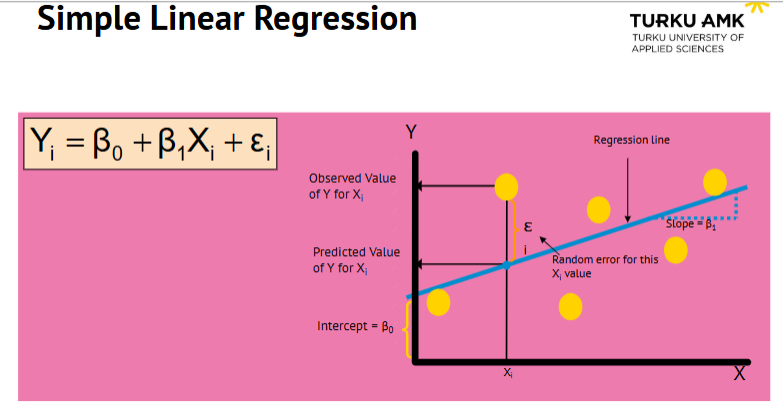
  + Create the model object
  + Fit the data
  + Find slope
  + Find intercept
  + Visualize the result

  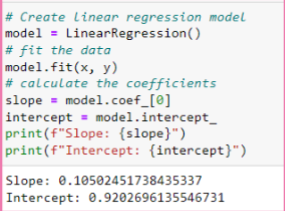

  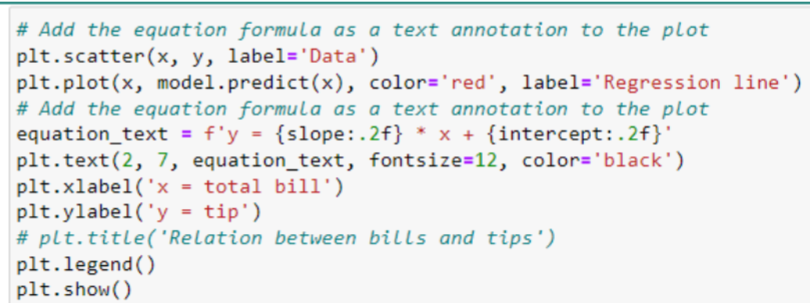

  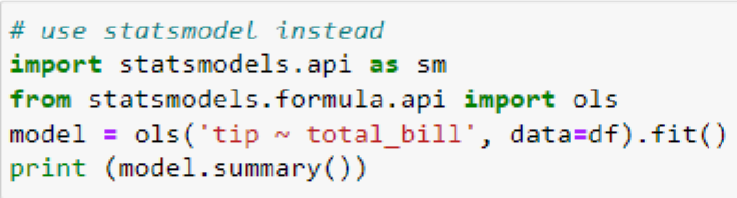
    
  b) Multiple linear regression
  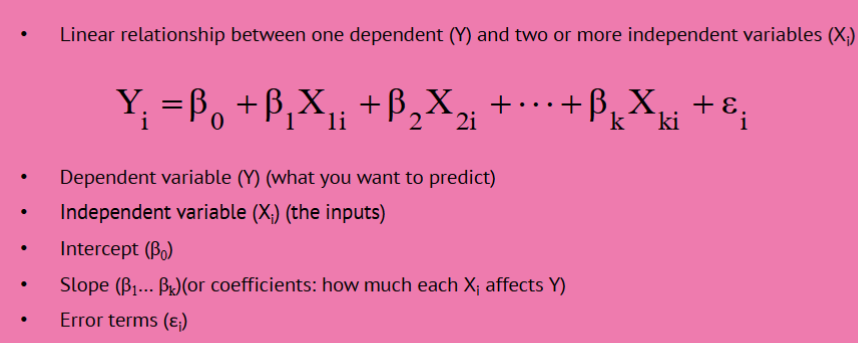

  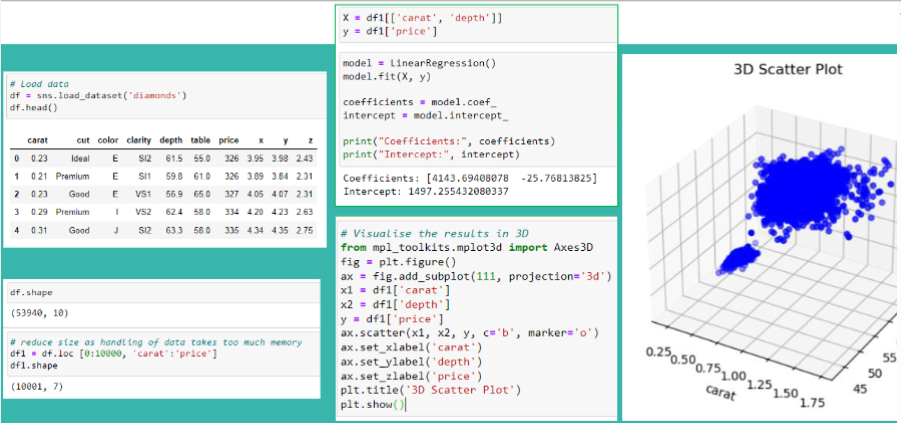

  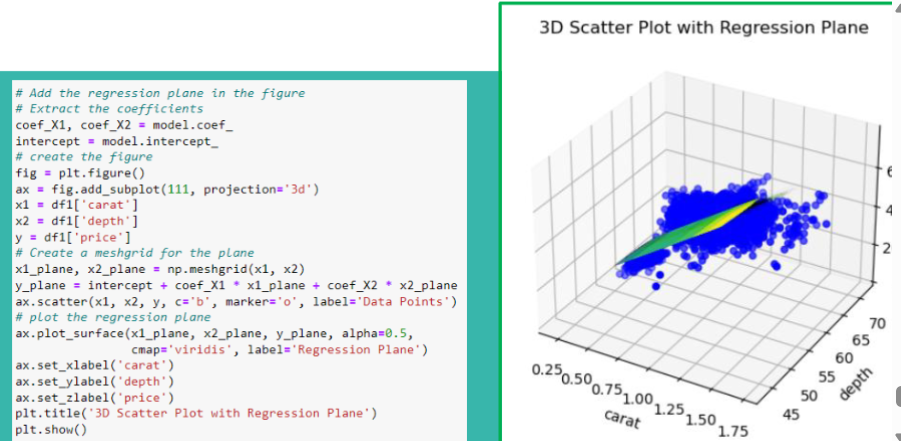
  
  c) Non-linear regression
  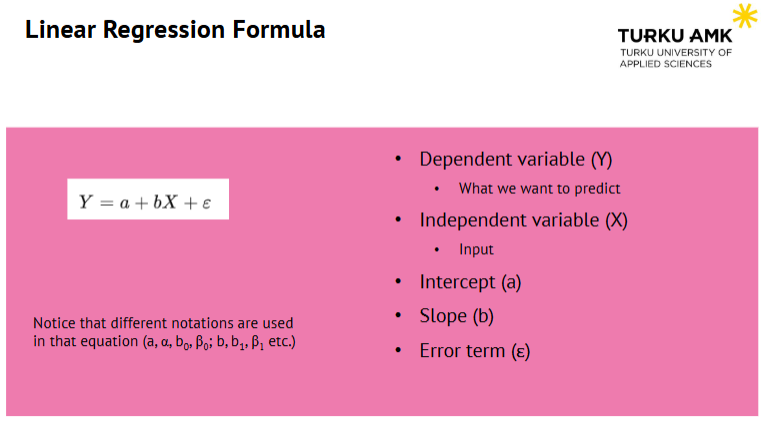

+ Meaning of the underscore (model.coef_ & model.intercept_): In scikit-learn, attributes that end with an underscore follow a naming convention that indicates they are learned during the fitting process.
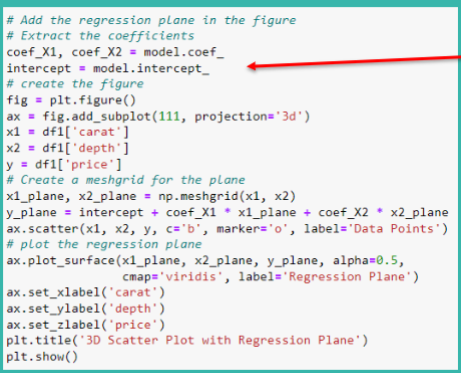



**Why Linux?**
1) High security
2) High stability
3) Ease of maintenance
4) Runs on any hardware
5) Free
6) Open source
7) Ease of use
8) Customization
9) Education
10) Support
------------------------------
1) Most data systems run on Linux
2) Command-line skills make you faster
3) Servers and cloud environments rely on it
4) Open-source ecosystem
5) Automation and scripting
6) Better troubleshooting

**Basics of Linux**
+ Linux comes in distributions (Debian, Ubuntu, Mint, Kali, Red Hat, CentOS,...)
+ Usually contains the kernel, graphical user interface (GUI) and libraries
+ Package manager to add, remove and update software
+ Means to build the kernel, install hardware drivers, install applications and utilities.
+ GUI makes the Linux use very "Windows-like"
+ Command line interface(CLI)

**Some Terminology**
+ Operating system is a software running on computer systems
+ Interface between the computer system/hardware and the user (provides GUI)
+ Has multiple other tasks as well (file and memory management, scheduling, I/O handling, etc.)
+ Operating system kernel is the core of the operating system
+ Terminal is the application that provides the CLI environment
+ Terminal is a program called terminal emulator
+ User types command to terminal and terminal passes it to a shell
+ Shell is a program that gets commands from terminal and interprets them into instructions.
+ Bash is maybe the most used shell
+ Operating system then executes the instructions
+ Prompt $ or command prompt issued by the shell
+ You can type commands when prompts is displayed
+ Shell script is a list of commands to be executed in certain order
+ Basic Linux Commands:
  
  a) ls -l: Long listing format
  
  b) mkdir: Create a new directory
  
  c) cd: Change directory
  
  d) ls -al: Lists all entries, including the ones that start with (. is current directory/ .. is parent directory)
  
  e) cat: display the contents of a file
  
  f) clear: clear the terminal screen
  
  g) cp: copies files (cp Hello.c Demo/Hello2.c)
  
  h) mv: source destination
  
  i) pwd: print working directory
  
  j) rm filename: removes a file
  
  k) rmdir directoryName: removes an empty directory
  
  l) rm -rf directoryName: r = recursive, f = force, removes also non-empty directory and all its contents (because as rm -rf really removes everything without questions)
  
  m) apt: used for package management (installing & uninstalling packages - services, programs)
  
  n) chmod: used for changing the privileges for files within the filesystem (who can read/write/execute your files)
  
  o) man: access user manuals (e.g: man chomd)
  
  p) df: show free disk space
  
  q) sudo: short form of superuser do

**Virtual Machines**

**1) Virtual Machines**
+ Software
+ Emulates physical hardware running operating system and applications

**2) Hypervisors**
+ Manages the virtual machine by anstracting and allocating physical resources from the host to the virtual machines.
+ Type 1: Runs directly on physical hardware
+ Type 2: Runs on host operating system

**Why Virtual Machines for DE&AI?** 
+ Isolation and security:
a) VMs are independent, thus they don't interfere with each other
b) Easy to go from one env to another, depending on what the current task requires
c) It can be challenging for an attacker to reach the VM running within your host system.

+ Development and testing:
a) Windows env can be challenging for system dev. The real life systems live on Linux based servers.
b) With VMs it's easy to jump from one OS to another for testing purposes

+ Recovery from system failure: Regular use of snapshots makes it easy to recover from failures. 


**Tables Basics**

**1. Pandas DataFrame:**
+ DataFrame is a 2-dimensional data structure (like a table with rows and columns) 

**2. Pandas crosstab**
+ Pandas crosstab: can be used to create cross-tabulation tables for 2 or more variables
+ Using "rownames" and "colnames", names of the variables can be changed
+ If parameter margins = True, then sums are included in the table
+ compute a frequency table (counts)

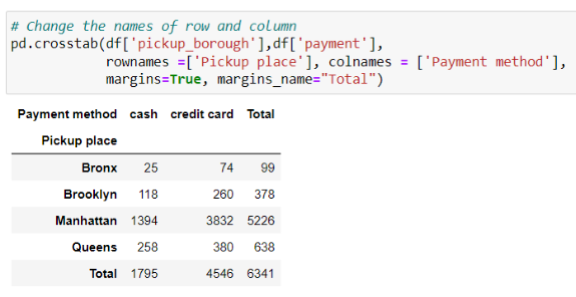

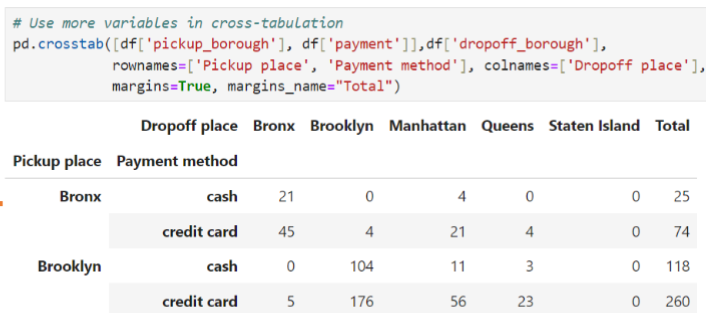

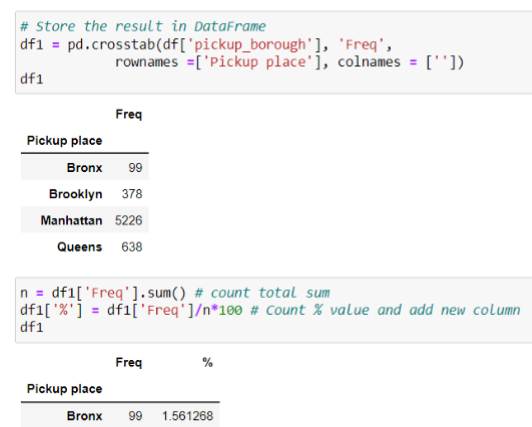

***3. Why crosstab?***
+ Crosstab offers a convenient way to do things.
+ It makes certain tasks simpler and easier to read and understand.

***4. Pandas pivot_table***
+ Pandas pivot_table method can be used to create tables
+ Parameter aggfunc defines what to include in values
+ Also cross-tabulation tables can be created using pivot_table
+ If there is no value (NaN), parameter fill_value could be used to set value.

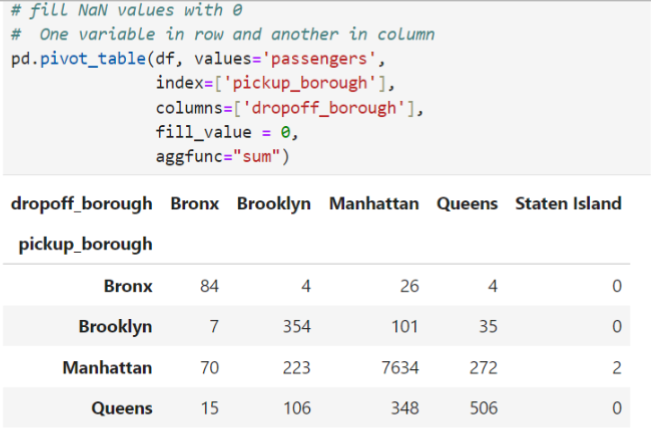

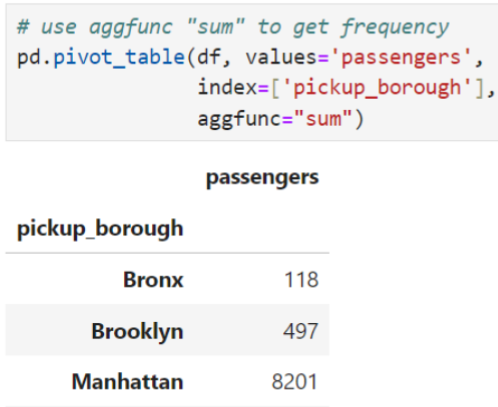

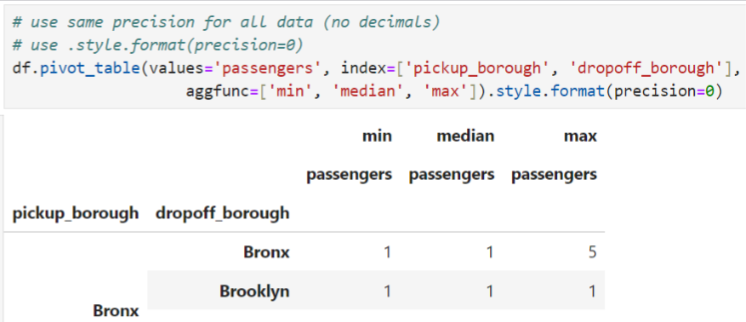


**5. Why pivot table?**
+ Pivot table combines several steps (grouping, aggregating, reshaping, handling missing values) into one step.

**6. When to use which?**
+ DataFrame: Store and Manipulate tabular data (General data handling)
+ Crosstab: Summarize data by computing counts or aggregations across categories (Simple frequency tables)
+ Pivot Table: Summarize data with more flexibility (multiple aggfunc - mean, min, max), missing values handling, margins, etc) - Complex summarization and/or multiple aggregations. 


**Databases & SQLite**

**1. What is a database?**
+ Database is an organized collection of data items. This collection is searchable and mutable.
+ We need to be able to search the collection for a data item and we need to be able to modify (usually create/update/delete items) the collection.
+ Examples of everyday databases:
  
  a) Different kinds of client registers.
  
  b) Collection of daily weather information
  
  c) CSV file with information about students and their homework.

**2. DIY Database**
+ The csv file could be used as a DIY database
+ Every row in CSV file can be seen as an entry, we can do searches to it with everything we have learnt.
+ But CSV file doesn't really solve any of the challenges that was mentioned.
+ CSV files are okay for storing info, but they make very poor databases by themselves.

**3. Challenges databases attempt to solve**
+ There are numerous different kinds of databases, but some common challenges that the databases attempt to solve can be:
  
  a) Large amounts of data: building an efficient search for database with billions of data entries
  
  b) Concurrency: multiple users attempting to access the same data item at the same time
  
  c) Exceptional situations: power outages, memory corruption and so on.

**4. Relational Databases**

  a) Relational databases constitute of tables

  b) These tables have constant columns (attributes), and the data is stored in these tables in such a way that one row is one data item. 

  c) These rows have a certain value on each of the columns as shown here: 

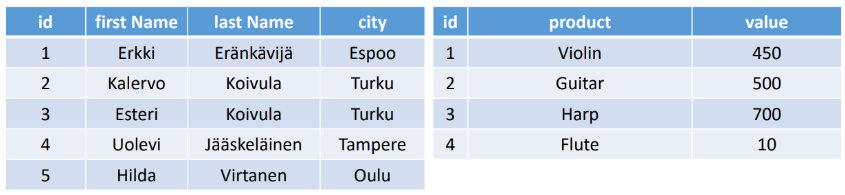

**5. Structured Query Language (SQL)**
SQL is a language that can be used to form queries to a SQL database, such as creating tables, inserting data into the tables, performing searches, fetching data, deleting data, ...

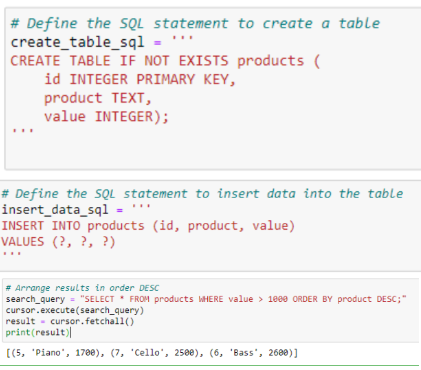

**6. SQLite**
+ SQLite is an in-process library that implements transactional SQL database engine.
+ SQLite is free for use
+ SQLite does not have a separate server process
+ SQLite reads and writes directly to ordinary disk files
+ Using library sqlite3
+ We use SQLite just for the basics Database handling

**7. Table Creation**
+ In order to create a database table we need to define the columns, their data types and we need to create a primary key for that table.
+ The primary key is used as a unique identifier for the different rows. It can be either a unique value or a composition of a number of rows.

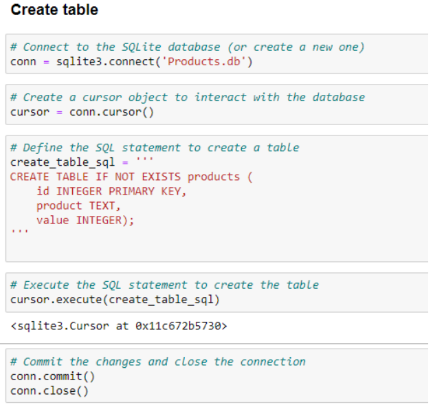

**8. Inserting data into a table**
+ In order to fill our products table with data, we need to use the INSERT INTO - query:

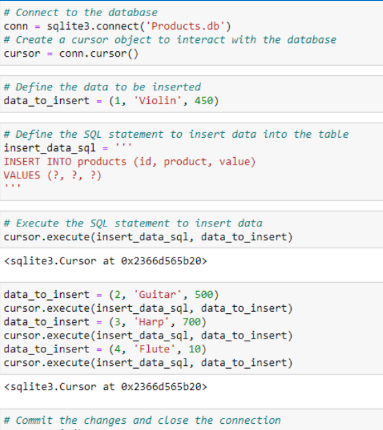


**9. Searching for information in a table**
+ SELECT * FROM tableName;
+ SELECT var2, var3 FROM tableName;
+ SELECT * FROM tableName WHERE var3 = 'value';
+ SELECT * FROM tableName WHERE var3<500 OR var3>600;
+ SELECT * FROM tableName ORDER BY var3 DESC;
  
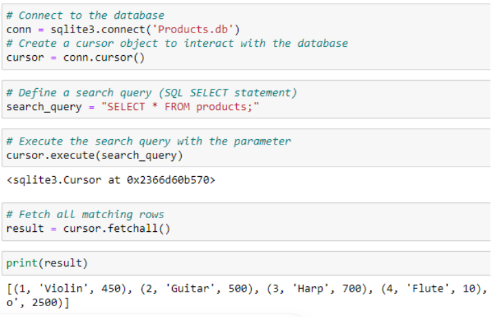

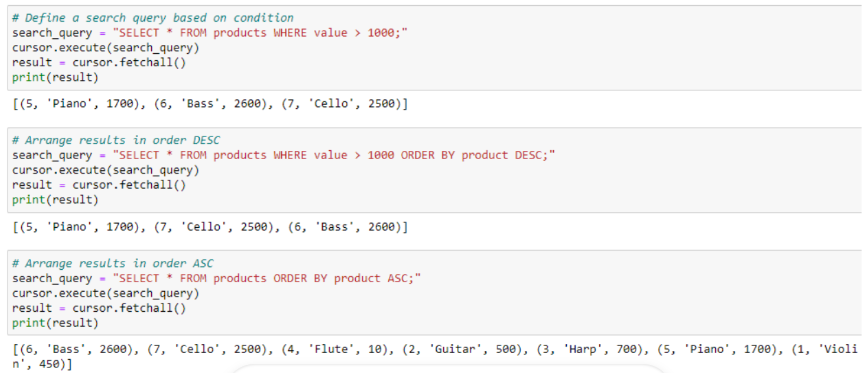

**10. Modifying the values on a table**
+ We use the UPDATE query to modify the values on a table
+ UPDATE tableName SET var3 = var3 + 5;
+ UPDATE tableName SET var3 = var3 + 5 WHERE var3 > 100;
+ UPDATE tableName SET var3 = 37 WHERE var2='value';
+ UPDATE tableName SET var3 = 37 WHERE var1 = 4;

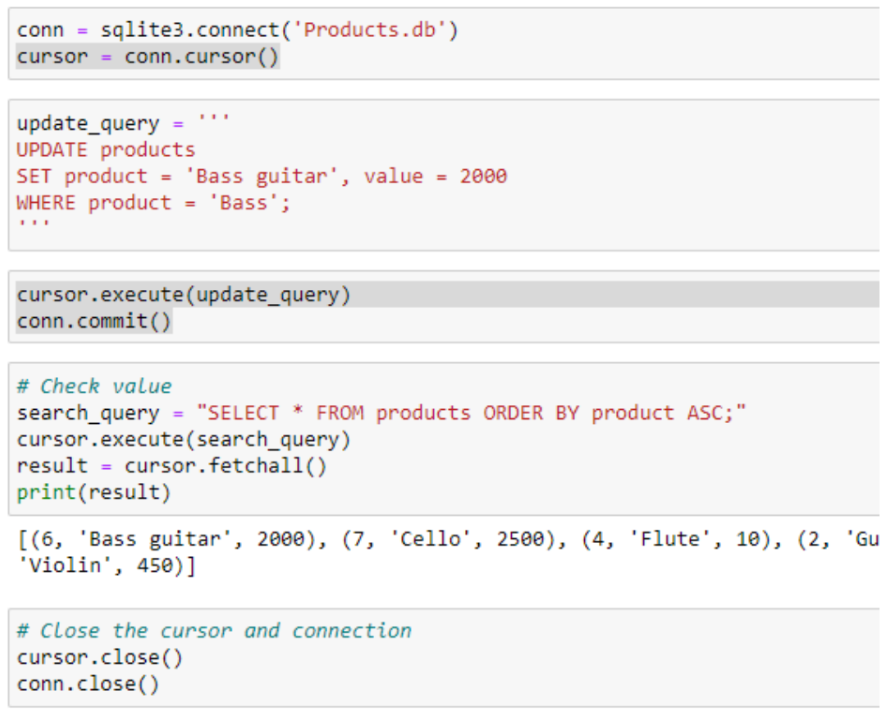

**11. Removing rows**
+ Removing rows from a table is done with the DELETE query
+ DELETE FROM tableName;
+ DELETE FROM tableName WHERE var2 = value;
  
+ If we want to remove the whole table, we use the DROP TABLE query.
+ DROP TABLE tableName; 

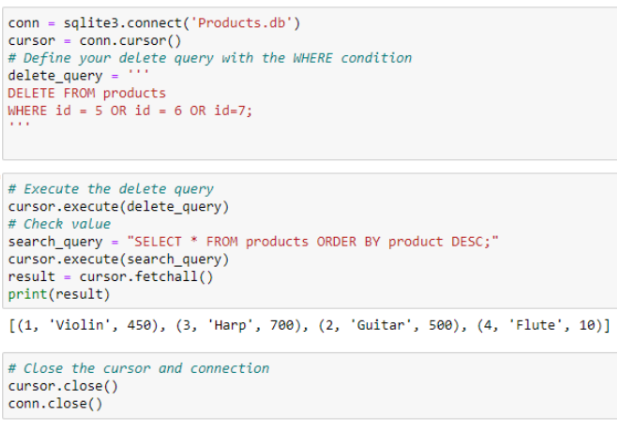

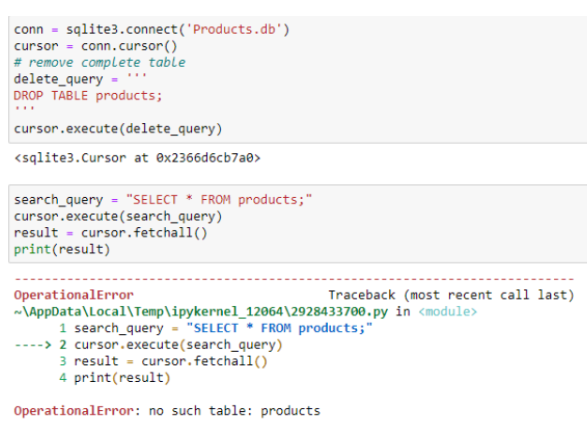


**SQLite vs PostgreSQL**

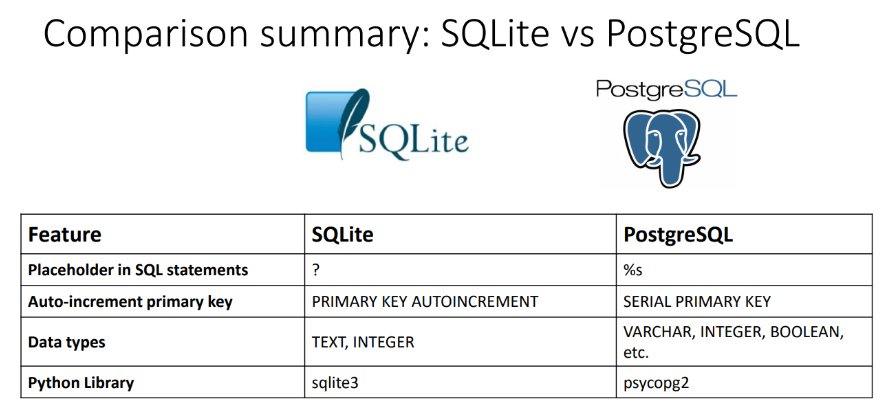

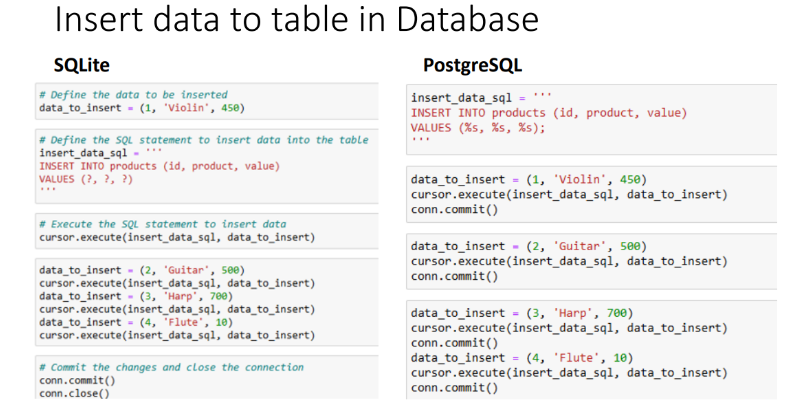

**Object Oriented History**

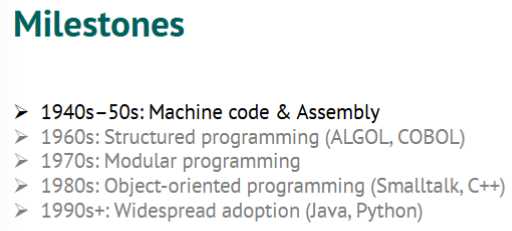

+ **Class:** like a blueprint used to create onjects. It defines the data (attributes) and behavior (methods)
+ **Object:** an instance of a class. It represents a real-world entity and contains actual values for the attributes defined in the class.
+ **Inheritance:** a mechanism where one class (child) "inherits" properties and behaviors from another class (parent). This promotes code reuse.
+ **Encapsulation:** the practice of bundling data with the methods that operate on the data. Encapsulation restricts direct access to some of them to protect the object's internal state.
+ **Interface:** defines which methods a class must implement without providing the method's actual code. Interface is independent of the classes internal implementation.

+ **OOP Pros and Cons**
  
a) Pros: modularity, maintainability, scalability
OOP influenced in the creation of design patterns.

b) Cons: complexity, performance overhead
The overhead can be signigicant, hence OOP is not often used in e.g games. 

In [99]:
import requests   # may need: pip install requests

response = requests.get("https://jsonplaceholder.typicode.com/users")
data = json.loads(response.text)
# just to have a look at the data
print(data)

[{'id': 1, 'name': 'Leanne Graham', 'username': 'Bret', 'email': 'Sincere@april.biz', 'address': {'street': 'Kulas Light', 'suite': 'Apt. 556', 'city': 'Gwenborough', 'zipcode': '92998-3874', 'geo': {'lat': '-37.3159', 'lng': '81.1496'}}, 'phone': '1-770-736-8031 x56442', 'website': 'hildegard.org', 'company': {'name': 'Romaguera-Crona', 'catchPhrase': 'Multi-layered client-server neural-net', 'bs': 'harness real-time e-markets'}}, {'id': 2, 'name': 'Ervin Howell', 'username': 'Antonette', 'email': 'Shanna@melissa.tv', 'address': {'street': 'Victor Plains', 'suite': 'Suite 879', 'city': 'Wisokyburgh', 'zipcode': '90566-7771', 'geo': {'lat': '-43.9509', 'lng': '-34.4618'}}, 'phone': '010-692-6593 x09125', 'website': 'anastasia.net', 'company': {'name': 'Deckow-Crist', 'catchPhrase': 'Proactive didactic contingency', 'bs': 'synergize scalable supply-chains'}}, {'id': 3, 'name': 'Clementine Bauch', 'username': 'Samantha', 'email': 'Nathan@yesenia.net', 'address': {'street': 'Douglas Exten

In [101]:
# Format data better using indent = 2
print(json.dumps(data, indent = 2))  

[
  {
    "id": 1,
    "name": "Leanne Graham",
    "username": "Bret",
    "email": "Sincere@april.biz",
    "address": {
      "street": "Kulas Light",
      "suite": "Apt. 556",
      "city": "Gwenborough",
      "zipcode": "92998-3874",
      "geo": {
        "lat": "-37.3159",
        "lng": "81.1496"
      }
    },
    "phone": "1-770-736-8031 x56442",
    "website": "hildegard.org",
    "company": {
      "name": "Romaguera-Crona",
      "catchPhrase": "Multi-layered client-server neural-net",
      "bs": "harness real-time e-markets"
    }
  },
  {
    "id": 2,
    "name": "Ervin Howell",
    "username": "Antonette",
    "email": "Shanna@melissa.tv",
    "address": {
      "street": "Victor Plains",
      "suite": "Suite 879",
      "city": "Wisokyburgh",
      "zipcode": "90566-7771",
      "geo": {
        "lat": "-43.9509",
        "lng": "-34.4618"
      }
    },
    "phone": "010-692-6593 x09125",
    "website": "anastasia.net",
    "company": {
      "name": "Deckow-Crist

In [111]:
# Read data to Pandas DataFrame
df = pd.DataFrame(data)
df.head(3)

,id,name,username,email,address,phone,website,company
0,1,Leanne Graham,Bret,Sincere@april.biz,"{'street': 'Kulas Light', 'suite': 'Apt. 556',...",1-770-736-8031 x56442,hildegard.org,"{'name': 'Romaguera-Crona', 'catchPhrase': 'Mu..."
1,2,Ervin Howell,Antonette,Shanna@melissa.tv,"{'street': 'Victor Plains', 'suite': 'Suite 87...",010-692-6593 x09125,anastasia.net,"{'name': 'Deckow-Crist', 'catchPhrase': 'Proac..."
2,3,Clementine Bauch,Samantha,Nathan@yesenia.net,"{'street': 'Douglas Extension', 'suite': 'Suit...",1-463-123-4447,ramiro.info,"{'name': 'Romaguera-Jacobson', 'catchPhrase': ..."


In [113]:
# Read csv.file "Hiking.csv" to Pandas DataFrame
hike = pd.read_csv('Hiking.csv')
hike.head(3)

,Activity Type,Date,Favorite,Title,Distance,Calories,Time,Avg HR,Max HR,Aerobic TE,...,Min Temp,Surface Interval,Decompression,Best Lap Time,Number of Laps,Max Temp,Moving Time,Elapsed Time,Min Elevation,Max Elevation
0,Hiking,2023-08-26 17:33:07,False,Pöytyä Savonranta lenkki auto n 10 km lopussa ...,"10,00",566,02:15:19,91,157,"1,8",...,"22,0",0:00,No,00:07.27,3,"29,0",02:15:19,03:49:46,-91,-72
1,Hiking,2023-08-02 12:48:21,False,Nousiainen Patikointi,"9,11",721,03:29:01,85,140,"1,5",...,"21,0",0:00,No,24:47.69,2,"26,0",02:55:51,03:55:14,32,57
2,Hiking,2023-07-21 13:04:05,False,Nousiainen Patikointi,"2,41",340,02:29:57,72,97,"1,1",...,"25,0",0:00,No,02:29:57.11,1,"30,0",00:45:25,02:29:57,55,65


In [115]:
# Modify first the data to contain columns:
# ['Date', 'Distance', 'Calories', 'Time', 'Avg HR', 'Max HR', 'Min Elevation', 'Max Elevation']
 
hike = hike[['Date', 'Distance', 'Calories', 'Time', 'Avg HR', 'Max HR', 'Min Elevation', 'Max Elevation']]
hike.head()

,Date,Distance,Calories,Time,Avg HR,Max HR,Min Elevation,Max Elevation
0,2023-08-26 17:33:07,"10,00",566,02:15:19,91,157,-91,-72
1,2023-08-02 12:48:21,"9,11",721,03:29:01,85,140,32,57
2,2023-07-21 13:04:05,"2,41",340,02:29:57,72,97,55,65
3,2023-07-19 09:15:28,"7,29",723,02:55:42,95,155,137,212
4,2023-07-18 14:31:07,"12,34",1.406,05:43:28,98,136,142,221


In [117]:
hike.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 197 entries, 0 to 196
Data columns (total 8 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   Date           197 non-null    object
 1   Distance       197 non-null    object
 2   Calories       197 non-null    object
 3   Time           197 non-null    object
 4   Avg HR         197 non-null    int64 
 5   Max HR         197 non-null    int64 
 6   Min Elevation  197 non-null    object
 7   Max Elevation  197 non-null    object
dtypes: int64(2), object(6)
memory usage: 12.4+ KB


In [119]:
hike.isna().sum()

Date             0
Distance         0
Calories         0
Time             0
Avg HR           0
Max HR           0
Min Elevation    0
Max Elevation    0
dtype: int64

In [121]:
# Then clean the data that you are able to calculate (descriptive statistics) measurements for following numeric data
# ['Distance', 'Calories', 'Avg HR', 'Max HR', 'Min Elevation', 'Max Elevation']

cols = ['Distance', 'Calories', 'Avg HR', 'Max HR', 'Min Elevation', 'Max Elevation']

#Replace ',' in the data in these columns with '.'
for col in cols: 
    hike[col] = hike[col].apply(lambda x: x.replace(',','.') if isinstance(x, str) else x)

hike[cols] = hike[cols].apply(pd.to_numeric, errors='coerce')

#Fill na:
hike['Distance'] = hike['Distance'].fillna(hike['Distance'].mean())
hike['Min Elevation'] = hike['Min Elevation'].fillna(hike['Min Elevation'].mean())
hike['Max Elevation'] = hike['Max Elevation'].fillna(hike['Max Elevation'].mean())
hike['Calories'] = hike['Calories'].fillna(hike['Calories'].mean())

#show the data
hike.tail(100)

,Date,Distance,Calories,Time,Avg HR,Max HR,Min Elevation,Max Elevation
97,2020-05-12 17:28:10,4.50,446.000,01:39:42,101,151,42.00000,55.000000
98,2020-05-11 19:10:19,3.16,136.000,00:45:32,80,110,48.00000,63.000000
99,2020-04-19 17:27:20,5.97,352.000,01:08:49,103,142,-81.00000,-60.000000
100,2020-04-17 06:52:02,3.65,191.000,00:40:50,98,124,-53.00000,-36.000000
101,2020-04-16 17:27:47,5.71,342.000,01:05:00,105,140,-51.00000,-31.000000
...,...,...,...,...,...,...,...,...
192,2016-06-12 11:15:57,13.40,472.000,03:08:59,76,116,68.00000,76.000000
193,2016-06-11 14:51:11,5.42,320.000,01:09:17,0,0,64.00000,77.000000
194,2016-06-11 12:09:53,5.94,358.000,01:36:48,0,0,65.00000,76.000000
195,2015-06-25 10:45:00,20.11,1.286,05:52:35,86,133,86.49501,118.585565


In [123]:
# Add in the data 3 new columns:
# 'Year' (based on 'Time') (Note: you need to convert first type of 'Time' to datetime)
# 'Elevation_diff' (based on 'Min Elevation' and 'Max Elevation': Max - Min)
# 'HR_diff' (based on 'Max HR' and 'Avg HR': Max - Avg)

hike['Date'] = pd.to_datetime(hike['Date'])
hike['Year'] = hike['Date'].dt.year
hike['Elevation_diff'] = hike['Max Elevation'] - hike['Min Elevation']
hike['HR_diff'] = hike['Max HR'] - hike['Avg HR']

hike.head()


,Date,Distance,Calories,Time,Avg HR,Max HR,Min Elevation,Max Elevation,Year,Elevation_diff,HR_diff
0,2023-08-26 17:33:07,10.00,566.000,02:15:19,91,157,-91.0,-72.0,2023,19.0,66
1,2023-08-02 12:48:21,9.11,721.000,03:29:01,85,140,32.0,57.0,2023,25.0,55
2,2023-07-21 13:04:05,2.41,340.000,02:29:57,72,97,55.0,65.0,2023,10.0,25
3,2023-07-19 09:15:28,7.29,723.000,02:55:42,95,155,137.0,212.0,2023,75.0,60
4,2023-07-18 14:31:07,12.34,1.406,05:43:28,98,136,142.0,221.0,2023,79.0,38


In [125]:
# Then remove then colunmns 'Min Elevation' and 'Max Elevation' from DataFrame
drop_col = ['Min Elevation', 'Max Elevation']
hike = hike.drop(columns = drop_col)
hike.columns


Index(['Date', 'Distance', 'Calories', 'Time', 'Avg HR', 'Max HR', 'Year',
       'Elevation_diff', 'HR_diff'],
      dtype='object')

In [127]:
# Then show descriptive statistics for the numeric data
hike.describe()

,Date,Distance,Calories,Avg HR,Max HR,Year,Elevation_diff,HR_diff
count,197,197.000000,197.000000,197.000000,197.000000,197.000000,197.000000,197.000000
mean,2020-02-09 07:16:32.461928704,5.784619,311.456577,85.426396,121.588832,2019.598985,32.090554,36.162437
min,2015-06-24 15:51:44,0.020000,1.114000,0.000000,0.000000,2015.000000,-542.915000,0.000000
25%,2018-09-09 19:12:16,3.230000,156.000000,82.000000,115.000000,2018.000000,14.000000,28.000000
50%,2020-05-11 19:10:19,4.610000,285.000000,90.000000,129.000000,2020.000000,19.000000,37.000000
75%,2021-04-03 13:32:29,7.490000,415.000000,96.000000,140.000000,2021.000000,31.000000,47.000000
max,2023-08-26 17:33:07,24.150000,998.000000,131.000000,182.000000,2023.000000,587.000000,73.000000
std,NaN,3.839901,214.757808,24.019144,35.163880,1.817320,86.768438,16.286780


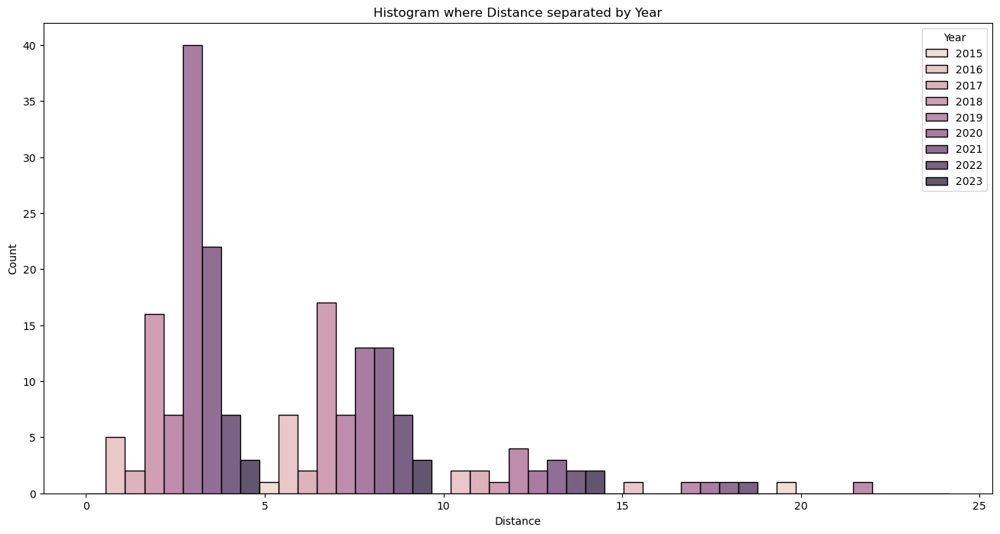

In [129]:
# Make figure where 'Distance' is presented separated by 'Year'
plt.figure(figsize=(16,8))
sns.histplot(data = hike, x='Distance', hue='Year', multiple = 'dodge', bins = 5)
plt.xlabel('Distance')
plt.ylabel('Count')
plt.title('Histogram where Distance separated by Year')
plt.show()

<Axes: xlabel='Type', ylabel='Heart Rate'>

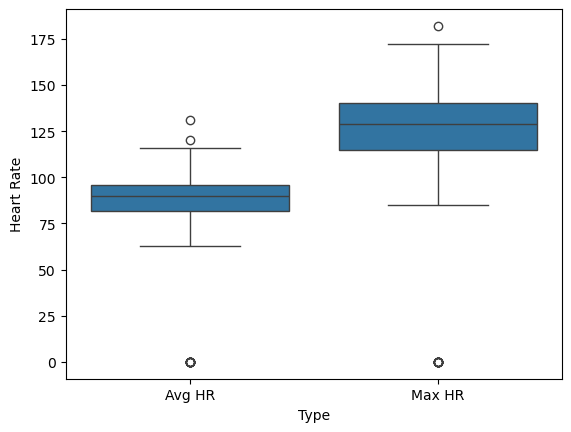

In [131]:
# Make figures that shows data distribution for 'Avg HR' and 'Max HR'
df_melt = hike.melt(value_vars=['Avg HR', 'Max HR'], var_name='Type', value_name='Heart Rate')
sns.boxplot(data=df_melt, x='Type', y='Heart Rate')


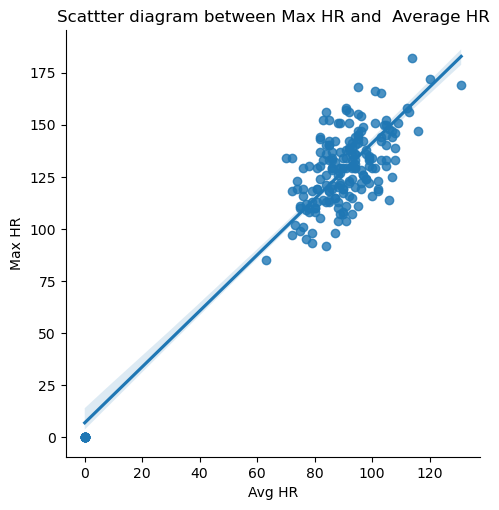

In [143]:
# Make figure where is showed relation between 'Avg HR' and 'Max Hr'
sns.lmplot(data = hike, x = 'Avg HR', y = 'Max HR') 
plt.title ('Scattter diagram between Max HR and  Average HR')
plt.show()

In [135]:
# Find correlation between 'Avg HR' and 'Max HR'

# Calculate correlation (r) and R²
r = hike['Avg HR'].corr(hike['Max HR'])
print("Correlation (r):", r)
print("R²:", r**2)

Correlation (r): 0.9164971507000671
R²: 0.8399670272413415


As r = 0.9175 is a very strong positive correlation between Avg HR and Max HR. 
So when Avg HR increases, Max HR also tends to increase almost proportionally. 

In [140]:
# Make figure or table that shows in which year there was hiked most based on total 'Distance'

# Tổng quãng đường theo năm
hike_pivot = hike.pivot_table(values='Distance', index='Year', aggfunc='sum', fill_value=0)
year_hike_most = hike_pivot['Distance'].idxmax()
print(hike_pivot)
print("The year there was hiked most based on total Distance is: ",year_hike_most)

      Distance
Year          
2015     28.70
2016    105.02
2017     43.06
2018    177.61
2019    160.91
2020    257.70
2021    213.39
2022    102.80
2023     50.38
The year there was hiked most based on total Distance is:  2020


2. Handling of JSON data (5 p)
Read JSON object strings from

https://jsonplaceholder.typicode.com/todos
Then format it with indenting.

Find all action points NOT Completed from user having userId = 2 and and print them

Store the JSON object for the user in file JSON format (uncompleted tasks for userId 2)

Then read the data from JSON file to Pandas DataFrame and print the DataFrame contents for user with userId = 2.

In [145]:
# Read JSON object
response = requests.get("https://jsonplaceholder.typicode.com/todos")
data = json.loads(response.text)
print(data)

[{'userId': 1, 'id': 1, 'title': 'delectus aut autem', 'completed': False}, {'userId': 1, 'id': 2, 'title': 'quis ut nam facilis et officia qui', 'completed': False}, {'userId': 1, 'id': 3, 'title': 'fugiat veniam minus', 'completed': False}, {'userId': 1, 'id': 4, 'title': 'et porro tempora', 'completed': True}, {'userId': 1, 'id': 5, 'title': 'laboriosam mollitia et enim quasi adipisci quia provident illum', 'completed': False}, {'userId': 1, 'id': 6, 'title': 'qui ullam ratione quibusdam voluptatem quia omnis', 'completed': False}, {'userId': 1, 'id': 7, 'title': 'illo expedita consequatur quia in', 'completed': False}, {'userId': 1, 'id': 8, 'title': 'quo adipisci enim quam ut ab', 'completed': True}, {'userId': 1, 'id': 9, 'title': 'molestiae perspiciatis ipsa', 'completed': False}, {'userId': 1, 'id': 10, 'title': 'illo est ratione doloremque quia maiores aut', 'completed': True}, {'userId': 1, 'id': 11, 'title': 'vero rerum temporibus dolor', 'completed': True}, {'userId': 1, 'i

In [147]:
# Then print it with indenting
print(json.dumps(data, indent=2))

[
  {
    "userId": 1,
    "id": 1,
    "title": "delectus aut autem",
    "completed": false
  },
  {
    "userId": 1,
    "id": 2,
    "title": "quis ut nam facilis et officia qui",
    "completed": false
  },
  {
    "userId": 1,
    "id": 3,
    "title": "fugiat veniam minus",
    "completed": false
  },
  {
    "userId": 1,
    "id": 4,
    "title": "et porro tempora",
    "completed": true
  },
  {
    "userId": 1,
    "id": 5,
    "title": "laboriosam mollitia et enim quasi adipisci quia provident illum",
    "completed": false
  },
  {
    "userId": 1,
    "id": 6,
    "title": "qui ullam ratione quibusdam voluptatem quia omnis",
    "completed": false
  },
  {
    "userId": 1,
    "id": 7,
    "title": "illo expedita consequatur quia in",
    "completed": false
  },
  {
    "userId": 1,
    "id": 8,
    "title": "quo adipisci enim quam ut ab",
    "completed": true
  },
  {
    "userId": 1,
    "id": 9,
    "title": "molestiae perspiciatis ipsa",
    "completed": false
  },
  

In [149]:
# Find all action points NOT Completed from user having userId = 2 and and print them

df_2 = pd.DataFrame(data)
df_2

,userId,id,title,completed
0,1,1,delectus aut autem,False
1,1,2,quis ut nam facilis et officia qui,False
2,1,3,fugiat veniam minus,False
3,1,4,et porro tempora,True
4,1,5,laboriosam mollitia et enim quasi adipisci qui...,False
...,...,...,...,...
195,10,196,consequuntur aut ut fugit similique,True
196,10,197,dignissimos quo nobis earum saepe,True
197,10,198,quis eius est sint explicabo,True
198,10,199,numquam repellendus a magnam,True


In [151]:
filtered_df2 = df_2.loc[(df_2['userId'] == 2) & (df_2['completed'] == False)]
print(filtered_df2)

    userId  id                                              title  completed
20       2  21  suscipit repellat esse quibusdam voluptatem in...      False
22       2  23  et itaque necessitatibus maxime molestiae qui ...      False
23       2  24  adipisci non ad dicta qui amet quaerat dolorib...      False
27       2  28                  nesciunt totam sit blanditiis sit      False
28       2  29                                laborum aut in quam      False
30       2  31          repudiandae totam in est sint facere fuga      False
31       2  32                 earum doloribus ea doloremque quis      False
32       2  33                                  sint sit aut vero      False
33       2  34          porro aut necessitatibus eaque distinctio      False
36       2  37                                   sunt cum tempora      False
37       2  38                                     totam quia non      False
38       2  39  doloremque quibusdam asperiores libero corrupt...      False

In [153]:
# Store the JSON object for the user in file JSON format (uncompleted tasks for userId 2)
filtered_df2.to_json("uncompleted_tasks_user_id2.json")

In [155]:
# Then read the data from JSON file to Pandas DataFrame and print the DataFrame contents for user with userId = 2
pd.read_json("uncompleted_tasks_user_id2.json")

,userId,id,title,completed
20,2,21,suscipit repellat esse quibusdam voluptatem in...,False
22,2,23,et itaque necessitatibus maxime molestiae qui ...,False
23,2,24,adipisci non ad dicta qui amet quaerat dolorib...,False
27,2,28,nesciunt totam sit blanditiis sit,False
28,2,29,laborum aut in quam,False
30,2,31,repudiandae totam in est sint facere fuga,False
31,2,32,earum doloribus ea doloremque quis,False
32,2,33,sint sit aut vero,False
33,2,34,porro aut necessitatibus eaque distinctio,False
36,2,37,sunt cum tempora,False


3. Use SQLite and complete following: (5 p)
Create SQLite database 'Happy23.db'
Create table 'happy' that contain variables
id SERIAL PRIMARY KEY
country TEXT
happiness REAL
hlife REAL
gdp REAL
Then read data from CSV file 'WHR2023.csv' and add following data to the database table:

'Country name' to 'country'
'Ladder score' to 'happiness'
'Healthy life expectancy' to 'hlife'
'Logged GDP per capita' to gdp
Then read the data from the database where Ladder score (happiness) is higher than 7.3 and show the results ordered by Healthy life expectancy (hlife) starting by the largest value

Compare the results with orginal data by showing CSV data in Pandas DataFrame with same condition

In [159]:
# Create SQLite database 'Happy23.db'
# Create table 'happy' that contain variables
#   id SERIAL PRIMARY KEY
#   country TEXT
#   happiness REAL
#   hlife REAL
#   gdp REAL

conn = sqlite3.connect('Happy23.db')

create_table_sql = ''' 
CREATE TABLE IF NOT EXISTS happy (
    id SERIAL PRIMARY KEY,
    country TEXT,
    happiness REAL,
    hlife REAL,
    gdp REAL);
'''

cursor = conn.cursor() 

#Execute the SQL statement to create the table
cursor.execute(create_table_sql)

#Commit the changes and close the connection
conn.commit()
conn.close()

In [161]:
# Read data from CSV file 'WHR2023.csv' and add following data to the database table:
#  'Country name' to 'country'
#  'Ladder score' to 'happiness'
#  'Healthy life expectancy' to 'hlife'
#  'Logged GDP per capita' to gdp


# Read CSV file
df_3 = pd.read_csv('WHR2023.csv')
df_3.head()


,Country name,Ladder score,Standard error of ladder score,upperwhisker,lowerwhisker,Logged GDP per capita,Social support,Healthy life expectancy,Freedom to make life choices,Generosity,Perceptions of corruption,Ladder score in Dystopia,Explained by: Log GDP per capita,Explained by: Social support,Explained by: Healthy life expectancy,Explained by: Freedom to make life choices,Explained by: Generosity,Explained by: Perceptions of corruption,Dystopia + residual
0,Finland,7.804,0.036,7.875,7.733,10.792,0.969,71.150,0.961,-0.019,0.182,1.778,1.888,1.585,0.535,0.772,0.126,0.535,2.363
1,Denmark,7.586,0.041,7.667,7.506,10.962,0.954,71.250,0.934,0.134,0.196,1.778,1.949,1.548,0.537,0.734,0.208,0.525,2.084
2,Iceland,7.530,0.049,7.625,7.434,10.896,0.983,72.050,0.936,0.211,0.668,1.778,1.926,1.620,0.559,0.738,0.250,0.187,2.250
3,Israel,7.473,0.032,7.535,7.411,10.639,0.943,72.697,0.809,-0.023,0.708,1.778,1.833,1.521,0.577,0.569,0.124,0.158,2.691
4,Netherlands,7.403,0.029,7.460,7.346,10.942,0.930,71.550,0.887,0.213,0.379,1.778,1.942,1.488,0.545,0.672,0.251,0.394,2.110


In [163]:
conn = sqlite3.connect('Happy23.db')
cursor = conn.cursor()

# Select and rename columns
df_3 = df_3[['Country name', 'Ladder score', 'Healthy life expectancy', 'Logged GDP per capita']]
df_3.columns = ['country', 'happiness', 'hlife', 'gdp']

# Insert data into SQLite table
for _, row in df_3.iterrows():
    cursor.execute('INSERT INTO happy (country, happiness, hlife, gdp) VALUES (?, ?, ?, ?)',
                   (row['country'], row['happiness'], row['hlife'], row['gdp']))

conn.commit()
conn.close()


In [165]:
# Then read the data from the database where Ladder score (happiness) is higher than 7.3 
# and show the results ordered by Healthy life expectancy (hlife) starting by the largest value


conn = sqlite3.connect('Happy23.db')
query = """
SELECT *
FROM happy
WHERE happiness > 7.3
ORDER BY hlife DESC;
"""

df_3 = pd.read_sql_query(query, conn)

conn.commit()
conn.close()

df_3

,id,country,happiness,hlife,gdp
0,None,Israel,7.473,72.697,10.639
1,None,Sweden,7.395,72.150,10.883
2,None,Iceland,7.530,72.050,10.896
3,None,Netherlands,7.403,71.550,10.942
4,None,Norway,7.315,71.500,11.088
5,None,Denmark,7.586,71.250,10.962
6,None,Finland,7.804,71.150,10.792


In [167]:
# Compare the results with orginal data by showing CSV data in Pandas DataFrame with same condition
df_3 = pd.read_csv('WHR2023.csv')
df_3 = df_3.loc[(df_3['Ladder score'] > 7.3)].sort_values(by='Healthy life expectancy', ascending = False)
df_3 = df_3[['Country name', 'Ladder score', 'Healthy life expectancy', 'Logged GDP per capita']]
df_3

,Country name,Ladder score,Healthy life expectancy,Logged GDP per capita
3,Israel,7.473,72.697,10.639
5,Sweden,7.395,72.150,10.883
2,Iceland,7.530,72.050,10.896
4,Netherlands,7.403,71.550,10.942
6,Norway,7.315,71.500,11.088
1,Denmark,7.586,71.250,10.962
0,Finland,7.804,71.150,10.792


In [169]:
# Creation of DataFrame 'df'
# Use Dictionary to store the values
values = {'Name':['Joe','Suzy','Leena','Ville','Kalle','Mary','Jim'],
          'Age':[26,25,30,32,34,25,23], 
          'Points':[6,4,2,3,4,5,6], 
          'Gender':['male','female','female','male','male','female','male']}
df = pd.DataFrame(values) 
df  # present the DataFrame
# First column contains index, starting from 0
# First row contains names of the variable  
# Each row contains index and values for all data per variable 

,Name,Age,Points,Gender
0,Joe,26,6,male
1,Suzy,25,4,female
2,Leena,30,2,female
3,Ville,32,3,male
4,Kalle,34,4,male
5,Mary,25,5,female
6,Jim,23,6,male


In [171]:
# mean of the variable Points
df.Points.mean()

4.285714285714286

In [173]:
# Descriptive statistics for all the variables 
df.describe()

,Age,Points
count,7.000000,7.000000
mean,27.857143,4.285714
std,4.140393,1.496026
min,23.000000,2.000000
25%,25.000000,3.500000
50%,26.000000,4.000000
75%,31.000000,5.500000
max,34.000000,6.000000


In [175]:
#Mean
import pandas as pd
values = {'Name':['Joe','Suzy','Leena','Ville','Kalle','Mary','Jim'],
          'Age':[26,25,30,32,34,25,23], 
          'Points':[6,4,2,3,4,5,6], 
          'Gender':['male','female','female','male','male','female','male']}
df = pd.DataFrame(values) 
mean = df.Points.mean()
print(mean) 

4.285714285714286


In [177]:
#Standard deviation
standard_deviation = df.Points.std()
print(standard_deviation)

1.4960264830861911


In [179]:
#Median
median = df.Points.median()
print(median)

4.0


Read Excel-sheet containing data for following variables
'Travellers.xlsx'

Gender (of the person)
How (person like to travel)
Age (of the person)
Target (type of the trip)
Money_used (person uses during a trip in Euros)
Favorite_country (person like to travel)
Trips_year (person typically has in year)
Trip_Length (person has typicall in days)

In [182]:
# Load some data from Excel file
trips = pd.read_excel("Travellers.xlsx" ,sheet_name='Data')  
trips.head()

,Gender,How,Age,Target,Money_used,Favorite_country,Trips_year,Trip_Length
0,Male,Alone,23,Towns,800,Italy,3,3
1,Female,Alone,21,Beach,1000,Spain,1,7
2,Female,Friends,27,Towns,1200,Italy,3,4
3,Male,Family,42,Beach,3000,Greece,2,7
4,Female,Family,37,Beach,3800,Greece,2,7


In [184]:
import pandas as pd
df = pd.DataFrame(trips)
#mean
mean = df.Money_used.mean()
print(mean)


1570.0


In [186]:
#standard_deviation
standard_deviation = df.Money_used.std()
print(standard_deviation)

831.8037243830037


In [188]:
#median
median = df.Money_used.median()
print(median)

1200.0


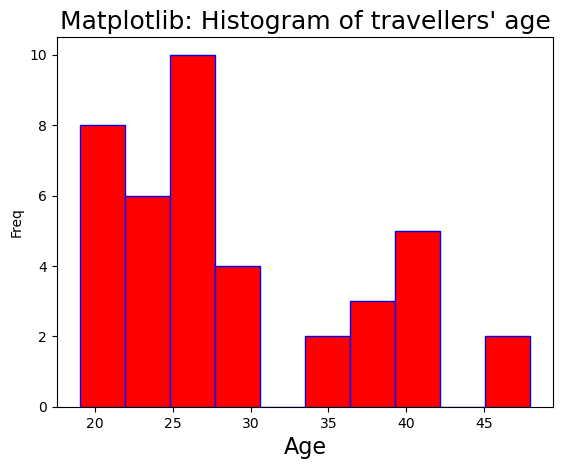

In [190]:
plt.hist(trips.Age, bins=10, color='r',edgecolor='blue')   
plt.xlabel('Age', fontsize=16)
plt.ylabel("Freq")
plt.title("Matplotlib: Histogram of travellers' age", fontsize=18)
plt.show() 

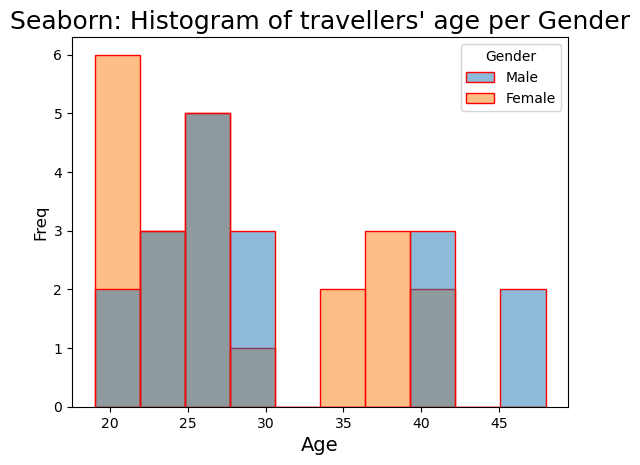

In [192]:
sns.histplot(data = trips, x= 'Age', color='yellow', 
             edgecolor ='red',bins=10, hue = 'Gender') 
plt.xlabel('Age', fontsize=14)
plt.ylabel('Freq', fontsize=12)   
plt.title("Seaborn: Histogram of travellers' age per Gender", fontsize=18)
plt.show()

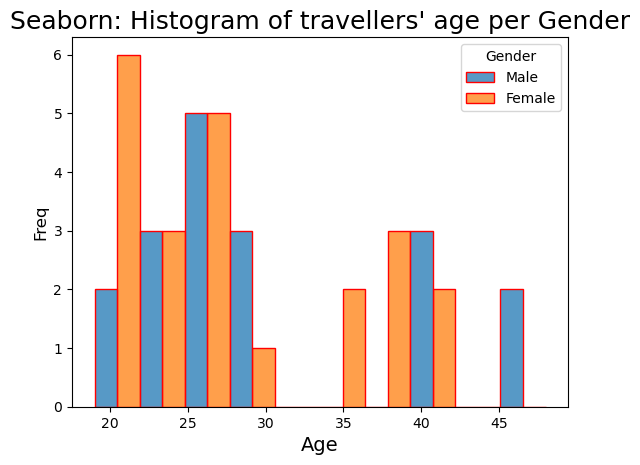

In [194]:
sns.histplot(data = trips, x= 'Age', color='yellow', 
             edgecolor ='red',bins=10, hue = 'Gender', multiple = 'dodge') 
plt.xlabel('Age', fontsize=14)
plt.ylabel('Freq', fontsize=12)   
plt.title("Seaborn: Histogram of travellers' age per Gender", fontsize=18)
plt.show()

In [196]:
# see dataset available
sns.get_dataset_names()

['anagrams',
 'anscombe',
 'attention',
 'brain_networks',
 'car_crashes',
 'diamonds',
 'dots',
 'dowjones',
 'exercise',
 'flights',
 'fmri',
 'geyser',
 'glue',
 'healthexp',
 'iris',
 'mpg',
 'penguins',
 'planets',
 'seaice',
 'taxis',
 'tips',
 'titanic']

In [198]:
tips = sns.load_dataset('tips')
tips.head()

,total_bill,tip,sex,smoker,day,time,size
0,16.99,1.01,Female,No,Sun,Dinner,2
1,10.34,1.66,Male,No,Sun,Dinner,3
2,21.01,3.50,Male,No,Sun,Dinner,3
3,23.68,3.31,Male,No,Sun,Dinner,2
4,24.59,3.61,Female,No,Sun,Dinner,4


In [200]:
# Info about data and types
tips.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 244 entries, 0 to 243
Data columns (total 7 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   total_bill  244 non-null    float64 
 1   tip         244 non-null    float64 
 2   sex         244 non-null    category
 3   smoker      244 non-null    category
 4   day         244 non-null    category
 5   time        244 non-null    category
 6   size        244 non-null    int64   
dtypes: category(4), float64(2), int64(1)
memory usage: 7.4 KB


In [202]:
# Read data in CSV format to DataFrame
df = pd.read_csv("heart-disease.csv")
df.head(10)

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
0,63,1,3,145,233,1,0,150,0,2.3,0,0,1,1
1,37,1,2,130,250,0,1,187,0,3.5,0,0,2,1
2,41,0,1,130,204,0,0,172,0,1.4,2,0,2,1
3,56,1,1,120,236,0,1,178,0,0.8,2,0,2,1
4,57,0,0,120,354,0,1,163,1,0.6,2,0,2,1
5,57,1,0,140,192,0,1,148,0,0.4,1,0,1,1
6,56,0,1,140,294,0,0,153,0,1.3,1,0,2,1
7,44,1,1,120,263,0,1,173,0,0.0,2,0,3,1
8,52,1,2,172,199,1,1,162,0,0.5,2,0,3,1
9,57,1,2,150,168,0,1,174,0,1.6,2,0,2,1


In [204]:
# present structure: number of rows (observations) and columns (variables)
print(f"Number of rows: {df.shape[0]}")
print(f"Number of columns: {df.shape[1]}")

Number of rows: 303
Number of columns: 14


In [206]:
# present beginning of DataFrame
df.head(5)

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
0,63,1,3,145,233,1,0,150,0,2.3,0,0,1,1
1,37,1,2,130,250,0,1,187,0,3.5,0,0,2,1
2,41,0,1,130,204,0,0,172,0,1.4,2,0,2,1
3,56,1,1,120,236,0,1,178,0,0.8,2,0,2,1
4,57,0,0,120,354,0,1,163,1,0.6,2,0,2,1


In [208]:
# present end of DataFrame
df.tail(5)

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
298,57,0,0,140,241,0,1,123,1,0.2,1,0,3,0
299,45,1,3,110,264,0,1,132,0,1.2,1,0,3,0
300,68,1,0,144,193,1,1,141,0,3.4,1,2,3,0
301,57,1,0,130,131,0,1,115,1,1.2,1,1,3,0
302,57,0,1,130,236,0,0,174,0,0.0,1,1,2,0


In [210]:
# present descriptive statistics of DataFrame
df.describe()

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
count,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000
mean,54.366337,0.683168,0.966997,131.623762,246.264026,0.148515,0.528053,149.646865,0.326733,1.039604,1.399340,0.729373,2.313531,0.544554
std,9.082101,0.466011,1.032052,17.538143,51.830751,0.356198,0.525860,22.905161,0.469794,1.161075,0.616226,1.022606,0.612277,0.498835
min,29.000000,0.000000,0.000000,94.000000,126.000000,0.000000,0.000000,71.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,47.500000,0.000000,0.000000,120.000000,211.000000,0.000000,0.000000,133.500000,0.000000,0.000000,1.000000,0.000000,2.000000,0.000000
50%,55.000000,1.000000,1.000000,130.000000,240.000000,0.000000,1.000000,153.000000,0.000000,0.800000,1.000000,0.000000,2.000000,1.000000
75%,61.000000,1.000000,2.000000,140.000000,274.500000,0.000000,1.000000,166.000000,1.000000,1.600000,2.000000,1.000000,3.000000,1.000000
max,77.000000,1.000000,3.000000,200.000000,564.000000,1.000000,2.000000,202.000000,1.000000,6.200000,2.000000,4.000000,3.000000,1.000000


In [212]:
# Check if there is not applicable data (NaN)
df.isna().any()

age         False
sex         False
cp          False
trestbps    False
chol        False
fbs         False
restecg     False
thalach     False
exang       False
oldpeak     False
slope       False
ca          False
thal        False
target      False
dtype: bool

In [214]:
# Check data types
print(df.dtypes)

age           int64
sex           int64
cp            int64
trestbps      int64
chol          int64
fbs           int64
restecg       int64
thalach       int64
exang         int64
oldpeak     float64
slope         int64
ca            int64
thal          int64
target        int64
dtype: object


In [216]:
# Present variable names
print(df.columns)

Index(['age', 'sex', 'cp', 'trestbps', 'chol', 'fbs', 'restecg', 'thalach',
       'exang', 'oldpeak', 'slope', 'ca', 'thal', 'target'],
      dtype='object')


In [218]:
# make new DataFrame containg only variables 'age', 'sex', 'chol', 'oldpeak', 'slope', 'target'
df2 = df[['age', 'sex', 'chol', 'oldpeak', 'slope', 'target']]
print(df2)

     age  sex  chol  oldpeak  slope  target
0     63    1   233      2.3      0       1
1     37    1   250      3.5      0       1
2     41    0   204      1.4      2       1
3     56    1   236      0.8      2       1
4     57    0   354      0.6      2       1
..   ...  ...   ...      ...    ...     ...
298   57    0   241      0.2      1       0
299   45    1   264      1.2      1       0
300   68    1   193      3.4      1       0
301   57    1   131      1.2      1       0
302   57    0   236      0.0      1       0

[303 rows x 6 columns]


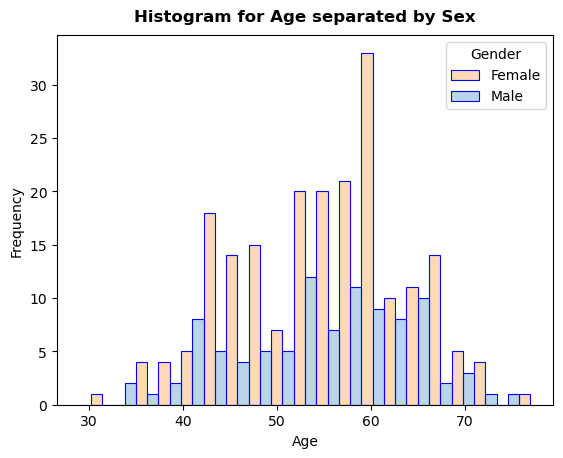

In [220]:
# Create histogram for variable 'age' separated by 'sex'
import seaborn as sns
import matplotlib.pyplot as plt

sns.histplot(data=df2, x='age', hue='sex', bins=20, edgecolor='blue', alpha=0.3, multiple='dodge')
plt.xlabel("Age")
plt.ylabel("Frequency")
plt.title("Histogram for Age separated by Sex", fontweight="bold", pad=10)
plt.legend(title="Gender", labels=["Female", "Male"])  # Đổi nhãn legend nếu muốn
plt.show()

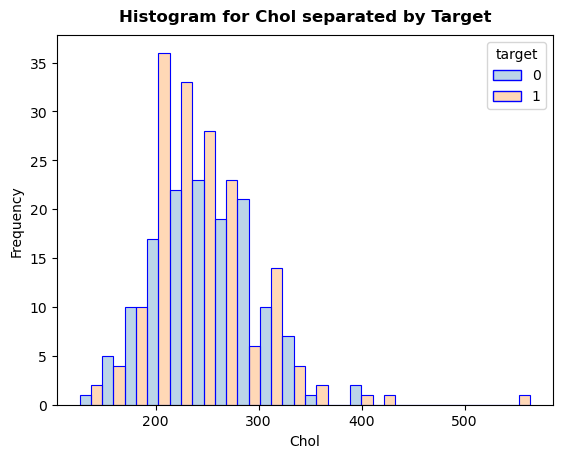

In [222]:
# Create histogram for variable 'chol' separated by 'target' with separate bar per target
sns.histplot(data=df2, x='chol', hue='target', bins=20, edgecolor='blue', multiple='dodge', alpha=0.3)
plt.xlabel("Chol")
plt.ylabel("Frequency")
plt.title("Histogram for Chol separated by Target", fontweight = "bold", pad = 10)
plt.show()

In [224]:
# Load data
df = sns.load_dataset('titanic')
print("Size of DataFrame (rows, columns)", df.shape)
df.head()

Size of DataFrame (rows, columns) (891, 15)


,survived,pclass,sex,age,sibsp,parch,fare,embarked,class,who,adult_male,deck,embark_town,alive,alone
0,0,3,male,22.0,1,0,7.2500,S,Third,man,True,NaN,Southampton,no,False
1,1,1,female,38.0,1,0,71.2833,C,First,woman,False,C,Cherbourg,yes,False
2,1,3,female,26.0,0,0,7.9250,S,Third,woman,False,NaN,Southampton,yes,True
3,1,1,female,35.0,1,0,53.1000,S,First,woman,False,C,Southampton,yes,False
4,0,3,male,35.0,0,0,8.0500,S,Third,man,True,NaN,Southampton,no,True


***iloc - Selecting data based on its index***

Rows are given numerical values <start>:<end>
- The rows from index <start> to <end> -1 are selected
- For example, 5:7, the values of the 5th and 6th rows are selected
- If you don't give the start AND end values of the rows, but only : , then all rows
- -1 means the last row

Columns respectively
- For example 2:5, when the columns from 2 to 4 are selected
- If you don't give the start AND end numbers of the columns, but only : , then all columns
- -1 means the last column


##### Examples with rows and columns
- iloc[5:7, 2:5] selects data from rows 5 and 6 and columns 2, 3 and 4
- iloc[ : , 0:1 ] selects data from all rows and the first column
- iloc[ : , -1] selects data from all rows and the the last column

In [227]:
df.iloc [0:3,0:8]  # rows in indexes 0-2 and columns in index 0-7

,survived,pclass,sex,age,sibsp,parch,fare,embarked
0,0,3,male,22.0,1,0,7.2500,S
1,1,1,female,38.0,1,0,71.2833,C
2,1,3,female,26.0,0,0,7.9250,S


In [229]:
# Show alla rows for columns 2 - 9 using iloc
df.iloc[:,2:10]

,sex,age,sibsp,parch,fare,embarked,class,who
0,male,22.0,1,0,7.2500,S,Third,man
1,female,38.0,1,0,71.2833,C,First,woman
2,female,26.0,0,0,7.9250,S,Third,woman
3,female,35.0,1,0,53.1000,S,First,woman
4,male,35.0,0,0,8.0500,S,Third,man
...,...,...,...,...,...,...,...,...
886,male,27.0,0,0,13.0000,S,Second,man
887,female,19.0,0,0,30.0000,S,First,woman
888,female,NaN,1,2,23.4500,S,Third,woman
889,male,26.0,0,0,30.0000,C,First,man


loc selects the values of columns by specifying the column names for specified rows

- Rows are given numerical values (if them are not renamed to have names)
- Variable names are given as columns.
- Note: if you like select several variables you specify the the first and last

##### Example:

- loc [:, 'carat' ] selects the values of the variable 'carat' from all rows
- loc [0:5, 'color':'price'] selects the values of the variables from 'color' to 'price' from rows 0-4

In [232]:
df.loc [:15, 'survived':'embark_town']  # first rows 0 - 15 and columns from 'survived' to 'embark_town' 

,survived,pclass,sex,age,sibsp,parch,fare,embarked,class,who,adult_male,deck,embark_town
0,0,3,male,22.0,1,0,7.2500,S,Third,man,True,NaN,Southampton
1,1,1,female,38.0,1,0,71.2833,C,First,woman,False,C,Cherbourg
2,1,3,female,26.0,0,0,7.9250,S,Third,woman,False,NaN,Southampton
3,1,1,female,35.0,1,0,53.1000,S,First,woman,False,C,Southampton
4,0,3,male,35.0,0,0,8.0500,S,Third,man,True,NaN,Southampton
5,0,3,male,NaN,0,0,8.4583,Q,Third,man,True,NaN,Queenstown
6,0,1,male,54.0,0,0,51.8625,S,First,man,True,E,Southampton
7,0,3,male,2.0,3,1,21.0750,S,Third,child,False,NaN,Southampton
8,1,3,female,27.0,0,2,11.1333,S,Third,woman,False,NaN,Southampton
9,1,2,female,14.0,1,0,30.0708,C,Second,child,False,NaN,Cherbourg


In [234]:
# Show first 10 rows for last 5 variables in the dataframe using loc
df.loc[0:9, 'adult_male':'alone']

,adult_male,deck,embark_town,alive,alone
0,True,NaN,Southampton,no,False
1,False,C,Cherbourg,yes,False
2,False,NaN,Southampton,yes,True
3,False,C,Southampton,yes,False
4,True,NaN,Southampton,no,True
5,True,NaN,Queenstown,no,True
6,True,E,Southampton,no,True
7,False,NaN,Southampton,no,False
8,False,NaN,Southampton,yes,False
9,False,NaN,Cherbourg,yes,False


In [236]:
# remove unnessary columns
df.drop(columns = 'alive')

,survived,pclass,sex,age,sibsp,parch,fare,embarked,class,who,adult_male,deck,embark_town,alone
0,0,3,male,22.0,1,0,7.2500,S,Third,man,True,NaN,Southampton,False
1,1,1,female,38.0,1,0,71.2833,C,First,woman,False,C,Cherbourg,False
2,1,3,female,26.0,0,0,7.9250,S,Third,woman,False,NaN,Southampton,True
3,1,1,female,35.0,1,0,53.1000,S,First,woman,False,C,Southampton,False
4,0,3,male,35.0,0,0,8.0500,S,Third,man,True,NaN,Southampton,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
886,0,2,male,27.0,0,0,13.0000,S,Second,man,True,NaN,Southampton,True
887,1,1,female,19.0,0,0,30.0000,S,First,woman,False,B,Southampton,True
888,0,3,female,NaN,1,2,23.4500,S,Third,woman,False,NaN,Southampton,False
889,1,1,male,26.0,0,0,30.0000,C,First,man,True,C,Cherbourg,True


In [238]:
df.drop(columns = ['parch', 'embarked', 'who','alive'])

,survived,pclass,sex,age,sibsp,fare,class,adult_male,deck,embark_town,alone
0,0,3,male,22.0,1,7.2500,Third,True,NaN,Southampton,False
1,1,1,female,38.0,1,71.2833,First,False,C,Cherbourg,False
2,1,3,female,26.0,0,7.9250,Third,False,NaN,Southampton,True
3,1,1,female,35.0,1,53.1000,First,False,C,Southampton,False
4,0,3,male,35.0,0,8.0500,Third,True,NaN,Southampton,True
...,...,...,...,...,...,...,...,...,...,...,...
886,0,2,male,27.0,0,13.0000,Second,True,NaN,Southampton,True
887,1,1,female,19.0,0,30.0000,First,False,B,Southampton,True
888,0,3,female,NaN,1,23.4500,Third,False,NaN,Southampton,False
889,1,1,male,26.0,0,30.0000,First,True,C,Cherbourg,True


In [240]:
# Result in same DataFrame
df = df.drop(columns = ['parch', 'embarked', 'who','alive'])
df.head()

,survived,pclass,sex,age,sibsp,fare,class,adult_male,deck,embark_town,alone
0,0,3,male,22.0,1,7.2500,Third,True,NaN,Southampton,False
1,1,1,female,38.0,1,71.2833,First,False,C,Cherbourg,False
2,1,3,female,26.0,0,7.9250,Third,False,NaN,Southampton,True
3,1,1,female,35.0,1,53.1000,First,False,C,Southampton,False
4,0,3,male,35.0,0,8.0500,Third,True,NaN,Southampton,True


In [242]:
# Remove columns 'adult_male' and 'sibsp'
df = df.drop(columns = ['adult_male','sibsp'])
df.head()

,survived,pclass,sex,age,fare,class,deck,embark_town,alone
0,0,3,male,22.0,7.2500,Third,NaN,Southampton,False
1,1,1,female,38.0,71.2833,First,C,Cherbourg,False
2,1,3,female,26.0,7.9250,Third,NaN,Southampton,True
3,1,1,female,35.0,53.1000,First,C,Southampton,False
4,0,3,male,35.0,8.0500,Third,NaN,Southampton,True


In [244]:
# Result contain only rows where all variables have data
df2 = df.dropna()
df2.info()

<class 'pandas.core.frame.DataFrame'>
Index: 182 entries, 1 to 889
Data columns (total 9 columns):
 #   Column       Non-Null Count  Dtype   
---  ------       --------------  -----   
 0   survived     182 non-null    int64   
 1   pclass       182 non-null    int64   
 2   sex          182 non-null    object  
 3   age          182 non-null    float64 
 4   fare         182 non-null    float64 
 5   class        182 non-null    category
 6   deck         182 non-null    category
 7   embark_town  182 non-null    object  
 8   alone        182 non-null    bool    
dtypes: bool(1), category(2), float64(2), int64(2), object(2)
memory usage: 11.0+ KB


In [246]:
agemean = df.age.mean()
agemean

29.69911764705882

In [248]:
df['age'] = df['age'].fillna(agemean) #Store mean value as the variable 'age' if value is missing
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 9 columns):
 #   Column       Non-Null Count  Dtype   
---  ------       --------------  -----   
 0   survived     891 non-null    int64   
 1   pclass       891 non-null    int64   
 2   sex          891 non-null    object  
 3   age          891 non-null    float64 
 4   fare         891 non-null    float64 
 5   class        891 non-null    category
 6   deck         203 non-null    category
 7   embark_town  889 non-null    object  
 8   alone        891 non-null    bool    
dtypes: bool(1), category(2), float64(2), int64(2), object(2)
memory usage: 45.0+ KB


In [250]:
# Step 1: Select categorical variable
col = 'deck'

# Step 2: Show how many different values and missing values the column has
print(df[col].value_counts(dropna=False))  

# Step 3: Fill missing data with mode value
mode_value = df[col].mode()
df[col] = df[col].fillna(mode_value)

# Step 4: Check the changes
print("Number of missing values after fill:", df[col].isnull().sum())
print(df[col].value_counts())  # see new value counts


deck
NaN    688
C       59
B       47
D       33
E       32
A       15
F       13
G        4
Name: count, dtype: int64
Number of missing values after fill: 687
deck
C    60
B    47
D    33
E    32
A    15
F    13
G     4
Name: count, dtype: int64


In [252]:
df.groupby('class', observed = False).head(3)

,survived,pclass,sex,age,fare,class,deck,embark_town,alone
0,0,3,male,22.000000,7.2500,Third,C,Southampton,False
1,1,1,female,38.000000,71.2833,First,C,Cherbourg,False
2,1,3,female,26.000000,7.9250,Third,NaN,Southampton,True
3,1,1,female,35.000000,53.1000,First,C,Southampton,False
4,0,3,male,35.000000,8.0500,Third,NaN,Southampton,True
6,0,1,male,54.000000,51.8625,First,E,Southampton,True
9,1,2,female,14.000000,30.0708,Second,NaN,Cherbourg,False
15,1,2,female,55.000000,16.0000,Second,NaN,Southampton,True
17,1,2,male,29.699118,13.0000,Second,NaN,Southampton,True


In [254]:
df3 = df.groupby('pclass').describe()
df3.head()

survived                                                 age  \
          count      mean       std  min  25%  50%  75%  max  count   
pclass                                                                
1         216.0  0.629630  0.484026  0.0  0.0  1.0  1.0  1.0  216.0   
2         184.0  0.472826  0.500623  0.0  0.0  0.0  1.0  1.0  184.0   
3         491.0  0.242363  0.428949  0.0  0.0  0.0  0.0  1.0  491.0   

                   ...                    fare                             \
             mean  ...        75%   max  count       mean        std  min   
pclass             ...                                                      
1       37.048118  ...  47.250000  80.0  216.0  84.154687  78.380373  0.0   
2       29.866958  ...  36.000000  70.0  184.0  20.662183  13.417399  0.0   
3       26.403259  ...  29.699118  74.0  491.0  13.675550  11.778142  0.0   

                                           
             25%      50%   75%       max  
pclass                                     
1       30.92395  60.2875  93.5  512.3292  
2       13.00000  14.2500  26.0   73.5000  
3        7.75000   8.0500  15.5   69.5500  

[3 rows x 24 columns]

In [256]:
df3.head().transpose()

pclass                   1           2           3
survived count  216.000000  184.000000  491.000000
         mean     0.629630    0.472826    0.242363
         std      0.484026    0.500623    0.428949
         min      0.000000    0.000000    0.000000
         25%      0.000000    0.000000    0.000000
         50%      1.000000    0.000000    0.000000
         75%      1.000000    1.000000    0.000000
         max      1.000000    1.000000    1.000000
age      count  216.000000  184.000000  491.000000
         mean    37.048118   29.866958   26.403259
         std     14.046369   13.573825   10.815245
         min      0.920000    0.670000    0.420000
         25%     29.000000   23.000000   20.250000
         50%     35.000000   29.699118   29.699118
         75%     47.250000   36.000000   29.699118
         max     80.000000   70.000000   74.000000
fare     count  216.000000  184.000000  491.000000
         mean    84.154687   20.662183   13.675550
         std     78.380373   13.417399   11.778142
         min      0.000000    0.000000    0.000000
         25%     30.923950   13.000000    7.750000
         50%     60.287500   14.250000    8.050000
         75%     93.500000   26.000000   15.500000
         max    512.329200   73.500000   69.550000

In [258]:
df3 = df.loc[(df['age'] > 25) & (df['class'] =='First')]
df3

,survived,pclass,sex,age,fare,class,deck,embark_town,alone
1,1,1,female,38.0,71.2833,First,C,Cherbourg,False
3,1,1,female,35.0,53.1000,First,C,Southampton,False
6,0,1,male,54.0,51.8625,First,E,Southampton,True
11,1,1,female,58.0,26.5500,First,C,Southampton,True
23,1,1,male,28.0,35.5000,First,A,Southampton,True
...,...,...,...,...,...,...,...,...,...
867,0,1,male,31.0,50.4958,First,A,Southampton,True
871,1,1,female,47.0,52.5542,First,D,Southampton,False
872,0,1,male,33.0,5.0000,First,B,Southampton,True
879,1,1,female,56.0,83.1583,First,C,Cherbourg,False


In [260]:
df = pd.read_csv('Cycle2013-2025.csv')
df.head()
df.tail()
df.info()
df.describe()
df.columns

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 472 entries, 0 to 471
Data columns (total 31 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   Activity Type           472 non-null    object
 1   Date                    472 non-null    object
 2   Favorite                472 non-null    bool  
 3   Title                   472 non-null    object
 4   Distance                472 non-null    object
 5   Calories                472 non-null    object
 6   Time                    472 non-null    object
 7   Avg HR                  472 non-null    object
 8   Max HR                  472 non-null    object
 9   Aerobic TE              472 non-null    object
 10  Avg Bike Cadence        472 non-null    object
 11  Max Bike Cadence        472 non-null    object
 12  Avg Speed               472 non-null    object
 13  Max Speed               472 non-null    object
 14  Total Ascent            472 non-null    object
 15  Total 

Index(['Activity Type', 'Date', 'Favorite', 'Title', 'Distance', 'Calories',
       'Time', 'Avg HR', 'Max HR', 'Aerobic TE', 'Avg Bike Cadence',
       'Max Bike Cadence', 'Avg Speed', 'Max Speed', 'Total Ascent',
       'Total Descent', 'Avg Stride Length', 'Avg Bike Cadence.1',
       'Max Bike Cadence.1', 'Training Stress Score®', 'Total Strokes',
       'Steps', 'Min Temp', 'Decompression', 'Best Lap Time', 'Number of Laps',
       'Max Temp', 'Moving Time', 'Elapsed Time', 'Min Elevation',
       'Max Elevation'],
      dtype='object')

In [268]:
# Aerobic TE should be numeric ...
# but some data contain '--'
df['Aerobic TE'].unique()
df['Aerobic TE'].unique()

array(['2,0', '2,7', '3,5', '1,1', '1,3', '1,7', '2,6', '1,6', '3,3',
       '2,1', '1,0', '1,8', '1,4', '3,8', '1,2', '3,2', '2,4', '2,9',
       '2,8', '2,3', '2,2', '2,5', '1,5', '3,0', '5,0', '1,9', '3,1',
       '4,2', '4,1', '3,6', '3,4', '4,7', '3,9', '4,0', '--', '4,9',
       '4,6'], dtype=object)

Check unique values of additional 3 variables
Variables shall have type: object
Select only varaibles having less than 10 different values
see result of df.nunique() above

In [271]:
# 1. Slice data
# Use slicing
df1 = df[['Activity Type', 'Date', 'Distance','Avg HR', 'Aerobic TE', 'Avg Speed', 'Max Speed']]
df1.head(10)

,Activity Type,Date,Distance,Avg HR,Aerobic TE,Avg Speed,Max Speed
0,Cycling,2025-09-10 18:49:40,"10,60",111,"2,0","14,8","28,5"
1,Cycling,2025-09-06 11:45:12,"21,08",104,"2,0","18,8","34,1"
2,Cycling,2025-08-13 17:01:37,"24,00",121,"2,7","20,0","40,5"
3,Cycling,2025-08-13 07:12:40,"23,67",132,"3,5","20,8","32,0"
4,Cycling,2025-08-07 11:50:22,"4,16",94,"1,1","19,1","29,0"
5,Cycling,2025-08-07 08:11:40,"4,40",95,"1,3","16,6","25,0"
6,Cycling,2025-07-29 15:17:04,"4,39",87,"1,1","14,4","24,8"
7,Cycling,2025-07-29 10:48:06,"4,42",95,"1,7","16,2","26,3"
8,Cycling,2025-06-06 16:35:40,"24,03",118,"2,6","18,9","40,8"
9,Cycling,2025-06-06 07:11:42,"23,87",116,"2,6","20,8","32,4"


In [273]:
# 2. 'loc' method
# Note: columns can contain only one range 
df2 = df.loc [:,'Activity Type':'Max Speed']
df2.head(10)

,Activity Type,Date,Favorite,Title,Distance,Calories,Time,Avg HR,Max HR,Aerobic TE,Avg Bike Cadence,Max Bike Cadence,Avg Speed,Max Speed
0,Cycling,2025-09-10 18:49:40,False,Rusko Cycling,"10,60",254,00:42:59,111,142,"2,0",--,--,"14,8","28,5"
1,Cycling,2025-09-06 11:45:12,False,Rusko Cycling,"21,08",331,01:07:16,104,141,"2,0",--,--,"18,8","34,1"
2,Cycling,2025-08-13 17:01:37,False,Turku Cycling,"24,00",501,01:11:58,121,143,"2,7",--,--,"20,0","40,5"
3,Cycling,2025-08-13 07:12:40,False,Rusko Cycling,"23,67",597,01:08:19,132,163,"3,5",--,--,"20,8","32,0"
4,Cycling,2025-08-07 11:50:22,False,Nousiainen Cycling,"4,16",61,00:13:06,94,121,"1,1",--,--,"19,1","29,0"
5,Cycling,2025-08-07 08:11:40,False,Rusko Cycling,"4,40",78,00:15:51,95,119,"1,3",--,--,"16,6","25,0"
6,Cycling,2025-07-29 15:17:04,False,Nousiainen Cycling,"4,39",71,00:18:13,87,103,"1,1",--,--,"14,4","24,8"
7,Cycling,2025-07-29 10:48:06,False,Rusko Cycling,"4,42",79,00:16:21,95,144,"1,7",--,--,"16,2","26,3"
8,Cycling,2025-06-06 16:35:40,False,Turku Cycling,"24,03",508,01:16:28,118,137,"2,6",--,--,"18,9","40,8"
9,Cycling,2025-06-06 07:11:42,False,Rusko Cycling,"23,87",456,01:08:48,116,141,"2,6",--,--,"20,8","32,4"


In [275]:
# 3. 'iloc' method
# Use iloc - method
df3 = df.iloc [:,3:10]  # columns from index 3 - 9
df3.head(10)

,Title,Distance,Calories,Time,Avg HR,Max HR,Aerobic TE
0,Rusko Cycling,"10,60",254,00:42:59,111,142,"2,0"
1,Rusko Cycling,"21,08",331,01:07:16,104,141,"2,0"
2,Turku Cycling,"24,00",501,01:11:58,121,143,"2,7"
3,Rusko Cycling,"23,67",597,01:08:19,132,163,"3,5"
4,Nousiainen Cycling,"4,16",61,00:13:06,94,121,"1,1"
5,Rusko Cycling,"4,40",78,00:15:51,95,119,"1,3"
6,Nousiainen Cycling,"4,39",71,00:18:13,87,103,"1,1"
7,Rusko Cycling,"4,42",79,00:16:21,95,144,"1,7"
8,Turku Cycling,"24,03",508,01:16:28,118,137,"2,6"
9,Rusko Cycling,"23,87",456,01:08:48,116,141,"2,6"


In [277]:
# You may also select indexes of the rows you like to include
df4 = df.iloc [2:7,4:15]  # columns from index 4 - 14 in row indexes 2 - 6
df4

,Distance,Calories,Time,Avg HR,Max HR,Aerobic TE,Avg Bike Cadence,Max Bike Cadence,Avg Speed,Max Speed,Total Ascent
2,"24,00",501,01:11:58,121,143,"2,7",--,--,"20,0","40,5",118
3,"23,67",597,01:08:19,132,163,"3,5",--,--,"20,8","32,0",91
4,"4,16",61,00:13:06,94,121,"1,1",--,--,"19,1","29,0",8
5,"4,40",78,00:15:51,95,119,"1,3",--,--,"16,6","25,0",196
6,"4,39",71,00:18:13,87,103,"1,1",--,--,"14,4","24,8",16


In [279]:
# last position: Use value -1
df.iloc [-6:-1,-8:-1]  # Last 7 columns from last 5 rows

,Decompression,Best Lap Time,Number of Laps,Max Temp,Moving Time,Elapsed Time,Min Elevation
466,No,--:--:--,--,--,--:--:--,00:NaN:NaN,--
467,No,--:--:--,--,--,--:--:--,00:NaN:NaN,--
468,No,--:--:--,--,--,--:--:--,00:NaN:NaN,--
469,No,--:--:--,--,--,--:--:--,00:NaN:NaN,--
470,No,--:--:--,--,--,--:--:--,00:NaN:NaN,--


In [281]:
cols1 = ['Avg Speed', 'Max Speed', 'Total Ascent', 'Total Descent', 'Avg Stride Length', 'Avg Bike Cadence.1', 'Max Bike Cadence.1']
df1 = df.loc[20:30, cols1]
print(df1)

   Avg Speed Max Speed Total Ascent Total Descent Avg Stride Length  \
20        --        --           --            --                --   
21        --        --           --            --                --   
22        --        --           --            --                --   
23        --        --           --            --                --   
24        --        --           --            --                --   
25        --        --           --            --                --   
26      20,1      42,8          118            93                --   
27      22,1      34,1           90           124                --   
28      14,6      71,9           62            49                --   
29      16,4      26,8           43            64                --   
30      19,3      31,7           12            23                --   

   Avg Bike Cadence.1 Max Bike Cadence.1  
20                 67                 82  
21                 72                 86  
22                

In [283]:
cols2 = ['Activity Type', 'Date', 'Distance','Max HR', 'Aerobic TE', 'Max Speed', 'Max Temp','Max Elevation']
df2 = df.loc[:, cols2]
print(df2)

    Activity Type                 Date Distance Max HR Aerobic TE Max Speed  \
0         Cycling  2025-09-10 18:49:40    10,60    142        2,0      28,5   
1         Cycling  2025-09-06 11:45:12    21,08    141        2,0      34,1   
2         Cycling  2025-08-13 17:01:37    24,00    143        2,7      40,5   
3         Cycling  2025-08-13 07:12:40    23,67    163        3,5      32,0   
4         Cycling  2025-08-07 11:50:22     4,16    121        1,1      29,0   
..            ...                  ...      ...    ...        ...       ...   
467  Road Cycling  2013-05-15 17:05:45    23,65    141         --      40,9   
468  Road Cycling  2013-05-15 07:37:34    23,65    152         --      59,9   
469  Road Cycling  2013-05-09 13:05:33    11,32     --         --      26,0   
470  Road Cycling  2013-05-01 11:26:25     2,84     --         --       6,8   
471  Road Cycling  2013-04-18 18:08:32    24,45     --         --      51,9   

    Max Temp Max Elevation  
0       28,0          

In [285]:
df.drop(['Favorite', 'Avg Bike Cadence', 'Decompression', 'Max Bike Cadence', 'Avg Stride Length', 'Avg Bike Cadence.1', 'Max Bike Cadence.1', 'Training Stress Score®', 'Total Strokes', 'Steps'], axis = 1)

,Activity Type,Date,Title,Distance,Calories,Time,Avg HR,Max HR,Aerobic TE,Avg Speed,...,Total Ascent,Total Descent,Min Temp,Best Lap Time,Number of Laps,Max Temp,Moving Time,Elapsed Time,Min Elevation,Max Elevation
0,Cycling,2025-09-10 18:49:40,Rusko Cycling,"10,60",254,00:42:59,111,142,"2,0","14,8",...,46,38,"20,0",00:19:25,2,"28,0",00:34:06,01:12:23,-36,8
1,Cycling,2025-09-06 11:45:12,Rusko Cycling,"21,08",331,01:07:16,104,141,"2,0","18,8",...,212,89,"25,0",00:18:54,3,"30,0",01:04:50,01:28:43,-34,-5
2,Cycling,2025-08-13 17:01:37,Turku Cycling,"24,00",501,01:11:58,121,143,"2,7","20,0",...,118,97,"25,0",00:22:37,3,"28,0",01:10:27,01:11:58,15,57
3,Cycling,2025-08-13 07:12:40,Rusko Cycling,"23,67",597,01:08:19,132,163,"3,5","20,8",...,91,130,"15,0",00:21:44,3,"27,0",01:06:16,01:08:19,8,64
4,Cycling,2025-08-07 11:50:22,Nousiainen Cycling,"4,16",61,00:13:06,94,121,"1,1","19,1",...,8,20,"26,0",00:13:06,1,"28,0",00:13:02,00:13:06,34,51
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
467,Road Cycling,2013-05-15 17:05:45,töista kotiin,"23,65",609,01:13:19,120,141,--,"19,4",...,118,118,--,--:--:--,--,--,--:--:--,00:NaN:NaN,--,--
468,Road Cycling,2013-05-15 07:37:34,töihin,"23,65",653,01:26:57,122,152,--,"16,3",...,166,136,--,--:--:--,--,--,--:--:--,00:NaN:NaN,--,--
469,Road Cycling,2013-05-09 13:05:33,Pyöräily ValpperiHevoslenkki,"11,32",948,00:46:03,--,--,--,"14,7",...,42,94,--,--:--:--,--,--,--:--:--,00:NaN:NaN,--,--
470,Road Cycling,2013-05-01 11:26:25,Uimapaikalta kotiin,"2,84",171,00:32:14,--,--,--,"5,3",...,14,39,--,--:--:--,--,--,--:--:--,00:NaN:NaN,--,--


## Some methods to handle numbers in "wrong" format
There are different ways to convert numbers when reading csv data using Pandas, depending on the format and type of the numbers. 

##### If the numbers have a different decimal separator than the default ‘.’
- You can use the decimal parameter in pandas.read_csv to specify the character that separates the decimal part from the integer part. For example, if the numbers are in the European format, such as ‘1.234,56’, you can use decimal=',' to read them correctly. 
- You can also use the thousands parameter to specify the character that separates the thousands, such as thousands='.'1.

##### If the numbers are in a string format, such as ‘“1.234,56”’
- you can use the quoting parameter in pandas.read_csv to indicate that the values are quoted. 
- You can use quoting=csv.QUOTE_NONNUMERIC to convert the values to float automatically2.

##### If the numbers need some custom conversion, such as extracting a substring or applying a function
- you can use the converters parameter in pandas.read_csv to pass a dictionary of functions that will be applied to each column. - For example, if you want to extract the last five digits of a string, you can use converters={'column': lambda x: x[-5:]}34.

##### If the numbers are already read as strings or objects
- you can use the pandas.to_numeric function to convert them to a numeric type. 
- You can use the errors parameter to specify how to handle invalid values, such as ‘coerce’ to replace them with NaN, or ‘ignore’ to leave them as they are. 

#### More info
https://stackoverflow.com/questions/64417729/pandas-convert-numbers-with-a-comma-instead-of-the-point-for-the-decimal-separat
https://www.markhneedham.com/blog/2021/04/11/pandas-format-dataframe-numbers-commas-decimals/

### If numeric value stored as string (object)

There are several ways to convert column values in a DataFrame to numeric using pandas, a popular Python library for data analysis. Here are some of the methods you can use:

##### to_numeric() 

- This function tries to convert non-numeric values (such as strings) to numeric values (such as integers or floats). You can use it on a single column or multiple columns of a DataFrame. For example, df["col1"] = pd.to_numeric(df["col1"]) will convert the column “col1” to numeric values. You can also use the errors parameter to handle invalid values, such as setting them to NaN or ignoring them. You can find more details and examples of this function in this web page.

##### astype() 
- This method allows you to change the data type of a column or a DataFrame to a specified type, such as int, float, str, or bool. For example, df["col1"] = df["col1"].astype(int) will convert the column “col1” to integer values. You can also use this method to convert to categorical types, which can be useful for some operations. You can find more details and examples of this method in this web page.

##### apply() 
- This method allows you to apply a function to each element or row of a column or a DataFrame. You can use this method with pd.to_numeric or astype to convert multiple columns at once. For example, df[["col1", "col2"]] = df[["col1", "col2"]].apply(pd.to_numeric, errors="coerce") will convert the columns “col1” and “col2” to numeric values and set invalid values to NaN. You can find more details and examples of this method in this web page.
I hope this helps you with your data analysis. If you have any other questions, feel free to ask me. 😊

df["Column1"] = df["Column1"].apply(lambda x: str(x))

### If several columns needs to converted
#### Method 1: 
- Specify the columns you need to convert
- If all object types:  

cols = df.columns[df.dtypes.eq('object')]

- Then apply the pd.to_numeric function to these columns

df[cols] = df[cols].apply(pd.to_numeric, errors='coerce')

The 'errors' parameter determines how to handle invalid values. 
- If you set it to 'coerce', then any value that cannot be converted to a numeric type will be replaced with NaN. 
- If you set 'errors' to 'ignore', then the original value will be kept. 
- If you set it to 'raise', then an exception will be raised if any value cannot be converted.

Alternatively you may also specify (if you convert columns col1, col2, and col3 to numeric values)
- df[['col1', 'col2', 'col3']] = df[['col1', 'col2', 'col3']].apply(pd.to_numeric, errors='coerce')

#### Method 2:
- Another method is to use the .astype() method, which allows you to specify the desired data type for each column. 
For example, if you want to convert some columns to integers:
-  select the columns you want to convert

cols = ['col1', 'col2', 'col3']
- convert them to integers

df[cols] = df[cols].astype(int)

Note: this method will raise an exception if any value cannot be converted to the specified data type. 
- Therefore, you may need to handle the invalid values first, such as by replacing them with NaN or some default value.

#### Sources:
https://www.statology.org/pandas-convert-object-to-int/
https://stackoverflow.com/questions/36814100/pandas-to-numeric-for-multiple-columns 
https://stackoverflow.com/questions/43442337/better-way-to-convert-pandas-dataframe-columns-to-numeric
https://stackoverflow.com/questions/48279405/converting-object-types-columns-into-numeric-type-using-pandas


In [289]:
# data before the conversion
df.loc [:,'Avg HR':'Max Temp']

,Avg HR,Max HR,Aerobic TE,Avg Bike Cadence,Max Bike Cadence,Avg Speed,Max Speed,Total Ascent,Total Descent,Avg Stride Length,Avg Bike Cadence.1,Max Bike Cadence.1,Training Stress Score®,Total Strokes,Steps,Min Temp,Decompression,Best Lap Time,Number of Laps,Max Temp
0,111,142,"2,0",--,--,"14,8","28,5",46,38,--,--,--,"0,0",--,--,"20,0",No,00:19:25,2,"28,0"
1,104,141,"2,0",--,--,"18,8","34,1",212,89,--,--,--,"0,0",--,--,"25,0",No,00:18:54,3,"30,0"
2,121,143,"2,7",--,--,"20,0","40,5",118,97,--,--,--,"0,0",--,--,"25,0",No,00:22:37,3,"28,0"
3,132,163,"3,5",--,--,"20,8","32,0",91,130,--,--,--,"0,0",--,--,"15,0",No,00:21:44,3,"27,0"
4,94,121,"1,1",--,--,"19,1","29,0",8,20,--,--,--,"0,0",--,--,"26,0",No,00:13:06,1,"28,0"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
467,120,141,--,--,--,"19,4","40,9",118,118,--,--,--,"0,0",--,--,--,No,--:--:--,--,--
468,122,152,--,--,--,"16,3","59,9",166,136,--,--,--,"0,0",--,--,--,No,--:--:--,--,--
469,--,--,--,--,--,"14,7","26,0",42,94,--,--,--,"0,0",--,--,--,No,--:--:--,--,--
470,--,--,--,--,--,"5,3","6,8",14,39,--,--,--,"0,0",--,--,--,No,--:--:--,--,--


In [291]:
# Change decimal sign to '.'
cols = ['Aerobic TE', 'Avg Speed', 'Max Speed','Min Temp', 'Max Temp']
# Step 1: Replace ',' with '.' in string values
for col in cols:
    df[col] = df[col].apply(lambda x: x.replace(',', '.') if isinstance(x, str) else x)

# Step 2: Convert to numeric (this will turn 'nan' strings into actual NaN)
df[cols] = df[cols].apply(pd.to_numeric, errors='coerce')

In [293]:
# data after the conversion.
df.loc [:,'Avg HR':'Max Temp']

,Avg HR,Max HR,Aerobic TE,Avg Bike Cadence,Max Bike Cadence,Avg Speed,Max Speed,Total Ascent,Total Descent,Avg Stride Length,Avg Bike Cadence.1,Max Bike Cadence.1,Training Stress Score®,Total Strokes,Steps,Min Temp,Decompression,Best Lap Time,Number of Laps,Max Temp
0,111,142,2.0,--,--,14.8,28.5,46,38,--,--,--,"0,0",--,--,20.0,No,00:19:25,2,28.0
1,104,141,2.0,--,--,18.8,34.1,212,89,--,--,--,"0,0",--,--,25.0,No,00:18:54,3,30.0
2,121,143,2.7,--,--,20.0,40.5,118,97,--,--,--,"0,0",--,--,25.0,No,00:22:37,3,28.0
3,132,163,3.5,--,--,20.8,32.0,91,130,--,--,--,"0,0",--,--,15.0,No,00:21:44,3,27.0
4,94,121,1.1,--,--,19.1,29.0,8,20,--,--,--,"0,0",--,--,26.0,No,00:13:06,1,28.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
467,120,141,NaN,--,--,19.4,40.9,118,118,--,--,--,"0,0",--,--,NaN,No,--:--:--,--,NaN
468,122,152,NaN,--,--,16.3,59.9,166,136,--,--,--,"0,0",--,--,NaN,No,--:--:--,--,NaN
469,--,--,NaN,--,--,14.7,26.0,42,94,--,--,--,"0,0",--,--,NaN,No,--:--:--,--,NaN
470,--,--,NaN,--,--,5.3,6.8,14,39,--,--,--,"0,0",--,--,NaN,No,--:--:--,--,NaN


In [295]:
# convert all values of '--' to NaN values in the whole DataFrame
df.replace('--', np.nan, inplace=True)


In [297]:
cols_3 = ['Distance', 'Calories', 'Avg HR', 'Max HR', 'Total Ascent', 'Total Descent', 'Number of Laps', 'Min Elevation', 'Max Elevation']
df[cols_3] = df[cols_3].apply(pd.to_numeric, errors='coerce')
print(df)

    Activity Type                 Date  Favorite  \
0         Cycling  2025-09-10 18:49:40     False   
1         Cycling  2025-09-06 11:45:12     False   
2         Cycling  2025-08-13 17:01:37     False   
3         Cycling  2025-08-13 07:12:40     False   
4         Cycling  2025-08-07 11:50:22     False   
..            ...                  ...       ...   
467  Road Cycling  2013-05-15 17:05:45     False   
468  Road Cycling  2013-05-15 07:37:34     False   
469  Road Cycling  2013-05-09 13:05:33     False   
470  Road Cycling  2013-05-01 11:26:25     False   
471  Road Cycling  2013-04-18 18:08:32     False   

                            Title  Distance  Calories      Time  Avg HR  \
0                   Rusko Cycling       NaN   254.000  00:42:59   111.0   
1                   Rusko Cycling       NaN   331.000  01:07:16   104.0   
2                   Turku Cycling       NaN   501.000  01:11:58   121.0   
3                   Rusko Cycling       NaN   597.000  01:08:19   132.0   


In [299]:
# Write DataFrame to a new Excel file
df.to_excel('Cycling_cleaned.xlsx')

In [301]:
# Write DataFrame to a new csv file
df.to_csv('Cycling_cleaned.csv')

In [303]:
df = pd.read_excel('Cycling_cleaned.xlsx')
print(df)

     Unnamed: 0 Activity Type                 Date  Favorite  \
0             0       Cycling  2025-09-10 18:49:40     False   
1             1       Cycling  2025-09-06 11:45:12     False   
2             2       Cycling  2025-08-13 17:01:37     False   
3             3       Cycling  2025-08-13 07:12:40     False   
4             4       Cycling  2025-08-07 11:50:22     False   
..          ...           ...                  ...       ...   
467         467  Road Cycling  2013-05-15 17:05:45     False   
468         468  Road Cycling  2013-05-15 07:37:34     False   
469         469  Road Cycling  2013-05-09 13:05:33     False   
470         470  Road Cycling  2013-05-01 11:26:25     False   
471         471  Road Cycling  2013-04-18 18:08:32     False   

                            Title  Distance  Calories      Time  Avg HR  \
0                   Rusko Cycling       NaN   254.000  00:42:59   111.0   
1                   Rusko Cycling       NaN   331.000  01:07:16   104.0   
2     

In [305]:
#In the operation, I will correct these points: 

# Remove unnamed columns
df = df.loc[:, ~df.columns.str.contains('^Unnamed')]

# Convert 'Date' column to datetime
df['Date'] = pd.to_datetime(df['Date'], errors='coerce')

# Convert numeric columns as needed
numeric_cols = ['Distance', 'Calories', 'Avg HR', 'Max HR', 'Total Ascent', 'Total Descent', 'Number of Laps', 'Min Elevation', 'Max Elevation'] 
for col in numeric_cols:
    df[col] = pd.to_numeric(df[col], errors='coerce')

print(df.info())
print(df.head())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 472 entries, 0 to 471
Data columns (total 31 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   Activity Type           472 non-null    object        
 1   Date                    472 non-null    datetime64[ns]
 2   Favorite                472 non-null    bool          
 3   Title                   472 non-null    object        
 4   Distance                0 non-null      float64       
 5   Calories                470 non-null    float64       
 6   Time                    472 non-null    object        
 7   Avg HR                  442 non-null    float64       
 8   Max HR                  442 non-null    float64       
 9   Aerobic TE              400 non-null    float64       
 10  Avg Bike Cadence        2 non-null      float64       
 11  Max Bike Cadence        2 non-null      float64       
 12  Avg Speed               405 non-null    float64   

In [307]:
# Create list with Python
list1 = [1,2,3,4,5,6,7]
print(list1)

[1, 2, 3, 4, 5, 6, 7]


In [309]:
# print 1st item in the list
print(list1[0])

1


In [311]:
# list could contain all kind of data, that is not good for efficiency
list2 = [1,'car',3,True,list1,]
print(list2)

[1, 'car', 3, True, [1, 2, 3, 4, 5, 6, 7]]


In [313]:
# Create 1-dimensional ndarray
np1d = np.array([1,2,3,4,5])
print(np1d)

[1 2 3 4 5]


In [315]:
# check shape of the array
np1d.shape

(5,)

In [317]:
# 'arange' can be used to create array
np1d = np.arange(10)
print(np1d)

[0 1 2 3 4 5 6 7 8 9]


In [319]:
# 'arange' can contain 3 parameters: start value, end value, step)
np1d = np.arange(0, 20, 5)
print(np1d)

[ 0  5 10 15]


In [321]:
# Create arrays with value 0
np1d = np.zeros(5)
print(np1d)

[0. 0. 0. 0. 0.]


In [323]:
# 2-dimensional array
np2d = np.array([[1,2,3],[4,5,6]])
print(np2d)

[[1 2 3]
 [4 5 6]]


In [325]:
# 3-dimensional, all zeroes
np3d = np.zeros((3, 5))
print(np3d)

[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]


In [327]:
# covert previously created list1
print('Python list:', list1)
np1 = np.array(list1)
print('Numpy array:', np1)

Python list: [1, 2, 3, 4, 5, 6, 7]
Numpy array: [1 2 3 4 5 6 7]


In [329]:
# print element in numpy array
print('Numpy array, 1st:', np1[0])
# Note the special case: index -1 points to last item 
print('Numpy array, last:', np1[-1])

Numpy array, 1st: 1
Numpy array, last: 7


In [331]:
# Create 1-dimensional ndarray
np1 = np.array([1,2,3,4,5,6,7,8,9,10])
# print slice
print(np1[1:6])

[2 3 4 5 6]


In [333]:
# print all values starting from specific location
print(np1[5:])

[ 6  7  8  9 10]


In [335]:
# print negative slices
print(np1[-5:-1])

[6 7 8 9]


In [337]:
# slices in steps
print(np1[1:6])
print(np1[1:6:2]) # some data in steps of 2
print(np1[::2]) # all data in steps of 2

[2 3 4 5 6]
[2 4 6]
[1 3 5 7 9]


In [339]:
np2 = np.array([[1,2,3,4,5],[6,7,8,9,10]])
np2

array([[ 1,  2,  3,  4,  5],
       [ 6,  7,  8,  9, 10]])

In [341]:
# print based on index in the array
print(np2[1,2])

8


In [343]:
# slice 2D array
# show in first row values in columns with indexes 1 - 3
print(np2[0:1,1:4])

[[2 3 4]]


In [345]:
# show data in row with index 1
# show the first row in the array
print(np2[0,:])

[1 2 3 4 5]


In [347]:
# Note that if all columns also option to print this way
print(np2[0,])

[1 2 3 4 5]


In [349]:
# show the last column in the array
print(np2[:,-1])

[ 5 10]


In [351]:
# show the previous result as array
a = np2[:, -1]
a

array([ 5, 10])

In [353]:
print('Median of np1: ', np.median(np1))

Median of np1:  5.5


In [355]:
np2t = np.transpose(np2)
print('Transposed np2: \n',  np2t)

Transposed np2: 
 [[ 1  6]
 [ 2  7]
 [ 3  8]
 [ 4  9]
 [ 5 10]]


In [357]:
# Create 1-dimensional Numpy arrays with random values.
np3 = np.random.rand(10)
print ('np3: \n', np3)

np3: 
 [0.77090267 0.13331267 0.15711467 0.64029491 0.80594932 0.69985964
 0.82612124 0.74380402 0.57331687 0.8253292 ]


In [359]:
# find smallest and largest
np3min = np.argmin(np3)
np3max = np.argmax(np3)
print ('Index of smallest value is', np3min, 'with value:', np3[np3min])
print ('Index of largest value is', np3max, 'with value:', np3[np3max])

Index of smallest value is 1 with value: 0.13331266989699841
Index of largest value is 6 with value: 0.8261212364655671


In [361]:
# Create 2-dimensional Numpy arrays
np4 = np.array([1,2,3,4])
np5 = np.array([5,6,7,8])

In [363]:
# stack the arrays
np4_5 = np.stack((np4, np5))
print ('np4 and np5 stacked: \n', np4_5)

np4 and np5 stacked: 
 [[1 2 3 4]
 [5 6 7 8]]


In [365]:
# stack the arrays horizontally
np4_5h = np.hstack((np4, np5))
print ('np4 and np5 stacked horizontally: \n', np4_5h)

np4 and np5 stacked horizontally: 
 [1 2 3 4 5 6 7 8]


In [367]:
# Stack vertically same as stack
np4_5v = np.vstack((np4, np5))
print ('np4 and np5 stacked vertically: \n', np4_5v)

np4 and np5 stacked vertically: 
 [[1 2 3 4]
 [5 6 7 8]]


In [369]:
# Create 2-dimensional Numpy arrays with random values.
np6 = np.random.rand(2,5)
print ('np6: \n', np6)
# Create 2-dimensional Numpy arrays with random values.
np7 = np.random.rand(2,5)
print ('np7: \n', np7)

np6: 
 [[0.59202915 0.00715103 0.62121295 0.66390417 0.15152218]
 [0.66939177 0.72044565 0.52723642 0.055521   0.63515813]]
np7: 
 [[0.82814653 0.93210696 0.4866484  0.60653274 0.71639113]
 [0.73955727 0.63382086 0.4776658  0.3829437  0.41275751]]


In [371]:
np.concatenate((np6, np7), axis=0)

array([[0.59202915, 0.00715103, 0.62121295, 0.66390417, 0.15152218],
       [0.66939177, 0.72044565, 0.52723642, 0.055521  , 0.63515813],
       [0.82814653, 0.93210696, 0.4866484 , 0.60653274, 0.71639113],
       [0.73955727, 0.63382086, 0.4776658 , 0.3829437 , 0.41275751]])

In [373]:
np.concatenate((np6, np7), axis=1)

array([[0.59202915, 0.00715103, 0.62121295, 0.66390417, 0.15152218,
        0.82814653, 0.93210696, 0.4866484 , 0.60653274, 0.71639113],
       [0.66939177, 0.72044565, 0.52723642, 0.055521  , 0.63515813,
        0.73955727, 0.63382086, 0.4776658 , 0.3829437 , 0.41275751]])

In [375]:
# create array with 'arange'
np8 = np.arange(0, 100, 5)
print(np8)

[ 0  5 10 15 20 25 30 35 40 45 50 55 60 65 70 75 80 85 90 95]


In [377]:
# make a copy
np9 = np8.copy()
np9

array([ 0,  5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 70, 75, 80,
       85, 90, 95])

In [379]:
# use view instead
np10 = np8.view()
np10

array([ 0,  5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 70, 75, 80,
       85, 90, 95])

In [381]:
# change value in original array (np8)
np8[0] = 100
np8

array([100,   5,  10,  15,  20,  25,  30,  35,  40,  45,  50,  55,  60,
        65,  70,  75,  80,  85,  90,  95])

In [383]:
# check values in the copy and view
print ('copy of np8: ', np9)
print ('view of np8: ', np10)

copy of np8:  [ 0  5 10 15 20 25 30 35 40 45 50 55 60 65 70 75 80 85 90 95]
view of np8:  [100   5  10  15  20  25  30  35  40  45  50  55  60  65  70  75  80  85
  90  95]


In [385]:
# square root
print(np1)
print(np.sqrt(np1))

[ 1  2  3  4  5  6  7  8  9 10]
[1.         1.41421356 1.73205081 2.         2.23606798 2.44948974
 2.64575131 2.82842712 3.         3.16227766]


In [387]:
# Absolute values  
np3 = np.array([-5,-3, -2, 0, 2, 5,7,9])
print(np.absolute(np3))

[5 3 2 0 2 5 7 9]


In [389]:
# Exponent
print(np.exp(np3))

[6.73794700e-03 4.97870684e-02 1.35335283e-01 1.00000000e+00
 7.38905610e+00 1.48413159e+02 1.09663316e+03 8.10308393e+03]


In [391]:
# min & max
print('min:', np.min(np3))
print('max:', np.max(np3))

min: -5
max: 9


In [393]:
# Create a 1-dimensional array using np.array() containing 6 values
np1d = np.array([2,4,6,8,10,12])
print(np1d)

[ 2  4  6  8 10 12]


In [395]:
# Use slicing and show first 3 values in the array
print(np1d[0:3])

[2 4 6]


In [397]:
# Use slicing and show the last value in the array
print(np1d[-1:])

[12]


In [399]:
# Create a 2-dimensional array using np.array() 
np2 = np.array([[2,2,2,2,2],[3,3,3,3,3]])
np2

array([[2, 2, 2, 2, 2],
       [3, 3, 3, 3, 3]])

In [401]:
# Use slicing and show the first row in the array
print(np2[0,])

[2 2 2 2 2]


In [403]:
# Use slicing and show the last column in the array
print(np2[:,-1])

[2 3]


In [405]:
# Create an array of shape (6, 2, 3) containing zeros
zero_array = np.zeros((6, 2, 3))
print(zero_array)

[[[0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]]

 [[0. 0. 0.]
  [0. 0. 0.]]]


In [407]:
# Create an array within a range from 0 to 60 with step 3
arr = np.arange(0,61,3)
print(arr)

[ 0  3  6  9 12 15 18 21 24 27 30 33 36 39 42 45 48 51 54 57 60]


In [409]:
# Find mean for previous array  (array with range from 0 to 60 with step 3)
np.mean(arr)

30.0

In [411]:
# Find standard deviation for previous array
print(np.std(arr))

18.16590212458495


In [413]:
# Create a 2-dimensional array with dimension (3,4) i.e. 3 rows and 4 columns
# Then create transposed array with it
# Print both arrays

array_3 = np.array([
    [1,2,3,4],
    [2,3,5,6],
    [7,8,9,10]
])

array_3_transposed = array_3.T

print("Original array:")
print(array_3)

print("Transposed array:")
print(array_3_transposed)

Original array:
[[ 1  2  3  4]
 [ 2  3  5  6]
 [ 7  8  9 10]]
Transposed array:
[[ 1  2  7]
 [ 2  3  8]
 [ 3  5  9]
 [ 4  6 10]]


In [415]:
# Create another 2-dimensional array with dimension (3,4) containing ones
# Stack the 2-dimensional arrays vertically with array you created in previous task
array_4 = np.ones((3,4))
stacked_array = np.vstack((array_4, array_3))

print("Stacked array:")
print(stacked_array)

Stacked array:
[[ 1.  1.  1.  1.]
 [ 1.  1.  1.  1.]
 [ 1.  1.  1.  1.]
 [ 1.  2.  3.  4.]
 [ 2.  3.  5.  6.]
 [ 7.  8.  9. 10.]]


In [417]:
# Stack the 2-dimensional arrays horizontally
array_4_3 = np.hstack((array_4, array_3))
print('array_3 and array_4 stacked horizontally: \n', array_4_3)


array_3 and array_4 stacked horizontally: 
 [[ 1.  1.  1.  1.  1.  2.  3.  4.]
 [ 1.  1.  1.  1.  2.  3.  5.  6.]
 [ 1.  1.  1.  1.  7.  8.  9. 10.]]


In [419]:
# Create a array containing 20 values 
array_5 = np.arange(20)
print("Original array:")
print(array_5)
# Make a copy of it
copy_array_5 = array_5.copy()
# Make a view of it
view_array_5 = array_5.view()
# Change some values in the original array and verify how the copy and view are working
array_5[0:5] = 100

print("Copy array:")
print(copy_array_5)
print("View array:")
print(view_array_5)

Original array:
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19]
Copy array:
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19]
View array:
[100 100 100 100 100   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19]


In [421]:
# Create 2D vector
v = np.array([4, 5])
v

array([4, 5])

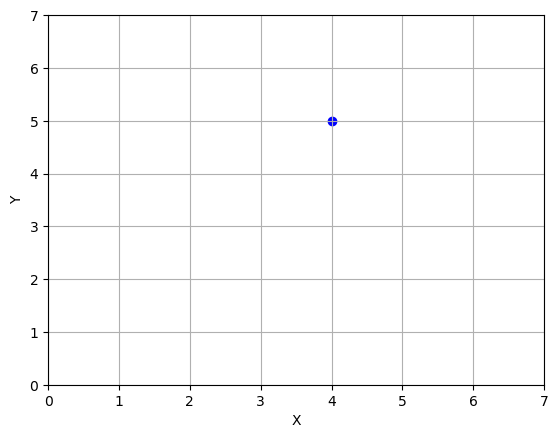

In [423]:
# vector as a data
plt.scatter(v[0], v[1], color="blue")
plt.xlim([0, 7])
plt.ylim([0, 7])
plt.xlabel('X')
plt.ylabel('Y')
plt.grid()
plt.show()

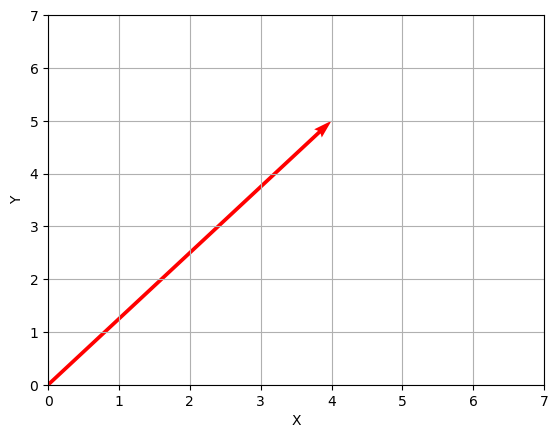

In [425]:
# vector as an array
origin = [0, 0]
plt.quiver(0, 0, v[0], v[1], angles="xy", scale_units="xy", scale = 1, color="red")
plt.xlim([0, 7])
plt.ylim([0, 7])
plt.xlabel('X')
plt.ylabel('Y')
plt.grid()
plt.show()

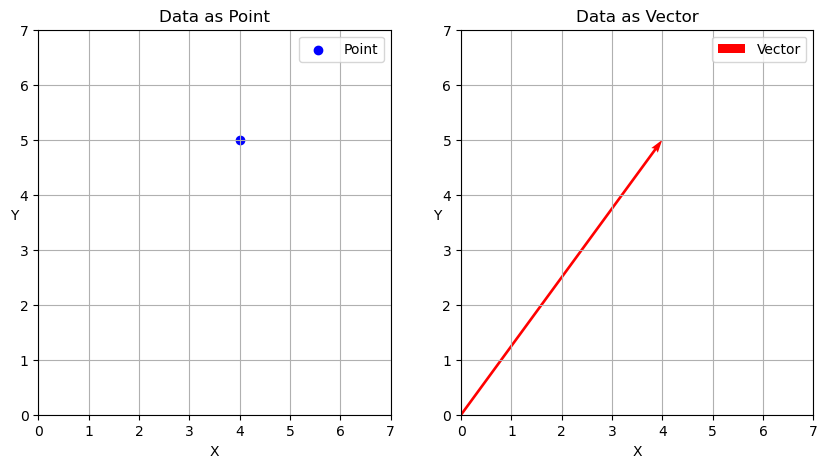

In [427]:
# Print these as subplots in single figure
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))
# Subplot 1: Data as point
ax1.scatter(v[0], v[1], color='blue', label = 'Point')
ax1.set_title('Data as Point')
ax1.set_xlim(0, 7)
ax1.set_ylim(0, 7)
ax1.set_xlabel('X')
ax1.set_ylabel('Y', rotation = 0)
ax1.grid(True)
ax1.legend()
# Subplot 2: Vector
ax2.quiver(0, 0, v[0], v[1], angles='xy', scale_units='xy', scale=1, color='red', label ='Vector')
ax2.set_title('Data as Vector')
ax2.set_xlim(0, 7)
ax2.set_ylim(0, 7)
ax2.set_xlabel('X')
ax2.set_ylabel('Y', rotation = 0)
ax2.grid(True)
ax2.legend()
# Display the figure
plt.show()

In [429]:
vectors = np.array(([2, 0], [3, 2]))
vector_addition = vectors[0] + vectors[1]
vector_addition

array([5, 2])

In [431]:
# Create 3D vector
a = np.array([2, 4, 5])
a

array([2, 4, 5])

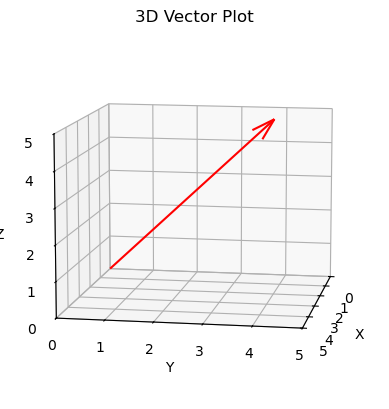

In [433]:
# 3D vector as array
fig = plt.figure()
ax = plt.axes(projection='3d')
ax.set_xlim([0, 5])
ax.set_ylim([0, 5])
ax.set_zlim([0, 5])
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.quiver(0, 0, 0, a[0], a[1], a[2], color='red', arrow_length_ratio=0.1)
ax.view_init(10,10)
plt.title('3D Vector Plot')
plt.show()

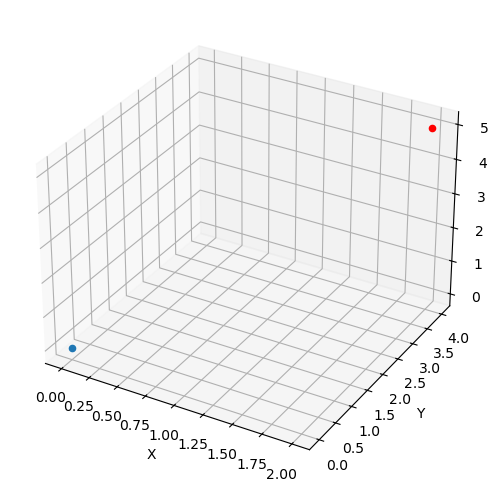

In [435]:
# 3D vector as data point
plt.rcParams["figure.figsize"] = [5, 5]
plt.rcParams["figure.autolayout"] = True
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
x = a[0]
y = a[1]
z = a[2]
ax.scatter(x, y, z, color ='red')
ax.scatter(0, 0, 0)
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
plt.show()

In [437]:
# create another vector
b = np.array([5, 5, 5])
b

array([5, 5, 5])

In [439]:
# Addition
a + b

array([ 7,  9, 10])

In [441]:
# Subtraction
a - b

array([-3, -1,  0])

In [443]:
# Multiplication
a * b

array([10, 20, 25])

In [445]:
# Scalar multiplication
print(a)
print('5 x a =', 5*a)

[2 4 5]
5 x a = [10 20 25]


In [447]:
# Dot product
a@b

55

In [449]:
# Create a matrix with 3 rows and 4 columns
M = np.array([
    [1,2,3,4],
    [10,20,30,40],
    [100,200,300,400]])
M

array([[  1,   2,   3,   4],
       [ 10,  20,  30,  40],
       [100, 200, 300, 400]])

In [451]:
# Show information about the matrix
print("Matrix shape:", M.shape)
print("Matrix size", M.size)

Matrix shape: (3, 4)
Matrix size 12


In [453]:
# Creation of Identity matrix
I = np.eye(4)
print (I)

[[1. 0. 0. 0.]
 [0. 1. 0. 0.]
 [0. 0. 1. 0.]
 [0. 0. 0. 1.]]


In [455]:
# Acess matrix and create vectors
# Use slicing methods similar with Pandas and Numpy
col_vector = M[:,2] # all rows from column in index 2
row_vector = M[1,:] # all columns from row in index 1
print('column vector in index 2:', col_vector) 
print('row vector in index 1:', row_vector) 

column vector in index 2: [  3  30 300]
row vector in index 1: [10 20 30 40]


In [457]:
# Addition
N = np.array([
    [0,0,0,0],
    [1,1,1,1],
    [2,2,2,2]])
print('M: \n', M)
print('N: \n', N)
print('N+M = \n', N+M)


M: 
 [[  1   2   3   4]
 [ 10  20  30  40]
 [100 200 300 400]]
N: 
 [[0 0 0 0]
 [1 1 1 1]
 [2 2 2 2]]
N+M = 
 [[  1   2   3   4]
 [ 11  21  31  41]
 [102 202 302 402]]


In [459]:
# Impossible case as N and M have same shape, so this should cause an error
X = M.dot(N)

ValueError: shapes (3,4) and (3,4) not aligned: 4 (dim 1) != 3 (dim 0)

In [461]:
L = np.array([
    [0,0,0],
    [1,1,1],
    [2,2,2],
    [3,3,3]])
L.shape

(4, 3)

In [463]:
# Multiplicaton using Dot product
print('M:', M.shape,' \n', M)
print('L: , L.shape, \n', L)
X = M.dot(L)  
print('M*L:',X.shape, '\n', X)

M: (3, 4)  
 [[  1   2   3   4]
 [ 10  20  30  40]
 [100 200 300 400]]
L: , L.shape, 
 [[0 0 0]
 [1 1 1]
 [2 2 2]
 [3 3 3]]
M*L: (3, 3) 
 [[  20   20   20]
 [ 200  200  200]
 [2000 2000 2000]]


In [465]:
# Create vectors 'v' and 'w' containing 2 values e.g [5, 6] and [7, 8]
v = np.array([5,6])
v

array([5, 6])

In [467]:
w = np.array([7,8])
w

array([7, 8])

In [469]:
# calculate sum v + w
sum_vec = v+w

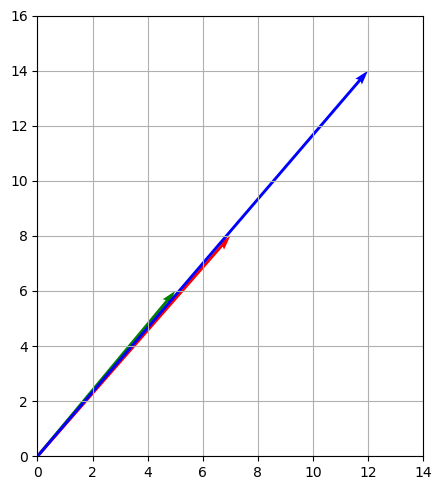

In [471]:
# plot the vectors v, w and v+W in figure
import numpy as np
import matplotlib.pyplot as plt


vectors = np.array([v, w, sum_vec])
X = [0, 0, 0]
Y = [0, 0, 0]
U = vectors[:, 0]
V = vectors[:, 1]
colors = ['g', 'r', 'b']
fig, ax = plt.subplots()
ax.quiver(X, Y, U, V, color=colors, angles='xy', scale_units='xy', scale=1)
ax.set_xlim(0, max(U) + 2)
ax.set_ylim(0, max(V) + 2)
ax.set_aspect('equal')
plt.grid()
plt.show()

In [473]:
# Create matrices A with shape (2,3), B with shape (2, 3) and C with shape (3, 2)
A = np.array([
    [1,2,3],
    [10,20,30]])
A

array([[ 1,  2,  3],
       [10, 20, 30]])

In [475]:
B = np.array([
    [7,8,9],
    [15,25,35]])
B

array([[ 7,  8,  9],
       [15, 25, 35]])

In [477]:
C = np.array([
    [7,8],
    [15,25],
    [22,36]])
C

array([[ 7,  8],
       [15, 25],
       [22, 36]])

In [479]:
# Calculate addition of matrices A + B
A + B 

array([[ 8, 10, 12],
       [25, 45, 65]])

In [481]:
# Calculate multiplication A * C
A@C

array([[ 103,  166],
       [1030, 1660]])

In [483]:
# Read iris data using Seaborn 'load_dataset'
df = sns.load_dataset('iris')
df.shape # present structure: number of rows and columns

(150, 5)

In [485]:
# Present data types of dataset
df.dtypes

sepal_length    float64
sepal_width     float64
petal_length    float64
petal_width     float64
species          object
dtype: object

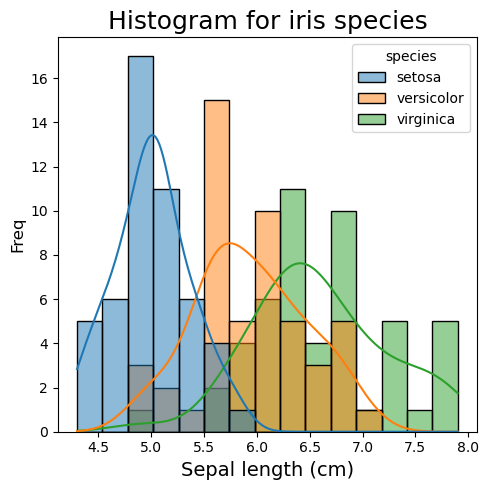

In [487]:
# parameter kde = True draws curve in histograms
# parameter hue separates data using qualitative data
sns.histplot(data = df, x= 'sepal_length',bins=15, hue = 'species', kde = True) 
plt.xlabel('Sepal length (cm)', fontsize=14)
plt.ylabel('Freq', fontsize=12)   
plt.title("Histogram for iris species", fontsize=18)
plt.show()

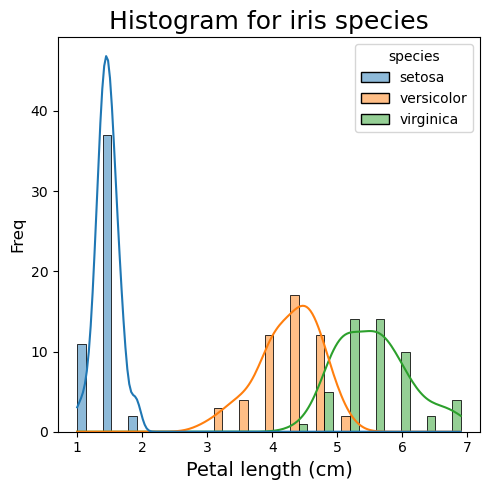

In [489]:
# parameter multiple = 'dodge' draws onwn bar per qualitative data
sns.histplot(data = df, x= 'petal_length',bins=15, hue = 'species', kde = True, multiple = 'dodge') 
plt.xlabel('Petal length (cm)', fontsize=14)
plt.ylabel('Freq', fontsize=12)   
plt.title("Histogram for iris species", fontsize=18)
plt.show()

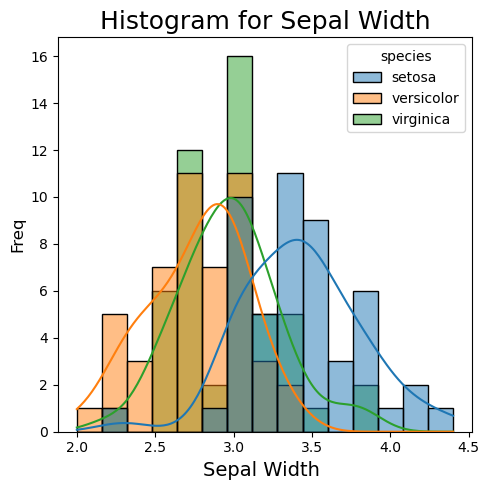

In [491]:
# Your code in here
sns.histplot(data = df, x= 'sepal_width',bins=15, hue = 'species', kde = True) 
plt.xlabel('Sepal Width ', fontsize=14)
plt.ylabel('Freq', fontsize=12)   
plt.title("Histogram for Sepal Width", fontsize=18)
plt.show()

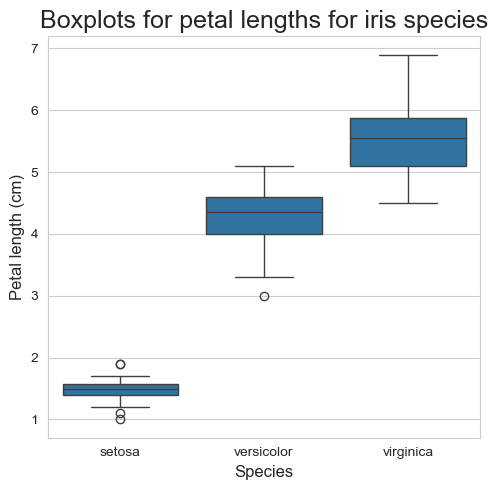

In [493]:
# y contain quantitative data and x contains qualitative
sns.set_style("whitegrid") # add grids in background that shall be done before the graph
sns.boxplot(data = df, x= 'species', y = 'petal_length') 
plt.ylabel('Petal length (cm)', fontsize=12)
plt.xlabel('Species', fontsize=12)   
plt.title("Boxplots for petal lengths for iris species", fontsize=18)
plt.grid
plt.show()

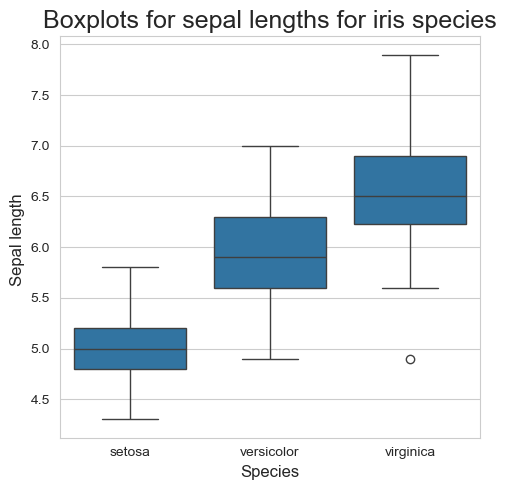

In [495]:
# Your code in here
sns.set_style("whitegrid") # add grids in background that shall be done before the graph
sns.boxplot(data = df, x= 'species', y = 'sepal_length') 
plt.ylabel('Sepal length ', fontsize=12)
plt.xlabel('Species', fontsize=12)   
plt.title("Boxplots for sepal lengths for iris species", fontsize=18)
plt.grid
plt.show()

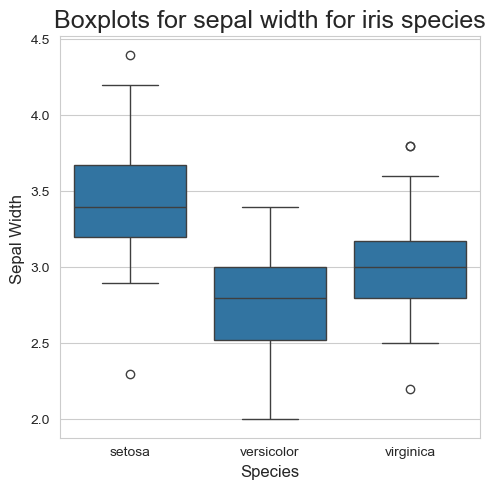

In [497]:
sns.set_style("whitegrid") # add grids in background that shall be done before the graph
sns.boxplot(data = df, x= 'species', y = 'sepal_width') 
plt.ylabel('Sepal Width ', fontsize=12)
plt.xlabel('Species', fontsize=12)   
plt.title("Boxplots for sepal width for iris species", fontsize=18)
plt.grid
plt.show()

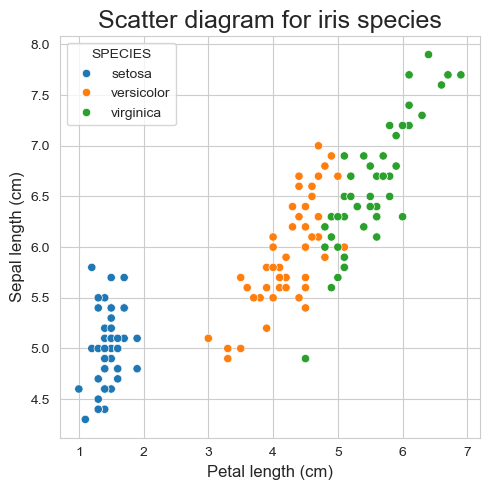

In [499]:
# Two quantitative variables, one in x and another in y
sns.scatterplot(data = df, x= 'petal_length', y= 'sepal_length', hue = 'species') 
plt.xlabel('Petal length (cm)', fontsize=12)
plt.ylabel('Sepal length (cm)', fontsize=12)   
plt.legend (title = 'SPECIES')  # Note that you can also change variable name in hue
plt.title("Scatter diagram for iris species", fontsize=18)
plt.show()

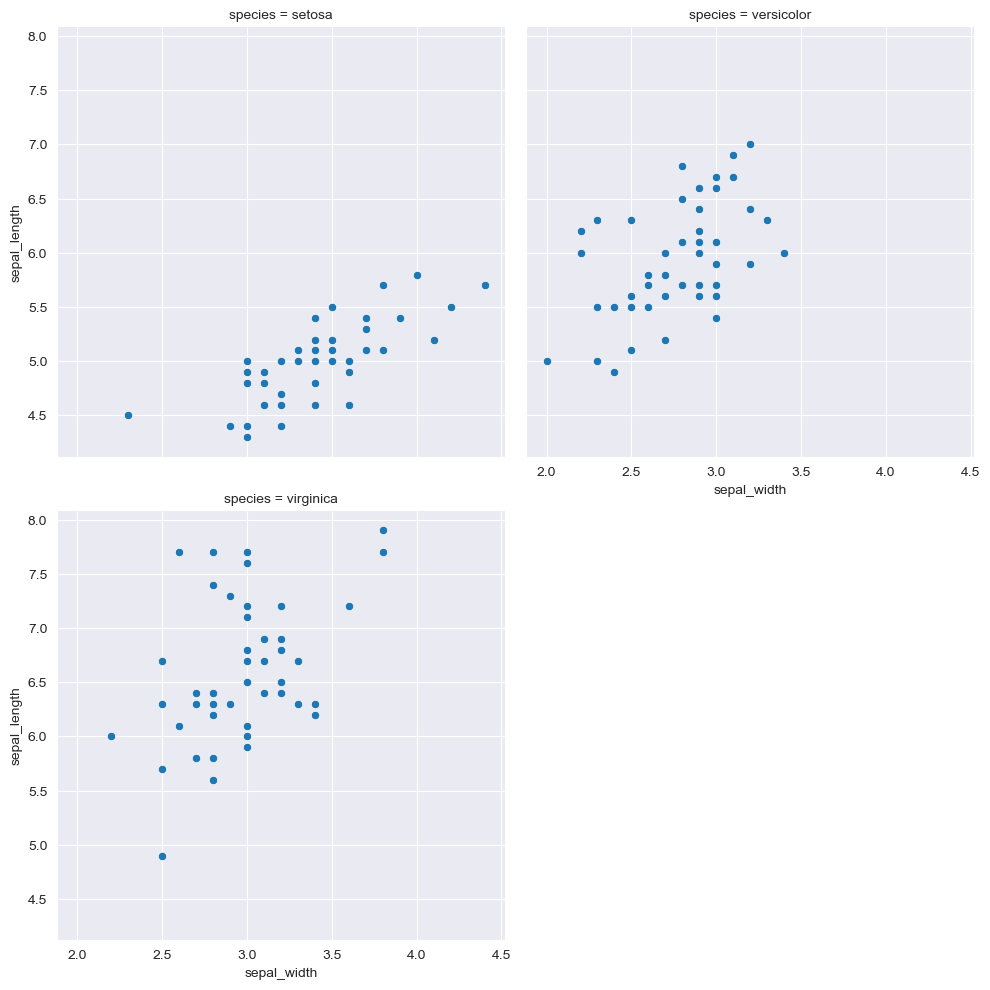

In [501]:
# With parameter col and row there is possible to get own graphs per qualitative variable 
# Parameter col_wrap restrict the number of graphs per row
sns.set_style("darkgrid") 
sns.relplot(data = df, x= 'sepal_width', y= 'sepal_length', col = 'species', col_wrap = 2)   
plt.show()

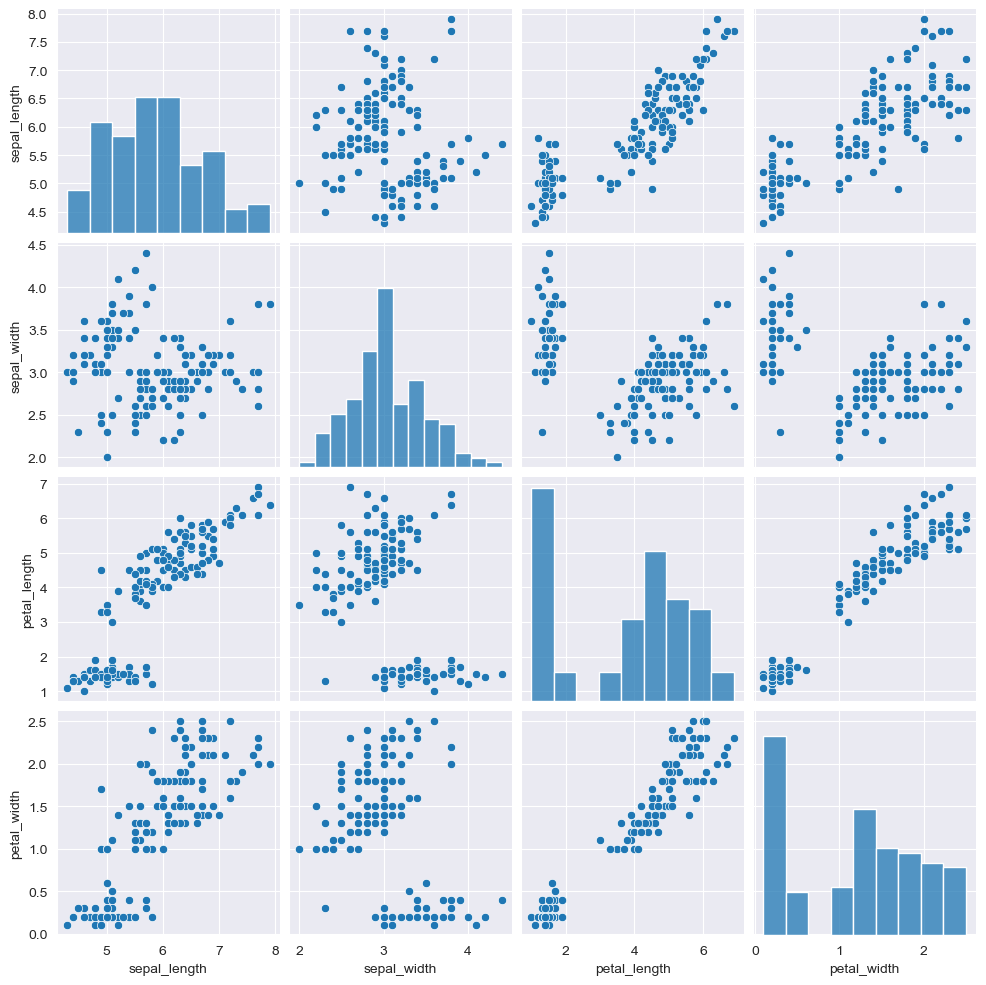

In [503]:
sns.pairplot(data = df) 

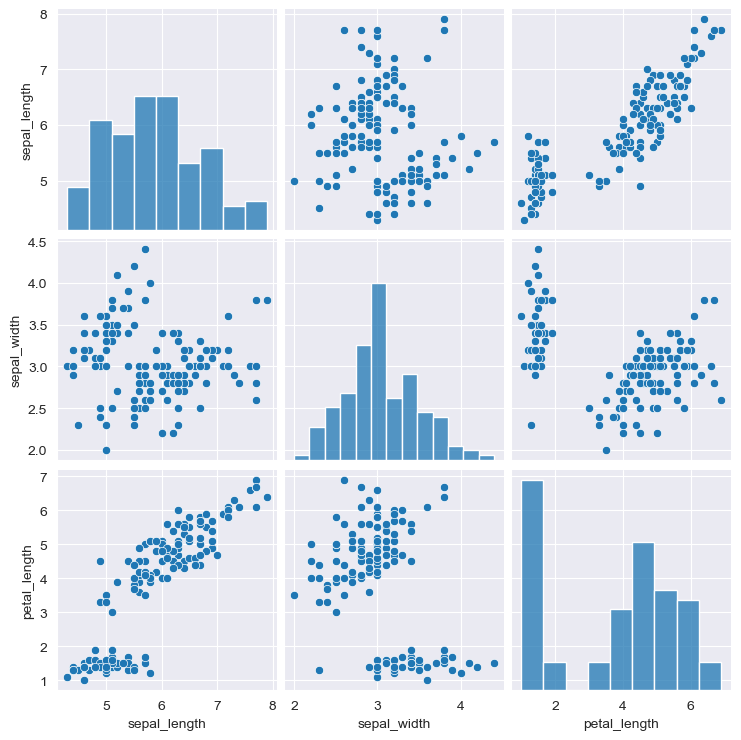

In [505]:
# pairplot for selected variables
cols = ['sepal_length', 'sepal_width', 'petal_length']
sns.pairplot(data = df, vars= cols)
plt.show()

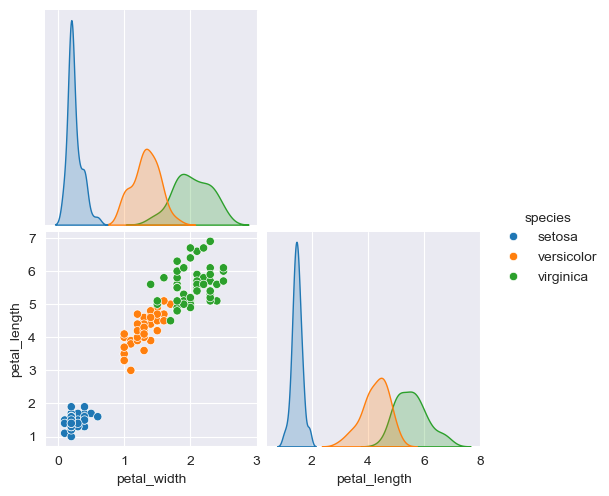

In [507]:
# Your code in here
cols = ['petal_width', 'petal_length']
sns.pairplot(data = df, vars= cols, hue = 'species', corner = True)
plt.show()

In [509]:
import seaborn as sns
df = sns.load_dataset('penguins')
print("Size of DataFrame (rows, columns)", df.shape)
df.head()

Size of DataFrame (rows, columns) (344, 7)


,species,island,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,sex
0,Adelie,Torgersen,39.1,18.7,181.0,3750.0,Male
1,Adelie,Torgersen,39.5,17.4,186.0,3800.0,Female
2,Adelie,Torgersen,40.3,18.0,195.0,3250.0,Female
3,Adelie,Torgersen,NaN,NaN,NaN,NaN,NaN
4,Adelie,Torgersen,36.7,19.3,193.0,3450.0,Female


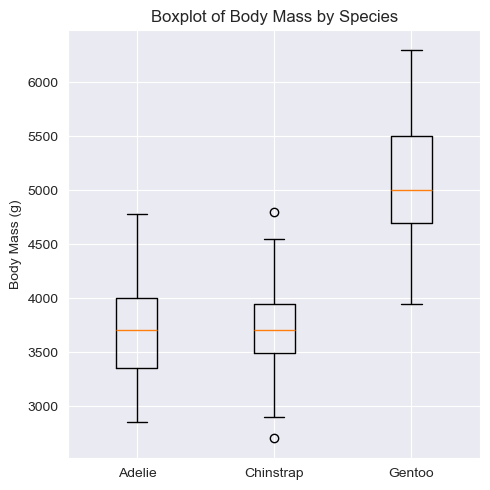

In [511]:
# Present boxplots containing 'body_mass_g' separated by 'species' 
# Get unique species
species = df['species'].unique()

# Prepare data: list of body_mass_g arrays for each species
data = [df[df['species'] == sp]['body_mass_g'].dropna() for sp in species]

plt.boxplot(data, tick_labels=species)
plt.ylabel('Body Mass (g)')
plt.title('Boxplot of Body Mass by Species')
plt.show()

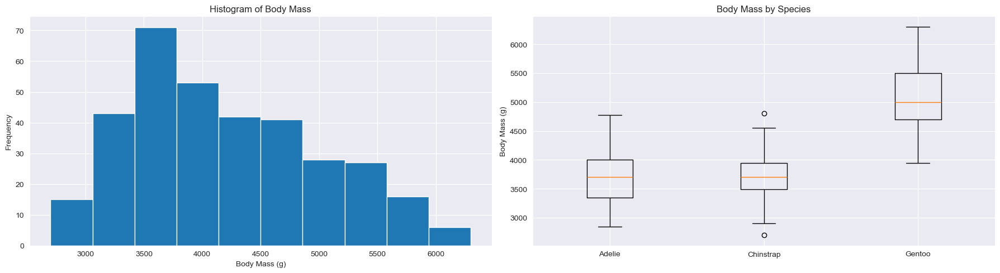

In [513]:
# Present all above in a single Matplotlib figure as subplots
import matplotlib.pyplot as plt

# Prepare species data for grouped boxplot
species = df['species'].unique()
body_mass_by_species = [df[df['species'] == sp]['body_mass_g'].dropna() for sp in species]

fig, axs = plt.subplots(1, 2, figsize=(18, 5))

# 1. Histogram for body_mass_g
axs[0].hist(df['body_mass_g'].dropna())
axs[0].set_title('Histogram of Body Mass')
axs[0].set_xlabel('Body Mass (g)')
axs[0].set_ylabel('Frequency')

# 3. Boxplots of body_mass_g by species
axs[1].boxplot(body_mass_by_species, tick_labels=species)
axs[1].set_title('Body Mass by Species')
axs[1].set_ylabel('Body Mass (g)')

plt.tight_layout()
plt.show()


In [515]:
df = pd.read_excel("Customer Call List.xlsx")
df

,CustomerID,First_Name,Last_Name,Phone_Number,Address,Paying Customer,Do_Not_Contact,Not_Useful_Column
0,1001,Frodo,Baggins,123-545-5421,"123 Shire Lane, Shire",Yes,No,True
1,1002,Abed,Nadir,123/643/9775,93 West Main Street,No,Yes,False
2,1003,Walter,/White,7066950392,298 Drugs Driveway,N,NaN,True
3,1004,Dwight,Schrute,123-543-2345,"980 Paper Avenue, Pennsylvania, 18503",Yes,Y,True
4,1005,Jon,Snow,876|678|3469,123 Dragons Road,Y,No,True
5,1006,Ron,Swanson,304-762-2467,768 City Parkway,Yes,Yes,True
6,1007,Jeff,Winger,NaN,1209 South Street,No,No,False
7,1008,Sherlock,Holmes,876|678|3469,98 Clue Drive,N,No,False
8,1009,Gandalf,NaN,N/a,123 Middle Earth,Yes,NaN,False
9,1010,Peter,Parker,123-545-5421,"25th Main Street, New York",Yes,No,True


In [517]:
# Save original DataFrame for later use
df0 = df
df0.head()

,CustomerID,First_Name,Last_Name,Phone_Number,Address,Paying Customer,Do_Not_Contact,Not_Useful_Column
0,1001,Frodo,Baggins,123-545-5421,"123 Shire Lane, Shire",Yes,No,True
1,1002,Abed,Nadir,123/643/9775,93 West Main Street,No,Yes,False
2,1003,Walter,/White,7066950392,298 Drugs Driveway,N,NaN,True
3,1004,Dwight,Schrute,123-543-2345,"980 Paper Avenue, Pennsylvania, 18503",Yes,Y,True
4,1005,Jon,Snow,876|678|3469,123 Dragons Road,Y,No,True


In [519]:
# Let's check if there are any duplicates
duplicate = df[df.duplicated()]
duplicate

,CustomerID,First_Name,Last_Name,Phone_Number,Address,Paying Customer,Do_Not_Contact,Not_Useful_Column
20,1020,Anakin,Skywalker,876|678|3469,"910 Tatooine Road, Tatooine",Yes,N,True


In [521]:
# Let's drop duplicates
df = df.drop_duplicates()
df.tail(3)

,CustomerID,First_Name,Last_Name,Phone_Number,Address,Paying Customer,Do_Not_Contact,Not_Useful_Column
17,1018,Clark,Kent,7066950392,3498 Super Lane,Y,NaN,True
18,1019,Creed,Braton,N/a,N/a,N/a,Yes,True
19,1020,Anakin,Skywalker,876|678|3469,"910 Tatooine Road, Tatooine",Yes,N,True


In [523]:
df.drop(columns =['Not_Useful_Column'], inplace = True) #this will change the original column

C:\Users\haing\AppData\Local\Temp\ipykernel_23304\2549566752.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(columns =['Not_Useful_Column'], inplace = True) #this will change the original column


In [525]:
df = df.drop(columns =['Paying Customer'])
df.columns

Index(['CustomerID', 'First_Name', 'Last_Name', 'Phone_Number', 'Address',
       'Do_Not_Contact'],
      dtype='object')

In [531]:
# Restore the data from original copy
df['Paying Customer'] = df0['Paying Customer']
df.head()

,CustomerID,First_Name,Last_Name,Phone_Number,Address,Do_Not_Contact,Paying Customer
0,1001,Frodo,Baggins,123-545-5421,"123 Shire Lane, Shire",No,Yes
1,1002,Abed,Nadir,123/643/9775,93 West Main Street,Yes,No
2,1003,Walter,/White,7066950392,298 Drugs Driveway,NaN,N
3,1004,Dwight,Schrute,123-543-2345,"980 Paper Avenue, Pennsylvania, 18503",Y,Yes
4,1005,Jon,Snow,876|678|3469,123 Dragons Road,No,Y


In [533]:
df["Last_Name"] = df["Last_Name"].str.lstrip("...")  # remove '...' from if left in string
df["Last_Name"] = df["Last_Name"].str.lstrip("/")    # remove '/' from if left in string

In [535]:
df[0:12]

,CustomerID,First_Name,Last_Name,Phone_Number,Address,Do_Not_Contact,Paying Customer
0,1001,Frodo,Baggins,123-545-5421,"123 Shire Lane, Shire",No,Yes
1,1002,Abed,Nadir,123/643/9775,93 West Main Street,Yes,No
2,1003,Walter,White,7066950392,298 Drugs Driveway,NaN,N
3,1004,Dwight,Schrute,123-543-2345,"980 Paper Avenue, Pennsylvania, 18503",Y,Yes
4,1005,Jon,Snow,876|678|3469,123 Dragons Road,No,Y
5,1006,Ron,Swanson,304-762-2467,768 City Parkway,Yes,Yes
6,1007,Jeff,Winger,NaN,1209 South Street,No,No
7,1008,Sherlock,Holmes,876|678|3469,98 Clue Drive,No,N
8,1009,Gandalf,NaN,N/a,123 Middle Earth,NaN,Yes
9,1010,Peter,Parker,123-545-5421,"25th Main Street, New York",No,Yes


In [537]:
# data in row with index 14 have '-"
df[14:]

,CustomerID,First_Name,Last_Name,Phone_Number,Address,Do_Not_Contact,Paying Customer
14,1015,Toby,Flenderson_,304-762-2467,214 HR Avenue,No,N
15,1016,Ron,Weasley,123-545-5421,2395 Hogwarts Avenue,N,No
16,1017,Michael,Scott,123/643/9775,"121 Paper Avenue, Pennsylvania",No,Yes
17,1018,Clark,Kent,7066950392,3498 Super Lane,NaN,Y
18,1019,Creed,Braton,N/a,N/a,Yes,N/a
19,1020,Anakin,Skywalker,876|678|3469,"910 Tatooine Road, Tatooine",N,Yes


In [539]:
df["Last_Name"] = df["Last_Name"].str.rstrip("_")    # remove '.' from if right in string

In [541]:
df[14:]

,CustomerID,First_Name,Last_Name,Phone_Number,Address,Do_Not_Contact,Paying Customer
14,1015,Toby,Flenderson,304-762-2467,214 HR Avenue,No,N
15,1016,Ron,Weasley,123-545-5421,2395 Hogwarts Avenue,N,No
16,1017,Michael,Scott,123/643/9775,"121 Paper Avenue, Pennsylvania",No,Yes
17,1018,Clark,Kent,7066950392,3498 Super Lane,NaN,Y
18,1019,Creed,Braton,N/a,N/a,Yes,N/a
19,1020,Anakin,Skywalker,876|678|3469,"910 Tatooine Road, Tatooine",N,Yes


In [543]:
# Restore original DataFrame
df = df0
df

,CustomerID,First_Name,Last_Name,Phone_Number,Address,Paying Customer,Do_Not_Contact,Not_Useful_Column
0,1001,Frodo,Baggins,123-545-5421,"123 Shire Lane, Shire",Yes,No,True
1,1002,Abed,Nadir,123/643/9775,93 West Main Street,No,Yes,False
2,1003,Walter,/White,7066950392,298 Drugs Driveway,N,NaN,True
3,1004,Dwight,Schrute,123-543-2345,"980 Paper Avenue, Pennsylvania, 18503",Yes,Y,True
4,1005,Jon,Snow,876|678|3469,123 Dragons Road,Y,No,True
5,1006,Ron,Swanson,304-762-2467,768 City Parkway,Yes,Yes,True
6,1007,Jeff,Winger,NaN,1209 South Street,No,No,False
7,1008,Sherlock,Holmes,876|678|3469,98 Clue Drive,N,No,False
8,1009,Gandalf,NaN,N/a,123 Middle Earth,Yes,NaN,False
9,1010,Peter,Parker,123-545-5421,"25th Main Street, New York",Yes,No,True


In [545]:
df["Last_Name"] = df["Last_Name"].str.strip("123._/") # remove all numbers, and characters '._/' from from string
df

,CustomerID,First_Name,Last_Name,Phone_Number,Address,Paying Customer,Do_Not_Contact,Not_Useful_Column
0,1001,Frodo,Baggins,123-545-5421,"123 Shire Lane, Shire",Yes,No,True
1,1002,Abed,Nadir,123/643/9775,93 West Main Street,No,Yes,False
2,1003,Walter,White,7066950392,298 Drugs Driveway,N,NaN,True
3,1004,Dwight,Schrute,123-543-2345,"980 Paper Avenue, Pennsylvania, 18503",Yes,Y,True
4,1005,Jon,Snow,876|678|3469,123 Dragons Road,Y,No,True
5,1006,Ron,Swanson,304-762-2467,768 City Parkway,Yes,Yes,True
6,1007,Jeff,Winger,NaN,1209 South Street,No,No,False
7,1008,Sherlock,Holmes,876|678|3469,98 Clue Drive,N,No,False
8,1009,Gandalf,NaN,N/a,123 Middle Earth,Yes,NaN,False
9,1010,Peter,Parker,123-545-5421,"25th Main Street, New York",Yes,No,True


In [547]:
#Removing characters with replace
df["Phone_Number"] = df["Phone_Number"].str.replace('[^a-zA-Z0-9]','', regex=True)
df

,CustomerID,First_Name,Last_Name,Phone_Number,Address,Paying Customer,Do_Not_Contact,Not_Useful_Column
0,1001,Frodo,Baggins,1235455421,"123 Shire Lane, Shire",Yes,No,True
1,1002,Abed,Nadir,1236439775,93 West Main Street,No,Yes,False
2,1003,Walter,White,NaN,298 Drugs Driveway,N,NaN,True
3,1004,Dwight,Schrute,1235432345,"980 Paper Avenue, Pennsylvania, 18503",Yes,Y,True
4,1005,Jon,Snow,8766783469,123 Dragons Road,Y,No,True
5,1006,Ron,Swanson,3047622467,768 City Parkway,Yes,Yes,True
6,1007,Jeff,Winger,NaN,1209 South Street,No,No,False
7,1008,Sherlock,Holmes,8766783469,98 Clue Drive,N,No,False
8,1009,Gandalf,NaN,Na,123 Middle Earth,Yes,NaN,False
9,1010,Peter,Parker,1235455421,"25th Main Street, New York",Yes,No,True


In [549]:
# Data converted first to string
df["Phone_Number"] = df["Phone_Number"].apply(lambda x: str(x))
# Then new format for data
df["Phone_Number"] = df["Phone_Number"].apply(lambda x: x[0:3] + '-' + x[3:6] + '-' + x[6:10])

In [551]:
df

,CustomerID,First_Name,Last_Name,Phone_Number,Address,Paying Customer,Do_Not_Contact,Not_Useful_Column
0,1001,Frodo,Baggins,123-545-5421,"123 Shire Lane, Shire",Yes,No,True
1,1002,Abed,Nadir,123-643-9775,93 West Main Street,No,Yes,False
2,1003,Walter,White,nan--,298 Drugs Driveway,N,NaN,True
3,1004,Dwight,Schrute,123-543-2345,"980 Paper Avenue, Pennsylvania, 18503",Yes,Y,True
4,1005,Jon,Snow,876-678-3469,123 Dragons Road,Y,No,True
5,1006,Ron,Swanson,304-762-2467,768 City Parkway,Yes,Yes,True
6,1007,Jeff,Winger,nan--,1209 South Street,No,No,False
7,1008,Sherlock,Holmes,876-678-3469,98 Clue Drive,N,No,False
8,1009,Gandalf,NaN,Na--,123 Middle Earth,Yes,NaN,False
9,1010,Peter,Parker,123-545-5421,"25th Main Street, New York",Yes,No,True


In [553]:
# Clean Phone Number
df["Phone_Number"] = df["Phone_Number"].str.replace('Na--','')
df

,CustomerID,First_Name,Last_Name,Phone_Number,Address,Paying Customer,Do_Not_Contact,Not_Useful_Column
0,1001,Frodo,Baggins,123-545-5421,"123 Shire Lane, Shire",Yes,No,True
1,1002,Abed,Nadir,123-643-9775,93 West Main Street,No,Yes,False
2,1003,Walter,White,nan--,298 Drugs Driveway,N,NaN,True
3,1004,Dwight,Schrute,123-543-2345,"980 Paper Avenue, Pennsylvania, 18503",Yes,Y,True
4,1005,Jon,Snow,876-678-3469,123 Dragons Road,Y,No,True
5,1006,Ron,Swanson,304-762-2467,768 City Parkway,Yes,Yes,True
6,1007,Jeff,Winger,nan--,1209 South Street,No,No,False
7,1008,Sherlock,Holmes,876-678-3469,98 Clue Drive,N,No,False
8,1009,Gandalf,NaN,,123 Middle Earth,Yes,NaN,False
9,1010,Peter,Parker,123-545-5421,"25th Main Street, New York",Yes,No,True


In [555]:
#Remove other strange values from Phone_Number (nan--, ...)
df["Phone_Number"] = df["Phone_Number"].str.replace('nan--','')
df

,CustomerID,First_Name,Last_Name,Phone_Number,Address,Paying Customer,Do_Not_Contact,Not_Useful_Column
0,1001,Frodo,Baggins,123-545-5421,"123 Shire Lane, Shire",Yes,No,True
1,1002,Abed,Nadir,123-643-9775,93 West Main Street,No,Yes,False
2,1003,Walter,White,,298 Drugs Driveway,N,NaN,True
3,1004,Dwight,Schrute,123-543-2345,"980 Paper Avenue, Pennsylvania, 18503",Yes,Y,True
4,1005,Jon,Snow,876-678-3469,123 Dragons Road,Y,No,True
5,1006,Ron,Swanson,304-762-2467,768 City Parkway,Yes,Yes,True
6,1007,Jeff,Winger,,1209 South Street,No,No,False
7,1008,Sherlock,Holmes,876-678-3469,98 Clue Drive,N,No,False
8,1009,Gandalf,NaN,,123 Middle Earth,Yes,NaN,False
9,1010,Peter,Parker,123-545-5421,"25th Main Street, New York",Yes,No,True


In [557]:
df[["Street_Address", "State", "Zip_Code"]] = df["Address"].str.split(',', expand=True)
df

,CustomerID,First_Name,Last_Name,Phone_Number,Address,Paying Customer,Do_Not_Contact,Not_Useful_Column,Street_Address,State,Zip_Code
0,1001,Frodo,Baggins,123-545-5421,"123 Shire Lane, Shire",Yes,No,True,123 Shire Lane,Shire,None
1,1002,Abed,Nadir,123-643-9775,93 West Main Street,No,Yes,False,93 West Main Street,None,None
2,1003,Walter,White,,298 Drugs Driveway,N,NaN,True,298 Drugs Driveway,None,None
3,1004,Dwight,Schrute,123-543-2345,"980 Paper Avenue, Pennsylvania, 18503",Yes,Y,True,980 Paper Avenue,Pennsylvania,18503
4,1005,Jon,Snow,876-678-3469,123 Dragons Road,Y,No,True,123 Dragons Road,None,None
5,1006,Ron,Swanson,304-762-2467,768 City Parkway,Yes,Yes,True,768 City Parkway,None,None
6,1007,Jeff,Winger,,1209 South Street,No,No,False,1209 South Street,None,None
7,1008,Sherlock,Holmes,876-678-3469,98 Clue Drive,N,No,False,98 Clue Drive,None,None
8,1009,Gandalf,NaN,,123 Middle Earth,Yes,NaN,False,123 Middle Earth,None,None
9,1010,Peter,Parker,123-545-5421,"25th Main Street, New York",Yes,No,True,25th Main Street,New York,None


In [559]:
df=df.fillna('')
df

,CustomerID,First_Name,Last_Name,Phone_Number,Address,Paying Customer,Do_Not_Contact,Not_Useful_Column,Street_Address,State,Zip_Code
0,1001,Frodo,Baggins,123-545-5421,"123 Shire Lane, Shire",Yes,No,True,123 Shire Lane,Shire,
1,1002,Abed,Nadir,123-643-9775,93 West Main Street,No,Yes,False,93 West Main Street,,
2,1003,Walter,White,,298 Drugs Driveway,N,,True,298 Drugs Driveway,,
3,1004,Dwight,Schrute,123-543-2345,"980 Paper Avenue, Pennsylvania, 18503",Yes,Y,True,980 Paper Avenue,Pennsylvania,18503
4,1005,Jon,Snow,876-678-3469,123 Dragons Road,Y,No,True,123 Dragons Road,,
5,1006,Ron,Swanson,304-762-2467,768 City Parkway,Yes,Yes,True,768 City Parkway,,
6,1007,Jeff,Winger,,1209 South Street,No,No,False,1209 South Street,,
7,1008,Sherlock,Holmes,876-678-3469,98 Clue Drive,N,No,False,98 Clue Drive,,
8,1009,Gandalf,,,123 Middle Earth,Yes,,False,123 Middle Earth,,
9,1010,Peter,Parker,123-545-5421,"25th Main Street, New York",Yes,No,True,25th Main Street,New York,


In [561]:
#Continue cleaning and change values for 'Do_Not_Contact' and 'Paying Customer' to Yes = Y, No = N
df["Do_Not_Contact"] = df["Do_Not_Contact"].str.replace('Yes','Y')
df["Do_Not_Contact"] = df["Do_Not_Contact"].str.replace('No','N')
df

,CustomerID,First_Name,Last_Name,Phone_Number,Address,Paying Customer,Do_Not_Contact,Not_Useful_Column,Street_Address,State,Zip_Code
0,1001,Frodo,Baggins,123-545-5421,"123 Shire Lane, Shire",Yes,N,True,123 Shire Lane,Shire,
1,1002,Abed,Nadir,123-643-9775,93 West Main Street,No,Y,False,93 West Main Street,,
2,1003,Walter,White,,298 Drugs Driveway,N,,True,298 Drugs Driveway,,
3,1004,Dwight,Schrute,123-543-2345,"980 Paper Avenue, Pennsylvania, 18503",Yes,Y,True,980 Paper Avenue,Pennsylvania,18503
4,1005,Jon,Snow,876-678-3469,123 Dragons Road,Y,N,True,123 Dragons Road,,
5,1006,Ron,Swanson,304-762-2467,768 City Parkway,Yes,Y,True,768 City Parkway,,
6,1007,Jeff,Winger,,1209 South Street,No,N,False,1209 South Street,,
7,1008,Sherlock,Holmes,876-678-3469,98 Clue Drive,N,N,False,98 Clue Drive,,
8,1009,Gandalf,,,123 Middle Earth,Yes,,False,123 Middle Earth,,
9,1010,Peter,Parker,123-545-5421,"25th Main Street, New York",Yes,N,True,25th Main Street,New York,


In [563]:
df["Paying Customer"] = df["Paying Customer"].str.replace('Yes','Y')
df["Paying Customer"] = df["Paying Customer"].str.replace('No','N')
df

,CustomerID,First_Name,Last_Name,Phone_Number,Address,Paying Customer,Do_Not_Contact,Not_Useful_Column,Street_Address,State,Zip_Code
0,1001,Frodo,Baggins,123-545-5421,"123 Shire Lane, Shire",Y,N,True,123 Shire Lane,Shire,
1,1002,Abed,Nadir,123-643-9775,93 West Main Street,N,Y,False,93 West Main Street,,
2,1003,Walter,White,,298 Drugs Driveway,N,,True,298 Drugs Driveway,,
3,1004,Dwight,Schrute,123-543-2345,"980 Paper Avenue, Pennsylvania, 18503",Y,Y,True,980 Paper Avenue,Pennsylvania,18503
4,1005,Jon,Snow,876-678-3469,123 Dragons Road,Y,N,True,123 Dragons Road,,
5,1006,Ron,Swanson,304-762-2467,768 City Parkway,Y,Y,True,768 City Parkway,,
6,1007,Jeff,Winger,,1209 South Street,N,N,False,1209 South Street,,
7,1008,Sherlock,Holmes,876-678-3469,98 Clue Drive,N,N,False,98 Clue Drive,,
8,1009,Gandalf,,,123 Middle Earth,Y,,False,123 Middle Earth,,
9,1010,Peter,Parker,123-545-5421,"25th Main Street, New York",Y,N,True,25th Main Street,New York,


In [565]:
#rename (df.rename (columns = {'old name': 'new_name'}, inplace = True))
df.rename (columns = {'Paying Customer': 'Paying_Customer'}, inplace = True)
df

,CustomerID,First_Name,Last_Name,Phone_Number,Address,Paying_Customer,Do_Not_Contact,Not_Useful_Column,Street_Address,State,Zip_Code
0,1001,Frodo,Baggins,123-545-5421,"123 Shire Lane, Shire",Y,N,True,123 Shire Lane,Shire,
1,1002,Abed,Nadir,123-643-9775,93 West Main Street,N,Y,False,93 West Main Street,,
2,1003,Walter,White,,298 Drugs Driveway,N,,True,298 Drugs Driveway,,
3,1004,Dwight,Schrute,123-543-2345,"980 Paper Avenue, Pennsylvania, 18503",Y,Y,True,980 Paper Avenue,Pennsylvania,18503
4,1005,Jon,Snow,876-678-3469,123 Dragons Road,Y,N,True,123 Dragons Road,,
5,1006,Ron,Swanson,304-762-2467,768 City Parkway,Y,Y,True,768 City Parkway,,
6,1007,Jeff,Winger,,1209 South Street,N,N,False,1209 South Street,,
7,1008,Sherlock,Holmes,876-678-3469,98 Clue Drive,N,N,False,98 Clue Drive,,
8,1009,Gandalf,,,123 Middle Earth,Y,,False,123 Middle Earth,,
9,1010,Peter,Parker,123-545-5421,"25th Main Street, New York",Y,N,True,25th Main Street,New York,


In [567]:
#Timestamps and Datetime handling
# Take ctime in use
from time import ctime
cur_time = time()
print("Current time:", ctime(cur_time))
print("Universal time:",time())

Current time: Fri Dec  5 07:24:11 2025
Universal time: 1764912251.8025265


In [569]:
# Check some past times
past_time = 0
print("Starting time from", ctime(past_time), "as the position", past_time)
past_time = 1
print("Time in position",  past_time, "is:", ctime(past_time))
past_time = 12345
print("Time in position",  past_time, "is:", ctime(past_time))

Starting time from Thu Jan  1 02:00:00 1970 as the position 0
Time in position 1 is: Thu Jan  1 02:00:01 1970
Time in position 12345 is: Thu Jan  1 05:25:45 1970


In [571]:
# Take datetime and date in use
from datetime import datetime, date
# Time now
datetime.now() # all pieces of time elements

datetime.datetime(2025, 12, 5, 7, 24, 44, 923229)

In [573]:
# Time now formatted
print("time now is", datetime.now())

time now is 2025-12-05 07:24:56.042312


In [577]:
# Load current time
today = datetime.now()
print("time now is", today)

# Print year
print("current year:", today.year)

# Print month
print("current month:", today.month)

# Print day and hour
print("current day:", today.day, "and hour:", today.hour)

time now is 2025-12-05 07:25:33.218941
current year: 2025
current month: 12
current day: 5 and hour: 7


In [579]:
# Load library for time zones
import pytz

# Load time
time1 = datetime(2023, 11, 21, 9, 30, 10, 300030,
                 tzinfo = pytz.UTC)
print("time is:", time1)
print("time zone:", time1.tzinfo)

time is: 2023-11-21 09:30:10.300030+00:00
time zone: UTC


In [581]:
# Set time zone
tz = pytz.timezone('Europe/Stockholm')
curtime = datetime.now(tz = pytz.UTC)
print("Current UTC time is:", curtime)

new_ct = curtime.astimezone(tz)
print("Current time in", tz, "is:", new_ct)
print("Current time in", tz, "in ISO format is:", new_ct.isoformat())

Current UTC time is: 2025-12-05 05:25:54.673049+00:00
Current time in Europe/Stockholm is: 2025-12-05 06:25:54.673049+01:00
Current time in Europe/Stockholm in ISO format is: 2025-12-05T06:25:54.673049+01:00


In [583]:
# Define date as string
date_str = "2023-11-20 12:30:15"

# Format
format_str = "%Y-%m-%d %H:%M:%S"
date2 = datetime.strptime(date_str, format_str)
print("original date:", date_str, "in format", type(date_str))
print("formatted date:", date2, "in format", type(date2))

original date: 2023-11-20 12:30:15 in format <class 'str'>
formatted date: 2023-11-20 12:30:15 in format <class 'datetime.datetime'>


Read from Excel file "Steps.xlsx" following sheets to separate DataFrames

Steps1
Steps2
Steps3
Combine the data in single DataFrame (using Pandas concat) so that the single DataFrame has same columns as the original ones and all the data in those columns. https://www.statology.org/stack-pandas-dataframes/ https://pandas.pydata.org/docs/reference/api/pandas.concat.html

import datetime as dt # take the library in use if not done
Create new columns in DataFrame for 'year', 'month' and 'day' update the DataFrame columns to contain: 'year', 'month', 'day' and 'steps'

Hint use: df['year'] = df['Date'].dt.year ...
Make boxplot where there is for each month amount of steps separated by year

See guidance in https://seaborn.pydata.org/generated/seaborn.boxplot.html
Hint: use x, y and hue parameters
Also use arguments like gap and palette to make the plot look clearer
Add title to boxplot, the title shall answer to question, what does the line inside the box mean.

Also find out, what do the "whiskers" mean (no need to write down the answer, just find out and remember)

In [586]:
# Your answer in here
import datetime as dt
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

df1 = pd.read_excel("Steps.xlsx", sheet_name="Steps1")
df2 = pd.read_excel("Steps.xlsx", sheet_name="Steps2")
df3 = pd.read_excel("Steps.xlsx", sheet_name="Steps3")

combined_df = pd.concat([df1, df2, df3], ignore_index=True) 
#hàm concat dùng để nối nhiều DataFrame hoặc Series lại với nhau theo 1 trục (hàng hoặc cột)
#mặc định là axis=0 (theo hàng), ghép các DataFrame theo chiều dọc (stack lên nhau)
#nếu muốn ghép theo chiều ngang, dùng axis=1

combined_df.head()

,Date,Steps
0,2020-10-22,64500
1,2020-10-29,67463
2,2020-11-05,62528
3,2020-11-12,64513
4,2020-11-19,60378


In [588]:
#extract year, month, and day into new columns 
combined_df['Year'] = combined_df['Date'].dt.year
combined_df['Month'] = combined_df['Date'].dt.month
combined_df['Day'] = combined_df['Date'].dt.day
#nhớ là dt.year, day, month không có dấu () đằng sau
combined_df = combined_df.drop(columns = ['Date'])
#sau khi đã chuyển ra Year, Month, Date thì nên bỏ cột Date cho dữ liệu đỡ rối
combined_df.head()

,Steps,Year,Month,Day
0,64500,2020,10,22
1,67463,2020,10,29
2,62528,2020,11,5
3,64513,2020,11,12
4,60378,2020,11,19


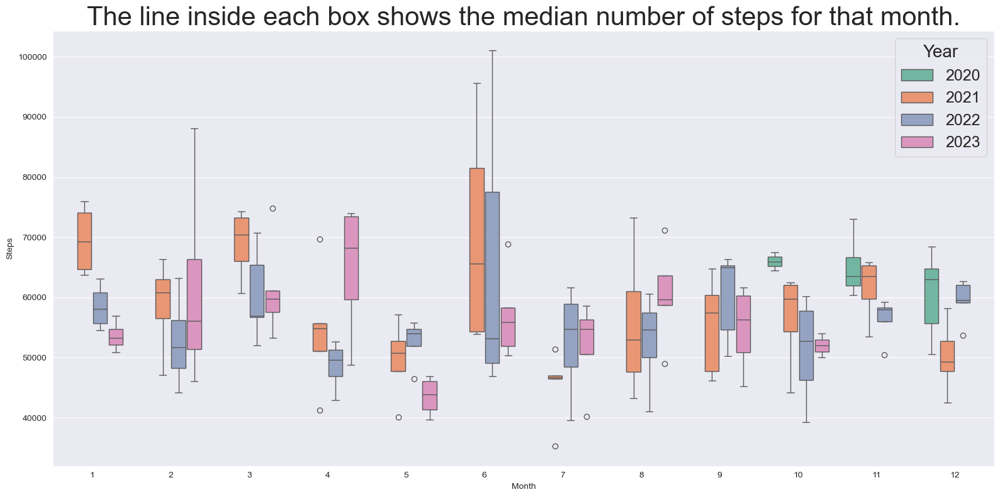

In [618]:
plt.figure(figsize=(16,8))
sns.boxplot(
    data=combined_df,
    x='Month', y='Steps', hue='Year', gap=0.1, palette='Set2'          
)
plt.title("The line inside each box shows the median number of steps for that month.", fontsize = 30)
plt.legend(title='Year', title_fontsize=20, fontsize=18)
plt.show()


In [610]:
# Load the data and check the shape
df = pd.read_excel("Apartment_rents.xlsx" ,sheet_name='Data')  
df.shape

(70, 1)

In [612]:
# Let's check the values
print("Data in groups of 10:")
print(df.iloc[0:10].transpose())
print(df.iloc[10:20].transpose())
print(df.iloc[0:10].transpose())
print(df.iloc[60:70].transpose())

Data in groups of 10:
        0    1    2    3    4    5    6    7    8    9
Rent  425  430  430  435  435  435  435  435  440  440
       10   11   12   13   14   15   16   17   18   19
Rent  440  440  440  445  445  445  445  445  450  450
        0    1    2    3    4    5    6    7    8    9
Rent  425  430  430  435  435  435  435  435  440  440
       60   61   62   63   64   65   66   67   68   69
Rent  575  575  580  590  600  600  600  600  615  615


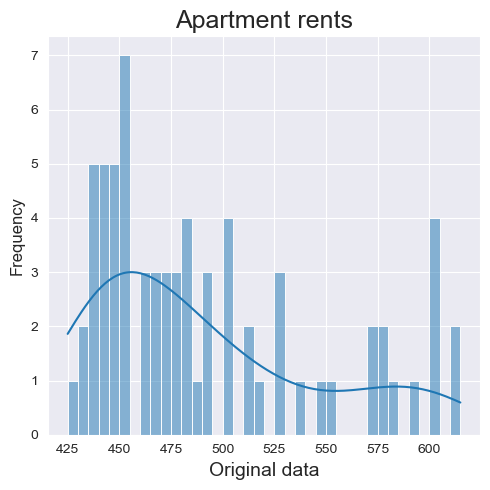

In [614]:
# Plot data and use binwith = 5 to visualize using a histogram 
sns.histplot(data = df, x= 'Rent',binwidth=5, kde = True) 
plt.xlabel('Original data', fontsize=14)
plt.ylabel('Frequency', fontsize=12)   
plt.title("Apartment rents", fontsize=18)
plt.show()

**Data Standardization**
+ Data is converted to so called z-scores, where each value z = (x - mean)/standard deviation
+ This can be done using StandardScaler from the Scikit-Learn library
+ fit_transform completes the conversion for the StandardScaler object

In [621]:
# data standardization with  sklearn
from sklearn.preprocessing import StandardScaler
standS = StandardScaler()
scaler = standS.fit_transform(df) 

#fit: học tham số chuẩn hóa từ dữ liệu (tính mean và std cho từng cột trong df)
#transform: áp dụng chuẩn hóa cho từng dữ liệu theo ct (Xscaled = (x - μ)/σ)
#tóm tắt: fit_transform(df): học thông số chuẩn hóa dữ liệu và biến đổi dữ liệu về thang đo chuẩn (mean 0, std 1)

# Note data is transposed to get it presented in less space in this notebook
print(scaler.transpose())

[[-1.21078686 -1.11878178 -1.11878178 -1.0267767  -1.0267767  -1.0267767
  -1.0267767  -1.0267767  -0.93477162 -0.93477162 -0.93477162 -0.93477162
  -0.93477162 -0.84276654 -0.84276654 -0.84276654 -0.84276654 -0.84276654
  -0.75076146 -0.75076146 -0.75076146 -0.75076146 -0.75076146 -0.75076146
  -0.75076146 -0.5667513  -0.5667513  -0.5667513  -0.47474622 -0.47474622
  -0.47474622 -0.38274114 -0.38274114 -0.3459391  -0.29073605 -0.29073605
  -0.29073605 -0.19873097 -0.19873097 -0.19873097 -0.19873097 -0.10672589
  -0.01472081 -0.01472081 -0.01472081  0.16928935  0.16928935  0.16928935
   0.16928935  0.35329951  0.35329951  0.44530459  0.62931475  0.62931475
   0.62931475  0.81332491  1.07093914  1.08934015  1.45736048  1.45736048
   1.54936556  1.54936556  1.64137064  1.8253808   2.00939096  2.00939096
   2.00939096  2.00939096  2.2854062   2.2854062 ]]


In [625]:
# Create Serie where standardised data is included
stand_rent = scaler[:,0]
stand_rent

array([-1.21078686, -1.11878178, -1.11878178, -1.0267767 , -1.0267767 ,
       -1.0267767 , -1.0267767 , -1.0267767 , -0.93477162, -0.93477162,
       -0.93477162, -0.93477162, -0.93477162, -0.84276654, -0.84276654,
       -0.84276654, -0.84276654, -0.84276654, -0.75076146, -0.75076146,
       -0.75076146, -0.75076146, -0.75076146, -0.75076146, -0.75076146,
       -0.5667513 , -0.5667513 , -0.5667513 , -0.47474622, -0.47474622,
       -0.47474622, -0.38274114, -0.38274114, -0.3459391 , -0.29073605,
       -0.29073605, -0.29073605, -0.19873097, -0.19873097, -0.19873097,
       -0.19873097, -0.10672589, -0.01472081, -0.01472081, -0.01472081,
        0.16928935,  0.16928935,  0.16928935,  0.16928935,  0.35329951,
        0.35329951,  0.44530459,  0.62931475,  0.62931475,  0.62931475,
        0.81332491,  1.07093914,  1.08934015,  1.45736048,  1.45736048,
        1.54936556,  1.54936556,  1.64137064,  1.8253808 ,  2.00939096,
        2.00939096,  2.00939096,  2.00939096,  2.2854062 ,  2.28

**Plot standardized data using Histogram**
+ Note that the data shape with histogram is different to the original data.
+ Bins = 30 is used just for the example

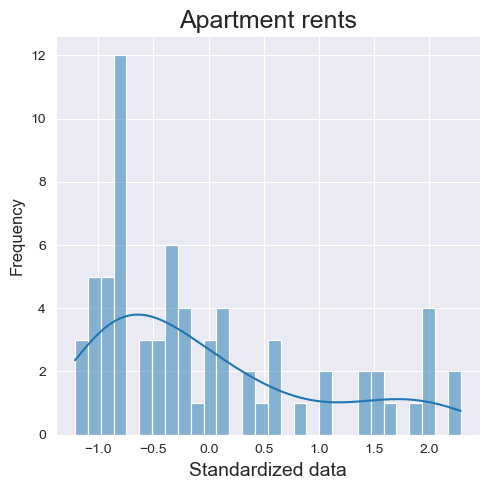

In [628]:
#Plot standardized data using Histogram
# plot scaled data using histogram
sns.histplot(data = stand_rent ,bins=30, kde = True) 
plt.xlabel('Standardized data', fontsize=14)
plt.ylabel('Frequency', fontsize=12)   
plt.title("Apartment rents", fontsize=18)
plt.show()

**Data Normalization**
+ Data is converted linearly to values where the smallest is 0 and largest is 1, i.e. MinMax scaling
+ This can be done using MinMaxScaler from the Scikit-Learn library
+ fit_transform completes the conversion for the MinMaxScaler object

In [631]:
# data normalization with sklearn
from sklearn.preprocessing import MinMaxScaler
minMaxS = MinMaxScaler()
# transform data
scaler = minMaxS.fit_transform(df)
print(scaler.transpose())

[[0.         0.02631579 0.02631579 0.05263158 0.05263158 0.05263158
  0.05263158 0.05263158 0.07894737 0.07894737 0.07894737 0.07894737
  0.07894737 0.10526316 0.10526316 0.10526316 0.10526316 0.10526316
  0.13157895 0.13157895 0.13157895 0.13157895 0.13157895 0.13157895
  0.13157895 0.18421053 0.18421053 0.18421053 0.21052632 0.21052632
  0.21052632 0.23684211 0.23684211 0.24736842 0.26315789 0.26315789
  0.26315789 0.28947368 0.28947368 0.28947368 0.28947368 0.31578947
  0.34210526 0.34210526 0.34210526 0.39473684 0.39473684 0.39473684
  0.39473684 0.44736842 0.44736842 0.47368421 0.52631579 0.52631579
  0.52631579 0.57894737 0.65263158 0.65789474 0.76315789 0.76315789
  0.78947368 0.78947368 0.81578947 0.86842105 0.92105263 0.92105263
  0.92105263 0.92105263 1.         1.        ]]


In [633]:
# Create Serie where normalized data is included
norm_rent = scaler[:,0]
norm_rent

array([0.        , 0.02631579, 0.02631579, 0.05263158, 0.05263158,
       0.05263158, 0.05263158, 0.05263158, 0.07894737, 0.07894737,
       0.07894737, 0.07894737, 0.07894737, 0.10526316, 0.10526316,
       0.10526316, 0.10526316, 0.10526316, 0.13157895, 0.13157895,
       0.13157895, 0.13157895, 0.13157895, 0.13157895, 0.13157895,
       0.18421053, 0.18421053, 0.18421053, 0.21052632, 0.21052632,
       0.21052632, 0.23684211, 0.23684211, 0.24736842, 0.26315789,
       0.26315789, 0.26315789, 0.28947368, 0.28947368, 0.28947368,
       0.28947368, 0.31578947, 0.34210526, 0.34210526, 0.34210526,
       0.39473684, 0.39473684, 0.39473684, 0.39473684, 0.44736842,
       0.44736842, 0.47368421, 0.52631579, 0.52631579, 0.52631579,
       0.57894737, 0.65263158, 0.65789474, 0.76315789, 0.76315789,
       0.78947368, 0.78947368, 0.81578947, 0.86842105, 0.92105263,
       0.92105263, 0.92105263, 0.92105263, 1.        , 1.        ])

**Plot normalized data using Histogram**
+ Note that the data shape with histogram is same to the original data.
+ Bins = 40 is used just for the example

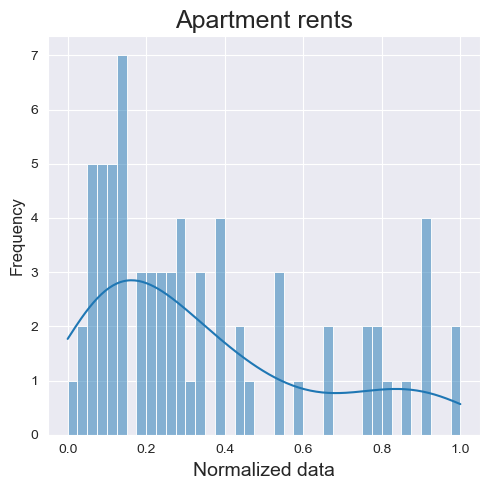

In [636]:
# plot data
sns.histplot(data = norm_rent ,bins=40, kde = True) #kde:Kernel Density Estimate, đường biểu diễn mật độ xác suất
plt.xlabel('Normalized data', fontsize=14)
plt.ylabel('Frequency', fontsize=12)   
plt.title("Apartment rents", fontsize=18)
plt.show()

**Tasks**

Read the dataset 'iris' using Seaborn: sns.load_dataset( )

+ Use data for 'sepal_length' and visualize using a histogram (like done earlier in this exercise)
+ Scale the data using StandardScaler, visualize scaled data using histogram
+ Scale the data using MinMaxScaler, visualize scaled data using histogram
+ Find 3rd scaler in Scikit-Learn and scale the data using it, visualize scaled data using histogram

In [640]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler

# Load iris dataset
df = sns.load_dataset("iris")
x = df["sepal_length"].values.reshape(-1, 1)
df

,sepal_length,sepal_width,petal_length,petal_width,species
0,5.1,3.5,1.4,0.2,setosa
1,4.9,3.0,1.4,0.2,setosa
2,4.7,3.2,1.3,0.2,setosa
3,4.6,3.1,1.5,0.2,setosa
4,5.0,3.6,1.4,0.2,setosa
...,...,...,...,...,...
145,6.7,3.0,5.2,2.3,virginica
146,6.3,2.5,5.0,1.9,virginica
147,6.5,3.0,5.2,2.0,virginica
148,6.2,3.4,5.4,2.3,virginica


Text(0.5, 1.0, 'Sepal Length')

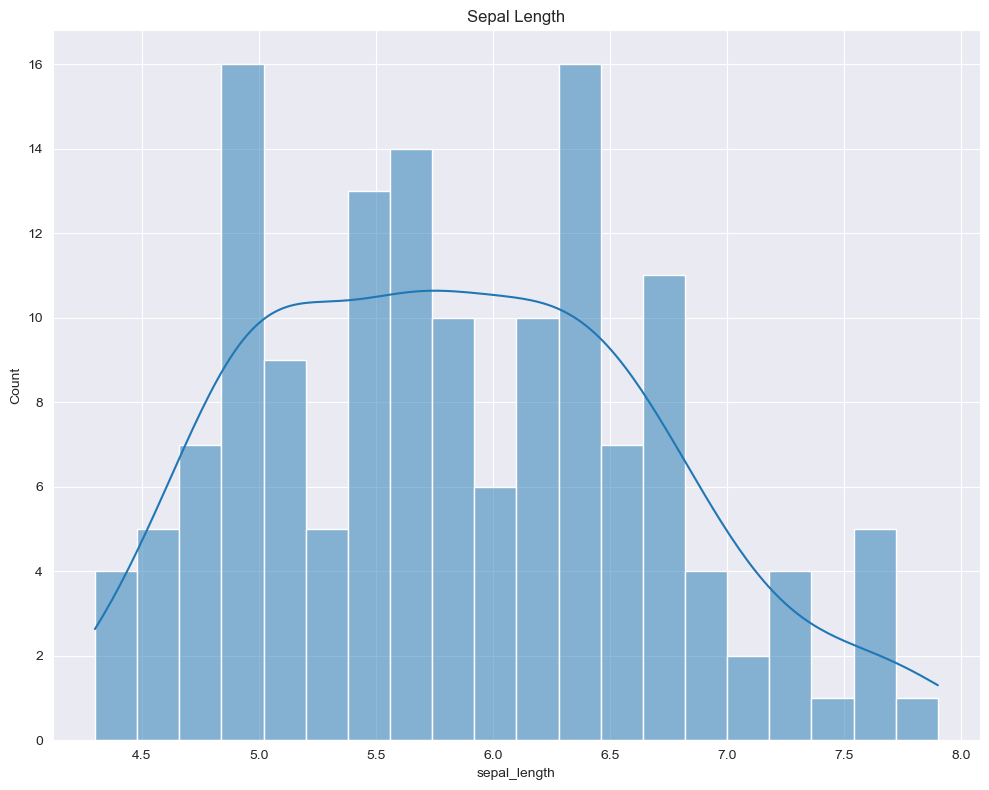

In [642]:
# visualize sepal_lengthusing a histogram
plt.figure(figsize=(10, 8))
sns.histplot(df["sepal_length"], bins=20, kde=True)
plt.title("Sepal Length")

Text(0.5, 1.0, 'StandardScaler')

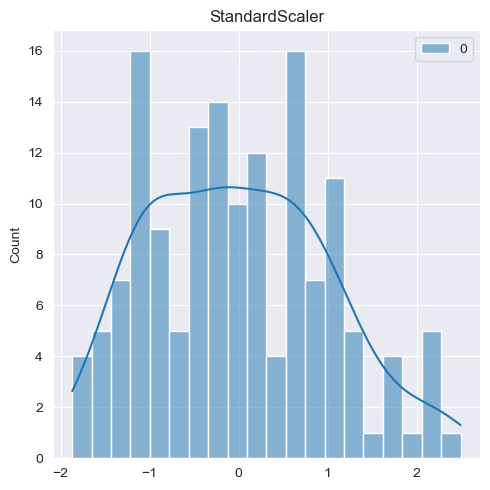

In [644]:
# Scale the data using StandardScaler, visualize scaled data using histogram
sns.histplot(StandardScaler().fit_transform(x), bins=20, kde=True)
plt.title("StandardScaler")

Text(0.5, 1.0, 'MinMaxScaler')

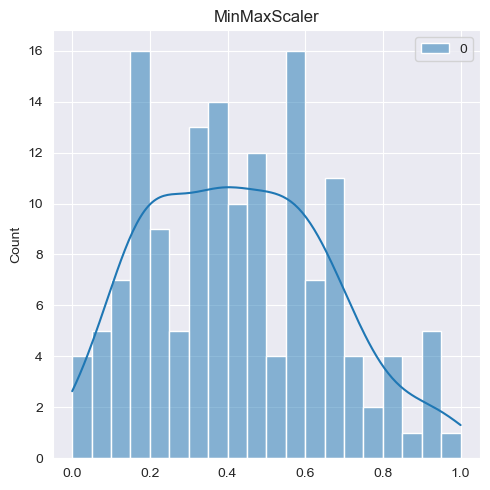

In [646]:
# Scale the data using MinMaxScaler, visualize scaled data using histogram
sns.histplot(MinMaxScaler().fit_transform(x), bins=20, kde=True)
plt.title("MinMaxScaler")

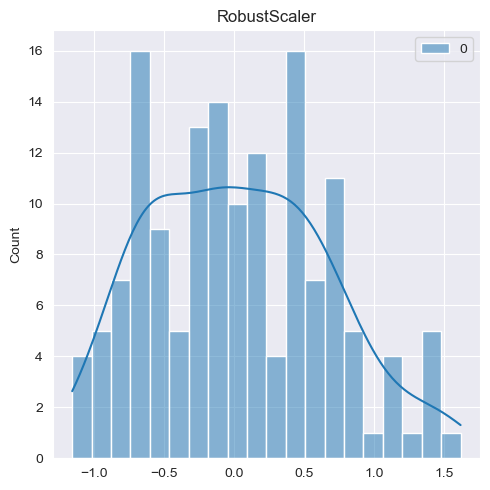

In [648]:
# Find 3rd scaler in Scikit-Learn and scale the data using it, visualize scaled data using histogram
sns.histplot(RobustScaler().fit_transform(x), bins=20, kde=True)
plt.title("RobustScaler")

plt.tight_layout()
plt.show()

**Regression Analysis**

**Simple Linear Regression**

    + One independent (x) and one dependent (y) variable
    + Use LinearRegression from the Scikit-Learn library

In [652]:
# Take Linear regression in use from Scikit-learn
from sklearn.linear_model import LinearRegression 
# import scipy.stats as stats # library for statistical measurements

In [654]:
# Load data
df = sns.load_dataset('tips')
df.head()

,total_bill,tip,sex,smoker,day,time,size
0,16.99,1.01,Female,No,Sun,Dinner,2
1,10.34,1.66,Male,No,Sun,Dinner,3
2,21.01,3.50,Male,No,Sun,Dinner,3
3,23.68,3.31,Male,No,Sun,Dinner,2
4,24.59,3.61,Female,No,Sun,Dinner,4


In [656]:
# create vectors containing the data
# x independent variable
x = df ['total_bill'].values
x

array([16.99, 10.34, 21.01, 23.68, 24.59, 25.29,  8.77, 26.88, 15.04,
       14.78, 10.27, 35.26, 15.42, 18.43, 14.83, 21.58, 10.33, 16.29,
       16.97, 20.65, 17.92, 20.29, 15.77, 39.42, 19.82, 17.81, 13.37,
       12.69, 21.7 , 19.65,  9.55, 18.35, 15.06, 20.69, 17.78, 24.06,
       16.31, 16.93, 18.69, 31.27, 16.04, 17.46, 13.94,  9.68, 30.4 ,
       18.29, 22.23, 32.4 , 28.55, 18.04, 12.54, 10.29, 34.81,  9.94,
       25.56, 19.49, 38.01, 26.41, 11.24, 48.27, 20.29, 13.81, 11.02,
       18.29, 17.59, 20.08, 16.45,  3.07, 20.23, 15.01, 12.02, 17.07,
       26.86, 25.28, 14.73, 10.51, 17.92, 27.2 , 22.76, 17.29, 19.44,
       16.66, 10.07, 32.68, 15.98, 34.83, 13.03, 18.28, 24.71, 21.16,
       28.97, 22.49,  5.75, 16.32, 22.75, 40.17, 27.28, 12.03, 21.01,
       12.46, 11.35, 15.38, 44.3 , 22.42, 20.92, 15.36, 20.49, 25.21,
       18.24, 14.31, 14.  ,  7.25, 38.07, 23.95, 25.71, 17.31, 29.93,
       10.65, 12.43, 24.08, 11.69, 13.42, 14.26, 15.95, 12.48, 29.8 ,
        8.52, 14.52,

In [658]:
x.shape

(244,)

In [660]:
# Create vector x containing the data 'total_bill' as 1-dimensional ndarray
x = df ['total_bill'].values.reshape(-1,1)
print("shape:", x.shape)
# show 10 first items of the array x
print("first 10 values of x:", x [0:10])

shape: (244, 1)
first 10 values of x: [[16.99]
 [10.34]
 [21.01]
 [23.68]
 [24.59]
 [25.29]
 [ 8.77]
 [26.88]
 [15.04]
 [14.78]]


In [662]:
# Try to show last 10 values of the array x using slicing
# Your code in below!
print("last 10 values of the x:", x [-10:])


last 10 values of the x: [[15.53]
 [10.07]
 [12.6 ]
 [32.83]
 [35.83]
 [29.03]
 [27.18]
 [22.67]
 [17.82]
 [18.78]]


In [664]:
# create vector y containing the data 'tip'
y = df ['tip'].values
# show 20 first items of the array y
y [0:20]

array([1.01, 1.66, 3.5 , 3.31, 3.61, 4.71, 2.  , 3.12, 1.96, 3.23, 1.71,
       5.  , 1.57, 3.  , 3.02, 3.92, 1.67, 3.71, 3.5 , 3.35])

In [666]:
# Create linear regression model
model = LinearRegression()

# fit the data 
model.fit(x, y)

# calculate the coefficients
slope = model.coef_[0] #do coef_ trả về 1 mảng, muốn lấy giá trị hệ số, phải truy cập phần từ [0]
intercept = model.intercept_
print(f"Slope: {slope}")
print(f"Intercept: {intercept}")

Slope: 0.10502451738435337
Intercept: 0.9202696135546731


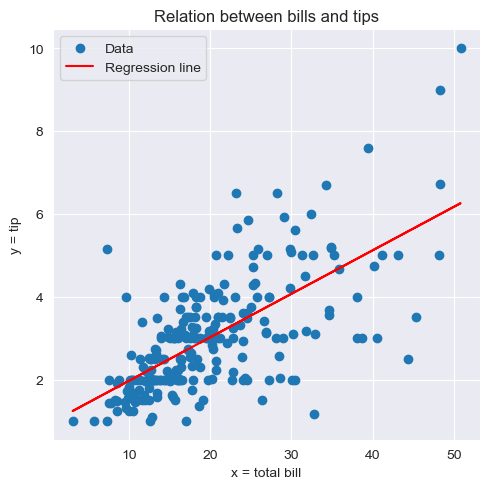

In [668]:
# Visualise the results
# show the scatter diagram for the data and the linear regression line
plt.scatter(x, y, label='Data') #vẽ biểu đồ scatter
plt.plot(x, model.predict(x), color='red', label='Regression line') 
#vẽ đường hồi quy tuyến tính dựa trên mô hình đã huấn luyện
plt.xlabel('x = total bill')
plt.ylabel('y = tip')
plt.title('Relation between bills and tips')
plt.legend()
plt.show()

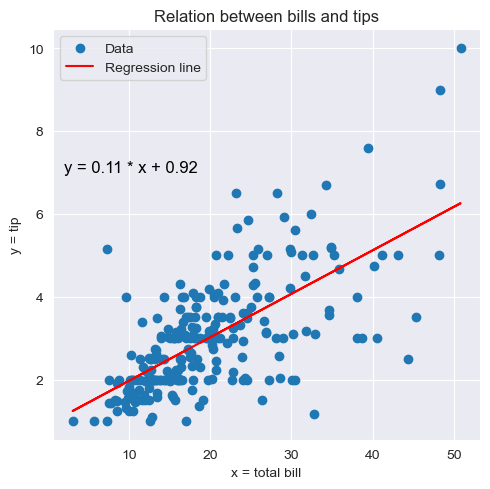

In [670]:
# Add the equation formula as a text annotation to the plot
plt.scatter(x, y, label='Data')
plt.plot(x, model.predict(x), color='red', label='Regression line')
# Add the equation formula as a text annotation to the plot
equation_text = f'y = {slope:.2f} * x + {intercept:.2f}'
plt.text(2, 7, equation_text, fontsize=12, color='black')
plt.xlabel('x = total bill')
plt.ylabel('y = tip')
plt.title('Relation between bills and tips')
plt.legend()
plt.show()

+ Note: Figure could have been created also with Seaborn lmplot
+ lmplot use orginal data from DataFrame and add the regression line

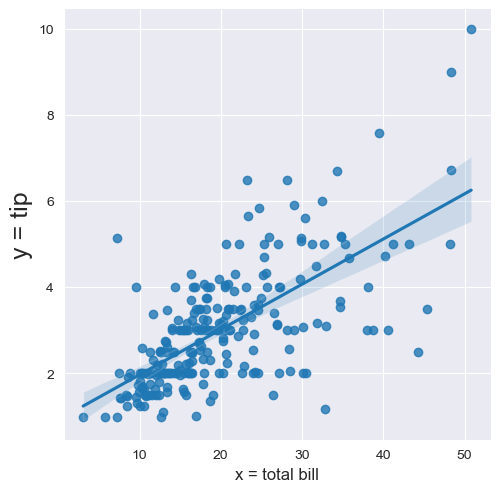

In [673]:
# Two quantitative variables, one in x and another in y
sns.lmplot(data = df, x= 'total_bill', y= 'tip') 
plt.xlabel('x = total bill', fontsize=12)
plt.ylabel('y = tip', fontsize=18)
plt.show()

In [675]:
#Intercept and coefficient can be also found using library statsmodel¶
# use statsmodel instead 
import statsmodels.api as sm
from statsmodels.formula.api import ols
model = ols('tip ~ total_bill', data=df).fit()
print (model.summary()) 

                            OLS Regression Results                            
Dep. Variable:                    tip   R-squared:                       0.457
Model:                            OLS   Adj. R-squared:                  0.454
Method:                 Least Squares   F-statistic:                     203.4
Date:                Fri, 05 Dec 2025   Prob (F-statistic):           6.69e-34
Time:                        08:10:19   Log-Likelihood:                -350.54
No. Observations:                 244   AIC:                             705.1
Df Residuals:                     242   BIC:                             712.1
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.9203      0.160      5.761      0.0

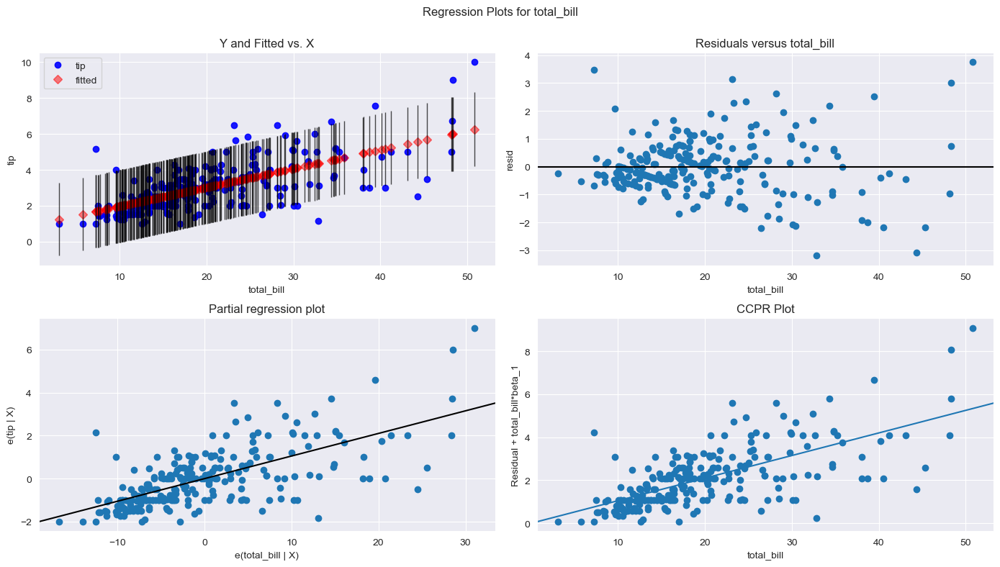

In [677]:
# Create figures using statsmodel 
fig = plt.figure(figsize=(14, 8))
fig = sm.graphics.plot_regress_exog(model,'total_bill', fig = fig)
plt.show()

**Tasks for simple linear regression**

Use Seaborn dataset for 'penguins'

+ Find simple linear reqression between bill (x) and flipper lenghts (y)
+ Create a figure with the equation
  
**Note: Remove the observations with NaN values!**

In [683]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
import numpy as np

# Load and clean data
df = sns.load_dataset("penguins").dropna(subset=["bill_length_mm", "flipper_length_mm"])
df

,species,island,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,sex
0,Adelie,Torgersen,39.1,18.7,181.0,3750.0,Male
1,Adelie,Torgersen,39.5,17.4,186.0,3800.0,Female
2,Adelie,Torgersen,40.3,18.0,195.0,3250.0,Female
4,Adelie,Torgersen,36.7,19.3,193.0,3450.0,Female
5,Adelie,Torgersen,39.3,20.6,190.0,3650.0,Male
...,...,...,...,...,...,...,...
338,Gentoo,Biscoe,47.2,13.7,214.0,4925.0,Female
340,Gentoo,Biscoe,46.8,14.3,215.0,4850.0,Female
341,Gentoo,Biscoe,50.4,15.7,222.0,5750.0,Male
342,Gentoo,Biscoe,45.2,14.8,212.0,5200.0,Female


**scikit‑learn expects:**
+ X (features) as a 2D array of shape (n_samples, n_features).
+ y (target) as a 1D array of shape (n_samples,) for regression/classification.

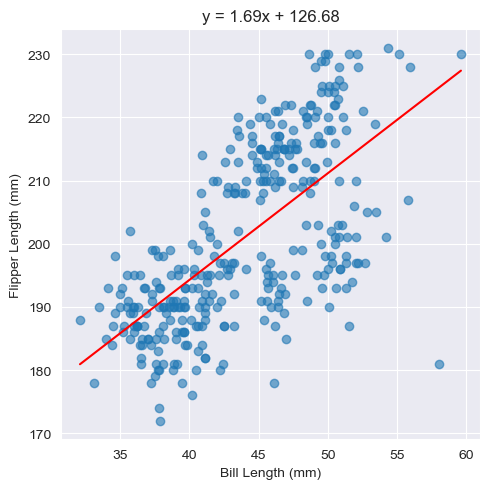

In [685]:
#Find simple linear reqression between bill (x) and flipper lenghts (y)

# X and y
X = df["bill_length_mm"].values.reshape(-1, 1) -> #(n_samples, 1)
#-1: infer the number of rows (n_samples)
#1: one feature (a single column)

y = df["flipper_length_mm"].values -> #(n_samples,) #no reshape needed

# Fit model & # Regression line
model = LinearRegression().fit(X, y)

x_range = np.linspace(X.min(), X.max(), 100).reshape(-1, 1)
#generates 100 evenly spaced x-values from the smallest to the largest value in your data.
#→ This gives you a smooth horizontal range to draw the regression line.

y_pred = model.predict(x_range)
#Predict the y-values for that smooth x-range → this becomes the straight red line in your plot.

# Create a figure with the equation
plt.scatter(X, y, alpha=0.6)
plt.plot(x_range, y_pred, color="red")
plt.title(f"y = {model.coef_[0]:.2f}x + {model.intercept_:.2f}")
plt.xlabel("Bill Length (mm)")
plt.ylabel("Flipper Length (mm)")
plt.show()

**Multiple linear regression**
+ More than one independent variable (X) and one dependent (y) variable
+ Use LinearRegression from the Scikit-Learn library

In [689]:
# Load data
df = sns.load_dataset('diamonds')
df.head()

,carat,cut,color,clarity,depth,table,price,x,y,z
0,0.23,Ideal,E,SI2,61.5,55.0,326,3.95,3.98,2.43
1,0.21,Premium,E,SI1,59.8,61.0,326,3.89,3.84,2.31
2,0.23,Good,E,VS1,56.9,65.0,327,4.05,4.07,2.31
3,0.29,Premium,I,VS2,62.4,58.0,334,4.20,4.23,2.63
4,0.31,Good,J,SI2,63.3,58.0,335,4.34,4.35,2.75


In [691]:
df.shape

(53940, 10)

In [693]:
# reduce size as handling of data takes too much memory
df1 = df.loc [0:10000, 'carat':'price']  
df1.shape

(10001, 7)

In [695]:
df1.columns

Index(['carat', 'cut', 'color', 'clarity', 'depth', 'table', 'price'], dtype='object')

In [701]:
# use carat and dept as independent variables store them in matrix X
# use price as dependent variable y
X = df1[['carat', 'depth']]
y = df1['price']

In [703]:
model = LinearRegression()
model.fit(X, y)

coefficients = model.coef_
intercept = model.intercept_

print("Coefficients:", coefficients)
print("Intercept:", intercept)

Coefficients: [4143.69408078  -25.76813825]
Intercept: 1497.2554320803404


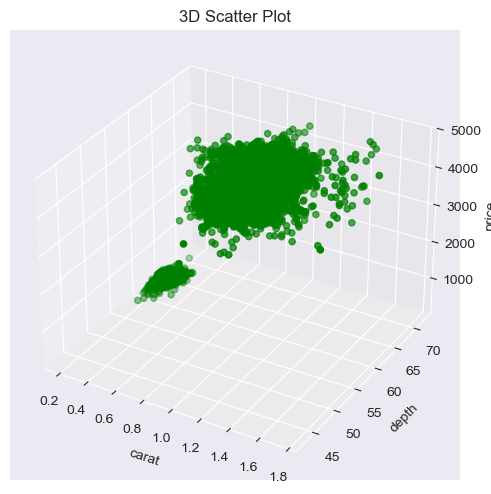

In [705]:
# Visualise the results in 3D
from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
x1 = df1['carat']
x2 = df1['depth']
y = df1['price']
ax.scatter(x1, x2, y, c='green', marker='o')
ax.set_xlabel('carat')
ax.set_ylabel('depth')
ax.set_zlabel('price')
plt.title('3D Scatter Plot')
plt.show()

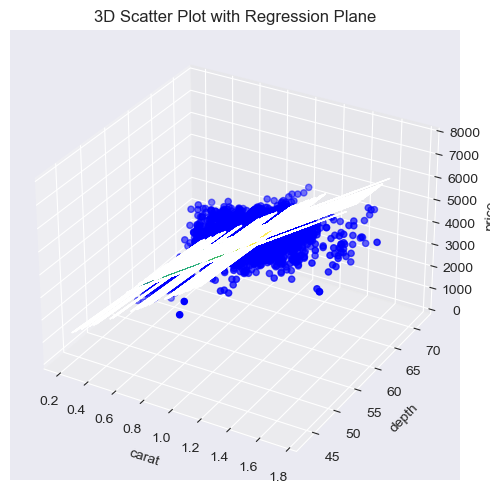

In [711]:
# Add the regression plane in the figure
# Extract the coefficients
coef_X1, coef_X2 = model.coef_
intercept = model.intercept_
# create the figure
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
x1 = df1['carat']
x2 = df1['depth']
y = df1['price']
# Create a meshgrid for the plane
x1_plane, x2_plane = np.meshgrid(x1, x2)
y_plane = intercept + coef_X1 * x1_plane + coef_X2 * x2_plane
ax.scatter(x1, x2, y, c='blue', marker='o', label='Data Points')
# plot the regression plane
ax.plot_surface(x1_plane, x2_plane, y_plane, alpha=0.5, 
                cmap='viridis', label='Regression Plane')
ax.set_xlabel('carat')
ax.set_ylabel('depth')
ax.set_zlabel('price')
plt.title('3D Scatter Plot with Regression Plane')
plt.show()

**Tasks for multiple linear regression**

Use Seaborn dataset for any data for 'planets'

+ Find multiple linear reqression between two independent data (mass, distance) and dependent data (orbital_period)
+ Note: remove possible rows with null-values before you run regression analysis!
+ Create a 3D figure that shows also regression pane
  
Note: You may also use other datasets!

In [715]:
# Load data
df = sns.load_dataset('planets').dropna(subset=["orbital_period", "mass", "distance"])
df.head()

,method,number,orbital_period,mass,distance,year
0,Radial Velocity,1,269.300,7.10,77.40,2006
1,Radial Velocity,1,874.774,2.21,56.95,2008
2,Radial Velocity,1,763.000,2.60,19.84,2011
3,Radial Velocity,1,326.030,19.40,110.62,2007
4,Radial Velocity,1,516.220,10.50,119.47,2009


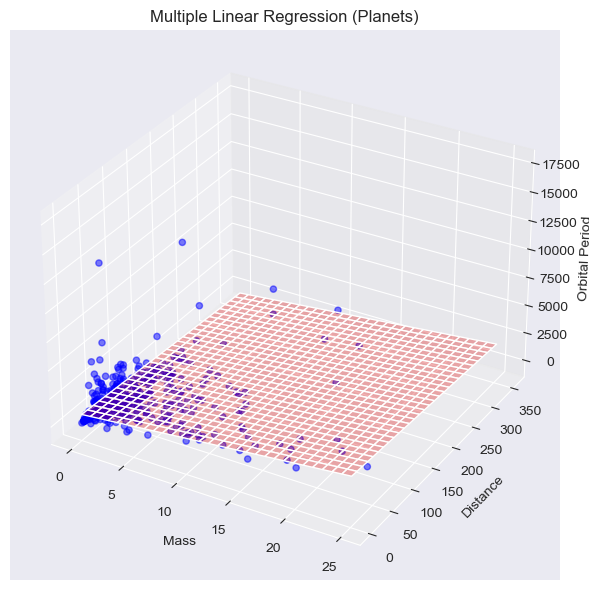

In [717]:
#Find multiple linear reqression between two independent data (mass, distance) and dependent data (orbital_period)
# Features and target
X = df[["mass", "distance"]]
y = df["orbital_period"]

# Fit model
model = LinearRegression().fit(X, y)

# Prepare grid for regression plane
m_range = np.linspace(X["mass"].min(), X["mass"].max(), 30)
d_range = np.linspace(X["distance"].min(), X["distance"].max(), 30)
M, D = np.meshgrid(m_range, d_range)
Y_pred = model.intercept_ + model.coef_[0]*M + model.coef_[1]*D

# Plot 3D scatter + regression plane
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection="3d")
ax.scatter(X["mass"], X["distance"], y, color="blue", alpha=0.5)
ax.plot_surface(M, D, Y_pred, color="red", alpha=0.3)

ax.set_xlabel("Mass")
ax.set_ylabel("Distance")
ax.set_zlabel("Orbital Period")
plt.title("Multiple Linear Regression (Planets)")
plt.show()


**Using Pandas to join and merge functions**

+ When joining two dataframes, we need to make a difference between the left and right dataframe

In [720]:
# Left DataFrame
df1 = pd.DataFrame({
    'name': ['Dolly', 'Jaws', 'Thunder', 'Kitty', 'Cujo'],
    'species': ['sheep', 'shark', 'horse', 'cat', 'dog']
}, index = [1, 2, 3, 4, 5])

# Right DataFrame
df2 = pd.DataFrame({
    'offspring': ['pup', 'foal', 'kitten', 'pup', 'joey']
}, index = [2, 3, 4, 5, 6])

print(df1)
print(df2)

      name species
1    Dolly   sheep
2     Jaws   shark
3  Thunder   horse
4    Kitty     cat
5     Cujo     dog
  offspring
2       pup
3      foal
4    kitten
5       pup
6      joey


In [722]:
# Left join (default), it is done on index

df1.join(df2)

,name,species,offspring
1,Dolly,sheep,NaN
2,Jaws,shark,pup
3,Thunder,horse,foal
4,Kitty,cat,kitten
5,Cujo,dog,pup


In [724]:
# Right join
df1.join(df2, how = 'right')


,name,species,offspring
2,Jaws,shark,pup
3,Thunder,horse,foal
4,Kitty,cat,kitten
5,Cujo,dog,pup
6,NaN,NaN,joey


In [726]:
# Innder join
df1.join(df2, how = 'inner')

,name,species,offspring
2,Jaws,shark,pup
3,Thunder,horse,foal
4,Kitty,cat,kitten
5,Cujo,dog,pup


In [728]:
# Outer join (on index)
#### Outer join keeps all rows and fills missing values with NaN
df1.join(df2, how = 'outer')

,name,species,offspring
1,Dolly,sheep,NaN
2,Jaws,shark,pup
3,Thunder,horse,foal
4,Kitty,cat,kitten
5,Cujo,dog,pup
6,NaN,NaN,joey


In [ ]:
# Left DataFrame
df3 = pd.DataFrame({
    'id': [1, 2, 3, 4, 5],
    'name': ['Dolly', 'Jaws', 'Thunder', 'Kitty', 'Cujo'],
    'species': ['sheep', 'shark', 'horse', 'cat', 'dog']
})

# Right DataFrame
df4 = pd.DataFrame({
    'id': [2, 3, 4, 5, 6],
    'offspring': ['pup', 'foal', 'kitten', 'pup', 'joey']
})

print(df1)
print(df2)

**Khi nào dùng merge()?**
+ Khi khóa là cột (không phải index).
+ Khi cần nhiều khóa hoặc cần điều khiển chi tiết kiểu join.

**Khi nào dùng join()?**
+ Khi khóa đã nằm ở index (cả hai phía), hoặc bạn muốn ghép nhanh cột từ DF khác theo index.
+ Khi ghép nhiều DataFrame theo cùng index (có thể truyền list).

In [732]:
# Left DataFrame
df3 = pd.DataFrame({
    'id': [1, 2, 3, 4, 5],
    'name': ['Dolly', 'Jaws', 'Thunder', 'Kitty', 'Cujo'],
    'species': ['sheep', 'shark', 'horse', 'cat', 'dog']
})


# Right DataFrame
df4 = pd.DataFrame({
    'id': [2, 3, 4, 5, 6],
    'offspring': ['pup', 'foal', 'kitten', 'pup', 'joey']
})

print(df1)
print(df2)

      name species
1    Dolly   sheep
2     Jaws   shark
3  Thunder   horse
4    Kitty     cat
5     Cujo     dog
  offspring
2       pup
3      foal
4    kitten
5       pup
6      joey


In [734]:
# In merge, inner join is default.

pd.merge(df3, df4, on = 'id')

,id,name,species,offspring
0,2,Jaws,shark,pup
1,3,Thunder,horse,foal
2,4,Kitty,cat,kitten
3,5,Cujo,dog,pup


In [736]:
# Left Join
# Keeps all the rows from the left DataFrame, matching from the right where possible.

pd.merge(df3, df4, on = 'id', how = 'left')

,id,name,species,offspring
0,1,Dolly,sheep,NaN
1,2,Jaws,shark,pup
2,3,Thunder,horse,foal
3,4,Kitty,cat,kitten
4,5,Cujo,dog,pup


In [738]:
# Right Join
# Keeps all the rows from the right DataFrame.

pd.merge(df3, df4, on = 'id', how = 'right')

,id,name,species,offspring
0,2,Jaws,shark,pup
1,3,Thunder,horse,foal
2,4,Kitty,cat,kitten
3,5,Cujo,dog,pup
4,6,NaN,NaN,joey


In [740]:
# Outer Join
# Keeps all the rows from both, filling in NaN where there’s no match.

pd.merge(df3, df4, on = 'id', how = 'outer')

,id,name,species,offspring
0,1,Dolly,sheep,NaN
1,2,Jaws,shark,pup
2,3,Thunder,horse,foal
3,4,Kitty,cat,kitten
4,5,Cujo,dog,pup
5,6,NaN,NaN,joey


In [747]:
# Left data frame
df1 = pd.DataFrame({
    'planet': ['Mercury', 'Venus', 'Earth', 'Mars', 'Jupiter', 'Saturn', 'Uranus', 'Neptune'],
    'type': ['Terrestrial', 'Terrestrial', 'Terrestrial', 'Terrestrial', 'Gas Giant', 'Gas Giant', 'Ice Giant', 'Ice Giant']
})

# Right data frame (do not fix the number of moons quite yet).
df2 = pd.DataFrame({
    'planet': ['Mercury', 'Venus', 'Mars', 'Jupiter', 'Saturn', 'Uranus', 'Neptune'],
    'distance_from_earth_million_km': [77, 41, 78, 628, 1275, 2720, 4350],
    'moons': [0, 100, 42, 220, 1045, 15, 'NaN']
})

print(df1)
print(df2)

    planet         type
0  Mercury  Terrestrial
1    Venus  Terrestrial
2    Earth  Terrestrial
3     Mars  Terrestrial
4  Jupiter    Gas Giant
5   Saturn    Gas Giant
6   Uranus    Ice Giant
7  Neptune    Ice Giant
    planet  distance_from_earth_million_km moons
0  Mercury                              77     0
1    Venus                              41   100
2     Mars                              78    42
3  Jupiter                             628   220
4   Saturn                            1275  1045
5   Uranus                            2720    15
6  Neptune                            4350   NaN


**Merge df1 and df2 (using merge) so that all rows from both data frames are included, save the merged dataframe into df3.**

Notice that in merge the planets get sorted alphabetically

In [745]:
# your code here
df3 = pd.merge(df1, df2, on='planet', how='outer')
print(df3)

    planet         type  distance_from_earth_million_km moons
0    Earth  Terrestrial                             NaN   NaN
1  Jupiter    Gas Giant                           628.0   220
2     Mars  Terrestrial                            78.0    42
3  Mercury  Terrestrial                            77.0     0
4  Neptune    Ice Giant                          4350.0   NaN
5   Saturn    Gas Giant                          1275.0  1045
6   Uranus    Ice Giant                          2720.0    15
7    Venus  Terrestrial                            41.0   100


In [749]:
#Change the distance_from_earth_million_km to distance

df3 = df3.rename(columns={'distance_from_earth_million_km': 'distance'})
print(df3)


    planet         type  distance moons
0    Earth  Terrestrial       NaN   NaN
1  Jupiter    Gas Giant     628.0   220
2     Mars  Terrestrial      78.0    42
3  Mercury  Terrestrial      77.0     0
4  Neptune    Ice Giant    4350.0   NaN
5   Saturn    Gas Giant    1275.0  1045
6   Uranus    Ice Giant    2720.0    15
7    Venus  Terrestrial      41.0   100


**Let's say that there is a blunder in the data and after merging the dataframe you notice that the number of moons is totally wrong. Fix them into the merged dataframe. Correct numbers of moons is found here: https://spaceplace.nasa.gov/how-many-moons/en/**

In [752]:
# Correct moon counts based on the NASA link
correct_moons = {
    'Mercury': 0,
    'Venus': 0,
    'Earth': 1,
    'Mars': 2,
    'Jupiter': 95,
    'Saturn': 274,
    'Uranus': 28,
    'Neptune': 16
}

# Overwrite the 'moons' column with the correct values
df3['moons'] = df3['planet'].map(correct_moons)

print("Dataframe with correct moon counts:")
print(df3)

Dataframe with correct moon counts:
    planet         type  distance  moons
0    Earth  Terrestrial       NaN      1
1  Jupiter    Gas Giant     628.0     95
2     Mars  Terrestrial      78.0      2
3  Mercury  Terrestrial      77.0      0
4  Neptune    Ice Giant    4350.0     16
5   Saturn    Gas Giant    1275.0    274
6   Uranus    Ice Giant    2720.0     28
7    Venus  Terrestrial      41.0      0


In [754]:
#Change NaN into 0 (or 0.0)

# your code here
df3['moons'] = df3['moons'].fillna(0).astype(int)
#fillna dùng được cho cả kiếu số lẫn chuỗi

print("Dataframe after filling NaN (if any) and changing type:")
print(df3)
print(f"\nData types:\n{df3.dtypes}")

Dataframe after filling NaN (if any) and changing type:
    planet         type  distance  moons
0    Earth  Terrestrial       NaN      1
1  Jupiter    Gas Giant     628.0     95
2     Mars  Terrestrial      78.0      2
3  Mercury  Terrestrial      77.0      0
4  Neptune    Ice Giant    4350.0     16
5   Saturn    Gas Giant    1275.0    274
6   Uranus    Ice Giant    2720.0     28
7    Venus  Terrestrial      41.0      0

Data types:
planet       object
type         object
distance    float64
moons         int32
dtype: object


**Add a column named moon-% and count the percentage of moons each planet has (moons of the planet / total number of moons) * 100%.**

Show df3

In [757]:
# your code here
# Calculate the total number of moons
total_moons = df3['moons'].sum()

# Create the 'moon-%' column
df3['moon-%'] = (df3['moons'] / total_moons) * 100

# Show df3
print(f"Total moons in solar system (in this data): {total_moons}")
print("\nFinal Dataframe with 'moon-%' column:")
print(df3)

Total moons in solar system (in this data): 416

Final Dataframe with 'moon-%' column:
    planet         type  distance  moons     moon-%
0    Earth  Terrestrial       NaN      1   0.240385
1  Jupiter    Gas Giant     628.0     95  22.836538
2     Mars  Terrestrial      78.0      2   0.480769
3  Mercury  Terrestrial      77.0      0   0.000000
4  Neptune    Ice Giant    4350.0     16   3.846154
5   Saturn    Gas Giant    1275.0    274  65.865385
6   Uranus    Ice Giant    2720.0     28   6.730769
7    Venus  Terrestrial      41.0      0   0.000000


**Create a pie chart (use matplotlib's .pie -function) from the moons column**

Use autopct -parameter so that the pie chart includes the percentage automatically

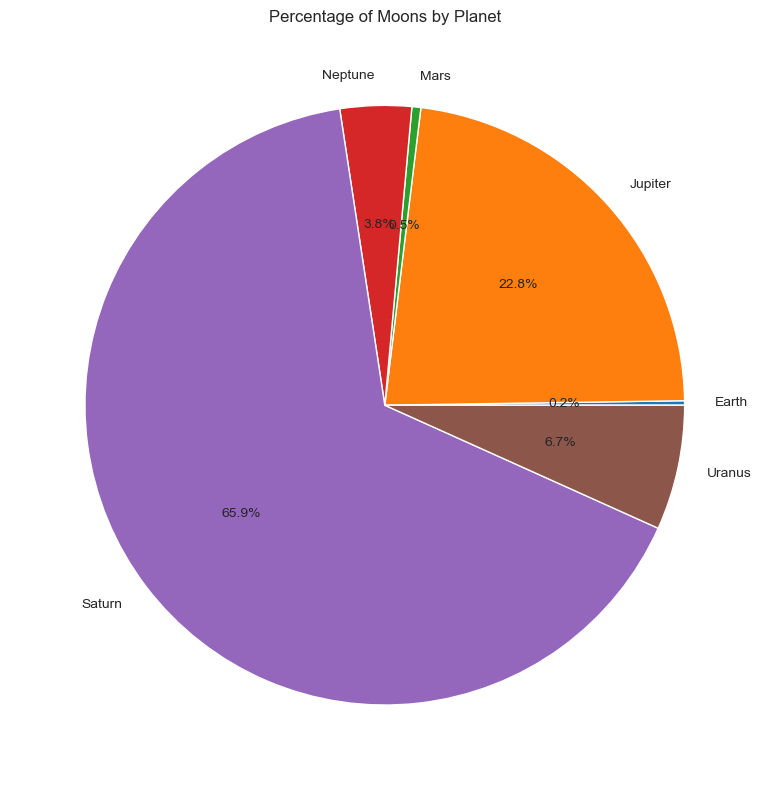

In [760]:
# your code here

# Filter out planets with 0 moons so they don't clutter the pie chart
plot_data = df3[df3['moons'] > 0]

# Create the pie chart
plt.figure(figsize=(8, 8))
plt.pie(
    plot_data['moons'],
    labels=plot_data['planet'],
    autopct='%1.1f%%'
)
plt.title('Percentage of Moons by Planet')
plt.show()

## Cross-tabulation with Pandas
- https://pandas.pydata.org/docs/reference/api/pandas.crosstab.html

In [765]:
df = sns.load_dataset('taxis')
df.head()

,pickup,dropoff,passengers,distance,fare,tip,tolls,total,color,payment,pickup_zone,dropoff_zone,pickup_borough,dropoff_borough
0,2019-03-23 20:21:09,2019-03-23 20:27:24,1,1.60,7.0,2.15,0.0,12.95,yellow,credit card,Lenox Hill West,UN/Turtle Bay South,Manhattan,Manhattan
1,2019-03-04 16:11:55,2019-03-04 16:19:00,1,0.79,5.0,0.00,0.0,9.30,yellow,cash,Upper West Side South,Upper West Side South,Manhattan,Manhattan
2,2019-03-27 17:53:01,2019-03-27 18:00:25,1,1.37,7.5,2.36,0.0,14.16,yellow,credit card,Alphabet City,West Village,Manhattan,Manhattan
3,2019-03-10 01:23:59,2019-03-10 01:49:51,1,7.70,27.0,6.15,0.0,36.95,yellow,credit card,Hudson Sq,Yorkville West,Manhattan,Manhattan
4,2019-03-30 13:27:42,2019-03-30 13:37:14,3,2.16,9.0,1.10,0.0,13.40,yellow,credit card,Midtown East,Yorkville West,Manhattan,Manhattan


In [ ]:
# Default
# pandas.crosstab(index, columns, values=None, rownames=None, colnames=None,
#                aggfunc=None, margins=False, margins_name='All',
#                dropna=True, normalize=False)

In [767]:
# Cross-tabulatin table with orginal variable names
pd.crosstab(df['pickup_borough'],df['payment'],
            margins=True, margins_name="Total") 
#margins = True, thêm hàng & cột tính tổng ở ngoài cùng và dưới cùng
#normalize = True, chuẩn hóa trên toàn bộ bảng, tất cả các giá trị của bảng sẽ được chia cho tổng của tất cả các giá trị
#sau normalize, các ô trong bảng sẽ được cộng lại bằng 1. 

payment,cash,credit card,Total
pickup_borough,,,
Bronx,25,74,99
Brooklyn,119,261,380
Manhattan,1397,3839,5236
Queens,266,383,649
Total,1807,4557,6364


In [769]:
# remove rows with null values
df = df.dropna()
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 6341 entries, 0 to 6432
Data columns (total 14 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   pickup           6341 non-null   datetime64[ns]
 1   dropoff          6341 non-null   datetime64[ns]
 2   passengers       6341 non-null   int64         
 3   distance         6341 non-null   float64       
 4   fare             6341 non-null   float64       
 5   tip              6341 non-null   float64       
 6   tolls            6341 non-null   float64       
 7   total            6341 non-null   float64       
 8   color            6341 non-null   object        
 9   payment          6341 non-null   object        
 10  pickup_zone      6341 non-null   object        
 11  dropoff_zone     6341 non-null   object        
 12  pickup_borough   6341 non-null   object        
 13  dropoff_borough  6341 non-null   object        
dtypes: datetime64[ns](2), float64(5), int64(1), o

In [771]:
# Show values as fractions
# normalize based on 'index', when total per row = 1.0
# option is to normalize per 'columns'
pd.crosstab(df['pickup_borough'],df['payment'],
            rownames =['Pickup place'], colnames = ['Payment method'],
            normalize = 'index', # normalize based on 'index', when total per row = 1.0
            margins=True, margins_name="Total")


Payment method,cash,credit card
Pickup place,,
Bronx,0.252525,0.747475
Brooklyn,0.312169,0.687831
Manhattan,0.266743,0.733257
Queens,0.404389,0.595611
Total,0.283078,0.716922


In [773]:
# Show values as % by multiplying result with 100
pd.crosstab(df['pickup_borough'],df['payment'],
            rownames =['Pickup place'], colnames = ['Payment method'],
            normalize = 'index',
            margins=True, margins_name="Total")*100

Payment method,cash,credit card
Pickup place,,
Bronx,25.252525,74.747475
Brooklyn,31.216931,68.783069
Manhattan,26.674321,73.325679
Queens,40.438871,59.561129
Total,28.307838,71.692162


In [775]:
# Use more variables in cross-tabulation
pd.crosstab([df['pickup_borough'], df['payment']],df['dropoff_borough'],
            rownames=['Pickup place', 'Payment method'], colnames=['Dropoff place'],
            margins=True, margins_name="Total")

Dropoff place                Bronx  Brooklyn  Manhattan  Queens  \
Pickup place Payment method                                       
Bronx        cash               21         0          4       0   
             credit card        45         4         21       4   
Brooklyn     cash                0       104         11       3   
             credit card         5       176         56      23   
Manhattan    cash               27        35       1298      34   
             credit card        27       116       3559     128   
Queens       cash                4        14         47     193   
             credit card         7        48        176     149   
Total                          136       497       5172     534   

Dropoff place                Staten Island  Total  
Pickup place Payment method                        
Bronx        cash                        0     25  
             credit card                 0     74  
Brooklyn     cash                        0    118  
             credit card                 0    260  
Manhattan    cash                        0   1394  
             credit card                 2   3832  
Queens       cash                        0    258  
             credit card                 0    380  
Total                                    2   6341

### Cross-tabulation using Pivot table
https://pandas.pydata.org/docs/reference/api/pandas.pivot_table.html

In [ ]:
# default
# pandas.pivot_table(data, values=None, index=None, columns=None,
#                   aggfunc='mean', fill_value=None, margins=False,
#                   dropna=True, margins_name='All', observed=<no_default>, sort=True)


In [778]:
# Show pivot table for variables with default (i.e. aggfunc = 'mean')
# Parameter "values" define
pd.pivot_table(df, values='passengers',
               index=['pickup_borough'])

,passengers
pickup_borough,
Bronx,1.191919
Brooklyn,1.314815
Manhattan,1.569269
Queens,1.528213


In [780]:
# use aggfunc "sum" to get frequency
pd.pivot_table(df, values='passengers',
               index=['pickup_borough'],
               aggfunc="sum")

,passengers
pickup_borough,
Bronx,118
Brooklyn,497
Manhattan,8201
Queens,975


In [782]:
#  One variable in row and another in column
pd.pivot_table(df, values='passengers',
               index=['pickup_borough'],
               columns=['dropoff_borough'],
               aggfunc="sum")

dropoff_borough,Bronx,Brooklyn,Manhattan,Queens,Staten Island
pickup_borough,,,,,
Bronx,84.0,4.0,26.0,4.0,NaN
Brooklyn,7.0,354.0,101.0,35.0,NaN
Manhattan,70.0,223.0,7634.0,272.0,2.0
Queens,15.0,106.0,348.0,506.0,NaN


In [784]:
# fill NaN values with 0
#  One variable in row and another in column
pd.pivot_table(df, values='passengers',
               index=['pickup_borough'],
               columns=['dropoff_borough'],
               fill_value = 0,
               aggfunc="sum")

dropoff_borough,Bronx,Brooklyn,Manhattan,Queens,Staten Island
pickup_borough,,,,,
Bronx,84,4,26,4,0
Brooklyn,7,354,101,35,0
Manhattan,70,223,7634,272,2
Queens,15,106,348,506,0


In [786]:
# present several aggfunctions is result
df.pivot_table(values='passengers', index=['pickup_borough', 'dropoff_borough'],
                   aggfunc=['min', 'median', 'max'])

min     median        max
                               passengers passengers passengers
pickup_borough dropoff_borough                                 
Bronx          Bronx                    1        1.0          5
               Brooklyn                 1        1.0          1
               Manhattan                0        1.0          2
               Queens                   1        1.0          1
Brooklyn       Bronx                    1        1.0          3
               Brooklyn                 0        1.0          6
               Manhattan                1        1.0          6
               Queens                   1        1.0          6
Manhattan      Bronx                    1        1.0          5
               Brooklyn                 0        1.0          6
               Manhattan                0        1.0          6
               Queens                   0        1.0          6
               Staten Island            1        1.0          1
Queens         Bronx                    1        1.0          5
               Brooklyn                 0        1.0          6
               Manhattan                0        1.0          6
               Queens                   0        1.0          6

In [788]:
# use same precision for all data (no decimals)
# use .style.format(precision=0)
df.pivot_table(values='passengers', index=['pickup_borough', 'dropoff_borough'],
                   aggfunc=['min', 'median', 'max']).style.format(precision=0)

In [790]:
# Highlight maximum and minimum values
df.pivot_table(values='passengers', index=['pickup_borough', 'dropoff_borough'],
                   aggfunc=['min', 'median', 'max']).style.format(precision=0)\
                    .highlight_max(color='lightgreen', axis=0)\
                    .highlight_min(color='yellow', axis=0)

**Frequency and Percentage distributions in table**
+ use crosstab() to calculate values
+ https://pandas.pydata.org/docs/reference/api/pandas.crosstab.html


In [793]:
# Create DataFrame to include the data
pd.crosstab(df['pickup_borough'], 'Freq')

col_0,Freq
pickup_borough,
Bronx,99
Brooklyn,378
Manhattan,5226
Queens,638


In [795]:
# Modify row and column names
pd.crosstab(df['pickup_borough'], 'Freq',
            rownames =['Pickup place'], colnames = [''])

,Freq
Pickup place,
Bronx,99
Brooklyn,378
Manhattan,5226
Queens,638


In [797]:
# Store the result in new DataFrame for formatting
df1 = pd.crosstab(df['pickup_borough'], 'Freq',
            rownames =['Pickup place'], colnames = [''])
df1

,Freq
Pickup place,
Bronx,99
Brooklyn,378
Manhattan,5226
Queens,638


In [799]:
# count sum and values for percentages
n = df1['Freq'].sum() # count total sum
df1['%'] = df1['Freq']/n*100 # Count % value and add new column
df1

,Freq,%
Pickup place,,
Bronx,99,1.561268
Brooklyn,378,5.961205
Manhattan,5226,82.416023
Queens,638,10.061504


In [801]:
# Create format for data
format = {'lkm':'{:.0f}', '%':'{:.1f} %'}
# present table using the format
df1.style.format(format)

,Freq,%
Pickup place,,
Bronx,99,1.6 %
Brooklyn,378,6.0 %
Manhattan,5226,82.4 %
Queens,638,10.1 %


In [803]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

#Load penguins dataset
df = sns.load_dataset('penguins')
df.head(10)

,species,island,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,sex
0,Adelie,Torgersen,39.1,18.7,181.0,3750.0,Male
1,Adelie,Torgersen,39.5,17.4,186.0,3800.0,Female
2,Adelie,Torgersen,40.3,18.0,195.0,3250.0,Female
3,Adelie,Torgersen,NaN,NaN,NaN,NaN,NaN
4,Adelie,Torgersen,36.7,19.3,193.0,3450.0,Female
5,Adelie,Torgersen,39.3,20.6,190.0,3650.0,Male
6,Adelie,Torgersen,38.9,17.8,181.0,3625.0,Female
7,Adelie,Torgersen,39.2,19.6,195.0,4675.0,Male
8,Adelie,Torgersen,34.1,18.1,193.0,3475.0,NaN
9,Adelie,Torgersen,42.0,20.2,190.0,4250.0,NaN


In [805]:
#table contains frequencies and % of one variable
freq = df['island'].value_counts()

percentage = df['island'].value_counts(normalize=True) * 100

island_table = pd.DataFrame({
    'Frequency': freq,
    'Percentage': percentage.round(2)
})

print(island_table)


           Frequency  Percentage
island                          
Biscoe           168       48.84
Dream            124       36.05
Torgersen         52       15.12


In [807]:
# Create the cross-tabulation
# This shows the counts of each species on each island
species_island_crosstab = pd.crosstab(df['species'], df['island'])

print(species_island_crosstab)

island     Biscoe  Dream  Torgersen
species                            
Adelie         44     56         52
Chinstrap       0     68          0
Gentoo        124      0          0


In [809]:
#Avg. Body Mass by 'species' and 'sex'"

body_mass_pivot = df.pivot_table(
    index = 'species',
    columns = 'sex',
    values = 'body_mass_g'
)

print(body_mass_pivot.round(2))

sex         Female     Male
species                    
Adelie     3368.84  4043.49
Chinstrap  3527.21  3938.97
Gentoo     4679.74  5484.84


In [811]:
import sqlite3
# Connect to the SQLite database (or create a new one)
conn = sqlite3.connect('Products.db')
# Create a cursor object to interact with the database
cursor = conn.cursor()
# Define the SQL statement to create a table
create_table_sql = '''
CREATE TABLE IF NOT EXISTS products (
    id INTEGER PRIMARY KEY,
    product TEXT, 
    value INTEGER);
'''
# Execute the SQL statement to create the table
cursor.execute(create_table_sql)
# Commit the changes and close the connection
conn.commit()
conn.close()

In [813]:
#Insert data to database
# Connect to the database
conn = sqlite3.connect('Products.db')
# Create a cursor object to interact with the database
cursor = conn.cursor()

# Define the SQL statement to insert data into the table
insert_data_sql = '''
INSERT INTO products (id, product, value)
VALUES (?, ?, ?)
'''

# Define the data to be inserted
data_to_insert = (1, 'Violin', 450)
# Execute the SQL statement to insert data
cursor.execute(insert_data_sql, data_to_insert)

data_to_insert = (2, 'Guitar', 500)
cursor.execute(insert_data_sql, data_to_insert)
data_to_insert = (3, 'Harp', 700)
cursor.execute(insert_data_sql, data_to_insert)
data_to_insert = (4, 'Flute', 10)
cursor.execute(insert_data_sql, data_to_insert)

# Commit the changes and close the connection
conn.commit()
conn.close()

In [815]:
#Insert multiple data to database
#Search from database

# Connect to the database
conn = sqlite3.connect('Products.db')
# Create a cursor object to interact with the database
cursor = conn.cursor()

# Define a search query (SQL SELECT statement)
search_query = "SELECT * FROM products;"

# Execute the search query with the parameter
cursor.execute(search_query)

# Fetch all matching rows
result = cursor.fetchall()

print(result)

# Define a search query based on condition
search_query = "SELECT * FROM products WHERE product = 'Violin';"
cursor.execute(search_query)
result = cursor.fetchall()
print(result)

# Define a search query based on condition
search_query = "SELECT * FROM products WHERE value > 1000;"
cursor.execute(search_query)
result = cursor.fetchall()
print(result)

# Arrange results in order DESC 
search_query = "SELECT * FROM products WHERE value > 1000 ORDER BY product DESC;"
cursor.execute(search_query)
result = cursor.fetchall()
print(result)

# Arrange results in order ASC
search_query = "SELECT * FROM products ORDER BY product ASC;"
cursor.execute(search_query)
result = cursor.fetchall()
print(result)

# Close the cursor and connection
cursor.close()
conn.close()


[(1, 'Violin', 450), (2, 'Guitar', 500), (3, 'Harp', 700), (4, 'Flute', 10)]
[(1, 'Violin', 450)]
[]
[]
[(4, 'Flute', 10), (2, 'Guitar', 500), (3, 'Harp', 700), (1, 'Violin', 450)]


In [817]:
#Update value in database
conn = sqlite3.connect('Products.db')
cursor = conn.cursor()

update_query = '''
UPDATE products 
SET product = 'Bass guitar', value = 2000
WHERE product = 'Bass';
'''

cursor.execute(update_query)
conn.commit()

# Check value
search_query = "SELECT * FROM products ORDER BY product ASC;"
cursor.execute(search_query)
result = cursor.fetchall()
print(result)

# Close the cursor and connection
cursor.close()
conn.close()

[(4, 'Flute', 10), (2, 'Guitar', 500), (3, 'Harp', 700), (1, 'Violin', 450)]


In [819]:
#Remove rows

conn = sqlite3.connect('Products.db')
cursor = conn.cursor()
# Define your delete query with the WHERE condition
delete_query = '''
DELETE FROM products
WHERE id = 5 OR id = 6 OR id=7;
'''

# Execute the delete query
cursor.execute(delete_query)
# Check value
search_query = "SELECT * FROM products ORDER BY product DESC;"
cursor.execute(search_query)
result = cursor.fetchall()
print(result)

# Close the cursor and connection
cursor.close()
conn.close()

[(1, 'Violin', 450), (3, 'Harp', 700), (2, 'Guitar', 500), (4, 'Flute', 10)]


In [821]:
#Remove table
conn = sqlite3.connect('Products.db')
cursor = conn.cursor()
# remove complete table
delete_query = '''
DROP TABLE products;
'''
cursor.execute(delete_query)
conn.commit()

**Check that the table is removed**

NOTE: You should get Error "OperationalError: no such table: products" if table is removed if you try to search from it.

In [825]:
search_query = "SELECT * FROM products;"
cursor.execute(search_query)
result = cursor.fetchall()
print(result)

# Close the cursor and connection
cursor.close()
conn.close()

OperationalError: no such table: products

In [827]:
#1. Use CSV file you find in this assigment (2021.csv)
#2. Read the data in Pandas DataFrame

import pandas as pd
import sqlite3

#Read CSV file
df = pd.read_csv("2021.csv")
df.head()

,Country name,Regional indicator,Ladder score,Standard error of ladder score,upperwhisker,lowerwhisker,Logged GDP per capita,Social support,Healthy life expectancy,Freedom to make life choices,Generosity,Perceptions of corruption,Ladder score in Dystopia,Explained by: Log GDP per capita,Explained by: Social support,Explained by: Healthy life expectancy,Explained by: Freedom to make life choices,Explained by: Generosity,Explained by: Perceptions of corruption,Dystopia + residual
0,Finland,Western Europe,7.842,0.032,7.904,7.780,10.775,0.954,72.0,0.949,-0.098,0.186,2.43,1.446,1.106,0.741,0.691,0.124,0.481,3.253
1,Denmark,Western Europe,7.620,0.035,7.687,7.552,10.933,0.954,72.7,0.946,0.030,0.179,2.43,1.502,1.108,0.763,0.686,0.208,0.485,2.868
2,Switzerland,Western Europe,7.571,0.036,7.643,7.500,11.117,0.942,74.4,0.919,0.025,0.292,2.43,1.566,1.079,0.816,0.653,0.204,0.413,2.839
3,Iceland,Western Europe,7.554,0.059,7.670,7.438,10.878,0.983,73.0,0.955,0.160,0.673,2.43,1.482,1.172,0.772,0.698,0.293,0.170,2.967
4,Netherlands,Western Europe,7.464,0.027,7.518,7.410,10.932,0.942,72.4,0.913,0.175,0.338,2.43,1.501,1.079,0.753,0.647,0.302,0.384,2.798


3. Create then SQL database 'Happy.db' and table 'happy2021' that contain following data:
   
+ id SERIAL PRIMARY KEY
+ country TEXT
+ region TEXT
+ lscore REAL
+ hlife REAL

In [831]:
conn = sqlite3.connect('Happy.db')
cursor = conn.cursor()

# Define the SQL statement to create a table
create_table_sql = '''
CREATE TABLE happy2022 (
    id SERIAL PRIMARY KEY,
    country TEXT,
    region TEXT, 
    lscore REAL, 
    hlife REAL
)
'''
# Execute the SQL statement to create the table
cursor.execute(create_table_sql)

# Commit the changes and close the connection
conn.commit()
conn.close()

4. Store data from Pandas DataFrame to the SQL table 'happy2021' following way:
+ 'Country name' to 'country'
+ 'Regional indicator' to 'region'
+ 'Ladder score' to 'lscore'
+ 'Healthy life expectancy' to 'hlife'

In [834]:
import pandas as pd
import sqlite3

df_selected = df[['Country name', 'Regional indicator', 'Ladder score', 'Healthy life expectancy']].copy()
df_selected.columns = ['country', 'region', 'lscore', 'hlife']

# Connect to database
conn = sqlite3.connect('Happy.db')

# Insert data into SQL table
df_selected.to_sql('happy2022', conn, if_exists='append', index=False)
print("Data inserted successfully!")

# Close connection
conn.close()


Data inserted successfully!


In [836]:
#Read data from the database where hlife (Healthy life expectancy) is higher than 74
#Connect to the database
conn = sqlite3.connect('Happy.db')

#Create a cursor object to interact with the databse
cursor = conn.cursor()

#Define a search query 
search_query = "SELECT * FROM happy2022 WHERE hlife > 74"

#execute the search query with the parameter
cursor.execute(search_query)

#fetch all matching rows
result = cursor.fetchall()

print(result)

[(None, 'Switzerland', 'Western Europe', 7.571, 74.4), (None, 'Spain', 'Western Europe', 6.491, 74.7), (None, 'Singapore', 'Southeast Asia', 6.377, 76.953), (None, 'Japan', 'East Asia', 5.94, 75.1), (None, 'Hong Kong S.A.R. of China', 'East Asia', 5.477, 76.82)]
